## CASE STUDY - EUR

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random as rn
from sklearn import preprocessing
from sklearn.metrics import roc_curve, auc
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import numdifftools

In [4]:
from algo_full import Algo_full 

In [5]:
file_path = 'student_all_nations.txt'

# Read the tab-separated text file into a Pandas DataFrame
df = pd.read_csv(file_path, sep=' ')
df

,CNT,school_id,student_id,grade,gender,immig,video_games,internet,mmins,tmins,...,COGFLEX,GFOFAIL,COMPETE,EUDMO,misced,cultural_possession,home_educ_resources,ESCS,iscedo,math_PISA_score
1,ALB,800115,800001,10,1,0.0,1.0,0.0,180.0,2655.0,...,0.4704,-1.8939,2.0054,0.9269,6.0,0.3342,-0.1357,-0.2154,general,432.285
2,ALB,800300,800002,10,1,0.0,0.0,NaN,90.0,NaN,...,0.6715,-0.9295,-0.6888,0.2621,2.0,-0.5390,-2.2894,-2.4454,vocational,334.361
3,ALB,800088,800003,9,0,0.0,0.0,1.0,180.0,2070.0,...,0.2165,-0.2006,-0.9792,1.3480,6.0,-1.6273,-0.4396,-0.3342,general,349.201
4,ALB,800014,800004,10,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,vocational,296.848
5,ALB,800294,800005,10,1,0.0,1.0,1.0,180.0,1350.0,...,-1.0189,0.2734,-0.8279,-0.5690,2.0,-0.5622,-0.6853,-0.5231,vocational,445.703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611998,QRT,98300553,98329092,9,1,0.0,0.0,0.0,225.0,1620.0,...,0.6715,-0.9823,0.7871,1.7411,5.0,-0.8744,0.2646,-1.0530,general,531.284
611999,QRT,98300772,98329094,9,0,0.0,0.0,1.0,270.0,1575.0,...,-0.5994,1.3423,-0.3570,-0.6723,6.0,-0.4365,1.1793,1.1280,general,645.337
612000,QRT,98300786,98329104,9,1,0.0,0.0,1.0,225.0,1350.0,...,-1.2876,0.8207,-1.5513,-0.5690,5.0,-1.4561,-0.8532,0.1110,general,444.767
612001,QRT,98300741,98329116,9,0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,6.0,-0.8431,1.1793,0.2274,general,375.957


In [6]:
pisa_score_binary = (df['math_PISA_score']<482.38).astype(int)
np.sum(pisa_score_binary==1)/len(pisa_score_binary)

0.572065123970183

In [7]:
df['math_PISA_passed']=pisa_score_binary
df

,CNT,school_id,student_id,grade,gender,immig,video_games,internet,mmins,tmins,...,GFOFAIL,COMPETE,EUDMO,misced,cultural_possession,home_educ_resources,ESCS,iscedo,math_PISA_score,math_PISA_passed
1,ALB,800115,800001,10,1,0.0,1.0,0.0,180.0,2655.0,...,-1.8939,2.0054,0.9269,6.0,0.3342,-0.1357,-0.2154,general,432.285,1
2,ALB,800300,800002,10,1,0.0,0.0,NaN,90.0,NaN,...,-0.9295,-0.6888,0.2621,2.0,-0.5390,-2.2894,-2.4454,vocational,334.361,1
3,ALB,800088,800003,9,0,0.0,0.0,1.0,180.0,2070.0,...,-0.2006,-0.9792,1.3480,6.0,-1.6273,-0.4396,-0.3342,general,349.201,1
4,ALB,800014,800004,10,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,vocational,296.848,1
5,ALB,800294,800005,10,1,0.0,1.0,1.0,180.0,1350.0,...,0.2734,-0.8279,-0.5690,2.0,-0.5622,-0.6853,-0.5231,vocational,445.703,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611998,QRT,98300553,98329092,9,1,0.0,0.0,0.0,225.0,1620.0,...,-0.9823,0.7871,1.7411,5.0,-0.8744,0.2646,-1.0530,general,531.284,0
611999,QRT,98300772,98329094,9,0,0.0,0.0,1.0,270.0,1575.0,...,1.3423,-0.3570,-0.6723,6.0,-0.4365,1.1793,1.1280,general,645.337,0
612000,QRT,98300786,98329104,9,1,0.0,0.0,1.0,225.0,1350.0,...,0.8207,-1.5513,-0.5690,5.0,-1.4561,-0.8532,0.1110,general,444.767,1
612001,QRT,98300741,98329116,9,0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,6.0,-0.8431,1.1793,0.2274,general,375.957,1


In [8]:
df.columns

Index(['CNT', 'school_id', 'student_id', 'grade', 'gender', 'immig',
       'video_games', 'internet', 'mmins', 'tmins', 'sc_DISCRIM', 'sc_BELONG',
       'sc_PERCOMP', 'sc_PERCOOP', 'TEACHSUP', 'EMOSUPS', 'COGFLEX', 'GFOFAIL',
       'COMPETE', 'EUDMO', 'misced', 'cultural_possession',
       'home_educ_resources', 'ESCS', 'iscedo', 'math_PISA_score',
       'math_PISA_passed'],
      dtype='object')

In [9]:
df = df.drop(['immig','video_games','internet'], axis=1)
df

,CNT,school_id,student_id,grade,gender,mmins,tmins,sc_DISCRIM,sc_BELONG,sc_PERCOMP,...,GFOFAIL,COMPETE,EUDMO,misced,cultural_possession,home_educ_resources,ESCS,iscedo,math_PISA_score,math_PISA_passed
1,ALB,800115,800001,10,1,180.0,2655.0,-0.4235,0.6344,1.0326,...,-1.8939,2.0054,0.9269,6.0,0.3342,-0.1357,-0.2154,general,432.285,1
2,ALB,800300,800002,10,1,90.0,NaN,0.5881,2.7249,-0.6142,...,-0.9295,-0.6888,0.2621,2.0,-0.5390,-2.2894,-2.4454,vocational,334.361,1
3,ALB,800088,800003,9,0,180.0,2070.0,0.5881,-0.9879,-0.6142,...,-0.2006,-0.9792,1.3480,6.0,-1.6273,-0.4396,-0.3342,general,349.201,1
4,ALB,800014,800004,10,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,vocational,296.848,1
5,ALB,800294,800005,10,1,180.0,1350.0,-0.6615,0.9782,0.7601,...,0.2734,-0.8279,-0.5690,2.0,-0.5622,-0.6853,-0.5231,vocational,445.703,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611998,QRT,98300553,98329092,9,1,225.0,1620.0,0.3228,0.9683,-0.0430,...,-0.9823,0.7871,1.7411,5.0,-0.8744,0.2646,-1.0530,general,531.284,0
611999,QRT,98300772,98329094,9,0,270.0,1575.0,-1.1549,-0.5635,-1.5580,...,1.3423,-0.3570,-0.6723,6.0,-0.4365,1.1793,1.1280,general,645.337,0
612000,QRT,98300786,98329104,9,1,225.0,1350.0,0.6940,-0.7386,0.2865,...,0.8207,-1.5513,-0.5690,5.0,-1.4561,-0.8532,0.1110,general,444.767,1
612001,QRT,98300741,98329116,9,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,6.0,-0.8431,1.1793,0.2274,general,375.957,1


#### Recentring the variables

In [10]:
for i in df['CNT'].unique():
    mean_cultural_possession = df['cultural_possession'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'cultural_possession'] = df.loc[df['CNT']==i,'cultural_possession']- mean_cultural_possession
    mean_home_educ_resources = df['home_educ_resources'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'home_educ_resources'] = df.loc[df['CNT']==i,'home_educ_resources'] - mean_home_educ_resources
    mean_ESCS = df['ESCS'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'ESCS'] = df.loc[df['CNT']==i,'ESCS'] - mean_ESCS
    mean_sc_BELONG = df['sc_BELONG'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'sc_BELONG'] = df.loc[df['CNT']==i,'sc_BELONG'] - mean_sc_BELONG
    mean_COMPETE = df['COMPETE'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'COMPETE'] = df.loc[df['CNT']==i,'COMPETE'] - mean_COMPETE
    mean_TEACHSUP = df['TEACHSUP'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'TEACHSUP'] = df.loc[df['CNT']==i,'TEACHSUP'] - mean_TEACHSUP
    mean_GFOFAIL = df['GFOFAIL'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'GFOFAIL'] = df.loc[df['CNT']==i,'GFOFAIL'] - mean_GFOFAIL
    mean_sc_DISCRIM = df['sc_DISCRIM'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'sc_DISCRIM'] = df.loc[df['CNT']==i,'sc_DISCRIM'] - mean_sc_DISCRIM
    mean_sc_PERCOMP = df['sc_PERCOMP'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'sc_PERCOMP'] = df.loc[df['CNT']==i,'sc_PERCOMP'] - mean_sc_PERCOMP
    mean_EMOSUPS = df['EMOSUPS'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'EMOSUPS'] = df.loc[df['CNT']==i,'EMOSUPS'] - mean_EMOSUPS
    mean_EUDMO = df['EUDMO'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'EUDMO'] = df.loc[df['CNT']==i,'EUDMO'] - mean_EUDMO
    mean_sc_PERCOOP = df['sc_PERCOOP'][df['CNT']==i].mean()
    df.loc[df['CNT']==i,'sc_PERCOOP'] = df.loc[df['CNT']==i,'sc_PERCOOP'] - mean_sc_PERCOOP
    

In [11]:
# variables in the inner model
columns_to_keep = ['sc_DISCRIM', 'sc_BELONG', 'sc_PERCOMP', 'sc_PERCOOP', 'TEACHSUP', 'EMOSUPS', 'GFOFAIL', 'COMPETE', 'EUDMO']
correlation_matrix = df[columns_to_keep].corr()
correlation_matrix.style.background_gradient(cmap='coolwarm').format("{:.2f}")

,sc_DISCRIM,sc_BELONG,sc_PERCOMP,sc_PERCOOP,TEACHSUP,EMOSUPS,GFOFAIL,COMPETE,EUDMO
sc_DISCRIM,1.00,-0.13,0.11,-0.09,-0.13,-0.13,0.05,0.03,0.01
sc_BELONG,-0.13,1.00,0.07,0.25,0.13,0.26,-0.16,0.15,0.26
sc_PERCOMP,0.11,0.07,1.00,0.22,0.06,0.18,0.09,0.22,0.14
sc_PERCOOP,-0.09,0.25,0.22,1.00,0.19,0.27,-0.01,0.14,0.22
TEACHSUP,-0.13,0.13,0.06,0.19,1.00,0.15,-0.03,0.06,0.13
EMOSUPS,-0.13,0.26,0.18,0.27,0.15,1.00,-0.02,0.17,0.28
GFOFAIL,0.05,-0.16,0.09,-0.01,-0.03,-0.02,1.00,0.10,-0.10
COMPETE,0.03,0.15,0.22,0.14,0.06,0.17,0.10,1.00,0.23
EUDMO,0.01,0.26,0.14,0.22,0.13,0.28,-0.10,0.23,1.00


##### Select the Eurpean States

In [12]:
eur = ['ESP','ITA','LTU','KAZ','SVK','POL','PRT','DNK','EST','FRA','SWE','IRL','ALB','GBR',
       'CHE','GRC','MLT','LUX','ROU','AUT','BEL','BGR','DEU','FIN','HRV','HUN','ISL','NOR',
       'ROU','SVN','SRB','UKR','MKD','MDA','MNE','CZE','KSV','BIH','LVA','BLR']

In [13]:
df_eur = df[df['CNT'].isin(eur)]
df_eur

,CNT,school_id,student_id,grade,gender,mmins,tmins,sc_DISCRIM,sc_BELONG,sc_PERCOMP,...,GFOFAIL,COMPETE,EUDMO,misced,cultural_possession,home_educ_resources,ESCS,iscedo,math_PISA_score,math_PISA_passed
1,ALB,800115,800001,10,1,180.0,2655.0,-0.317402,0.238024,0.414134,...,-1.651592,1.379511,0.349647,6.0,0.725992,0.361764,0.618693,general,432.285,1
2,ALB,800300,800002,10,1,90.0,NaN,0.694198,2.328524,-1.232666,...,-0.687192,-1.314689,-0.315153,2.0,-0.147208,-1.791936,-1.611307,vocational,334.361,1
3,ALB,800088,800003,9,0,180.0,2070.0,0.694198,-1.384276,-1.232666,...,0.041708,-1.605089,0.770747,6.0,-1.235508,0.057864,0.499893,general,349.201,1
4,ALB,800014,800004,10,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,vocational,296.848,1
5,ALB,800294,800005,10,1,180.0,1350.0,-0.555402,0.581824,0.141634,...,0.515708,-1.453789,-1.146253,2.0,-0.170408,-0.187836,0.310993,vocational,445.703,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
582007,GBR,82650039,82654542,11,1,200.0,1600.0,0.084251,-0.105029,-0.931342,...,0.182472,0.066171,-0.344444,3.0,-0.758335,-0.013754,-1.208147,general,639.010,0
582008,GBR,82650012,82654543,11,1,250.0,1650.0,-0.375149,-0.790429,-0.030642,...,0.598172,0.066171,0.486656,1.0,-1.138135,-0.956154,-1.396947,general,517.879,0
582009,GBR,82650085,82654544,11,1,200.0,1650.0,0.874451,-0.235929,0.374058,...,0.182472,0.066171,-0.087544,2.0,0.226265,-0.956154,-0.566047,general,489.147,0
582010,GBR,82650050,82654545,11,1,240.0,1500.0,0.609151,-0.632829,-0.115142,...,0.182472,-0.334129,-0.758144,6.0,2.074165,-0.756154,1.239353,general,637.874,0


In [14]:
len(df_eur['CNT'].unique())

39

In [15]:
data_1 = df_eur[['iscedo','CNT','gender','cultural_possession', 'ESCS','sc_BELONG','sc_PERCOOP', 'TEACHSUP','math_PISA_passed']]
data_1 = data_1.dropna()
data_1

,iscedo,CNT,gender,cultural_possession,ESCS,sc_BELONG,sc_PERCOOP,TEACHSUP,math_PISA_passed
1,general,ALB,1,0.725992,0.618693,0.238024,-0.040796,0.595734,1
2,vocational,ALB,1,-0.147208,-1.611307,2.328524,-1.581096,-0.445566,1
3,general,ALB,0,-1.235508,0.499893,-1.384276,-0.040796,-3.428866,1
5,vocational,ALB,1,-0.170408,0.310993,0.581824,-0.040796,-0.503466,1
6,general,ALB,1,0.026492,0.522793,-0.210076,-0.040796,0.595734,1
...,...,...,...,...,...,...,...,...,...
582007,general,GBR,1,-0.758335,-1.208147,-0.105029,-0.064649,0.174132,0
582008,general,GBR,1,-1.138135,-1.396947,-0.790429,-0.818249,-1.248068,0
582009,general,GBR,1,0.226265,-0.566047,-0.235929,0.722051,-0.467568,0
582010,general,GBR,1,2.074165,1.239353,-0.632829,-0.389849,-0.822768,0


In [16]:
data_1['y'] = data_1['math_PISA_passed']

In [17]:
len(data_1['CNT'].unique())

36

In [18]:
X_shuffled = shuffle(data_1, random_state=42)
data_train, data_test = train_test_split(X_shuffled, test_size=0.1, random_state=42)


In [22]:
data_train

,iscedo,CNT,gender,cultural_possession,ESCS,sc_BELONG,sc_PERCOOP,TEACHSUP,math_PISA_passed,y
490749,general,ESP,1,1.787453,1.057631,0.163552,0.681302,0.625043,0,0
179618,general,FIN,0,0.735856,0.680121,-0.329943,0.520332,-0.409779,0,0
143006,vocational,HRV,0,0.865276,0.814388,2.672444,0.612680,0.737312,0,0
185883,general,FRA,0,-0.396822,0.540515,0.480721,0.984944,-0.005762,0,0
52304,general,BEL,0,1.217920,0.546632,-0.784575,-0.474058,1.508467,1,1
...,...,...,...,...,...,...,...,...,...,...
426961,general,ROU,1,0.507924,0.206428,-0.954894,-1.043205,1.094969,1,1
498646,general,ESP,1,-0.198347,0.490431,0.430152,1.379302,1.237543,0,0
477556,general,ESP,0,0.691853,0.157731,0.956352,0.681302,-0.206257,1,1
266936,general,KAZ,1,2.340863,0.190824,1.183979,0.315124,0.444212,1,1


In [23]:
data_test

,iscedo,CNT,gender,cultural_possession,ESCS,sc_BELONG,sc_PERCOOP,TEACHSUP,math_PISA_passed,y
448098,vocational,SRB,0,1.375059,1.115067,0.937084,1.791417,0.592979,0,0
218135,general,ISL,0,-0.630497,0.232132,2.628930,0.293335,1.103758,1,1
569832,general,GBR,1,-1.138135,0.077353,0.895171,0.722051,-0.822768,1,1
5115,vocational,ALB,0,0.169092,-0.327707,0.545924,-1.063296,-0.237266,1,1
494728,general,ESP,0,0.059353,-0.520369,0.169652,-0.341198,0.323043,0,0
...,...,...,...,...,...,...,...,...,...,...
1241,vocational,ALB,0,-0.147208,0.015593,-1.156276,-0.040796,0.595734,1,1
496717,general,ESP,0,-0.691547,-0.841869,-1.253948,1.405702,-2.238557,1,1
429515,general,ROU,0,-0.319176,0.377028,-0.729994,0.497095,-0.698531,0,0
425438,general,ROU,1,1.009924,1.561728,-0.003594,1.221495,0.165969,1,1


In [19]:
params, log_l, z, iter = Algo_full(data = data_train, y = data_train['y'], C = 2,
                             U = data_train[['cultural_possession', 'ESCS']], V = data_train['gender'], num_fix = 3,
                             num_group = len(data_train['CNT'].value_counts()), alpha = 0.01, mod = 'B',
                             num_obs_groups = data_train['CNT'].value_counts() ,
                             group_name = 'CNT', name_fix = ['sc_BELONG','sc_PERCOOP', 'TEACHSUP'],
                             max_iter=30, perc_collasso=0.0005, y_name='y')

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
1.4559480959702392e-215
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e-213
3.373933221417314e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
4.667941278750682e-209
[ 0.413   -0.8166   0.41006  0.26903  0.26907  0.26905  0.41158 -0.14797
  0.41123  0.40752  0.41466  0.41126  0.41157  0.26904  0.41154  0.40743
  0.90629  2.22074  0.90632 -0.14788  0.41175  0.41474  0.41154  0.41382
  0.41311 -1.25997  0.9063   0.41013  0.41434 -0.14834  0.26905  0.41123]
D_triu
[[   

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
1.1182301466212701e-208
[ 0.41308 -0.83699  0.41118  0.26919  0.26917  0.26915  0.41215 -0.14814
  0.41187  0.40952  0.41417  0.4119   0.41214  0.2692   0.4121   0.40951
  0.90646  2.22091  0.9065  -0.14811  0.41224  0.4121   0.41357  0.41311
 -1.31525  0.90648  0.41117  0.41385 -0.14828  0.41187]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
1.1552495989968531e-208
[ 0.413   -0.83699  0.41151  0.26919  0.26917  0.26915  0.41231 -0.1482
  0.41203  0.41016  0.41393  0.41206  0.4123   0.2692   0.41227  0.41015
  0.90646  2.22091  0.9065  -0.14822  0.41232  0.41226  0.41341  0.41303
 -1.31532  0.90648  0.41149  0.41361 -0.14828]
D_triu
[[  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
1.1555745211089473e-208
[ 0.413   -0.83699  0.41175  0.26919  0.26917  0.26915  0.41239 -0.14826
  0.4122   0.41072  0.41369  0.41222  0.41238  0.2692   0.41234  0.41071
  0.90646  2.22091  0.9065  -0.14828  0.4124   0.41333  0.41303 -1.31532
  0.90648  0.41174  0.41345 -0.14828]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
1.1555735921082459e-208
[ 0.413   -0.83699  0.41199  0.26919  0.26917  0.26915  0.41247 -0.14826
  0.41236  0.41112  0.41353  0.41238  0.41246  0.2692   0.41242  0.41111
  0.90646  2.22091  0.9065  -0.14828  0.41248  0.41325  0.41303 -1.31532
  0.90648  0.41198  0.41337]
D_triu
[[        nan 1.24999

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
1.1555735918672133e-208
[ 0.413   -0.83699  0.41215  0.26919  0.26917  0.26915  0.41254 -0.14826
  0.41244  0.41144  0.41336  0.41247  0.2692   0.4125   0.41143  0.90646
  2.22091  0.9065  -0.14828  0.41256  0.41317  0.41295 -1.31532  0.90648
  0.41214  0.41329]
D_triu
[[        nan 1.24999e+00 8.51

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
1.155573591867162e-208
[ 0.413   -0.83699  0.41231  0.26919  0.26917  0.26915  0.41262 -0.14826
  0.41252  0.41168  0.41328  0.41255  0.2692   0.41259  0.90646  2.22091
  0.9065  -0.14828  0.41264  0.41309  0.41295 -1.31532  0.90648  0.4123
  0.4132 ]
D_triu
[[        nan 1.24999e+00 6.90536e-04 1.43814e-01 1.43828e-01 1.43847

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
1.1555735918671571e-208
[ 0.41292 -0.83699  0.41238  0.26919  0.26917  0.26915  0.41262 -0.14826
  0.4126   0.41192  0.4132   0.41263  0.2692   0.41259  0.90646  2.22091
  0.9065  -0.14828  0.41264  0.41301  0.41295 -1.31532  0.90648  0.41312]
D_triu
[[        nan 1.24991e+00 5.34958e-04 1.43733e-01

1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
1.1555735918671331e-208
[ 0.41292 -0.83699  0.41246  0.26919  0.26917  0.26915  0.41271 -0.14826
  0.41268  0.41208  0.41312  0.2692   0.41267  0.90646  2.22091  0.9065
 -0.14828  0.41272  0.41301  0.41295 -1.31532  0.90648  0.41304]
D_triu
[[        nan 1.24991e+00 4.54415e-04 1.43733e-01 1.43747e-01 1.43767e-01
  2.14172e-04 5.61175e-01 2.41085e-04 8.41931e-04 2.02171e-04 1.43720e-01
  2.53433e-04 4.93544e-01 1.80799e+

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
1.1555735918671414e-208
[ 0.41292 -0.83699  0.41263  0.26929  0.26928  0.26931  0.41279  0.41304
  0.2693   2.22091  0.9065  -0.14828  0.41301  0.41295 -1.31532]
D_triu
[[        nan 1.24991e+00 2.93280e-04 1.43629e-01 1.43642e-01 1.43609e-01
  1.33519e-04 1.22273e-04 1.43616e-01 1.80799e+00 4.93580

0.0
0.0
0.0
0.0
0.0
0.0
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
1.1555735918671338e-208
[ 0.41285 -0.83699  0.41263  0.2692   0.26917  0.41279  0.41296  2.22091
  0.9065  -0.14828  0.41293 -1.31532]
D_triu
[[        nan 1.24984e+00 2.27226e-04 1.43653e-01 1.43681e-01 6.74645e-05
  1.07655e-04 1.80805e+00 4.93646e-01 5.61130e-01 7.51352e-05 1.72817e+00]
 [        nan

0.0
0.0
0.0
0.0
0.0
0.0
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
1.1555735918671476e-208
[ 0.41292 -0.83699  0.41263  0.26919  2.22091  0.9065  -0.14828 -1.31532]
D_triu
[[        nan 1.24991e+00 2.91703e-04 1.43725e-01 1.80799e+00 4.93582e-01
  5.61195e-01 1.72824e+00]
 [        nan         nan 1.24961e+00 1.10618e+00 3.05789e+00 1.74349e+00
  6.88710e-01 4.78331e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
1.1555735918671342e-208
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.7187066602140945e-263
2.718706

2.3257930716005465e-262
2.3257930716005465e-262
2.3257930716005465e-262
2.3257930716005465e-262
2.3257930716005465e-262
2.325793071600778e-262
2.325793071600778e-262
2.325793071600778e-262
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
1.1158525266451027e-202
[ 0.33793  0.10066  0.4529   0.33819  0.76727  0.45285  0.21202  0.45283
  0.45183  0.1006   0.33831  0.45286  0.76726  0.33821  0.45286  0.33823
  0.32506  0.45287  0.45278  0.33816  1.93979  0.21246  0.76788  0.33785
  0.74651  0.45287 -0.0751  -0.21438  1.14859  0.77209  0.45289  0.33853
  0.77148]
D_triu
[[        nan 2.37274e-01 1.14963e-01 ... 1.14959e-01 5.97326e-04
  4.33549e-01]
 [        nan         nan 3.52237e-01 ... 3.52232e-01 2.3787

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.7493226364607757e-262
1.749322636461005e-262
1.749322636461005e-262
1.749322636461005e-262
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
1.1199939420087812e-202
[ 0.338    0.1009   0.45298  0.33806  0.77519  0.45303  0.21443  0.453
  0.45298  0.10091  0.33805  0.45304  0.77473  0.33801  0.33803  0.33628
  0.45296  0.33802  1.93979  0.21454  0.78395  0.33798  0.65551 -0.11304
 -0.29359  1.14859  0.80956  0.45298  0.33807  0.80789]
D_triu

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430466184e-262
1.2444213430468465e-262
1.2444213430468465e-262
1.2444213430468465e-262
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
1.1199939419967035e-202
[ 0.338    0.1009   0.45298  0.33799  0.79738  0.45303  0.21476  0.453
  0.45298  0.10091  0.33798  0.45304  0.79705  0.33801  0.33803  0.33714
  0.45296  0.33802  1.93979  0.21479  0.80263  0.33798  0.6559  -0.1202
 -0.32369  1.14859  0.81296  0.338    0.81239]
D_triu
[[    

0.0
0.0
0.0
0.0
0.0
0.0
0.0
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370979691e-263
9.493390370981968e-263
9.493390370981968e-263
9.493390370981968e-263
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
1.1201593373950198e-202
[ 0.338    0.1009   0.45298  0.33799  0.80579  0.45303  0.21493  0.453
  0.45298  0.10091  0.33798  0.45304  0.80569  0.33801  0.33796  0.33753
  0.45305  0.33796  1.93979  0.21496  0.80773  0.33798  0.65622 -0.12907
 -0.37048  1.14859  0.81129  0.81112]
D_triu
[[        nan 2.37105e-01 1.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770809661e-263
8.447303770811924e-263
8.447303770811924e-263
8.447303770811924e-263
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
1.1204365923508383e-202
[ 0.33793  0.1009   0.45298  0.33792  0.80846  0.45303  0.21501  0.453
  0.45298  0.10091  0.33798  0.45304  0.80844  0.33794  0.33796  0.33773
  0.45305  0.33796  1.93979  0.21504  0.80915  0.65628 -0.1383  -0.45803
  1.14859  0.81034  0.81033]
D_triu
[[        nan 2.37039e-01 1.15051e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394711e-262
1.011561835394937e-262
1.011561835394937e-262
1.011561835394937e-262
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
1.1195326435230076e-202
[ 0.33793  0.10082  0.45298  0.33792  0.80941  0.45303  0.2151   0.453
  0.10083  0.33791  0.45304  0.80939  0.33794  0.3379   0.3378   0.45305
  0.33789  1.93979  0.21512  0.80962  0.65628 -0.14219 -0.54486  1.14859
  0.81002  0.81001]
D_triu
[[        nan 2.37118e-01 1.15046e-01 9.24239e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153626e-262
1.130313744153852e-262
1.130313744153852e-262
1.130313744153852e-262
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
1.12080107648325e-202
[ 0.33793  0.10082  0.45298  0.33792  0.80972  0.45303  0.2151   0.453
  0.10083  0.33791  0.8097   0.33794  0.3379   0.33786  0.45305  0.33789
  1.93979  0.21512  0.80978  0.65628 -0.14219 -0.54508  1.14859  0.80987
  0.80993]
D_triu
[[        nan 2.37118e-01 1.15046e-01 9.24239e-06 4.71790e-01 1.15100e-01
  1.22835e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743605262e-262
1.1302197743607525e-262
1.1302197743607525e-262
1.1302197743607525e-262
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
1.1208010764619807e-202
[ 0.33793  0.10082  0.45298  0.33792  0.8098   0.45303  0.21518  0.453
  0.10083  0.33791  0.80978  0.33794  0.33789  0.33786  0.45305  1.93979
  0.21512  0.80978  0.65628 -0.14219 -0.54508  1.14859  0.80987  0.80985]
D_triu
[[        nan 2.37118e-01 1.15046e-01 9.24239e-06 4

1.130218694517282e-262
1.130218694517282e-262
1.130218694517282e-262
1.130218694517282e-262
1.130218694517282e-262
1.130218694517282e-262
1.130218694517282e-262
1.1302186945175082e-262
1.1302186945175082e-262
1.1302186945175082e-262
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
1.120801076461974e-202
[ 0.33793  0.10082  0.45298  0.33792  0.8098   0.45303  0.21518  0.453
  0.10083  0.33791  0.80986  0.33794  0.33789  0.33786  0.45305  1.93979
  0.21512  0.65628 -0.14219 -0.54508  1.14859  0.80987  0.80985]
D_triu
[[        nan 2.37118e-01 1.15046e-01 9.24239e-06 4.71869e-01 1.15100e-01
  1.22751e-01 1.15070e-01 2.37099e-01 2.10594e-05 4.71927e-01 1.09440e-05
  3.92772e-05 7.20010e-05 1.15113e-01 1.60186e+00 1.22810e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756738916e-262
1.1302185756741178e-262
1.1302185756741178e-262
1.1302185756741178e-262
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
1.120801076461984e-202
[ 0.33793  0.10082  0.45298  0.45303  0.21518  0.453    0.10083  0.33791
  0.80986  0.33794  0.33789  0.33786  0.45305  1.93979  0.21512  0.65628
 -0.14219 -0.54508  1.14859  0.80985]
D_triu
[[        nan 2.37113e-01 1.15051e-01 1.15105e-01 1.22746e-01 1.15075e-01
  2.37094e-01 1.59446e-05 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526565662e-262
1.1302185526567925e-262
1.1302185526567925e-262
1.1302185526567925e-262
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
1.1208010764619925e-202
[ 0.33793  0.10082  0.45298  0.45304  0.21518  0.453    0.10083  0.33791
  0.80986  0.33794  0.33789  0.33786  1.93979  0.21512  0.65628 -0.14219
 -0.54508  1.14859]
D_triu
[[        nan 2.37113e-01 1.15051e-01 1.15112e-01 1.22746e-01 1.15075e-01
  2.37094e-01 1.59446e-05 4.7

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487067524e-262
1.1302185487069786e-262
1.1302185487069786e-262
1.1302185487069786e-262
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
1.1208010764619948e-202
[ 0.33792  0.10083  0.45298  0.45304  0.21518  0.453    0.80986  0.33794
  0.33789  0.33786  1.93979  0.21512  0.65628 -0.14219 -0.54508  1.14859]
D_triu
[[        nan 2.37098e-01 1.15057e-01 1.15117e-01 1.22741e-01 1.15081e-01
  4.71934e-01 2.12721e-05 2.89491e-05 6.16729e-0

1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
1.120801076462004e-202
[ 0.33793  0.10083  0.45299  0.45304  0.21518  0.80986  0.33789  0.33786
  1.93979  0.21512  0.65628 -0.14219 -0.54508  1.14859]
D_triu
[[        nan 2.37101e-01 1.15061e-01 1.15114e-01 1.22744e-01 4.71930e-01
  3.24461e-05 6.51699e-05 1.60187e+00 1.22803e-01 3.18354e-01 4.80113e-01
  8.83002e-01 8.10666e-01]
 [        nan         nan 3.52163e-01 3.52215e-01 1.14357e-01 7.09031e-01
  2.37069e-01 2.37036e-01 1.83897e+00 1.14298e-01 5.55455e-01 2.43012e-01
  6.45901e-01 1.04777e+00]
 [        nan         nan         nan 5.20310e-05 2.37806e-01 3.56869e-01
  1.15094e-01 1.15127e-01 1.48681e+00 2.37864e-01 2.03293e-01 5.95175e-01
  9.98064e-01 6.95605e-01]
 [        nan         nan         nan         nan 2.37858e-01 3.56817e-01
  1.15146e-01 1.15179e-01 1.48675e+

0.0
0.0
0.0
0.0
0.0
0.0
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478210933e-262
1.1302185478213195e-262
1.1302185478213195e-262
1.1302185478213195e-262
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
1.1208010764619973e-202
[ 0.33792  0.10083  0.45301  0.21518  0.80986  1.93979  0.21512  0.65628
 -0.14219 -0.54508  1.14859]
D_triu
[[        nan 2.37090e-01 1.15098e-01 1.22733e-01 4.71941e-01 1.60188e+00
  1.22792e-01 3.18365e-01 4.80102e-01 8.82991e-01 8.10677e-01]
 [        nan         nan 3.52189e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.1414774190965277e-262
1.14147741909678e-262
1.14147741909678e-262
1.14147741909678e-262
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
1.1199922971801554e-202
[ 0.37303  0.11235  0.76957  1.93979 -0.14213 -0.54502  1.14859]
D_triu
[[    nan 0.26068 0.39655 1.56677 0.51516 0.91805 0.77557]
 [    nan     nan 0.65723 1.82745 0.25448 0.65737 1.03624]
 [    nan     nan     nan 1.17022 0.9117  1.3146  0.37902]
 [    nan     nan     nan     nan

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726935698e-262
1.1414777726938223e-262
1.1414777726938223e-262
1.1414777726938223e-262
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
1.1199922971636426e-202
[ 0.3731   0.11235  0.76957  1.93979 -0.14213 -0.54502  1.14859]
D_triu
[[    nan 0.26075 0.39648 1.5667  0.51523 0.91812 0.7755 ]
 [    nan     nan 0.65723 1.82745 0.25448 0.65737 1.03624]
 [    nan     nan     nan 1.17022 0.9117  1.3146  0.37902]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.1414789876006804e-262
1.141478987600933e-262
1.141478987600933e-262
1.141478987600933e-262
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
1.119992297163642e-202
[ 0.37317  0.11235  0.76957  1.93979 -0.14213 -0.54502  1.14859]
D_triu
[[    nan 0.26082 0.3964  1.56662 0.5153  0.91819 0.77542]
 [    nan     nan 0.65723 1.82745 0.25448 0.65737 1.03624]
 [    nan     nan     nan 1.17022 0.9117  1.3146  0.37902]
 [    nan     nan     nan     nan 2.08192 2.48482

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882202289e-262
1.1414783882204814e-262
1.1414783882204814e-262
1.1414783882204814e-262
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
1.1199922971636455e-202
[ 0.37317  0.11235  0.76957  1.93979 -0.14213 -0.54502  1.14859]
D_triu
[[    nan 0.26082 0.3964  1.56662 0.5153  0.91819 0.77542]
 [    nan     nan 0.65723 1.82745 0.25448 0.65737 1.03624]
 [    nan     nan     nan 1.17022 0.9117  1.3146  0.37902]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046513173e-262
1.1414783046515699e-262
1.1414783046515699e-262
1.1414783046515699e-262
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
1.1199922971636508e-202
0.0
0.0
0.0
0.0
0.0
6.866963540693177e-308
6.866963540693177e-308
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135e-203
3.1722615583064135

0.0
0.0
0.0
0.0
0.0
2.480125114188566e-301
2.480125114188566e-301
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
2.5227171441657057e-200
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
1.3011567115791687e-196
[-0.31528  0.43684 -0.21151  0.43607 -0.21251  0.20524  0.43639  0.43653
 -0.77921 -0.21607 -1.52249 -0.76198 -1.04927 -0.21158  0.43633 -0.21148
  0.4365   0.20521  0.43631  0.43427  0.20528  2.55247  0.43646  0.20523
  0.43666  0.43648 

0.0
0.0
0.0
0.0
0.0
2.4808279844692834e-301
2.4808279844692834e-301
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
2.5231733458992415e-200
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
1.301466268951036e-196
[-0.31393  0.43642 -0.20937  0.43616 -0.20945  0.20524  0.43631  0.43636
 -0.77738 -0.20972 -1.52249 -0.76503 -1.04927 -0.20944  0.43633 -0.20942
  0.20521  0.43563  0.20528  2.55247  0.43629  0.4364   0.43631  0.43639
  0.93277  0.43639  0.43564  0.4

0.0
0.0
0.0
0.0
0.0
2.4808279800206635e-301
2.4808279800206635e-301
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
2.523173341406245e-200
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
1.3014662689505637e-196
[-0.31369  0.43633 -0.20912  0.43616 -0.20912  0.20524  0.43631  0.43636
 -0.77693 -0.20922 -1.52249 -0.76586 -1.04927 -0.20911  0.43633 -0.20917
  0.20521  0.4358   0.20528  2.55253  0.43629  0.43632  0.43631  0.43639
  0.93286  0.43581  0.43643  0.

0.0
0.0
0.0
0.0
0.0
2.4851142629560735e-301
2.4851142629560735e-301
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
2.5288701101257374e-200
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
1.3025959127231459e-196
[-0.3135   0.43633 -0.20896  0.43616 -0.20896  0.20524  0.43631  0.43636
 -0.77647 -0.20906 -1.52249 -0.76653 -1.04927 -0.20903 -0.20901  0.20521
  0.43597  0.20528  2.55253  0.43629  0.43632  0.43631  0.4363   0.93286
  0.43598  0.4363

0.0
0.0
0.0
0.0
0.0
2.4851139553162025e-301
2.4851139553162025e-301
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
2.528869797089802e-200
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
1.3025959126918166e-196
[-0.31344  0.43633 -0.20888  0.43616 -0.20888  0.20524  0.43631  0.43636
 -0.77609 -0.20898 -1.52249 -0.7672  -1.04927 -0.20895 -0.20893  0.20521
  0.43605  0.20528  2.55253  0.43629  0.43632  0.43631  0.4363   0.93286
  0.43606  0.43634  0.20526]
D_

0.0
0.0
0.0
0.0
0.0
2.4851139530674975e-301
2.4851139530674975e-301
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
2.5288697948225648e-200
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
1.3025959126916158e-196
[-0.31338  0.43633 -0.20888  0.43616  0.20524  0.43631  0.43636 -0.77579
 -0.2089  -1.52249 -0.7678  -1.04927 -0.20887 -0.20893  0.20521  0.43614
  0.20528  2.55253  0.43629  0.43632  0.43631  0.4363   0.93286  0.43615
  0.43634  0.2052

0.0
0.0
0.0
0.0
0.0
2.485113950769095e-301
2.485113950769095e-301
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
2.5288697924964167e-200
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
1.3025959126913622e-196
[-0.31338  0.43633 -0.20888  0.43616  0.20524  0.43631  0.43627 -0.77549
 -0.2089  -1.52249 -0.76833 -1.04927 -0.20887 -0.20893  0.20521  0.43614
  0.20528  2.55253  0.43629  0.43632  0.4363   0.93286  0.43615  0.43625
  0.20526]
D_triu
[

0.0
0.0
0.0
0.0
0.0
2.485113949380684e-301
2.485113949380684e-301
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
2.5288697910907997e-200
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
1.3025959126912265e-196
[-0.31338  0.43633 -0.20888  0.43616  0.20524  0.4363   0.43627 -0.77518
 -0.2089  -1.52249 -0.76878 -1.04927 -0.20887 -0.20885  0.20521  0.43614
  0.20528  2.55253  0.43629  0.43632  0.93286  0.43615  0.43625  0.20526]
D_triu
[[        n

2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
2.5288697902955052e-200
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
1.3025959126911538e-196
[-0.31338  0.43633 -0.20888  0.43616  0.20524  0.4363   0.43627 -0.77496
 -0.2089  -1.52249 -0.76923 -1.04927 -0.20887 -0.20885  0.20521  0.43614
  0.20528  2.55253  0.43629  0.43632  0.93286  0.43625  0.20526]
D_triu
[[        nan 7.49711e-01 1.04499e-01 7.49538e-01 5.18616e-01 7.49682e-01
  7.49652e-01 4.61576e-01 1.04481e-0

[-0.31332  0.43633 -0.2088   0.43616  0.20524  0.4363  -0.77473 -0.20882
 -1.52249 -0.7696  -1.04927  0.20521  0.43614  0.20528  2.55253  0.43632
  0.93286  0.43625  0.20526]
D_triu
[[        nan 7.49650e-01 1.04522e-01 7.49477e-01 5.18555e-01 7.49621e-01
  4.61410e-01 1.04501e-01 1.20917e+00 4.56285e-01 7.35948e-01 5.18530e-01
  7.49459e-01 5.18594e-01 2.86585e+00 7.49633e-01 1.24618e+00 7.49572e-01
  5.18578e-01]
 [        nan         nan 6.45128e-01 1.73050e-04 2.31095e-01 2.90741e-05
  1.21106e+00 6.45149e-01 1.95882e+00 1.20593e+00 1.48560e+00 2.31119e-01
  1.90261e-04 2.31055e-01 2.11620e+00 1.62809e-05 4.96533e-01 7.73837e-05
  2.31071e-01]
 [        nan         nan         nan 6.44955e-01 4.14033e-01 6.45099e-01
  5.65932e-01 2.03966e-05 1.31369e+00 5.60806e-01 8.40470e-01 4.14009e-01
  6.44938e-01 4.14073e-01 2.76133e+00 6.45112e-01 1.14166e+00 6.45051e-01
  4.14057e-01]
 [        nan         nan         nan         nan 2.30922e-01 1.43976e-04
  1.21089e+00 6.44975e-01 1.95865

0.0
0.0
0.0
0.0
0.0
2.485113946109854e-301
2.485113946109854e-301
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
2.528869787790661e-200
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
1.3025959126909079e-196
[-0.31332  0.43633 -0.20888  0.43616  0.20524  0.43631 -0.77443 -0.20882
 -1.52249 -0.7702  -1.04927  0.20521  0.43614  0.20527  2.55253  0.93286
  0.43625]
D_triu
[[        nan 7.49650e-01 1.04440e-01 7.49477e-01 5.18555e-01 7.49624e-01
  4.61108e-01 

0.0
0.0
0.0
0.0
0.0
2.4851139453262384e-301
2.4851139453262384e-301
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
2.5288697869962443e-200
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
1.3025959126908123e-196
[-0.31332  0.43633 -0.20888  0.43615  0.20522  0.43631 -0.77412 -0.20882
 -1.52249 -0.77066 -1.04927  0.20527  2.55253  0.93286  0.43625]
D_triu
[[        nan 7.49650e-01 1.04440e-01 7.49468e-01 5.18539e-01 7.49624e-01
  4.60805e-01 1.0

0.0
0.0
0.0
0.0
2.485113944346918e-301
2.485113944346918e-301
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
2.5288697860048045e-200
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
1.302595912690714e-196
[-0.31332  0.4363  -0.20888  0.43615  0.20524 -0.77382 -0.20882 -1.52249
 -0.77126 -1.04927  2.55253  0.93286]
D_triu
[[        nan 7.49616e-01 1.04440e-01 7.49468e-01 5.18560e-01 4.60503e-01
  1.04501e-01 1.20917e+00 4.57940e-01 7.35948e-01 2.86585e+00 1.2

0.0
0.0
0.0
0.0
2.485113944223977e-301
2.485113944223977e-301
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
2.52886978588635e-200
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
1.3025959126906985e-196
[-0.23507  0.43625  0.20524 -0.77291 -1.52249 -1.04927  2.55247  0.93277]
D_triu
[[    nan 0.67131 0.44031 0.53785 1.28742 0.8142  2.78753 1.16784]
 [    nan     nan 0.23101 1.20916 1.95874 1.48551 2.11622 0.49652]
 [    nan     nan     nan 0.97815 1.72773 1.25451 2.347

0.0
0.0
0.0
0.0
2.476119560583073e-301
2.476119560583073e-301
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
2.516785428137796e-200
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
1.298743565584716e-196
[-0.23507  0.43625  0.20524 -0.77291 -1.52249 -1.04927  2.55247  0.93277]
D_triu
[[    nan 0.67131 0.44031 0.53785 1.28742 0.8142  2.78753 1.16784]
 [    nan     nan 0.23101 1.20916 1.95874 1.48551 2.11622 0.49652]
 [    nan     nan     nan 0.97815 1.72773 1.25451 2.3472

0.0
0.0
0.0
0.0
2.4761186203847687e-301
2.4761186203847687e-301
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
2.516784472508586e-200
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
1.2987435654891602e-196
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.1928272332176178e-264
1.19282723

4.769352491554637e-265
4.769352491554637e-265
4.769352491554637e-265
4.769352491554637e-265
4.769352491554637e-265
4.769352491554637e-265
4.769352491554637e-265
4.769352491554637e-265
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
1.261935251299787e-248
[ 0.23669  0.50053  0.425    0.49948  1.18311  0.49859  0.50154  0.50047
  0.36676  0.49787  0.36901  0.86216  0.50014 -0.45008  1.83532  0.50168
 -0.00923  0.50035  0.49984  0.45965  0.37602  0.49381  0.5004   0.50057
  0.49242  0.23673  0.50146  0.4699   0.23527  0.36577  0.36914  0.48897
  0.23679]
D_triu
[[        nan 2.63840e-01 1.88308e-01 ... 1.32450e-01 2.52276e-01
  1.00703e-04]
 [        nan         nan 7.55319e-02 ... 1.31390e-01 1.15634e-02
  2.63739e-01]

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
4.7972425335290646e-265
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
1.4095987131713432e-248
[ 0.23651  0.49838  0.42169  0.49792  1.18311  0.49742  0.4988   0.49842
  0.36963  0.49709  0.37017  0.86216  0.49819 -0.45008  1.83532  0.49894
 -0.00923  0.4983   0.49808  0.46877  0.37236  0.49507  0.49835  0.49435
  0.49882  0.47821  0.23628  0.36935  0.37022  0.49222]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
4.7972419704569826e-265
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
1.4095987131713113e-248
[ 0.23642  0.4978   0.42029  0.49753  1.18311  0.49713  0.49813  0.49784
  0.37006  0.4968   0.37046  0.86216  0.49771 -0.45008  1.83532  0.49826
 -0.00923  0.49781  0.49759  0.47161  0.37192  0.49526  0.49786  0.49464
  0.48054  0.23637  0.36993  0.37051  0.49289]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
4.797242764760517e-265
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
1.4095987131713343e-248
[ 0.23642  0.49732  0.41873  0.49714  1.18311  0.49684  0.49755  0.49735
  0.37043  0.49651  0.37067  0.86216  0.49722 -0.45008  1.83532  0.49767
 -0.00923  0.49721  0.47428  0.3717   0.49536  0.49738  0.49483  0.48261
  0.23637  0.37036  0.37073  0.49337]
D_triu
[[        nan 2.60897e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
4.7972414516718315e-265
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
1.4095987131713198e-248
[ 0.23642  0.49693  0.41693  0.49675  1.18311  0.49655  0.49706  0.49697
  0.37071  0.49632  0.37089  0.86216  0.49682 -0.45008  1.83532  0.49719
 -0.00923  0.47678  0.37156  0.49536  0.49699  0.49493  0.48449  0.23637
  0.37065  0.37095  0.49376]
D_triu
[[        nan 2.60508

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
4.797241570306264e-265
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
1.4095987131713129e-248
[ 0.23642  0.49654  0.41481  0.49646  1.18311  0.49626  0.49667  0.49659
  0.37093  0.49612  0.37104  0.86216  0.49644 -0.45008  1.83532  0.4968
 -0.00923  0.47911  0.37148  0.49536  0.49493  0.4861   0.23637  0.37087
  0.37109  0.49405]
D_triu
[[        nan 2.60120e-01 1.78389e-01 2.60039

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
4.79724163567749e-265
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
1.409598713171348e-248
[ 0.23642  0.49625  0.41238  0.49615  1.18311  0.49597  0.49638  0.4963
  0.37115  0.49593  0.37118  0.86216 -0.45008  1.83532  0.49641 -0.00923
  0.48126  0.37148  0.49526  0.49493  0.48752  0.23637  0.37109  0.37124
  0.49424]
D_triu
[[        nan 2.59829e-01 1.75958e-01 2.59733e-01 9.46688e-01 2.59546e-01
  2.59959

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
4.797241663201036e-265
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
1.4095987131713395e-248
[ 0.23642  0.49596  0.40964  0.49586  1.18311  0.49577  0.49609  0.49601
  0.37129  0.49574  0.37133  0.86216 -0.45008  1.83532 -0.00923  0.48314
  0.37156  0.49516  0.49493  0.48867  0.23637  0.37123  0.37138  0.49434]
D_triu
[[        nan 2.59539e-01 1.73220e-01 2.59442e-01 9.46688e-01 2

4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
4.797241719620195e-265
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
1.409598713171329e-248
[ 0.23642  0.49567  0.40652  0.49567  1.18311  0.49558  0.4958   0.49572
  0.37146  0.49554  0.86216 -0.45008  1.83532 -0.00923  0.48484  0.37163
  0.49507  0.49493  0.48962  0.23637  0.37138  0.37145  0.49444]
D_triu
[[        nan 2.59248e-01 1.70099e-01 2.59248e-01 9.46688e-01 2.59158e-01
  2.59378e-01 2.59295e-01 1.35041e-01 2.59120e-01 6.25738e-01 6.86501e-01
  1.59890e+00 2.45653e-01 2.48422e-01 1.35207e-01 2.58645e-01 2.58505e-01
  2.5320

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
4.7972421420543886e-265
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
1.409598713171334e-248
[ 0.23642  0.4948   1.18311  0.4948   0.49484  0.37168  0.49477  0.86216
 -0.45008  1.83532 -0.00923  0.48702  0.37177  0.49439  0.49435  0.49058
  0.23637  0.37167  0.49395]
D_triu
[[        nan 2.58377e-01 9.46688e-01 2.58384e-01 2.58424e-01 1.35258e-01
  2.58346e-01 6.25738e-01 6.86501e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
4.797241215388831e-265
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
1.409598713171362e-248
[ 0.23642  0.49461  1.18311  0.49465  0.37182  0.49457  0.86216 -0.45008
  1.83532 -0.00923  0.48912  0.37192  0.49439  0.49435  0.49173  0.23637
  0.49405]
D_triu
[[        nan 2.58185e-01 9.46688e-01 2.58231e-01 1.35399e-01 2.58153e-01
  6.25738e-01 6.86501e-01 1.59890e+00 2.45653e-01 2.52697e-01 1.354

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
4.7972416558203485e-265
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
1.409598713171352e-248
[ 0.23642  0.4945   1.18311  0.49455  0.37197  0.86216 -0.45008  1.83532
 -0.00923  0.49074  0.49439  0.49435  0.49259  0.23637  0.49415]
D_triu
[[        nan 2.58083e-01 9.46688e-01 2.58134e-01 1.35549e-01 6.25738e-01
  6.86501e-01 1.59890e+00 2.45653e-01 2.54322e-01 2.57969e-01 2.57925e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
4.7972416960780704e-265
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
1.4095987131713252e-248
[ 0.23641  0.4943   1.18311  0.49436  0.37204  0.86216 -0.45008  1.83532
 -0.00923  0.49218  0.49327  0.49415]
D_triu
[[        nan 2.57888e-01 9.46696e-01 2.57949e-01 1.35630e-01 6.25746e-01
  6.86493e-01 1.59891e+00 2.45645e-01 2.55770e-01 2.56855e-01 2.57733e-01]
 [       

0.0
0.0
0.0
0.0
0.0
0.0
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
4.797241735980234e-265
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
1.4095987131713367e-248
[ 0.23641  0.49419  1.18311  0.37204  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.25778 0.9467  0.13563 0.62575 0.68649 1.59891 0.24564]
 [    nan     nan 0.68892 0.12215 0.36797 0.94427 1.34113 0.50342]
 [    nan     nan     nan 0.81107 0.32095 1.63319 0.65221 1.19234]
 [    nan   

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
4.7831205365121094e-265
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
1.4105589098593624e-248
[ 0.24012  0.46372  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.2236  0.94299 0.62204 0.6902  1.5952  0.24935]
 [    nan     nan 0.71939 0.39844 0.9138  1.3716  0.47295]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
4.787400840397785e-265
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
1.411468713382216e-248
[ 0.24143  0.46598  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22455 0.94167 0.62072 0.69151 1.59389 0.25067]
 [    nan     nan 0.71713 0.39618 0.91606 1.36934 0.47521]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224 0.97316 0.8713

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
4.7874150039436205e-265
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
1.4114686850714787e-248
[ 0.24228  0.46762  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22534 0.94083 0.61988 0.69236 1.59304 0.25152]
 [    nan     nan 0.71549 0.39454 0.9177  1.3677  0.47685]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
4.7874240519380746e-265
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
1.4114686850698974e-248
[ 0.24285  0.46881  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22596 0.94026 0.61931 0.69293 1.59247 0.25208]
 [    nan     nan 0.7143  0.39335 0.91889 1.36651 0.47804]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
4.787428798642291e-265
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
1.4114686850698626e-248
[ 0.24323  0.46963  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.2264  0.93988 0.61893 0.69331 1.59209 0.25246]
 [    nan     nan 0.71348 0.39253 0.91971 1.36569 0.47886]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
4.7874314644001506e-265
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
1.4114686850698833e-248
[ 0.24352  0.47018  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22667 0.93959 0.61864 0.6936  1.59181 0.25275]
 [    nan     nan 0.71293 0.39198 0.92026 1.36514 0.47941]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
4.799991436038333e-265
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
1.410669004724596e-248
[ 0.24371  0.47064  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22694 0.9394  0.61845 0.69379 1.59162 0.25294]
 [    nan     nan 0.71247 0.39152 0.92072 1.36468 0.47987]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224 0.97316 0.87139]
 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
4.7857973456126276e-265
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
1.4103503870023655e-248
[ 0.2439   0.47092  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22702 0.93921 0.61826 0.69398 1.59143 0.25313]
 [    nan     nan 0.71219 0.39124 0.921   1.3644  0.48015]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
4.785798371023457e-265
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
1.4103503619296798e-248
[ 0.24399  0.47119  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.2272  0.93912 0.61817 0.69407 1.59133 0.25322]
 [    nan     nan 0.71192 0.39097 0.92127 1.36413 0.48043]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224 0.9

0.0
0.0
0.0
0.0
0.0
0.0
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
4.785799597047015e-265
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
[ 0.24409  0.47138  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22729 0.93902 0.61807 0.69417 1.59123 0.25332]
 [    nan     nan 0.71173 0.39078 0.92146 1.36394 0.48061]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224 0.9

0.0
0.0
0.0
0.0
0.0
0.0
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
4.7857998853484756e-265
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
1.4103503619283073e-248
[ 0.24418  0.47147  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22729 0.93893 0.61798 0.69426 1.59114 0.25341]
 [    nan     nan 0.71164 0.39069 0.92155 1.36385 0.4807 ]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
4.785800399801692e-265
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
1.41035036192831e-248
[ 0.24418  0.47156  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22738 0.93893 0.61798 0.69426 1.59114 0.25341]
 [    nan     nan 0.71155 0.3906  0.92164 1.36376 0.48079]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224 0.97316 0.87139]
 [    nan   

0.0
0.0
0.0
0.0
0.0
0.0
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
4.7858011036211797e-265
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
1.4103503619283004e-248
[ 0.24418  0.47165  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22747 0.93893 0.61798 0.69426 1.59114 0.25341]
 [    nan     nan 0.71146 0.39051 0.92173 1.36367 0.48089]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
4.7858006898765283e-265
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
1.4103503619283051e-248
[ 0.24428  0.47165  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22738 0.93883 0.61788 0.69436 1.59104 0.25351]
 [    nan     nan 0.71146 0.39051 0.92173 1.36367 0.48089]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
4.78580046523486e-265
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
1.4103503619282964e-248
[ 0.24428  0.47175  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22747 0.93883 0.61788 0.69436 1.59104 0.25351]
 [    nan     nan 0.71136 0.39041 0.92183 1.36358 0.48098]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224 0.97316 0.871

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
4.785801573294037e-265
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
1.4103503619282958e-248
[ 0.24428  0.47175  1.18311  0.86216 -0.45008  1.83532 -0.00923]
D_triu
[[    nan 0.22747 0.93883 0.61788 0.69436 1.59104 0.25351]
 [    nan     nan 0.71136 0.39041 0.92183 1.36358 0.48098]
 [    nan     nan     nan 0.32095 1.63319 0.65221 1.19234]
 [    nan     nan     nan     nan 1.31224

0.0
0.0
0.0
0.0
0.0
0.0
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
4.7858013835731766e-265
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
1.4103503619283002e-248
FINE ITERAZIONE 1
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.634271172694027e-206
5.63

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
8.93101399471836e-202
[ 3.89662e-01  4.30911e-01  2.65411e-01 -1.82403e-01  1.10900e-03
  2.65418e-01  4.29460e-01  4.31264e-01  2.65409e-01  4.13916e-01
  4.31147e-01  4.31408e-01  2.65399e-01  4.30937e-01  2.27488e+00
 -1.12156e+00  4.30903e-01  9.45263e-01  2.65423e-01 -1.83257e-01
  4.31228e-01  4.22281e-01  9.45276e-01  9.45306e-01  2.65435e-01
 -1.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
2.463447761562227e-201
[ 3.97938e-01  4.29818e-01  2.65306e-01 -1.83903e-01  1.10900e-03
  2.65314e-01  4.29041e-01  4.29918e-01  4.18785e-01  4.29969e-01
  4.29977e-01  2.65295e-01  4.29761e-01  2.27466e+00 -1.14099e+00
  4.29810e-01  9.45170e-01  2.65321e-01 -1.84189e-01  4.29966e-01
  4.25008e-01  9.45183e-01  9.45214e-01  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
3.814927002393645e-201
[ 4.00270e-01  4.29566e-01  2.65306e-01 -1.84119e-01  1.10900e-03
  2.65314e-01  4.28957e-01  4.29666e-01  4.20176e-01  4.29717e-01
  4.29725e-01  2.65295e-01  4.29509e-01  2.27471e+00 -1.20957e+00
  4.29558e-01  9.45263e-01  2.65321e-01 -1.84261e-01  4.29714e-01
  4.25672e-01  9.45276e-01  9.45214e-01  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
1.5795329164964328e-199
[ 4.02301e-01  4.29231e-01  2.65306e-01 -1.84335e-01  1.10900e-03
  2.65314e-01  4.28789e-01  4.29330e-01  4.21242e-01  4.29378e-01
  4.29390e-01  2.65295e-01  4.29173e-01  2.27460e+00 -1.28558e+00
  4.29223e-01  9.45170e-01  2.65321e-01 -1.84405e-01  4.26088e-01
  9.45091e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
3.2573327522264943e-198
[ 4.04502e-01  4.29231e-01  2.65409e-01 -1.84335e-01  1.10900e-03
  2.65418e-01  4.28873e-01  4.29246e-01  4.22394e-01  4.29294e-01
  4.29306e-01  2.65399e-01  4.29173e-01  2.27477e+00 -1.31546e+00
  4.29223e-01  9.45263e-01  2.65425e-01 -1.84405e-01  4.26587e-01
  9.45276e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
7.95230654837118e-198
[ 4.06477e-01  4.29063e-01  2.65409e-01 -1.84407e-01  1.10900e-03
  2.65418e-01  4.28789e-01  4.29078e-01  4.23302e-01  4.29126e-01
  4.29138e-01  2.65399e-01  4.29006e-01  2.27477e+00 -1.34976e+00
  4.29055e-01  9.45263e-01 -1.84477e-01  4.26921e-01  9.45276e-01
  9.45214e-01  2.65436e-01 -1.84610e-01  9.45203e-01  4.29030e-01
 -8.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
1.9037683049888153e-197
[ 4.08303e-01  4.28888e-01  2.65409e-01 -1.84479e-01  1.10900e-03
  2.65418e-01  4.28622e-01  4.28911e-01  4.24046e-01  4.28959e-01
  4.28971e-01  2.65399e-01  4.28838e-01  2.27471e+00 -1.37929e+00
  9.45170e-01 -1.84549e-01  4.27087e-01  9.45183e-01  9.45214e-01
  2.65436e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
3.5471670892631675e-197
[ 4.10138e-01  4.28804e-01  2.65413e-01 -1.84551e-01  1.10900e-03
  4.28538e-01  4.28827e-01  4.24709e-01  4.28791e-01  4.28803e-01
  2.65399e-01  4.28754e-01  2.27471e+00 -1.37949e+00  9.45170e-01
 -1.84621e-01  4.27338e-01  9.45183e-01  9.45214e-01  2.65436e-01
 -1.84610e-0

0.0
0.0
0.0
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
3.5608319270169936e-197
[ 4.11900e-01  4.28720e-01  2.65413e-01 -1.84551e-01  1.10900e-03
  4.28455e-01  4.28743e-01  4.25289e-01  4.28707e-01  2.65399e-01
  4.28671e-01  2.27471e+00 -1.37949e+00  9.45170e-01 -1.84621e-01
  4.27505e-01  9.45183e-01  9.45214e-01  2.65436e-01 -1.84610e-01
  9.45203e-01  4.28695e-01 -

3.5608310879645596e-197
3.5608310879645596e-197
3.5608310879645596e-197
3.5608310879645596e-197
[ 0.42855  0.26547  0.42829  0.42858  0.4257   0.42854  0.26545  0.4285
  2.27471 -1.37949 -0.18462  0.42759  0.9452   0.26549 -0.18461  0.42853
 -0.90642]
D_triu
[[        nan 1.63087e-01 2.65095e-04 2.36153e-05 2.84764e-03 1.22772e-05
  1.63102e-01 4.90292e-05 1.84616e+00 1.80804e+00 6.13174e-01 9.64140e-04
  5.16651e-01 1.63064e-01 6.13162e-01 2.45259e-05 1.33497e+00]
 [        nan         nan 1.62822e-01 1.63111e-01 1.60240e-01 1.63075e-01
  1.43446e-05 1.63038e-01 2.00925e+00 1.64495e+00 4.50086e-01 1.62123e-01
  6.79738e-01 2.32933e-05 4.50075e-01 1.63063e-01 1.17188e+00]
 [        nan         nan         nan 2.88710e-04 2.58255e-03 2.52818e-04
  1.62836e-01 2.16066e-04 1.84642e+00 1.80778e+00 6.12909e-01 6.99045e-04
  5.16916e-01 1.62799e-01 6.12897e-01 2.40569e-04 1.33470e+00]
 [        nan         nan         nan         nan 2.87126e-03 3.58925e-05
  1.63125e-01 7.26445e-05 1.84614e

3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
3.560831087952418e-197
[ 0.42838  0.26541  0.4282   0.42841  0.42645  0.42837  0.26545  0.42834
  2.27471 -1.37949 -0.18461  0.42776  0.9452   0.26544 -0.90642]
D_triu
[[        nan 1.62972e-01 1.81358e-04 2.36061e-05 1.93162e-03 1.95365e-05
  1.62934e-01 4.90101e-05 1.84633e+00 1.80787e+00 6.12996e-01 6.29710e-04
  5.16818e-01 1.62948e-01 1.33480e+00]
 [        nan         nan 1.62790e-01 1.62995e-01 1.61040e-01 1.62952e-01
  3.75040e-05 1.62923e-01 2.00930e+00 1.64490e+00 4.50024e-01 1.62342e-01
  6.79790e-01 2.32888e-05 1.17183e+00]
 [        nan         nan         nan 2.04964e-04 1.75026e-03 1.61821e-04
  1.62753e-01 1.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
3.5608310879524116e-197
[ 0.42829  0.26541  0.4282   0.42825  0.4272   0.26544  2.27471 -1.37949
 -0.18461  0.42792  0.9452  -0.90642]
D_triu
[[        nan 1.62878e-01 8.72923e-05 4.35652e-05 1.08751e-03 1.62850e-01
  1.84642e+00 1.80778e+00 6.12902e-01 3.68537e-04 5.16913e-01 1.33471e+00]
 [       

0.0
0.0
0.0
0.0
0.0
0.0
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
3.560831087952463e-197
[ 0.42817  0.26542  0.4277   2.27471 -1.37949 -0.18461  0.9452  -0.90642]
D_triu
[[        nan 1.62748e-01 4.66104e-04 1.84654e+00 1.80766e+00 6.12781e-01
  5.17033e-01 1.33459e+00]
 [        nan         nan 1.62282e-01 2.00929e+00 1.64491e+00 4.50033e-01
  6.79781e-01 1.17184e+00]
 [        nan         nan 

0.0
0.0
0.0
0.0
0.0
0.0
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
3.560831087952461e-197
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.9645676648621002e-260
2.964567664862100

3.598358493771226e-260
3.598358493771226e-260
3.598358493771226e-260
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
4.670043645521225e-211
[ 0.26159  0.64832  0.38278  0.46989  0.6483   0.3504   0.38112  0.38296
  0.16608  0.46914  0.64831  0.1662   1.1354   0.83944  0.38223  0.38299
  1.88914  0.38479 -0.36529  0.46839  0.37424  0.47012  0.38163  0.64827
  0.16606  0.64829 -0.06182  0.46897  0.38238  0.46924  0.25476  0.39461
  0.26175]
D_triu
[[        nan 3.86729e-01 1.21182e-01 ... 6.83157e-03 1.33017e-01
  1.57034e-04]
 [        nan         nan 2.65547e-01 ... 3.93561e-01 2.53712e-01
  3.86572e-01]
 [        nan         nan         nan ... 1.28014e-01 1.18355e-02
  1.21025e-01]
 ...
 [        nan         nan   

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
4.360383766540498e-260
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
7.576032983795405e-211
[ 0.26328  0.64825  0.38278  0.46989  0.64829  0.3675   0.38209  0.38281
  0.16601  0.46969  0.16606  1.1354   0.83944  0.38253  0.38284  1.88923
  0.38351 -0.49182  0.46958  0.37953  0.46994  0.3823   0.64827 -0.07303
  0.46971  0.3826   0.46979  0.26128  0.38779  0.26329]
D_triu
[[        nan 3.84972e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
4.3737004317644584e-260
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
7.5685118194880285e-211
[ 0.26354  0.64825  0.38278  0.46989  0.64829  0.37159  0.38224  0.38281
  0.16601  0.46978  0.16606  1.1354   0.83944  0.3826   0.38284  1.88923
  0.38329 -0.49182  0.46976  0.38042  0.46994  0.38245  0.64827 -0.07303
  0.4698   0.38268  0.46988  0.2622   0.3865 ]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
4.373537307489743e-260
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
7.56851181948989e-211
[ 0.2637   0.64825  0.38278  0.46988  0.64829  0.37464  0.38238  0.38281
  0.16601  0.46987  0.16606  1.1354   0.83944  0.38268  0.38284  1.88923
  0.38314 -0.49182  0.46985  0.38108  0.46994  0.38252  0.64827 -0.07303
  0.46989  0.38268  0.26282  0.38552]
D_triu
[[        nan 3.84558e-01 1.19079e-01 2.06185e-01 3.8459

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
4.373534935069379e-260
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
7.5685118194901096e-211
[ 0.2638   0.64825  0.38278  0.46988  0.64829  0.37691  0.38246  0.38281
  0.16601  0.46996  0.16606  1.1354   0.83944  0.38268  0.38284  1.88923
  0.38306 -0.49182  0.46994  0.38153  0.46994  0.3826   0.64827 -0.07303
  0.46989  0.26323  0.38477]
D_triu
[[        nan 3.84455e-01 1.18976e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
4.373534092182126e-260
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
7.568511819490086e-211
[ 0.26385  0.64825  0.38278  0.46997  0.64829  0.37853  0.38253  0.38281
  0.16601  0.46996  0.16606  1.1354   0.83944  0.38268  0.38284  1.88923
  0.38299 -0.49182  0.46994  0.3819   0.38267  0.64827 -0.07303  0.46989
  0.26348  0.38424]
D_triu
[[        nan 3.84404e-01 1.18924e-01 2.06122e-01 3.84441e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
4.3735339854968135e-260
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
7.568511819490015e-211
[ 0.2639   0.64825  0.38278  0.46997  0.64829  0.37971  0.38261  0.38281
  0.16601  0.46996  0.16606  1.1354   0.83944  0.38268  0.38284  1.88923
  0.38291 -0.49182  0.46994  0.38213  0.64827 -0.07303  0.46998  0.26364
  0.38387]
D_triu
[[        nan 3.84352e-01 1.18873e-01 2.06071e-01 3.84

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
4.373534181804571e-260
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
7.568511819489933e-211
[ 0.2639   0.64825  0.38278  0.46998  0.64829  0.3806   0.38268  0.38281
  0.16601  0.46996  0.16606  1.1354   0.83944  0.38275  0.38284  1.88923
  0.38291 -0.49182  0.46994  0.38235  0.64827 -0.07303  0.26374  0.38357]
D_triu
[[        nan 3.84352e-01 1.18873e-01 2.06075e-01 3.84390e-01 1.16701e-01
  1.

4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
4.3735345227819676e-260
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
7.568511819490005e-211
[ 0.2639   0.64825  0.38278  0.46997  0.64829  0.3812   0.38268  0.38281
  0.16601  0.16606  1.1354   0.83944  0.38275  0.38284  1.88923  0.38291
 -0.49182  0.46994  0.3825   0.64827 -0.07303  0.26379  0.38334]
D_triu
[[        nan 3.84352e-01 1.18873e-01 2.06070e-01 3.84390e-01 1.17296e-01
  1.18781e-01 1.18912e-01 9.78878e-02 9.78394e-02 8.71499e-01 5.75538e-01
  1.18848e-01 1.18939e-01 1.62533e+00 1.19010e-01 7.55719e-01 2.06042e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
4.3735356384397036e-260
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
7.568511819490039e-211
[ 0.26416  0.64825  0.38278  0.46961  0.64829  0.38268  0.38274  0.16601
  0.166    1.1354   0.83944  0.38275  0.38276  1.88923 -0.49182  0.46967
  0.38257 -0.07303  0.2641   0.38304]
D_triu
[[        nan 3.84095e-01 1.18615e-01 2.05445e-01 3.84132e-01 1.18524e-01
  1.18579e-01 9.81455e-02 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
4.3735234257280414e-260
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
7.568511819490112e-211
[ 0.26406  0.64825  0.38277  0.46979  0.64829  0.38268  0.38275  0.16601
  0.166    1.1354   0.83944  1.88923 -0.49182  0.46985  0.38265 -0.07303
  0.26405  0.38289]
D_triu
[[        nan 3.84198e-01 1.18711e-01 2.05732e-01 3.84235e-01 1.18627e-01
  1.18691e-01 9.80423e-02 9.80587e-02 8.7134

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
4.373524765692256e-260
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
7.568511819490155e-211
[ 0.264    0.64825  0.38277  0.46988  0.64829  0.38268  0.38275  0.16601
  1.1354   0.83944  1.88923 -0.49182  0.46985  0.38272 -0.07303  0.38289]
D_triu
[[        nan 3.84252e-01 1.18765e-01 2.05877e-01 3.84289e-01 1.18681e-01
  1.18745e-01 9.79968e-02 8.71398e-01 5.75437e-01 1.62523e+00 7.55820e-01
  2

7.5685118194901155e-211
7.5685118194901155e-211
7.5685118194901155e-211
7.5685118194901155e-211
7.5685118194901155e-211
7.5685118194901155e-211
7.5685118194901155e-211
7.5685118194901155e-211
[ 0.264    0.64825  0.38276  0.46997  0.64829  0.16601  1.1354   0.83944
  1.88923 -0.49182  0.46994  0.38272 -0.07303  0.38289]
D_triu
[[        nan 3.84252e-01 1.18754e-01 2.05969e-01 3.84289e-01 9.79968e-02
  8.71398e-01 5.75437e-01 1.62523e+00 7.55820e-01 2.05941e-01 1.18721e-01
  3.37035e-01 1.18891e-01]
 [        nan         nan 2.65498e-01 1.78283e-01 3.73157e-05 4.82248e-01
  4.87146e-01 1.91185e-01 1.24098e+00 1.14007e+00 1.78311e-01 2.65530e-01
  7.21287e-01 2.65361e-01]
 [        nan         nan         nan 8.72152e-02 2.65535e-01 2.16751e-01
  7.52644e-01 4.56683e-01 1.50647e+00 8.74574e-01 8.71872e-02 3.26251e-05
  4.55789e-01 1.36958e-04]
 [        nan         nan         nan         nan 1.78320e-01 3.03966e-01
  6.65429e-01 3.69468e-01 1.41926e+00 9.61789e-01 2.80091e-05 8.72478e-02

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
4.373524820740592e-260
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
7.568511819490188e-211
[ 0.264    0.64827  0.38275  0.46996  0.16601  1.1354   0.83944  1.88923
 -0.49182 -0.07303  0.38289]
D_triu
[[        nan 3.84270e-01 1.18752e-01 2.05961e-01 9.79968e-02 8.71398e-01
  5.75437e-01 1.62523e+00 7.55820e-01 3.37035e-01 1.18891e-01]
 [        nan         nan 2.65518e-01 1.78309e-01 4.82267e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
4.371786584314911e-260
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
7.572235673630872e-211
[ 0.17117  0.64821  0.41322  1.1354   0.83944  1.88923 -0.49182 -0.07303]
D_triu
[[    nan 0.47704 0.24205 0.96423 0.66827 1.71806 0.66299 0.2442 ]
 [    nan     nan 0.23499 0.48719 0.19123 1.24102 1.14003 0.72124]
 [    nan     nan     nan 0.72218 0.42622 1.47601 0.90503 0.48625]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
4.372029362684239e-260
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
7.572235673630949e-211
[ 0.17117  0.64821  0.41314  1.1354   0.83944  1.88923 -0.49182 -0.07303]
D_triu
[[    nan 0.47704 0.24197 0.96423 0.66827 1.71806 0.66299 0.2442 ]
 [    nan     nan 0.23507 0.48719 0.19123 1.24102 1.14003 0.72124]
 [    nan     nan     nan 0.72226 0.4263  1.47609 0.90495 0.48617]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
4.371956356278022e-260
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
7.572235673631133e-211
[ 0.17117  0.64821  0.41314  1.1354   0.83944  1.88923 -0.49182 -0.07303]
D_triu
[[    nan 0.47704 0.24197 0.96423 0.66827 1.71806 0.66299 0.2442 ]
 [    nan     nan 0.23507 0.48719 0.19123 1.24102 1.14003 0.72124]
 [    nan     nan     nan 0.72226 0.4263  1.47609 0.90495 0.48617]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
4.3719578115658716e-260
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
7.57223567363097e-211
FINE ITERAZIONE 2
0.0
0.0
0.0
0.0
0.0
8.831561465581104e-308
8.831561465581104e-308
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.774965953329334e-207
9.7749659533293

0.0
0.0
0.0
0.0
0.0
1.3915724790202101e-303
1.3915724790202101e-303
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
1.5350076225602128e-204
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
5.04043399939143e-201
[ 0.21743  0.21744  0.4839   0.41883 -0.21029  0.94278  0.49916 -1.16708
  0.41856  0.21748  0.42389  0.44585  0.41861  0.48715 -0.21033  0.41855
  0.21744  0.41881  0.21742  0.94286  0.21746  2.55053  0.41853  0.41872
 -0.24172  0.41866  0.21741  0.21747  0.4945   

0.0
0.0
0.0
0.0
0.0
1.3925555547325192e-303
1.3925555547325192e-303
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
1.5373889705614432e-204
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
5.03932816699698e-201
[ 0.21743  0.21744  0.49705  0.41858 -0.21021  0.94278  0.50238 -1.16708
  0.41856  0.21748  0.41919  0.42815  0.41861  0.49884 -0.21017  0.41855
  0.21744  0.41856  0.21742  0.94286  0.21746  2.55053 -0.24267  0.41858
  0.21741  0.21747  0.50139  0.4187  -0.21014  

0.0
0.0
0.0
0.0
0.0
1.3925555547314797e-303
1.3925555547314797e-303
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
1.5373889705602957e-204
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
5.039328166996976e-201
[ 0.21743  0.21744  0.49968  0.41866 -0.21013  0.94278  0.50277 -1.16708
  0.41865  0.21748  0.41894  0.42397  0.41869  0.50079 -0.21009  0.41863
  0.21744  0.21742  0.94286  0.21746  2.55053 -0.24305  0.41866  0.2175
  0.21747  0.50227  0.4187  -0.21

0.0
0.0
0.0
0.0
0.0
1.3918425138945527e-303
1.3918425138945527e-303
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
1.5353099901866002e-204
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
5.03974267221148e-201
[ 0.21743  0.21744  0.50133  0.41874 -0.21005  0.94278  0.50297 -1.16708
  0.41873  0.21748  0.41886  0.42149  0.41877  0.50197 -0.21001  0.41871
  0.21744  0.21742  0.94286  0.21746  2.55053 -0.24343  0.2175   0.21747
  0.50276  0.41878 -0.20998  0.4187 ]
D_triu
[[

0.0
0.0
0.0
0.0
0.0
1.391842513892883e-303
1.391842513892883e-303
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
1.5353099901847585e-204
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
5.039742672211322e-201
[ 0.21743  0.21744  0.50231  0.41883 -0.20997  0.94278  0.50316 -1.16708
  0.41881  0.21748  0.41886  0.42017  0.41885  0.50265 -0.20992  0.4188
  0.21742  0.94286  0.21746  2.55053 -0.2439   0.2175   0.21747  0.50306
  0.41886 -0.20989  0.41879]
D_triu

0.0
0.0
0.0
0.0
0.0
1.391842513891194e-303
1.391842513891194e-303
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
1.5353099901828954e-204
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
5.039742672211438e-201
[ 0.21743  0.21744  0.5028   0.41891 -0.2098   0.94278  0.50326 -1.16708
  0.41889  0.21748  0.41886  0.41951  0.41885  0.50305 -0.20984  0.41888
  0.21742  0.94286  0.21746  2.55053 -0.24438  0.2175   0.21747  0.50325
 -0.20981  0.41887]
D_triu
[[     

0.0
0.0
0.0
0.0
0.0
1.3918425138888017e-303
1.3918425138888017e-303
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
1.5353099901802564e-204
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
5.0397426722114135e-201
[ 0.21743  0.21744  0.5031   0.41891 -0.20972  0.94278  0.50336 -1.16708
  0.41889  0.21748  0.41894  0.41918  0.50324 -0.20968  0.41888  0.21742
  0.94286  0.21746  2.55053 -0.24485  0.2175   0.21747  0.50335 -0.20973
  0.41887]
D_triu

0.0
0.0
0.0
0.0
0.0
1.391842513886197e-303
1.391842513886197e-303
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
1.5353099901773832e-204
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
5.0397426722113526e-201
[ 0.21743  0.21744  0.5033   0.41891 -0.20964  0.94278  0.50336 -1.16708
  0.41889  0.21748  0.41894  0.4191   0.50334 -0.2096   0.41896  0.21742
  0.94286  0.21746  2.55053 -0.24552  0.2175   0.50335 -0.20965  0.41895]
D_triu
[[        n

1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
1.5353099901743335e-204
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
5.039742672211422e-201
[ 0.21743  0.21744  0.50339  0.41891 -0.20947  0.94278  0.50336 -1.16708
  0.41897  0.21748  0.41894  0.41902  0.50344 -0.20943  0.41896  0.21742
  0.94286  0.21746  2.55053 -0.2462   0.2175  -0.20948  0.41895]
D_triu
[[        nan 1.05189e-05 2.85960e-01 2.01474e-01 4.26907e-01 7.25348e-01
  2.85923e-01 1.38452e+00 2.01539e-01 4.31613e-05 2

0.0
0.0
0.0
0.0
0.0
1.3918425138737781e-303
1.3918425138737781e-303
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
1.5353099901636843e-204
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
5.039742672211428e-201
[ 0.21743  0.21744  0.5027   0.41842 -0.20915  0.94278  0.50267 -1.16708
  0.41848  0.21748  0.41845  0.50275 -0.20919  0.41847  0.2175   0.94286
  0.21746  2.55053 -0.24783]
D_triu
[[        nan 1.05189e-05 2.85271e-01 2.00982e-01 4.26588e-01 7.25348

0.0
0.0
0.0
0.0
0.0
1.3918425138580386e-303
1.3918425138580386e-303
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
1.5353099901463223e-204
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
5.0397426722113475e-201
[ 0.21744  0.5032   0.41874 -0.20883  0.94278  0.50316 -1.16708  0.41872
  0.21748  0.41877  0.50314 -0.20886  0.2175   0.94286  0.21746  2.55053
 -0.25006]
D_triu
[[        nan 2.85758e-01 2.01306e-01 4.26265e-01 7.25344e-01 2.85722e-0

0.0
0.0
0.0
0.0
0.0
1.3918425138262262e-303
1.3918425138262262e-303
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
1.535309990111231e-204
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
5.03974267221131e-201
[ 0.21744  0.50339  0.41891 -0.20842  0.94278  0.50335 -1.16708  0.41888
  0.21747  0.41894 -0.20845  0.2175   0.94286  2.55053 -0.2531 ]
D_triu
[[        nan 2.85955e-01 2.01469e-01 4.25857e-01 7.25344e-01 2.85914e-01
  1.38452e+00 2.01447e-01 3.11152e-05 2.01500e-01 4.25890e-01

0.0
0.0
0.0
0.0
0.0
1.3918425136658114e-303
1.3918425136658114e-303
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
1.5353099899342808e-204
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
5.039742672211167e-201
[ 0.21744  0.50339  0.41897 -0.20762  0.94278  0.50345 -1.16708  0.21748
  0.41894  0.94286  2.55053 -0.26094]
D_triu
[[        nan 2.85955e-01 2.01537e-01 4.25061e-01 7.25344e-01 2.86012e-01
  1.38452e+00 4.34253e-05 2.01500e-01 7.25421e-01 2.33310e+

0.0
0.0
0.0
0.0
1.393012451330429e-303
1.393012451330429e-303
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
1.5377103080215437e-204
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
5.039183026333228e-201
[ 0.21747  0.50344  0.41896 -0.20633  0.94282 -1.16708  2.55053 -0.28806]
D_triu
[[    nan 0.28597 0.20149 0.4238  0.72535 1.38455 2.33306 0.50553]
 [    nan     nan 0.08448 0.70977 0.43939 1.67052 2.04709 0.7915 ]
 [    nan     nan     nan 0.62528 0.52387 

0.0
0.0
0.0
0.0
1.3917796537167764e-303
1.3917796537167764e-303
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
1.536294954899222e-204
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
5.038910446504604e-201
[ 0.21747  0.44705 -0.2353   0.94282 -1.16708  2.55053]
D_triu
[[    nan 0.22958 0.45277 0.72535 1.38455 2.33306]
 [    nan     nan 0.68235 0.49578 1.61413 2.10349]
 [    nan     nan     nan 1.17813 0.93178 2.78583]
 [    nan     nan     nan     nan 2.10991 1.60771]
 [

1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
1.0207052627079718e-261
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5.374731302795936e-262
5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
3.813711626780157e-262
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
8.394695053607409e-245
[ 0.40246  0.87032  0.01578  1.82004  0.24671  0.53275  0.53287 -0.42373
  0.44617  0.52785  0.24679  0.53265  1.18311  0.42202  0.03203  0.40334
  0.24673  0.53267  0.40302  0.40115  0.53363  0.24674  0.40254  0.4004
  0.53284  0.24678  0.02858  0.53148  0.4028   0.19444 -0.03361]
D_triu
[[        nan 4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
4.821169185059327e-262
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
8.399640175124557e-245
[ 0.40316  0.87032  0.0218   1.82004  0.24681  0.53244  0.5325  -0.42373
  0.44504  0.52857  0.24678  0.53234  1.18311  0.42053  0.03258  0.40389
  0.24673  0.53236  0.40365  0.40217  0.53306  0.24674  0.40325  0.40157
  0.53248  0.03046  0.53148  0.40343  0.19451 -0.04753]
D_triu
[[        nan 4.67160e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
6.000394779493831e-262
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
8.399358011615625e-245
[ 0.40379  0.87032  0.02337  1.82004  0.24681  0.53212  0.53219 -0.42373
  0.444    0.52914  0.24678  0.53208  1.18311  0.41922  0.03014  0.40436
  0.24683  0.5321   0.4042   0.40303  0.53259  0.40388  0.40251  0.53217
  0.02884  0.53142  0.40398  0.19451 -0.05867]
D_triu
[[        nan 4.66530e-01 3.8042

0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
6.795714953482357e-262
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
8.399359882876763e-245
[ 0.40435  0.87032  0.02242  1.82004  0.2469   0.53186  0.53193 -0.42373
  0.44296  0.52955  0.24688  0.53183  1.18311  0.41799  0.02684  0.40476
  0.24683  0.40468  0.40374  0.53223  0.40443  0.4033   0.53191  0.02596
  0.53132  0.40446  0.19459 -0.06952]
D_triu
[[        nan 4.65978e-01 3.81929e-01 1.4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
7.333355433372843e-262
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
8.399359883901712e-245
[ 0.40482  0.87032  0.02053  1.82004  0.2469   0.53166  0.53172 -0.42373
  0.44192  0.52986  0.24688  0.53162  1.18311  0.41685  0.02357  0.40515
  0.24683  0.40507  0.40429  0.53192  0.40492  0.40393  0.5317   0.02304
  0.53122  0.19467 -0.08375]
D_triu
[[        nan 4.65504e-01 3.84295e-01 1.41522e+00 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
7.932468345806143e-262
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
8.416650628610295e-245
[ 0.40522  0.87032  0.01854  1.82004  0.24689  0.53145  0.53152 -0.42373
  0.44088  0.53007  0.53147  1.18311  0.41579  0.02077  0.40555  0.24693
  0.40547  0.40476  0.53166  0.40532  0.40448  0.53149  0.02037  0.53111
  0.19474 -0.10514]
D_triu
[[        nan 4.65109e-01 3.86678e-01 1.41482e+00 1.58322e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.580421902970635e-262
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
8.41665051999217e-245
[ 0.40561  0.87032  0.01709  1.82004  0.24689  0.53131  0.53136 -0.42373
  0.43985  0.53022  1.18311  0.4149   0.01876  0.40587  0.24693  0.40578
  0.40524  0.53145  0.40571  0.40496  0.53134  0.01846  0.53101  0.19482
 -0.13132]
D_triu
[[        nan 4.64713e-01 3.88522e-01 1.41443e+00 1.58717e-01 1.25695e-01
  1.25749

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.866083122436892e-262
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
8.420697548858583e-245
[ 0.40593  0.87032  0.01666  1.82004  0.24699  0.53115  0.53119 -0.42373
  0.43882  0.53033  1.18311  0.41409  0.01788  0.40618  0.24693  0.4061
  0.40563  0.53129  0.40603  0.40543  0.01766  0.53091  0.19482 -0.14419]
D_triu
[[        nan 4.64397e-01 3.89266e-01 1.41411e+00 1.58938e-01 1.25223e-01
  1.2

8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.674355397833468e-262
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
8.42069758240491e-245
[ 0.40625  0.87032  0.01661  1.82004  0.24699  0.531   -0.42373  0.43779
  0.53038  1.18311  0.41336  0.01755  0.40642  0.24693  0.40642  0.40603
  0.53114  0.40635  0.40583  0.01738  0.53085  0.19482 -0.14594]
D_triu
[[        nan 4.64079e-01 3.89636e-01 1.41379e+00 1.59255e-01 1.24759e-01
  8.29977e-01 3.15438e-02 1.24134e-01 7.76862e-01 7.11315e-03 3.88700e-01
  1.75622e-04 1.59318e-01 1.73399e-04 2.15308e-04 1.24893e-01 1.00231e-04
  4.17370e-04 3.88866e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.589135290138277e-262
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
8.420697582423175e-245
[ 0.40609  0.87032  0.01671  1.82004  0.24709  0.53033 -0.42373  0.43446
  0.52996  1.18311  0.41134  0.01727  0.40626  0.40619  0.01716  0.53028
  0.19489 -0.14611]
D_triu
[[        nan 4.64238e-01 3.89373e-01 1.41395e+00 1.58993e-01 1.24243e-01
  8.29818e-01 2.83740e-02 1.23878e-01 7.77021e-01 5.25586e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.586323380882628e-262
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
8.420697582423061e-245
[ 0.40672  0.87032  0.01682  1.82004  0.24709  0.53032 -0.42373  0.43217
  0.53007  1.18311  0.41062  0.01716  0.40687  0.01706  0.19489 -0.14611]
D_triu
[[        nan 4.63604e-01 3.89903e-01 1.41332e+00 1.59628e-01 1.23594e-01
  8.30453e-01 2.54512e-02 1.23347e-01 7.76386e-01 3.89836e-03 3.89557e-01
  1

8.420697582423321e-245
8.420697582423321e-245
8.420697582423321e-245
8.420697582423321e-245
8.420697582423321e-245
8.420697582423321e-245
8.420697582423321e-245
[ 0.40733  0.87032  0.01682  1.82004  0.24709  0.53021 -0.42373  0.42998
  0.53007  1.18311  0.41022  0.01703  0.19497 -0.14611]
D_triu
[[        nan 4.62992e-01 3.90515e-01 1.41270e+00 1.60240e-01 1.22878e-01
  8.31065e-01 2.26474e-02 1.22735e-01 7.75774e-01 2.88547e-03 3.90301e-01
  2.12363e-01 5.53443e-01]
 [        nan         nan 8.53506e-01 9.49712e-01 6.23232e-01 3.40113e-01
  1.29406e+00 4.40344e-01 3.40257e-01 3.12783e-01 4.60106e-01 8.53293e-01
  6.75355e-01 1.01644e+00]
 [        nan         nan         nan 1.80322e+00 2.30275e-01 5.13393e-01
  4.40550e-01 4.13162e-01 5.13250e-01 1.16629e+00 3.93400e-01 2.13455e-04
  1.78151e-01 1.62929e-01]
 [        nan         nan         nan         nan 1.57294e+00 1.28982e+00
  2.24377e+00 1.39006e+00 1.28997e+00 6.36929e-01 1.40982e+00 1.80300e+00
  1.62507e+00 1.96615e+00]
 [ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.586802894559622e-262
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
8.420697582423113e-245
[ 0.40846  0.87032  0.0169   1.82004  0.24709  0.53007 -0.42373  0.42671
  1.18311  0.19505 -0.14611]
D_triu
[[    nan 0.46186 0.39156 1.41158 0.16137 0.12161 0.83219 0.01825 0.77465
  0.21341 0.55457]
 [    nan     nan 0.85343 0.94971 0.62323 0.34025 1.29406 0.44361 0.31278
  0.67528 1.01644]
 [    nan 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.597552808298621e-262
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
8.460630510185515e-245
[ 0.4822   0.87032  0.0169   1.82004  0.24526 -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38813 0.4653  1.33784 0.23693 0.90593 0.70091 0.62831]
 [    nan     nan 0.85343 0.94971 0.62506 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.22836 0.44063 1.16621 0.16301]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.59773496612666e-262
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
8.460628271871324e-245
[ 0.48323  0.87032  0.0169   1.82004  0.24593 -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38709 0.46633 1.3368  0.2373  0.90696 0.69988 0.62934]
 [    nan     nan 0.85343 0.94971 0.62439 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.22903 0.44063 1.16621 0.16301]
 [    nan     nan     nan     nan 1.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.597749897168463e-262
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
8.460628270644762e-245
[ 0.4838   0.87032  0.0169   1.82004  0.24632 -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38653 0.4669  1.33624 0.23748 0.90753 0.69931 0.62991]
 [    nan     nan 0.85343 0.94971 0.62401 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.22942 0.44063 1.16621 0.16301]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.597753591604105e-262
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
8.460628270644214e-245
[ 0.48418  0.87032  0.0169   1.82004  0.24651 -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38615 0.46728 1.33586 0.23767 0.90791 0.69893 0.63029]
 [    nan     nan 0.85343 0.94971 0.62381 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.22961 0.44063 1.16621 0.16301]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.597754929946171e-262
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
8.46062827064403e-245
[ 0.48437  0.87032  0.0169   1.82004  0.2467  -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38596 0.46747 1.33567 0.23766 0.9081  0.69874 0.63048]
 [    nan     nan 0.85343 0.94971 0.62362 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.2298  0.44063 1.16621 0.16301]
 [    nan     nan     nan     nan 1.57

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.597753840995898e-262
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
8.46062827064427e-245
[ 0.48446  0.87032  0.0169   1.82004  0.2467  -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38587 0.46756 1.33558 0.23776 0.90819 0.69865 0.63057]
 [    nan     nan 0.85343 0.94971 0.62362 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.2298  0.44063 1.16621 0.16301]
 [    nan     nan     nan     nan 1.57

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.597757024871423e-262
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
[ 0.48446  0.87032  0.0169   1.82004  0.2468  -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38587 0.46756 1.33558 0.23766 0.90819 0.69865 0.63057]
 [    nan     nan 0.85343 0.94971 0.62353 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.2299  0.44063 1.16621 0.16301]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.597752020878242e-262
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
8.460628270644171e-245
[ 0.48455  0.87032  0.0169   1.82004  0.2468  -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38577 0.46765 1.33548 0.23776 0.90829 0.69855 0.63066]
 [    nan     nan 0.85343 0.94971 0.62353 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.2299  0.44063 1.16621 0.16301]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.597756486650124e-262
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
8.46062827064413e-245
[ 0.48455  0.87032  0.0169   1.82004  0.2468  -0.42373  1.18311 -0.14611]
D_triu
[[    nan 0.38577 0.46765 1.33548 0.23776 0.90829 0.69855 0.63066]
 [    nan     nan 0.85343 0.94971 0.62353 1.29406 0.31278 1.01644]
 [    nan     nan     nan 1.80314 0.2299  0.44063 1.16621 0.16301]
 [    nan     nan     nan     nan 1.57

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.597754419184897e-262
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
8.460628270644121e-245
FINE ITERAZIONE 3
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e-222
4.1997021635339406e

4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
4.33264783523369e-217
[ 0.41267  0.41265  0.41264  0.41264  0.23657 -0.1797   0.82419  0.23648
  0.23649  0.4126   0.41264 -0.88702  0.41259  0.24126  0.4126   0.23646
  0.23645 -0.19393  0.41263  0.41263  0.8242   0.23808 -0.1802  -1.24488
 -0.23503  0.8242   2.18604  0.41266  0.2365   0.23652  0.23652 -0.18154
 -0.17969]
D_triu
[[        nan 1.74278e-05 3.02732e-05 ... 1.76142e-01 5.94201e-01
  5.9236

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
7.817320515148914e-217
[ 0.41267  0.41265  0.41263  0.41264  0.23666 -0.18146  0.82419  0.23668
  0.41268 -0.89457  0.41267  0.23704  0.41268  0.23664  0.23663 -0.18801
  0.41263  0.8242   0.23678 -0.18162 -1.25695 -0.239    0.8242   2.18604
  0.41266  0.23669  0.23661  0.23662 -0.18203 -0.18145]
D_triu
[[        nan 1.74278e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
7.952162510190647e-217
[ 0.41267  0.41265  0.41263  0.41264  0.23666 -0.18203  0.8242   0.23668
  0.41268 -0.89483  0.41267  0.23686  0.41268  0.23664  0.23663 -0.18691
  0.41263  0.8242   0.23678 -0.18211 -1.25732 -0.23984  2.18604  0.41266
  0.23669  0.2367   0.23671 -0.18239 -0.18202]
D_triu
[[        nan 1.74278e-05 3.2160

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
7.998710422284316e-217
[ 0.41267  0.41265  0.41263  0.41264  0.23666 -0.18253  0.8242   0.23668
  0.41268 -0.89492  0.41268  0.23677  0.23664  0.23663 -0.1861   0.41263
  0.8242   0.23669 -0.18254 -1.25744 -0.24049  2.18604  0.41266  0.23669
  0.2367   0.23671 -0.18274 -0.18252]
D_triu
[[        nan 1.74278e-05 3.21602e-05 2.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
8.014423314483424e-217
[ 0.41267  0.41265  0.41263  0.41264  0.23666 -0.18295  0.8242   0.23668
  0.41268 -0.89492  0.41268  0.23677  0.23664  0.23663 -0.18559  0.41263
  0.8242   0.23669 -0.18297 -1.2575  -0.24096  2.18604  0.41266  0.2367
  0.23671 -0.1831  -0.18295]
D_triu
[[        nan 1.74278e-05 3.21602e-05 2.56994e-05 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
8.02307802139921e-217
[ 0.41267  0.41265  0.41263  0.41264  0.23666 -0.1833   0.8242   0.23668
  0.41268 -0.89492  0.41268  0.23677  0.23664  0.23663 -0.18523  0.41263
  0.8242   0.23669 -0.18332 -1.2575  -0.24134  2.18604  0.41266  0.2367
  0.23671 -0.18339]
D_triu
[[        nan 1.74278e-05 3.21602e-05 2.56994e-05 1.76001e-01 5.95970e-01
  4.11529e-01 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
8.02262778661371e-217
[ 0.41267  0.41265  0.41263  0.41264  0.23666 -0.18366  0.8242   0.23668
  0.41268 -0.89492  0.41268  0.23677  0.23664  0.23663 -0.18501  0.41263
  0.23669 -0.18361 -1.2575  -0.24162  2.18604  0.41266  0.2367   0.23671
 -0.18367]
D_triu
[[        nan 1.74278e-05 3.21602e-05 2.56994e-05 1.76001e-01 5.96328e-01
  4.11532e-01 1.75986e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
8.02261665327341e-217
[ 0.41267  0.41265  0.41264  0.23666 -0.18395  0.8242   0.23668  0.41268
 -0.89492  0.41268  0.23677  0.23664  0.23663 -0.18494  0.41263  0.23669
 -0.1839  -1.2575  -0.24181  2.18604  0.41266  0.2367   0.23671 -0.18396]
D_triu
[[        nan 1.74278e-05 2.59520e-05 1.76001e-01 5.96615e-01 4.11532e-01
  1.75986e-01 1.65450e-05 1.30759

8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
8.022616377977684e-217
[ 0.41267  0.41265  0.41264  0.23666 -0.18416  0.8242   0.23668  0.41268
 -0.89492  0.23677  0.23664  0.23663 -0.18487  0.41263  0.23669 -0.18411
 -1.2575  -0.242    2.18604  0.41266  0.2367   0.23671 -0.18418]
D_triu
[[        nan 1.74278e-05 2.59520e-05 1.76001e-01 5.96831e-01 4.11532e-01
  1.75986e-01 1.16738e-05 1.30759e+00 1.75901e-01 1.76025e-01 1.76033e-01
  5.97536e-01 3.87822e-05 1.75978e-01 5.96779e-01 1.67017e+00 6.54666e-01
  1.77338e+00 8.27766e-06 1.75966e-01 1.75957e-01 5.96

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
8.022616371002783e-217
[ 0.41272  0.23666  0.8242   0.23668  0.41268 -0.89492  0.23673 -0.18422
 -1.2575  -0.24153  2.18604  0.41266  0.23671 -0.18389]
D_triu
[[        nan 1.76053e-01 4.11480e-01 1.76038e-01 3.98276e-05 1.30764e+00
  1.75989e-01 5.96937e-01 1.67022e+00 6.54244e-01 1.77332e+00 5.97791e-05
  1.76009e-01 5.96605

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
8.022616370998173e-217
[ 0.41264  0.23667  0.8242   0.41267 -0.89492  0.23672 -0.18451 -1.2575
 -0.2419   2.18604 -0.18439]
D_triu
[[        nan 1.75966e-01 4.11561e-01 3.18308e-05 1.30756e+00 1.75914e-01
  5.97145e-01 1.67014e+00 6.54541e-01 1.77341e+00 5.97027e-01]
 [        nan         nan 5.87527e-01 1.75998e-01 1.13159e+0

0.0
0.0
0.0
0.0
0.0
0.0
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
8.022616370998949e-217
[ 0.41265  0.23669  0.8242  -0.89492 -0.21617 -1.2575   2.18604]
D_triu
[[    nan 0.17596 0.41154 1.30758 0.62883 1.67016 1.77339]
 [    nan     nan 0.58751 1.13161 0.45286 1.4942  1.94935]
 [    nan     nan     nan 1.71912 1.04037 2.0817  1.36184]
 [    nan     nan     nan     nan 0.67875 0.36258 3.08096]
 

0.0
0.0
0.0
0.0
0.0
0.0
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
8.022616370986258e-217
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084700040055459e-251
8.084

2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
2.6833738205871308e-250
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
5.76827681828838e-194
[ 0.17127  0.17131  0.5431   0.35647  0.54307  0.36516  0.36228  0.36302
  0.36245  2.02773  0.17127  0.32534 -0.13933  0.3405   0.35244  0.54311
  0.35402  0.32605  1.17678  0.74997  0.32457  0.36131  0.36201  0.1713
  0.54309  0.5431   0.86335  0.54307  0.5431   0.33379  0.36202  0.34186
  0.36126]
D_triu
[[        nan 3.79933e-05 3.71832e-01 ... 1.90751e-01 1.70593e-01
  1.89992e-01]
 [        nan         nan 3.71794e-01 ... 1.90713e-01 1.70555e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
2.6834077419931756e-250
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
5.768276818288324e-194
[ 0.17133  0.17131  0.54305  0.35563  0.54307  0.36111  0.35952  0.35991
  0.35949  2.02773  0.33161 -0.13933  0.3435   0.35285  0.54306  0.35395
  0.33214  1.17678  0.74997  0.33115  0.35885  0.35926  0.1713   0.54309
  0.86335  0.54307  0.33804  0.35927  0.34454  0.3588 ]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
2.6834413109499915e-250
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
5.768276818288337e-194
[ 0.17133  0.17131  0.54305  0.35543  0.54307  0.36019  0.35882  0.35914
  0.35878  2.02773  0.33323 -0.13933  0.34431  0.35292  0.54306  0.35388
  0.33369  1.17678  0.74997  0.33283  0.35822  0.35856  0.1713   0.54309
  0.86335  0.33917  0.35857  0.34528  0.35817]
D_triu
[[        nan 2.73

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
2.6834380205580825e-250
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
[ 0.17133  0.17131  0.54305  0.35522  0.54307  0.35935  0.35819  0.35844
  0.35815  2.02773  0.33466 -0.13933  0.34498  0.35292  0.35381  0.33513
  1.17678  0.74997  0.33432  0.35766  0.35793  0.1713   0.54304  0.86335
  0.34016  0.35794  0.34589  0.35761]
D_triu
[[        nan 2.73647e-05 3

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
2.683435402321096e-250
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
5.768276818288355e-194
[ 0.17133  0.17131  0.54305  0.35501  0.54307  0.35864  0.35763  0.35788
  0.35759  2.02773  0.33597 -0.13933  0.34559  0.35292  0.35374  0.33637
  1.17678  0.74997  0.33563  0.35717  0.35744  0.1713   0.54304  0.86335
  0.34109  0.34643  0.35712]
D_triu
[[        nan 2.73647e-05 3.71716e-01 1.83675e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
2.6834331052080838e-250
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
5.768276818288302e-194
[ 0.17133  0.17131  0.54304  0.3548   0.54307  0.35801  0.35714  0.35732
  0.35711  2.02773  0.33715 -0.13933  0.34613  0.35292  0.35368  0.33755
  1.17678  0.74997  0.33681  0.35675  0.35695  0.1713   0.86335  0.34196
  0.34697  0.3567 ]
D_triu
[[        nan 2.73647e-05 3.71710e-01 1.83467

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
2.6834315844103672e-250
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
5.768276818288357e-194
[ 0.17133  0.1713   0.54304  0.35459  0.54307  0.35745  0.35672  0.35683
  0.35669  2.02773  0.3382  -0.13933  0.34667  0.35292  0.35361  0.33861
  1.17678  0.74997  0.33793  0.35633  0.35654  0.86335  0.34276  0.34744
  0.35628]
D_triu
[[        nan 3.20930e-05 3.71710e-01 1.83260e-01 3.71

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
2.683430122122927e-250
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
5.768276818288313e-194
[ 0.17133  0.1713   0.54305  0.35439  0.35697  0.3563   0.35641  0.35627
  2.02773  0.3392  -0.13933  0.34714  0.35292  0.35354  0.3396   1.17678
  0.74997  0.33892  0.35598  0.35612  0.86335  0.34349  0.34785  0.35593]
D_triu
[[        nan 3.20930e-05 3.71720e-01 1.83052e-01 1.85631e-01 1.84970e-01
  1.

2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
2.6834288070799716e-250
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
5.768276818288267e-194
[ 0.17131  0.54305  0.35418  0.35655  0.35596  0.35599  0.35592  2.02773
  0.34012 -0.13933  0.34755  0.35285  0.35347  0.34046  1.17678  0.74997
  0.33984  0.35564  0.35577  0.86335  0.34416  0.34819  0.35559]
D_triu
[[        nan 3.71740e-01 1.82864e-01 1.85232e-01 1.84642e-01 1.84678e-01
  1.84606e-01 1.85642e+00 1.68808e-01 3.10641e-01 1.76234e-01 1.81540e-01
  1.82153e-01 1.69147e-01 1.00546e+00 5.78657e-01 1.68529e-01 1.84321e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
2.683426637219486e-250
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
5.768276818288332e-194
[ 0.17145  0.54305  0.35321  0.35462  0.35467  2.02773 -0.13927  0.34762
  0.35217  0.35264  1.17678  0.74997  0.35443  0.35452  0.86335  0.3447
  0.34819]
D_triu
[[        nan 3.71606e-01 1.81762e-01 1.83171e-01 1.83225e-01 1.85628e+00
  3.10720e-01 1.76168e-01 1.80717e-01 1.81192e-01 1.00533e+00 5.7852

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
2.683657390234304e-250
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
5.768276818288438e-194
[ 0.17138  0.54305  0.35293  0.35415  2.02773 -0.13933  0.34816  0.3521
  0.35243  1.17678  0.74997  0.35399  0.86335  0.34565  0.34867]
D_triu
[[        nan 3.71673e-01 1.81553e-01 1.82769e-01 1.85635e+00 3.10708e-01
  1.76779e-01 1.80716e-01 1.81052e-01 1.00540e+00 5.78590e-01 1.82606e-01
  6.91971e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
2.6835180057484356e-250
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
5.768276818288259e-194
[ 0.17138  0.54305  0.35273  0.35356  2.02773 -0.13933  0.34917  0.35226
  1.17678  0.74997  0.86335  0.347  ]
D_triu
[[        nan 3.71673e-01 1.81347e-01 1.82180e-01 1.85635e+00 3.10708e-01
  1.77787e-01 1.80882e-01 1.00540e+00 5.78590e-01 6.91971e-01 1.75616e-01]
 [        nan         na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
2.6835176993917455e-250
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
5.768276818288329e-194
[ 0.17138  0.54305  0.35196  2.02773 -0.13933  1.17678  0.74997  0.86335]
D_triu
[[    nan 0.37167 0.18058 1.85635 0.31071 1.0054  0.57859 0.69197]
 [    nan     nan 0.19109 1.48468 0.68238 0.63372 0.20692 0.3203 ]
 [    nan     nan     nan 1.67577 0.49129 0.82482 0.39801 0.51139]
 [    nan

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
2.7061562862395842e-250
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
5.78030003187173e-194
[ 0.17138  0.54305  0.35196  2.02773 -0.13933  1.17672  0.83506]
D_triu
[[    nan 0.37167 0.18058 1.85635 0.31071 1.00534 0.66368]
 [    nan     nan 0.19109 1.48468 0.68238 0.63366 0.29201]
 [    nan     nan     nan 1.67577 0.49129 0.82476 0.4831 ]
 [    nan     nan     nan     nan 2.16706 0.85101 1.19267

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
2.70615364442105e-250
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
5.780300031871611e-194
FINE ITERAZIONE 4
0.0
0.0
0.0
0.0
0.0
2.7762770911108074e-300
2.7762770911108074e-300
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229257e-206
1.55086671229

0.0
0.0
0.0
0.0
0.0
3.2339344110867933e-290
3.2339344110867933e-290
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
9.800516098363097e-204
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
1.8338489787780929e-202
[-1.03299  0.22106  0.2211   0.41582  0.41581 -0.78723  0.41642  0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41621  0.22105  0.41585
  0.49265  0.41581  0.92379  0.49801  0.22104  0.22106  0.22107 -0.18908
  0.41606 -0.18909  0.49264  0.

0.0
0.0
0.0
0.0
0.0
3.233934411173723e-290
3.233934411173723e-290
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
9.800516098626414e-204
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
1.8338489787807499e-202
[-1.03299  0.22106  0.2211   0.41614  0.41621 -0.78723  0.41617  0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41621  0.22105  0.41618
  0.50078  0.92379  0.5021   0.22104  0.22107 -0.18908  0.41622  0.50076
  0.49678  0.22111  0.22112  0.22

0.0
0.0
0.0
0.0
0.0
3.2339344111736545e-290
3.2339344111736545e-290
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
9.800516098626208e-204
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
1.8338489787807109e-202
[-1.03299  0.22106  0.2211   0.4163   0.41638 -0.78723  0.41634  0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41637  0.22105  0.41634
  0.50195  0.92379  0.50269  0.22104  0.22107 -0.18908  0.41638  0.50194
  0.49959  0.22111  0.22112  0.

0.0
0.0
0.0
0.0
0.0
3.2339344111737143e-290
3.2339344111737143e-290
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
9.80051609862639e-204
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
1.8338489787807453e-202
[-1.03299  0.22106  0.2211   0.41647  0.41654 -0.78723  0.4165   0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41653  0.22105  0.4165
  0.50273  0.92379  0.50308  0.22104  0.22108 -0.18908  0.41654  0.50272
  0.50144  0.22111  0.22103  0.22104]
D_triu
[

0.0
0.0
0.0
0.0
0.0
3.233934411173699e-290
3.233934411173699e-290
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
9.800516098626344e-204
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
1.8338489787807367e-202
[-1.03299  0.22106  0.2211   0.41663  0.41662 -0.78723  0.41658  0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41661  0.22105  0.41659
  0.50322  0.92379  0.50338  0.22104  0.22108 -0.18908  0.41663  0.50321
  0.50252  0.22111  0.22104]
D_tr

0.0
0.0
0.0
0.0
0.0
3.233934411173662e-290
3.233934411173662e-290
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
9.800516098626232e-204
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
1.8338489787807156e-202
[-1.03299  0.22106  0.2211   0.41671  0.4167  -0.78723  0.41666  0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41669  0.22105  0.41667
  0.50352  0.92379  0.50357  0.22104  0.22108 -0.18908  0.50351  0.50311
  0.22111  0.22104]
D_triu
[[    

0.0
0.0
0.0
0.0
0.0
3.2339344111736744e-290
3.2339344111736744e-290
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
9.800516098626269e-204
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
1.8338489787807224e-202
[-1.03299  0.22106  0.2211   0.41679  0.41678 -0.78723  0.41674  0.22106
 -0.18904 -1.53743 -0.3083  -0.18909  2.55258  0.41678  0.22105  0.41675
  0.50362  0.92379  0.50367  0.22104  0.22108 -0.18908  0.5037   0.5035
  0.22111]
D_triu
[[        nan 

0.0
0.0
0.0
0.0
0.0
3.2339344111737166e-290
3.2339344111737166e-290
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
9.800516098626397e-204
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
1.8338489787807465e-202
[-1.03299  0.22106  0.2211   0.41687  0.41686 -0.78723  0.41682 -0.18904
 -1.53743 -0.3083  -0.18909  2.55258  0.41686  0.22105  0.41683  0.50372
  0.92379  0.50377  0.22104  0.22108 -0.18908  0.5038   0.5037   0.22111]
D_triu
[[        nan 1.25406e+

9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
9.800516098626162e-204
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
1.8338489787807025e-202
[-1.03299  0.22106  0.2211   0.41687  0.41686 -0.78723  0.41683 -0.18904
 -1.53743 -0.3083  -0.18909  2.55258  0.41686  0.22105  0.50381  0.92379
  0.50377  0.22104  0.22108 -0.18908  0.5038   0.5038   0.22111]
D_triu
[[        nan 1.25406e+00 1.25409e+00 1.44987e+00 1.44986e+00 2.45765e-01
  1.44982e+00 8.43959e-01 5.04437e-01 7.24691e-01

0.0
0.0
0.0
0.0
0.0
3.2339344111736807e-290
3.2339344111736807e-290
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
9.800516098626288e-204
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
1.833848978780726e-202
[-1.03299  0.22106  0.2211   0.41671 -0.78723  0.41674 -0.18904 -1.53743
 -0.3083  -0.18909  2.55258  0.41678  0.50362  0.92379  0.50367  0.22104
 -0.18908  0.5036 ]
D_triu
[[        nan 1.25406e+00 1.25410e+00 1.44970e+00 2.45765e-01 1.44974e+00
  8.43959e-01 5.04

0.0
0.0
0.0
0.0
0.0
3.2339344111736875e-290
3.2339344111736875e-290
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
9.800516098626308e-204
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
1.83384897878073e-202
[-1.03299  0.22106  0.2211   0.41687 -0.78723  0.41683 -0.18904 -1.53743
 -0.3083  -0.18909  2.55258  0.41686  0.5038   0.92379  0.50377  0.22104]
D_triu
[[        nan 1.25406e+00 1.25410e+00 1.44987e+00 2.45765e-01 1.44982e+00
  8.43959e-01 5.04437e-01 7.24691e-01 8.43906e-01 3.

1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
1.833848978780709e-202
[-1.03299  0.22104  0.2211   0.41687 -0.78723  0.41691 -0.18904 -1.53743
 -0.3083  -0.18909  2.55258  0.5038   0.92379  0.50387]
D_triu
[[        nan 1.25404e+00 1.25410e+00 1.44986e+00 2.45765e-01 1.44990e+00
  8.43959e-01 5.04437e-01 7.24691e-01 8.43906e-01 3.58558e+00 1.53680e+00
  1.95679e+00 1.53686e+00]
 [        nan         nan 5.86013e-05 1.95824e-01 1.00827e+00 1.95863e-01
  4.10079e-01 1.75848e+00 5.29347e-01 4.10132e-01 2.33154e+00 2.82761e-01
  7.02748e-01 2.82825e-01]
 [        nan         nan         nan 1.95766e-01 1.00833e+00 1.95804e-01
  4.10138e-01 1.75853e+00 5.29406e-01 4.10191e-01 2.33148e+00 2.82702e-01
  7.02690e-01 2.82767e-01]
 [        nan         nan         nan         nan 1.20410e+00 3

0.0
0.0
0.0
0.0
3.233934411173677e-290
3.233934411173677e-290
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
9.800516098626276e-204
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
1.8338489787807238e-202
[-1.03299  0.22104  0.2211   0.41689 -0.78723 -0.18906 -1.53743 -0.3083
  2.55258  0.50389  0.92379]
D_triu
[[        nan 1.25404e+00 1.25410e+00 1.44988e+00 2.45765e-01 8.43930e-01
  5.04437e-01 7.24691e-01 3.58558e+00 1.53689e+00 1.95679e+00]
 [        n

0.0
0.0
0.0
0.0
3.224854915565908e-290
3.224854915565908e-290
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
9.753433443383347e-204
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
1.8315923453533717e-202
[-1.03299  0.22108  0.4463  -0.78723 -0.21903 -1.53743  2.55252  0.92379]
D_triu
[[    nan 1.25407 1.47929 0.24576 0.81396 0.50444 3.58551 1.95679]
 [    nan     nan 0.22522 1.00831 0.44011 1.75851 2.33144 0.70271]
 [    nan     nan     nan 1.23353 0.66533

0.0
0.0
0.0
0.0
3.2248551100068725e-290
3.2248551100068725e-290
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
9.753434031500472e-204
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
1.8315923512345333e-202
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.4473455906222894e-261
3.44734559

4.2424276674034955e-261
4.2424276674034955e-261
4.2424276674034955e-261
4.2424276674034955e-261
4.2424276674034955e-261
4.2424276674034955e-261
[-0.25226  0.44141  0.41238  0.48055  0.53618  0.23282  0.23286  0.41139
  0.41154  0.41139  0.23183  0.23284  0.41456  0.41876  0.53614  0.41972
  0.42036  0.23041  0.86182  0.53619  0.23268  0.53604  0.03086  0.53618
  0.53612  0.23286  0.4606   1.36041  0.23279  0.5354   0.4213   0.8616
  0.41781]
D_triu
[[    nan 0.69367 0.66464 ... 0.67357 1.11386 0.67007]
 [    nan     nan 0.02903 ... 0.02011 0.42019 0.0236 ]
 [    nan     nan     nan ... 0.00892 0.44922 0.00543]
 ...
 [    nan     nan     nan ...     nan 0.4403  0.00349]
 [    nan     nan     nan ...     nan     nan 0.44379]
 [    nan     nan     nan ...     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.243648334734735e-261
4.243648334734735e-261
4.243648334734735e-261
4.243648334734735e-261
4.243648334734735e-261
4.243648334734735e-261
4.243648334734735e-261
4.243648334734735e-261

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
4.242822184536635e-261
[-0.25226  0.43259  0.41577  0.47849  0.53535  0.23272  0.23267  0.41534
  0.41541  0.41534  0.23255  0.23266  0.41683  0.41892  0.53536  0.41939
  0.41978  0.23249  0.86174  0.23268  0.03086  0.53534  0.53534  0.44963
  1.36041  0.23269  0.53519  0.42023  0.86168  0.41846]
D_triu
[[        nan 6.84850e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
4.24281791949972e-261
[-0.25226  0.43039  0.41658  0.47746  0.53514  0.23272  0.23267  0.41623
  0.4163   0.41624  0.23264  0.23266  0.4174   0.419    0.53515  0.41939
  0.4197   0.23258  0.86174  0.23268  0.03086  0.53513  0.44603  1.36041
  0.23269  0.53503  0.42007  0.86168  0.4187 ]
D_triu
[[        nan 6.82654e-01 6.68844e-01 7.29722e-01 7.87403e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
4.242818680262857e-261
[-0.25226  0.42862  0.41723  0.47624  0.53493  0.23263  0.23268  0.41696
  0.41703  0.41697  0.23264  0.23266  0.41789  0.41916  0.53494  0.41947
  0.4197   0.23258  0.86174  0.03086  0.53492  0.44263  1.36041  0.23269
  0.53487  0.41999  0.86168  0.41895]
D_triu
[[        nan 6.80888e-01 6.69495e-01 7.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
4.242819068265691e-261
[-0.25226  0.42712  0.4178   0.47476  0.53477  0.23263  0.23268  0.41753
  0.4176   0.41754  0.23266  0.4183   0.41933  0.53478  0.41955  0.41978
  0.23267  0.86174  0.03086  0.53476  0.43952  1.36041  0.23269  0.53472
  0.41999  0.86168  0.41911]
D_triu
[[        nan 6.79381e-01 6.70066e-01 7.27021e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
4.242817554866534e-261
[-0.25226  0.42587  0.41829  0.47299  0.53462  0.23263  0.23268  0.41802
  0.41809  0.23266  0.41871  0.41949  0.53463  0.41972  0.41987  0.23267
  0.86174  0.03086  0.53461  0.43668  1.36041  0.23269  0.53461  0.41999
  0.86168  0.41936]
D_triu
[[        nan 6.78130e-01 6.70555e-01 7.25259e-01 7.86881e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
4.242818121282784e-261
[-0.25226  0.42487  0.4187   0.47096  0.53446  0.23263  0.23268  0.41851
  0.4185   0.23266  0.41903  0.41966  0.53447  0.4198   0.41995  0.23267
  0.86174  0.03086  0.5345   0.43412  1.36041  0.23269  0.42007  0.86168
  0.41952]
D_triu
[[        nan 6.77132e-01 6.70964e-01 7.23227e-01 7.86721e-01 4.8489

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
4.242818080026126e-261
[-0.25226  0.42404  0.41903  0.46857  0.53435  0.23263  0.23268  0.41892
  0.41891  0.23266  0.41928  0.41982  0.53437  0.41996  0.42003  0.86174
  0.03086  0.5344   0.43192  1.36041  0.23269  0.42015  0.86168  0.41969]
D_triu
[[        nan 6.76302e-01 6.71291e-01 7.20835e-01 7.86617e-01 4.84899e-01
  4.

4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
4.242818060020218e-261
[-0.25226  0.42338  0.41935  0.46592  0.53425  0.23263  0.23268  0.41925
  0.23266  0.41952  0.41998  0.53426  0.42005  0.42011  0.86174  0.03086
  0.53429  0.43006  1.36041  0.23269  0.42023  0.86168  0.41985]
D_triu
[[        nan 6.75640e-01 6.71618e-01 7.18181e-01 7.86512e-01 4.84899e-01
  4.84940e-01 6.71510e-01 4.84922e-01 6.71788e-01 6.72249e-01 7.86525e-01
  6.72311e-01 6.72377e-01 1.11400e+00 2.83120e-01 7.86557e-01 6.82329e-01
  1.6126

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
4.242818054155989e-261
[-0.25226  0.42247  0.41985  0.45966  0.5341   0.23263  0.23267  0.41974
  0.41993  0.42023  0.42021  0.42028  0.86174  0.03086  0.53408  0.42713
  1.36041  0.23269  0.4204   0.86168  0.42018]
D_triu
[[        nan 6.74731e-01 6.72110e-01 7.11923e-01 7.86362e-01 4.84899e-01
  4.84935e-01 6.72001e-01 6.721

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
4.242818103820955e-261
[-0.25226  0.42247  0.42075  0.53347  0.23263  0.23267  0.42064  0.42075
  0.42096  0.42102  0.86174  0.03086  0.42563  1.36041  0.23269  0.42105
  0.86168  0.42092]
D_triu
[[        nan 6.74730e-01 6.73012e-01 7.85734e-01 4.84899e-01 4.84935e-01
  6.72903e-01 6.73018e-01 6.73224e-01 6.73280e-01 1.11400e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
4.242818309354106e-261
[-0.25226  0.42214  0.42092  0.53347  0.23263  0.23267  0.42089  0.42112
  0.42118  0.86174  0.03086  0.42422  1.36041  0.42114  0.86168  0.42108]
D_triu
[[        nan 6.74400e-01 6.73180e-01 7.85734e-01 4.84899e-01 4.84938e-01
  6.73150e-01 6.73388e-01 6.73445e-01 1.11400e+00 2.83120e-01 6.76481e-01
  1

4.242818044744695e-261
4.242818044744695e-261
4.242818044744695e-261
4.242818044744695e-261
4.242818044744695e-261
4.242818044744695e-261
4.242818044744695e-261
[-0.25226  0.42189  0.42108  0.53347  0.23263  0.23267  0.42105  0.42113
  0.42117  0.86174  0.03086  0.42331  1.36041  0.86168]
D_triu
[[        nan 6.74153e-01 6.73345e-01 7.85734e-01 4.84899e-01 4.84938e-01
  6.73314e-01 6.73392e-01 6.73437e-01 1.11400e+00 2.83120e-01 6.75570e-01
  1.61268e+00 1.11395e+00]
 [        nan         nan 8.08642e-04 1.11581e-01 1.89254e-01 1.89215e-01
  8.38865e-04 7.60995e-04 7.16289e-04 4.39850e-01 3.91034e-01 1.41735e-03
  9.38526e-01 4.39794e-01]
 [        nan         nan         nan 1.12390e-01 1.88445e-01 1.88406e-01
  3.02232e-05 4.76473e-05 9.23532e-05 4.40659e-01 3.90225e-01 2.22599e-03
  9.39335e-01 4.40603e-01]
 [        nan         nan         nan         nan 3.00835e-01 3.00796e-01
  1.12420e-01 1.12342e-01 1.12297e-01 3.28269e-01 5.02615e-01 1.10164e-01
  8.26945e-01 3.28213e-01]
 [ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
4.2428180673817885e-261
[-0.25226  0.42164  0.42116  0.53347  0.23266  0.42121  0.86174  0.03086
  0.4224   1.36041  0.86168]
D_triu
[[        nan 6.73906e-01 6.73421e-01 7.85734e-01 4.84927e-01 6.73474e-01
  1.11400e+00 2.83120e-01 6.74662e-01 1.61268e+00 1.11395e+00]
 [        nan         nan 4.84

4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
4.242818002365598e-261
[-0.25226  0.42132  0.53347  0.23266  0.86171  0.03086  1.36041]
D_triu
[[    nan 0.67359 0.78573 0.48493 1.11397 0.28312 1.61268]
 [    nan     nan 0.11215 0.18866 0.44039 0.39047 0.93909]
 [    nan     nan     nan 0.30081 0.32824 0.50261 0.82695]
 [    nan     nan     nan     nan 0.62905 0.20181 1.12775]
 [    nan     nan     nan     nan     nan 0.83085 0.49871]
 [    nan     nan     nan     nan     nan     nan 1.32956]
 [    nan     nan     nan     nan     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.242818039696416e-261
4.2

0.0
0.0
0.0
0.0
0.0
0.0
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
4.235067368299921e-261
[-0.25226  0.46657  0.23348  0.86171  0.03086  1.36041]
D_triu
[[    nan 0.71883 0.48575 1.11397 0.28312 1.61268]
 [    nan     nan 0.23309 0.39514 0.43572 0.89384]
 [    nan     nan     nan 0.62823 0.20263 1.12693]
 [    nan     nan     nan     nan 0.83085 0.49871]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
4.235076802120831e-261
FINE ITERAZIONE 5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224
1.7688724749768741e-224

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
5.666667630584692e-220
[ 0.38387  0.19887  0.19896  0.38391  0.38387  0.3839   0.19891  0.19894
  0.3839   0.38391  0.19891  0.19892  2.2117   0.19893 -0.70567 -0.18512
  0.89011  0.19889  0.38392 -1.13357  0.38388  0.38392  0.38388  0.38387
  0.89013  0.38389  0.19897  2.21174 -0.1863  -0.18873  0.1989  -0.27526
  0.38389]
D_

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
5.666667628894051e-220
[ 0.38388  0.19887  0.19896  0.38391  0.38387  0.3839   0.19891  0.19894
  0.3839   0.19891  0.19892  2.2117   0.19893 -0.70567 -0.18716  0.89011
  0.19889  0.38392 -1.13357  0.38392  0.38388  0.89013  0.38389  0.19897
  2.21174 -0.1874  -0.18792  0.1989  -0.27758  0.38389]
D_triu
[[        nan 1.85008e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
5.666667628896456e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.19891  0.19894
  0.3839   0.19891  0.19892  2.2117   0.19893 -0.70567 -0.18745  0.89011
  0.19889  0.38392 -1.13357  0.38392  0.38388  0.89013  0.38389  2.21174
 -0.18754 -0.18784  0.1989  -0.27796  0.38389]
D_triu
[[        nan 1.85008e-01 1.8491

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
5.6666676288985106e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.19891  0.19894
  0.38389  0.19891  0.19892  2.2117   0.19893 -0.70567 -0.1876   0.89011
  0.19889  0.38392 -1.13357  0.38392  0.38388  0.89013  0.38389  2.21174
 -0.18769 -0.18784  0.1989  -0.27823]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
5.666667628899935e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.19891  0.19894
  0.38389  0.19891  0.19892  2.2117   0.19893 -0.70567 -0.18774  0.89011
  0.19889  0.38392 -1.13357  0.38392  0.89013  0.38389  2.21174 -0.18776
 -0.18784  0.1989  -0.27845]
D_triu
[[        nan 1.85010e-01 1.84913e-01 2.95544e-05 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
5.6666676289009205e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.19891  0.19894
  0.38389  0.19891  2.2117   0.19893 -0.70567 -0.18782  0.89011  0.19889
  0.38392 -1.13357  0.38392  0.89013  0.38389  2.21174 -0.18784 -0.18792
  0.1989  -0.27861]
D_triu
[[        nan 1.85010e-01 1.84

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
5.666667628901653e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.1989   0.19894
  0.38389  0.19891  2.2117   0.19893 -0.70567 -0.18789  0.89011  0.19889
  0.38392 -1.13357  0.38392  0.89013  0.38389  2.21174 -0.18791 -0.18792
 -0.27872]
D_triu
[[        nan 1.85010e-01 1.84913e-01 2.95544e-05 6.71360e-06 2.3007

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
5.66666762890234e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.1989   0.19894
  0.38389  0.19891  2.2117   0.19893 -0.70567 -0.18789  0.89011  0.19889
  0.38392 -1.13357  0.89013  0.38389  2.21174 -0.18791 -0.18792 -0.27877]
D_triu
[[        nan 1.85010e-01 1.84913e-01 2.95544e-05 6.71360e-06 2.30070e-05
  1.84973e-01 1.84934e-01 1.52326

5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
5.666667628902769e-220
[ 0.38388  0.19887  0.19897  0.38391  0.38387  0.3839   0.1989   0.19894
  0.38389  0.19891  2.2117   0.19893 -0.70567 -0.18796  0.89011  0.19889
  0.38392 -1.13357  0.89013  2.21174 -0.18791 -0.18792 -0.27883]
D_triu
[[        nan 1.85010e-01 1.84913e-01 2.95544e-05 6.71360e-06 2.30070e-05
  1.84973e-01 1.84934e-01 1.16491e-05 1.84965e-01 1.82782e+00 1.84950e-01
  1.08955e+00 5.71840e-01 5.06235e-01 1.84986e-01 4.18865e-05 1.51745e+00
  5.06249e-01 1.82786e+00 5.71789e-01 5.71796e-01 6.62

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
5.666667628903344e-220
[ 0.38387  0.19889  0.38391  0.1989   0.38389  0.19891 -0.70567 -0.18796
  0.38392 -1.13357  0.89013  2.21174 -0.18798 -0.18799 -0.27888]
D_triu
[[        nan 1.84987e-01 3.21183e-05 1.84969e-01 1.56509e-05 1.84961e-01
  1.08955e+00 5.71836e-01 4.58884e-05 1.51744e+00 5.06253e-01 1.82786e+00
  5.71858e-0

0.0
0.0
0.0
0.0
0.0
0.0
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
5.66666762890367e-220
[ 0.38387  0.19889  0.38391  0.19891  0.38389 -0.70567 -0.18796 -1.13357
  0.89013  2.21174 -0.18799 -0.27894]
D_triu
[[        nan 1.84987e-01 3.80772e-05 1.84965e-01 1.56509e-05 1.08955e+00
  5.71836e-01 1.51744e+00 5.06253e-01 1.82786e+00 5.71862e-01 6.62812e-01]
 [        nan         nan 1.85025e-01 2.21647e-05 1.85003e-01 9.04558e-

0.0
0.0
0.0
0.0
0.0
0.0
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
5.66666762890381e-220
[ 0.3839   0.1989  -0.70567 -0.18798 -1.13357  0.89013  2.21174 -0.27894]
D_triu
[[    nan 0.18499 1.08957 0.57188 1.51746 0.50623 1.82784 0.66283]
 [    nan     nan 0.90457 0.38689 1.33247 0.69122 2.01283 0.47784]
 [    nan     nan     nan 0.51769 0.4279  1.5958  2.91741 0.42673]
 [    nan     nan     nan     nan 0.94558 1.07811 2.3997

0.0
0.0
0.0
0.0
0.0
0.0
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
5.6742670416659225e-220
[ 0.3839   0.1989  -0.70567 -0.21524 -1.13357  0.89013  2.21174]
D_triu
[[    nan 0.18499 1.08957 0.59913 1.51746 0.50623 1.82784]
 [    nan     nan 0.90457 0.41414 1.33247 0.69122 2.01283]
 [    nan     nan     nan 0.49043 0.4279  1.5958  2.91741]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
5.6742675617637695e-220
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250
6.380941942415021e-250

4.023459986680923e-249
4.023459986680923e-249
4.023459986680923e-249
4.023459986680923e-249
4.023459986680923e-249
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
1.8853237937289913e-199
[ 0.38864  0.17558  0.38921  0.49446  0.43803  0.38812  0.17538  0.49441
  0.17561  0.38878  0.38703  0.39196  0.49382  0.17557  0.67874  0.38769
  0.38622  0.3872   0.38816  0.17569  0.38634  0.38755  0.39626 -0.10812
  0.38829  0.38839  0.49263  0.39136  0.86587  0.49431  0.48471  1.20937
  1.94077]
D_triu
[[        nan 2.13054e-01 5.75829e-04 ... 9.60784e-02 8.20737e-01
  1.55213e+00]
 [        nan         nan 2.13629e-01 ... 3.09132e-01 1.03379e+00
  1.76519e+00]
 [        nan         nan         nan ... 9.55025e-02

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
4.0234643770896527e-249
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
1.8853237937235985e-199
[ 0.38924  0.17551  0.38936  0.49417  0.42616  0.3891   0.17551  0.49422
  0.17555  0.38931  0.38892  0.39005  0.49411  0.67874  0.38906  0.38872
  0.38894  0.38914  0.38876  0.38899  0.39117 -0.10812  0.3892   0.38923
  0.49398  0.38991  0.86587  0.49252  1.20937  1.94077]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
4.023454712555264e-249
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
1.8853237937235632e-199
[ 0.3894   0.17551  0.38944  0.49417  0.42033  0.38933  0.49422  0.17555
  0.38947  0.38922  0.38989  0.4942   0.67874  0.38928  0.38909  0.38924
  0.3893   0.38907  0.38922  0.39056 -0.10812  0.38935  0.38938  0.49407
  0.38984  0.86587  0.49338  1.20937  1.94077]
D_triu
[[        nan 2.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
4.023461881732194e-249
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
1.8853237937236229e-199
[ 0.38955  0.17551  0.38952  0.49417  0.41401  0.38948  0.49422  0.17555
  0.38954  0.38937  0.38982  0.4942   0.67874  0.38944  0.38932  0.3894
  0.38945  0.38929  0.39026 -0.10812  0.38951  0.38953  0.49417  0.38976
  0.86587  0.49377  1.20937  1.94077]
D_triu
[[        nan 2.14037e-01 3

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
4.0234618263349087e-249
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
[ 0.38962  0.17551  0.38959  0.49417  0.40786  0.38956  0.49422  0.17555
  0.38962  0.38952  0.38982  0.4942   0.67874  0.38959  0.38947  0.38955
  0.3896   0.38945  0.3901  -0.10812  0.38958  0.38961  0.38976  0.86587
  0.49396  1.20937  1.94077]
D_triu
[[        nan 2.14113e-01 3.17281e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
4.02346177055414e-249
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
1.885323793723593e-199
[ 0.3897   0.17551  0.38967  0.49417  0.40253  0.38963  0.49422  0.17555
  0.38969  0.38968  0.38982  0.4942   0.67874  0.38963  0.38962  0.38968
  0.3896   0.39003 -0.10812  0.38966  0.38968  0.38976  0.86587  0.49406
  1.20937  1.94077]
D_triu
[[        nan 2.14189e-01 3.36658e-05 1.04469e-01 1.28269e-02 6.66208e-05

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
4.0234617466773986e-249
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
[ 0.38978  0.17551  0.38974  0.49417  0.39844  0.38971  0.49422  0.17555
  0.38977  0.38975  0.38982  0.4942   0.67874  0.3897   0.3897   0.38967
  0.38995 -0.10812  0.38973  0.38976  0.38984  0.86587  0.49415  1.20937
  1.94077]
D_triu
[[        nan 2.14265e-01 3.36724e-05 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
4.0234617391038316e-249
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
[ 0.38985  0.17551  0.38982  0.49417  0.39548  0.38979  0.49422  0.17555
  0.38985  0.38983  0.38982  0.4942   0.67874  0.38978  0.38975  0.38995
 -0.10812  0.38981  0.38984  0.38984  0.86587  0.49415  1.20937  1.94077]
D_triu
[[        nan 2.14342e-01 3.36790e-05 1.04317e-01

4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
4.023461745774515e-249
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
1.885323793723621e-199
[ 0.38985  0.17551  0.38982  0.49417  0.39347  0.38986  0.49422  0.17555
  0.38985  0.38983  0.38982  0.4942   0.67874  0.38985  0.38983  0.38995
 -0.10812  0.38981  0.38984  0.86587  0.49415  1.20937  1.94077]
D_triu
[[        nan 2.14342e-01 3.36790e-05 1.04317e-01 3.62104e-03 9.48318e-06
  1.04363e-01 2.14306e-01 5.68620e-06 2.37268e-05 3.49816e-05 1.04351e-01
  2.88883e-01 4.52318e-07 2.66652e-05 9.85587e-05 4.97976e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
4.023461760910487e-249
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
1.8853237937235918e-199
[ 0.38985  0.17551  0.38982  0.49378  0.38979  0.49373  0.17555  0.38985
  0.38983  0.49372  0.67874  0.38987 -0.10812  0.38981  0.38984  0.86587
  0.49377  1.20937  1.94077]
D_triu
[[        nan 2.14342e-01 3.42515e-05 1.03931e-01 6.68202e-05 1.03880e-01
  2.14306e-01 5.85958e-06 2.39002e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
4.023461812187898e-249
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
1.8853237937235783e-199
[ 0.38985  0.17551  0.38989  0.49398  0.38986  0.49393  0.17555  0.38983
  0.49391  0.67874  0.38987 -0.10812  0.38989  0.86587  0.49396  1.20937
  1.94077]
D_triu
[[        nan 2.14340e-01 4.41237e-05 1.04126e-01 1.15486e-05 1.04076e-01
  2.14304e-01 1.85735e-05 1.04064e-01 2.88885e-01 2.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
4.0234618648079544e-249
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
1.8853237937235997e-199
[ 0.38985  0.17551  0.38989  0.49398  0.49402  0.17555  0.38991  0.49401
  0.67874  0.38987 -0.10812  0.86587  0.49396  1.20937  1.94077]
D_triu
[[        nan 2.14342e-01 3.91008e-05 1.04123e-01 1.04169e-01 2.14307e-01
  5.48383e-05 1.04157e-01 2.88882e-01 2.17495e-05 4.97976

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
4.023461823827888e-249
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
1.8853237937235915e-199
[ 0.38985  0.17551  0.3899   0.49407  0.49402  0.17555  0.67874  0.38987
 -0.10812  0.86587  1.20937  1.94077]
D_triu
[[        nan 2.14342e-01 4.76187e-05 1.04214e-01 1.04165e-01 2.14307e-01
  2.88882e-01 2.17495e-05 4.97976e-01 4.76013e-01 8.19520e-01 1.55092e+00]
 [        nan         n

0.0
0.0
0.0
0.0
0.0
0.0
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
4.023461836532426e-249
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
1.885323793723597e-199
[ 0.38988  0.17551  0.49404  0.67874 -0.10812  0.86587  1.20937  1.94077]
D_triu
[[    nan 0.21437 0.10415 0.28885 0.49801 0.47598 0.81949 1.55089]
 [    nan     nan 0.31853 0.50322 0.28364 0.69035 1.03386 1.76526]
 [    nan     nan     nan 0.1847  0.60216 0.37183 0.71533 1.44673]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
4.032607851495615e-249
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
1.8860226814567146e-199
[ 0.42003  0.17579  0.67867 -0.10812  0.86587  1.20937  1.94077]
D_triu
[[    nan 0.24424 0.25864 0.52815 0.44584 0.78934 1.52074]
 [    nan     nan 0.50288 0.28391 0.69008 1.03359 1.76498]
 [    nan     nan     nan 0.78679 0.1872  0.5307  1.2621 ]
 [    nan     nan     nan     nan 0.97399 1.3

0.0
0.0
0.0
0.0
0.0
0.0
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
4.032630535631802e-249
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
1.886022678499848e-199
[ 0.42003  0.17579  0.67867 -0.10812  0.86587  1.20937  1.94077]
D_triu
[[    nan 0.24424 0.25864 0.52815 0.44584 0.78934 1.52074]
 [    nan     nan 0.50288 0.28391 0.69008 1.03359 1.76498]
 [    nan     nan     nan 0.78679 0.1872  0.5307  1.2621 ]
 [    nan     nan     nan     nan 0.97399 1.3175  2.04889]
 

0.0
0.0
0.0
0.0
0.0
0.0
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
4.032640714390755e-249
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
1.8860226784998066e-199
FINE ITERAZIONE 6
0.0
0.0
0.0
0.0
0.0
1.014131588e-314
1.014131588e-314
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.76632713821547e-215
2.

0.0
0.0
0.0
0.0
0.0
1.1843981199875831e-304
1.1843981199875831e-304
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.512043490837146e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
4.5219325721955335e-211
[ 0.42107  0.22964  0.42107  0.42111  0.22959  0.51442  0.4212   0.42113
  0.22958  0.51315  0.42111  0.93367 -0.93431  0.49981  0.42115 -1.36775
  0.22964  0.42112 -0.20595  0.22961  0.42108  0.93366  2.47117  0.42115
 -0.17318  0.22958  0.42108  0.

0.0
0.0
0.0
0.0
0.0
9.719483894134184e-303
9.719483894134184e-303
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.5337901471281762e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
1.54341504395056e-211
[ 0.42148  0.22973  0.42144  0.22968  0.51537  0.42153  0.42146  0.22967
  0.51526  0.93367 -0.9828   0.5132   0.42147 -1.49945  0.22973  0.42145
 -0.20651  0.2297   0.42149  0.93366  2.47117  0.42148 -0.16881  0.22967
  0.42149  0.93367  0.42151  0.42144  0.42156  0.

0.0
0.0
0.0
0.0
0.0
9.718740298277864e-303
9.718740298277864e-303
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5336728045431706e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
1.5432977013655544e-211
[ 0.42156  0.22973  0.42153  0.22968  0.51553  0.42161  0.42154  0.22967
  0.51546  0.93367 -0.9828   0.5146   0.42156 -1.49945  0.22973  0.42153
 -0.20667  0.2297   0.42158  0.93366  2.47117  0.42156 -0.16868  0.42157
  0.93367  0.42159 

0.0
0.0
0.0
0.0
0.0
9.718740196578413e-303
9.718740196578413e-303
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.5336727884945653e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
1.543297685316949e-211
[ 0.42165  0.22973  0.42161  0.22968  0.51563  0.42161  0.42162  0.22967
  0.51561  0.93367 -0.9828   0.51526  0.42164 -1.49945  0.22973  0.42161
 -0.20691  0.2297   0.42166  0.93366  2.47117 -0.16861  0.42165  0.93367
  0.42168  0.42161  0.42164  0.515

0.0
0.0
0.0
0.0
0.0
9.718740196564547e-303
9.718740196564547e-303
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.533672788492377e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
1.5432976853147608e-211
[ 0.42165  0.22973  0.42169  0.22968  0.51568  0.42162  0.22967  0.51566
  0.93367 -0.9828   0.51551  0.42164 -1.49945  0.22973  0.42169 -0.20708
  0.2297   0.42166  0.93366  2.47117 -0.16861  0.42165  0.93367  0.42168
  0.42169  0.42164  0.51567]
D_tr

0.0
0.0
0.0
0.0
0.0
9.718740196564632e-303
9.718740196564632e-303
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
[ 0.42164  0.22973  0.42169  0.22968  0.51573  0.4217   0.22967  0.51571
  0.93367 -0.9828   0.51566  0.42164 -1.49945  0.22973  0.42169 -0.20732
  0.2297   0.42166  0.93366  2.47117 -0.16861  0.42165  0.93367  0.42168
  0.42169  0.51572]

0.0
0.0
0.0
0.0
0.0
9.718740196564481e-303
9.718740196564481e-303
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5336727884923666e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
1.5432976853147504e-211
[ 0.42164  0.22973  0.42169  0.22968  0.51573  0.4217   0.22967  0.51576
  0.93367 -0.9828   0.51571  0.42172 -1.49945  0.22973  0.42169 -0.20756
  0.2297   0.42166  0.93366  2.47117 -0.16855  0.42165  0.93367  0.42168
  0.51572]
D_triu
[

0.0
0.0
0.0
0.0
0.0
9.718740196564595e-303
9.718740196564595e-303
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5336727884923846e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
1.5432976853147684e-211
[ 0.42164  0.22973  0.42169  0.22968  0.51573  0.4217   0.22967  0.51576
  0.93367 -0.9828   0.51576  0.42172 -1.49945  0.22973  0.42169 -0.20789
  0.2297   0.42166  0.93366  2.47117 -0.16855  0.93367  0.42168  0.51572]
D_triu
[[        n

1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.533672788492391e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
1.5432976853147747e-211
[ 0.42173  0.22973  0.42169  0.22968  0.51573  0.4217   0.22967  0.51576
  0.93367 -0.9828   0.42172 -1.49945  0.22973  0.42169 -0.20821  0.2297
  0.42166  0.93366  2.47117 -0.16848  0.93367  0.42168  0.51577]
D_triu
[[        nan 1.92001e-01 3.69936e-05 1.92046e-01 9.39997e-02 2.34925e-05
  1.92060e-01 9.40345e-02 5.11939e-01 1.40453e+00 

[ 0.42148  0.22973  0.42144  0.51537  0.22967  0.51541 -0.9828  -1.49945
  0.22973 -0.20862  0.2297   0.42141  2.47117 -0.16848  0.93367  0.42143
  0.51542]
D_triu
[[        nan 1.91753e-01 3.51906e-05 9.38961e-02 1.91811e-01 9.39308e-02
  1.40428e+00 1.92093e+00 1.91747e-01 6.30096e-01 1.91776e-01 6.89078e-05
  2.04969e+00 5.89958e-01 5.12195e-01 4.87149e-05 9.39403e-02]
 [        nan         nan 1.91717e-01 2.85649e-01 5.87075e-05 2.85683e-01
  1.21253e+00 1.72918e+00 5.60047e-06 4.38343e-01 2.29805e-05 1.91684e-01
  2.24144e+00 3.98205e-01 7.03947e-01 1.91704e-01 2.85693e-01]
 [        nan         nan         nan 9.39313e-02 1.91776e-01 9.39660e-02
  1.40424e+00 1.92089e+00 1.91712e-01 6.30060e-01 1.91740e-01 3.37172e-05
  2.04973e+00 5.89923e-01 5.12230e-01 1.35243e-05 9.39755e-02]
 [        nan         nan         nan         nan 2.85707e-01 3.47598e-05
  1.49817e+00 2.01483e+00 2.85643e-01 7.23992e-01 2.85672e-01 9.39650e-02
  1.95579e+00 6.83854e-01 4.18299e-01 9.39448e-02 4.421

1.5336727884923827e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
1.5432976853147665e-211
[ 0.42164  0.22973  0.42169  0.51563  0.22967  0.51566 -0.9828  -1.49945
 -0.2096   0.2297   0.42166  2.47117 -0.16835  0.93367  0.42168]
D_triu
[[        nan 1.91916e-01 4.71248e-05 9.39831e-02 1.91976e-01 9.40216e-02
  1.40444e+00 1.92109e+00 6.31239e-01 1.91940e-01 1.33879e-05 2.04953e+00
  5.89991e-01 5.12030e-01 3.35926e-05]
 [        nan         nan 1.91963e-01 2.85899e-01 6.02622e-05 2.85937e-01
  1.21253e+00 1.72918e+00 4.39324e-01 2.45352e-05 1.91929e-01 2.24144e+00
  3.98075e-01 7.03946e-01 1.91949e-01]
 [        nan         nan         nan 9.39360e-02 1.92023e-01 9.39745e-02
  1.40449e+00 1.92114e+

0.0
0.0
0.0
0.0
9.718740196564462e-303
9.718740196564462e-303
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5336727884923637e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
1.5432976853147475e-211
[ 0.42165  0.22973  0.42168  0.51577  0.22967 -0.9828  -1.49945 -0.21181
  0.2297   2.47117 -0.16822  0.93367]
D_triu
[[        nan 1.91921e-01 3.49319e-05 9.41204e-02 1.91981e-01 1.40445e+00
  1.92110e+00 6.33463e-01 1.91945e-01 2.04952e+00 

0.0
0.0
0.0
0.0
9.718740196564632e-303
9.718740196564632e-303
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5336727884923905e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
1.5432976853147743e-211
[ 0.42166  0.2297   0.51577 -0.9828  -1.49945 -0.20507  2.47117  0.93367]
D_triu
[[    nan 0.19196 0.09411 1.40446 1.92111 0.62673 2.04951 0.51202]
 [    nan     nan 0.28607 1.2125  1.72915 0.43477 2.24147 0.70397]
 [    nan     nan     nan 1

0.0
0.0
0.0
0.0
9.714230245620727e-303
9.714230245620727e-303
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.535562065156447e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
1.545188338931401e-211
[ 0.45456  0.2297  -0.9828  -1.49945 -0.20507  2.47117  0.93367]
D_triu
[[    nan 0.22486 1.43736 1.95401 0.65963 2.01661 0.47911]
 [    nan     nan 1.2125  1.72915 0.43477 2.24147 0.70397]
 [    nan     nan     nan 0.51665 0.77773 3.45397 1.91647]
 [    nan     nan     

0.0
0.0
0.0
0.0
9.714231163963337e-303
9.714231163963337e-303
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5355622103206936e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
1.5451884840956476e-211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.797618978570813e-258
8.79761

3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597136e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
3.444752386597137e-257
[ 0.24176  0.50077  0.50006  0.49578  0.35267  0.50058  0.35482  0.24169
  0.24169  0.24171  0.35536  0.35545  0.02183  0.24175  0.50078  0.02177
  0.50044  0.35535  0.50017  0.24173  0.50042  0.24172  1.36744  0.50121
  0.50074  0.35521  0.50124  0.85396  0.35502  0.35849  0.85403  0.49991
 -0.26334]
D_triu
[[        nan 2.59008e-01 2.58299e-01 ... 6.12275e-01 2.58149e-01
  5.05094e-01]
 [        n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612504e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
3.443694380612505e-257
[ 0.24176  0.50038  0.50015  0.49889  0.35474  0.50029  0.35517  0.24169
  0.24171  0.35529  0.35531  0.02183  0.50039  0.02177  0.50024  0.35528
  0.50017  0.24173  0.50032  1.36744  0.50043  0.50034  0.35521  0.50046
  0.85396  0.35523  0.35584  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58618e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.443694312660396e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
3.4436943126603974e-257
[ 0.24176  0.50028  0.50015  0.49938  0.35495  0.50029  0.35517  0.24169
  0.24171  0.35528  0.35531  0.02183  0.50029  0.02177  0.50024  0.50017
  0.24173  0.50032  1.36744  0.50033  0.50034  0.35521  0.50036  0.85396
  0.35523  0.35556  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060265e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
3.443694301060267e-257
[ 0.24176  0.50028  0.50015  0.49967  0.35509  0.50029  0.35517  0.24179
  0.24171  0.35528  0.35531  0.02183  0.02177  0.50024  0.50017  0.24173
  0.50032  1.36744  0.50033  0.50025  0.35521  0.50026  0.85396  0.35523
  0.35542  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58521e-01 2.58398e-01 2.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338173e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
3.443694290338175e-257
[ 0.24176  0.50028  0.50015  0.49986  0.35516  0.50029  0.35517  0.24179
  0.24171  0.35528  0.35531  0.02183  0.02177  0.50024  0.50017  0.24173
  0.50032  1.36744  0.50033  0.35521  0.50026  0.85396  0.35523  0.35535
  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58521e-01 2.58398e-01 2.58107e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.4436944914386424e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
3.443694491438644e-257
[ 0.24176  0.50028  0.50015  0.49996  0.35522  0.50029  0.35524  0.24179
  0.24171  0.35528  0.35531  0.02183  0.02177  0.50024  0.50017  0.24173
  0.50032  1.36744  0.35521  0.50026  0.85396  0.35523  0.35528  0.85403
  0.5001  -0.26334]
D_triu
[[        nan 2.58521e-01 2.58398e-01 2.58205

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.443694382707406e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
3.4436943827074075e-257
[ 0.24176  0.50028  0.50015  0.50006  0.35523  0.50029  0.35524  0.24179
  0.24171  0.35528  0.35531  0.02183  0.02177  0.50024  0.50017  0.24173
  0.50022  1.36744  0.35521  0.50026  0.85396  0.35528  0.85403  0.5001
 -0.26334]
D_triu
[[        nan 2.58521e-01 2.58398e-01 2.58302e-01 1.13

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.4436943834309156e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
3.443694383430917e-257
[ 0.24176  0.50028  0.50015  0.50006  0.35523  0.50029  0.35524  0.24179
  0.24171  0.35528  0.35531  0.02183  0.02177  0.50024  0.50017  0.24173
  0.50022  1.36744  0.35521  0.50026  0.85396  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58521e-01 2.58398e-01 2.58302e-01 1.13469e-01 2.

3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328644e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
3.443694375328645e-257
[ 0.24176  0.50028  0.50015  0.50006  0.35523  0.50029  0.24179  0.24171
  0.35528  0.35531  0.02183  0.02177  0.50024  0.50017  0.24173  0.50022
  1.36744  0.35521  0.50026  0.85396  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58521e-01 2.58398e-01 2.58302e-01 1.13473e-01 2.58533e-01
  2.86970e-05 4.24907e-05 1.13525e-01 1.13551e-01 2.19925e-01 2.19991e-01
  2.58487e-01 2.58414e-01 2.34354e-05 2.58465e-01 1.12568e+00 1.13455e-01
  2.5850

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672519e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
3.443694376672521e-257
[ 0.24176  0.50028  0.50016  0.35523  0.24179  0.24171  0.35528  0.35531
  0.02183  0.02177  0.50024  0.50017  0.24173  0.50022  1.36744  0.35521
  0.85396  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58526e-01 2.58399e-01 1.13473e-01 2.86970e-05 4.24907e-05
  1.13525e-01 1.13551e-01 2.19925e-01 2.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227397e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
3.443694386227399e-257
[ 0.24176  0.50028  0.50016  0.35522  0.24179  0.24171  0.35528  0.35531
  0.02183  0.02177  0.50024  0.24173  0.50022  1.36744  0.85396  0.85403
  0.5001  -0.26334]
D_triu
[[        nan 2.58526e-01 2.58405e-01 1.13468e-01 2.86970e-05 4.24907e-05
  1.13525e-01 1.13551e-01 2.19925e-01 2.19991e-01 2.58487e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165217e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
3.443694377165218e-257
[ 0.24176  0.50028  0.50016  0.35522  0.24179  0.24172  0.35528  0.35531
  0.02183  0.02177  0.50024  1.36744  0.85396  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58526e-01 2.58405e-01 1.13468e-01 2.86970e-05 3.60598e-05
  1.13525e-01 1.13551e-01 2.19925e-01 2.19991e-01 2.58480e-01 1.12568e+00
  6

3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
3.443694376598041e-257
[ 0.24177  0.50028  0.50016  0.35522  0.24172  0.35529  0.02183  0.02177
  0.50024  1.36744  0.85396  0.85403  0.5001  -0.26334]
D_triu
[[        nan 2.58512e-01 2.58390e-01 1.13454e-01 5.04496e-05 1.13518e-01
  2.19939e-01 2.20006e-01 2.58465e-01 1.12566e+00 6.12192e-01 6.12262e-01
  2.58332e-01 5.05106e-01]
 [        nan         nan 1.21558e-04 1.45058e-01 2.58562e-01 1.44994e-01
  4.78451e-01 4.78518e-01 4.67272e-05 8.67153e-01 3.53680e-01 3.53750e-01
  1.80011e-04 7.63618e-01]
 [        nan         nan         nan 1.44937e-01 2.58441e-01 1.44873e-01
  4.78330e-01 4.78396e-01 7.48305e-05 8.67274e-01 3.53802e-01 3.53872e-01
  5.84537e-05 7.63497e-01]
 [        nan         nan         nan         nan 1.13504e-01 6.37486e-05
  3.33393e-01 3.33460e-01 1.45012e-01 1.01221e+00 4.98738e

0.0
0.0
0.0
0.0
0.0
0.0
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.4436943765231486e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
3.44369437652315e-257
[ 0.24176  0.50026  0.50015  0.35522  0.35529  0.02183  0.02177  1.36744
  0.85396  0.85403 -0.26334]
D_triu
[[        nan 2.58505e-01 2.58391e-01 1.13470e-01 1.13534e-01 2.19923e-01
  2.19990e-01 1.12568e+00 6.12208e-01 6.12278e-01 5.05090e-01]
 [        nan         nan 1.13929e-04 1.45035e-01 1.44971e-01 4.

3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
3.443694219762757e-257
[ 0.24176  0.50022  0.35525  0.02179  1.36744  0.854   -0.26334]
D_triu
[[    nan 0.25847 0.1135  0.21996 1.12568 0.61224 0.50509]
 [    nan     nan 0.14497 0.47843 0.86721 0.35378 0.76356]
 [    nan     nan     nan 0.33346 1.01218 0.49874 0.61859]
 [    nan     nan     nan     nan 1.34564 0.8322  0.28513]
 [    nan     nan     nan     nan     nan 0.51344 1.63077]
 [    nan     nan     nan     nan     nan     nan 1.11733]
 [    nan     nan     nan     nan     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.443694145017394e-257
3.4

0.0
0.0
0.0
0.0
0.0
0.0
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609217e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
3.448540899609218e-257
[ 0.25293  0.49196  0.02179  1.36744  0.854   -0.26334]
D_triu
[[    nan 0.23903 0.23113 1.11451 0.60107 0.51626]
 [    nan     nan 0.47017 0.87548 0.36204 0.7553 ]
 [    nan     nan     nan 1.34564 0.8322  0.28513]
 [    nan     nan     nan     nan 0.51344 1.63077]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914984e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
3.448549579914985e-257
[ 0.25263  0.4911   0.02179  1.36744  0.854   -0.26334]
D_triu
[[    nan 0.23846 0.23084 1.1148  0.60137 0.51597]
 [    nan     nan 0.4693  0.87634 0.3629  0.75443]
 [    nan     nan     nan 1.34564 0.8322  0.28513]
 [    nan     nan     nan     nan 0.51344 1.63077]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922961e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
3.448549919922963e-257
[ 0.25253  0.4909   0.02179  1.36744  0.854   -0.26334]
D_triu
[[    nan 0.23837 0.23074 1.1149  0.60146 0.51587]
 [    nan     nan 0.46911 0.87653 0.36309 0.75424]
 [    nan     nan     nan 1.34564 0.8322  0.28513]
 [    nan     nan     nan     nan 0.51344 1.63077]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.448549859681013e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
3.4485498596810144e-257
FINE ITERAZIONE 7
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.3172128543759128e-223
3.317212

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
1.3481253179856849e-219
[-1.09834  0.12432  0.12435  2.0269   0.29266  0.29264  0.29264  0.74795
  0.29267  0.29263  0.74796 -0.2648   0.74799  0.12429 -0.22083  0.29265
  0.29268  0.74794  0.29266  0.12435  0.74794  0.29266  0.12428  0.29264
  0.12434  0.29264  0.29265  0.12428  0.12433  0.29265 -0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
1.3481253179000555e-219
[-1.09834  0.12432  0.12435  2.0269   0.29266  0.29264  0.29264  0.74795
  0.29267  0.29263  0.74796 -0.26661  0.74799  0.12429 -0.22022  0.29265
  0.29268  0.74794  0.29266  0.74794  0.29266  0.12428  0.12434  0.29265
  0.12428  0.12433  0.29265 -0.70963  0.74792  0.12431]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
1.3481253179003249e-219
[-1.09834  0.12432  0.12435  2.0269   0.29266  0.29264  0.29264  0.74795
  0.29267  0.29263  0.74796 -0.26734  0.74799  0.12429 -0.22022  0.29265
  0.29268  0.74794  0.29266  0.74794  0.29266  0.12428  0.12434  0.29265
  0.12428  0.12433 -0.70963  0.74792  0.12431]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
1.3481253179006572e-219
[-1.09834  0.12432  0.12435  2.0269   0.29266  0.29264  0.29264  0.74795
  0.29267  0.29263  0.74796 -0.26807  0.74799  0.12429 -0.22031  0.29265
  0.29268  0.74794  0.29266  0.74794  0.12428  0.12434  0.29265  0.12428
  0.12433 -0.70963  0.74792  0.12431]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
1.3481253179009604e-219
[-1.09834  0.12432  0.12435  2.0269   0.29266  0.29264  0.29264  0.74795
  0.29267  0.29263  0.74796 -0.26891  0.74799  0.12429 -0.2204   0.29265
  0.29268  0.74794  0.74794  0.12428  0.12434  0.29265  0.12428  0.12433
 -0.70963  0.74792  0.12431]
D_triu
[[        nan 1.22266

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
1.3481253179013275e-219
[-1.09834  0.12433  0.12435  2.0269   0.29266  0.29264  0.29264  0.74795
  0.29267  0.29263  0.74796 -0.2698   0.74799  0.12429 -0.22048  0.29265
  0.29268  0.74794  0.74794  0.12428  0.12434  0.29265  0.12428 -0.70963
  0.74792  0.12431]
D_triu
[[        nan 1.22266e+00 1.22

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
1.3481253179017432e-219
[-1.09834  0.12433  0.12435  2.0269   0.29266  0.29264  0.74795  0.29267
  0.29263  0.74796 -0.27081  0.74799  0.12429 -0.22057  0.29265  0.29268
  0.74794  0.74794  0.12428  0.12434  0.29265  0.12428 -0.70963  0.74792
  0.12431]
D_triu
[[        nan 1.22266e+00 1.22268e+00 3

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
1.3481253179022423e-219
[-1.09834  0.12433  0.12435  2.0269   0.29266  0.29264  0.74795  0.29267
  0.29263  0.74796 -0.27192  0.74799  0.12429 -0.22074  0.29265  0.29268
  0.74794  0.74794  0.12428  0.12434  0.29265 -0.70963  0.74792  0.12431]
D_triu
[[        nan 1.22266e+00 1.22268e+00 3.12524e+00

1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
1.3481253179027711e-219
[-1.09834  0.12433  0.12435  2.0269   0.29266  0.29264  0.74795  0.29267
  0.29263  0.74796 -0.27308  0.74799  0.12429 -0.22091  0.29265  0.29268
  0.74794  0.74794  0.12428  0.12434 -0.70963  0.74792  0.12431]
D_triu
[[        nan 1.22266e+00 1.22268e+00 3.12524e+00 1.39100e+00 1.39098e+00
  1.84629e+00 1.39101e+00 1.39097e+00 1.84629e+00 8.25253e-01 1.84632e+00
  1.22263e+00 8.77425e-01 1.39099e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
1.3481253179042534e-219
[-1.09834  0.12433  0.12435  2.0269   0.29265  0.29264  0.74795  0.29263
 -0.27581 -0.22126  0.29268  0.12428 -0.70963  0.74792  0.12431]
D_triu
[[        nan 1.22266e+00 1.22268e+00 3.12524e+00 1.39099e+00 1.39098e+00
  1.84629e+00 1.39097e+00 8.22526e-01 8.77080e-01 1.39102

0.0
0.0
0.0
0.0
0.0
0.0
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
1.3500592545129374e-219
[-1.09834  0.12432  0.12435  2.0269   0.29264  0.74795 -0.28069 -0.22221
  0.29268  0.12428 -0.70963  0.74792]
D_triu
[[        nan 1.22266e+00 1.22268e+00 3.12524e+00 1.39098e+00 1.84629e+00
  8.17649e-01 8.76128e-01 1.39102e+00 1.22262e+00 3.88706e-01 1.84626e+00]
 [        nan

0.0
0.0
0.0
0.0
0.0
0.0
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
1.3519990797660552e-219
[-1.09834  0.12432  2.0269   0.29265  0.74793 -0.28833 -0.22395 -0.70963]
D_triu
[[    nan 1.22265 3.12524 1.39098 1.84627 0.81001 0.87439 0.38871]
 [    nan     nan 1.90259 0.16833 0.62362 0.41265 0.34827 0.83395]
 [    nan     nan     nan 1.73426 1.27897 2.31523 2.25085 2.73653

0.0
0.0
0.0
0.0
0.0
0.0
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
1.3483644892107129e-219
[-1.09834  0.12432  2.0269   0.29265  0.74793 -0.2582  -0.70963]
D_triu
[[    nan 1.22265 3.12524 1.39098 1.84627 0.84014 0.38871]
 [    nan     nan 1.90259 0.16833 0.62362 0.38252 0.83395]
 [    nan     nan     nan 1.73426 1.27897 2.2851  2.73653]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
1.3483648909198168e-219
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311035217e-253
4.6377759311

4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
4.580972221730361e-252
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
7.607198351492144e-188
[ 0.707    0.70703  0.35072  0.70698  0.89385  0.15719  0.51926 -0.13963
  0.31127  0.35176  0.51929  2.05442  0.35088  1.27607  0.51927  0.5193
  0.70701  0.35104  0.51928  0.3507   0.70699  0.3382   0.34887  0.70699
  0.70696  0.35056  0.35036  0.15714  0.30799  0.35023  0.707    0.35353
  0.34229]
D_triu
[[        nan 2.81931e-05 3.56273e-01 ... 4.81145e-06 3.53466e-01
  3.64712e-01]
 [        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
4.580973955381979e-252
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
7.607196494607354e-188
[ 0.707    0.70703  0.34922  0.70698  0.89385  0.15719  0.51926 -0.13963
  0.3239   0.34963  0.5193   2.05442  0.3493   1.27607  0.51927  0.70701
  0.3494   0.51928  0.3492   0.70699  0.34291  0.34846  0.70696  0.34919
  0.34913  0.15721  0.32147  0.349    0.35043  0.34517]
D_triu
[[        nan 2.63483e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
4.580973511506986e-252
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
7.607196494606822e-188
[ 0.707    0.70703  0.34888  0.70698  0.89385  0.15719  0.51926 -0.13963
  0.32731  0.34922  0.5193   2.05442  0.34896  1.27607  0.51927  0.70701
  0.34906  0.51928  0.34885  0.70699  0.34392  0.34832  0.70696  0.34886
  0.15721  0.32512  0.34873  0.34982  0.34571]
D_triu
[[        nan 2.63483e-05 3.5812

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
4.580975804789686e-252
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
7.607196494607131e-188
[ 0.707    0.70703  0.34861  0.70698  0.89385  0.15719  0.51926 -0.13963
  0.33038  0.34888  0.5193   2.05442  0.34869  1.27607  0.51927  0.70701
  0.34879  0.51928  0.34858  0.70699  0.34473  0.34819  0.70696  0.15721
  0.32835  0.34852  0.34934  0.34618]
D_triu
[[        nan 2.63483e-05 3.58393e-01 2.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
4.580975479218954e-252
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
7.607196494606858e-188
[ 0.707    0.70703  0.3484   0.70698  0.89385  0.15719  0.51926 -0.13963
  0.33309  0.34861  0.5193   2.05442  0.34849  1.27607  0.51927  0.70701
  0.34851  0.51928  0.34838  0.34533  0.34805  0.70696  0.15721  0.3313
  0.34832  0.34893  0.34652]
D_triu
[[        nan 2.92651e-05 3.58595e-01 1.81417e-05 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
4.58097531437012e-252
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
7.60719649460698e-188
[ 0.707    0.70703  0.34827  0.70698  0.89385  0.15719  0.51926 -0.13963
  0.3355   0.34841  0.5193   2.05442  0.34828  1.27607  0.51928  0.70701
  0.34831  0.34824  0.3458   0.34798  0.70696  0.15721  0.33389  0.34818
  0.34866  0.34679]
D_triu
[[        nan 2.92651e-05 3.58731e-01 1.81417e-05 1.86854e-01 5.49807e-01
  1.87733e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
4.580975192930691e-252
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
7.607196494607143e-188
[ 0.707    0.70703  0.34813  0.70698  0.89385  0.15719  0.51926 -0.13963
  0.3376   0.3482   0.5193   2.05442  0.34815  1.27607  0.51928  0.34817
  0.34811  0.34621  0.34791  0.70696  0.15721  0.33618  0.34805  0.34838
  0.34692]
D_triu
[[        nan 2.83458e-05 3.58868e-01 1.90610e-05 1.86853e-01 5.4980

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
4.580975113633285e-252
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
7.607196494607095e-188
[ 0.707    0.70703  0.34799  0.70698  0.89385  0.15719  0.51927 -0.13963
  0.33938  0.34807  0.5193   2.05442  0.34801  1.27607  0.34804  0.34797
  0.34648  0.34785  0.70696  0.15721  0.33815  0.34791  0.34818  0.34706]
D_triu
[[        nan 2.83458e-05 3.59004e-01 1.90610e-05 1.86853e-01 5.49808e-01
  1.

4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
4.580975010825224e-252
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
7.607196494607069e-188
[ 0.707    0.70703  0.34786  0.70698  0.89385  0.15719  0.51927 -0.13963
  0.3409   0.34793  0.5193   2.05442  0.34787  1.27607  0.3479   0.3479
  0.34668  0.34778  0.15721  0.33986  0.34784  0.34804  0.3472 ]
D_triu
[[        nan 2.83458e-05 3.59140e-01 2.23285e-05 1.86853e-01 5.49808e-01
  1.87725e-01 8.46628e-01 3.66095e-01 3.59068e-01 1.87698e-01 1.34742e+00
  3.59124e-01 5.69073e-01 3.59095e-01 3.59094e-01 3.60315e-01 3.59218e-01
  5.49792

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
4.580974988974895e-252
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
7.607196494606796e-188
[ 0.707    0.70703  0.34766  0.70698  0.89385  0.15725  0.51927 -0.13963
  0.51925  2.05442  0.34767  1.27607  0.3477   0.34695  0.34758  0.15727
  0.34764  0.34726]
D_triu
[[        nan 2.83458e-05 3.59342e-01 2.23285e-05 1.86853e-01 5.49746e-01
  1.87726e-01 8.46628e-01 1.87749e-01 1.34742e+00 3.59328e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
4.580977214230962e-252
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
7.607196494607126e-188
[ 0.707    0.70703  0.34752  0.70698  0.89385  0.1572   0.51927 -0.13963
  0.51925  2.05442  1.27607  0.34756  0.34709  0.34751  0.34757  0.34733]
D_triu
[[        nan 2.83458e-05 3.59472e-01 2.23285e-05 1.86853e-01 5.49796e-01
  1.87726e-01 8.46628e-01 1.87749e-01 1.34742e+00 5.69073e-01 3.59434e-01
  3

7.607196494606885e-188
7.607196494606885e-188
7.607196494606885e-188
7.607196494606885e-188
7.607196494606885e-188
7.607196494606885e-188
7.607196494606885e-188
[ 0.707    0.70703  0.34752  0.70698  0.89385  0.1572   0.51927 -0.13963
  0.5193   2.05442  1.27607  0.34756  0.34722  0.3474 ]
D_triu
[[        nan 2.83458e-05 3.59479e-01 2.23285e-05 1.86853e-01 5.49796e-01
  1.87726e-01 8.46628e-01 1.87699e-01 1.34742e+00 5.69073e-01 3.59432e-01
  3.59773e-01 3.59599e-01]
 [        nan         nan 3.59507e-01 5.06743e-05 1.86824e-01 5.49825e-01
  1.87754e-01 8.46656e-01 1.87727e-01 1.34740e+00 5.69044e-01 3.59461e-01
  3.59801e-01 3.59627e-01]
 [        nan         nan         nan 3.59457e-01 5.46332e-01 1.90317e-01
  1.71753e-01 4.87149e-01 1.71780e-01 1.70690e+00 9.28552e-01 4.64048e-05
  2.94046e-04 1.19697e-04]
 [        nan         nan         nan         nan 1.86875e-01 5.49774e-01
  1.87703e-01 8.46605e-01 1.87676e-01 1.34745e+00 5.69095e-01 3.59410e-01
  3.59751e-01 3.59576e-01]
 [ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
4.580974852053234e-252
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
7.607196494607005e-188
[ 0.707    0.34752  0.89385  0.1572   0.51928 -0.13963  2.05442  1.27607
  0.34756  0.34729  0.3474 ]
D_triu
[[        nan 3.59479e-01 1.86852e-01 5.49796e-01 1.87720e-01 8.46628e-01
  1.34742e+00 5.69073e-01 3.59433e-01 3.59705e-01 3.59599e-01]
 [        nan         nan 5.46332e-01 1.90317e-01 1.71759e-

0.0
0.0
0.0
0.0
0.0
0.0
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
4.58097483771524e-252
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
7.60719649460711e-188
[ 0.61245  0.34799  0.89376  0.1572  -0.13963  2.05442  1.27607]
D_triu
[[    nan 0.26447 0.28131 0.45525 0.75208 1.44197 0.66362]
 [    nan     nan 0.54578 0.19079 0.48762 1.70643 0.92808]
 [    nan     nan     nan 0.73656 1.03339 1.16066 0.38231]
 [    nan     nan     nan     nan 0.29683 1.89722 1.11887]
 [    nan     nan     nan     

0.0
0.0
0.0
0.0
0.0
0.0
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
4.573353223290232e-252
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
7.604254219404228e-188
[ 0.61251  0.34805  0.89376  0.1572  -0.13963  2.05442  1.27607]
D_triu
[[    nan 0.26446 0.28125 0.45531 0.75214 1.44191 0.66356]
 [    nan     nan 0.54571 0.19085 0.48769 1.70637 0.92802]
 [    nan     nan     nan 0.73656 1.03339 1.16066 0.38231]
 [    nan     nan     nan     nan 0.29683 1.89722 1.11887]
 

0.0
0.0
0.0
0.0
0.0
0.0
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
4.560785662762276e-252
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
7.59859308930751e-188
[ 0.61251  0.34805  0.89376  0.1572  -0.13963  2.05442  1.27607]
D_triu
[[    nan 0.26446 0.28125 0.45531 0.75214 1.44191 0.66356]
 [    nan     nan 0.54571 0.19085 0.48769 1.70637 0.92802]
 [    nan     nan     nan 0.73656 1.03339 1.16066 0.38231]
 [    nan     nan     nan     nan 0.29683 1.89722 1.11887]
 [    nan     na

0.0
0.0
0.0
0.0
0.0
0.0
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
4.560785456665609e-252
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
7.598603461692913e-188
FINE ITERAZIONE 8
0.0
0.0
0.0
0.0
0.0
2.8353508379754e-311
2.8353508379754e-311
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207
6.541811327983216e-207

0.0
0.0
0.0
0.0
0.0
6.026446264256115e-304
6.026446264256115e-304
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.498097311294181e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
8.506605230110755e-204
[-1.50943  0.23919  0.41959  0.23923  0.51331 -0.17448 -0.17449  0.49863
  0.42061  0.93137  2.48717  0.41992  0.5166   0.23921 -0.17447  0.42052
 -0.31185 -0.17444  0.51654  0.42021  0.42051  0.42267  0.41989  0.23924
  0.41954 -1.00169  0.23927  0.4207   0.42129  0

0.0
0.0
0.0
0.0
0.0
5.972819173489992e-304
5.972819173489992e-304
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.346310378923914e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
8.354810429188355e-204
[-1.5095   0.23919  0.42074  0.23923  0.51672 -0.17455 -0.17456  0.51244
  0.42085  0.93137  2.48717  0.42074  0.51716  0.23921 -0.17453 -0.31798
 -0.17451  0.51714  0.42087  0.42083  0.42127  0.42071  0.42069 -1.00199
  0.23927  0.42095  0.42105  0.23926  0.42105  0

0.0
0.0
0.0
0.0
0.0
5.972737607605102e-304
5.972737607605102e-304
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.34619643762793e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
8.354696487892371e-204
[-1.5095   0.23919  0.4209   0.23923  0.51703 -0.17455 -0.17456  0.51469
  0.42094  0.93137  2.48717  0.51726  0.23921 -0.17453 -0.32009 -0.17451
  0.51724  0.42095  0.42092  0.42119  0.42087  0.42085 -1.00209  0.23927
  0.42095  0.42105  0.23926  0.42105  0.93135]
D_triu
[[      

0.0
0.0
0.0
0.0
0.0
5.9726554065315384e-304
5.9726554065315384e-304
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.346081608508498e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
8.35458165877294e-204
[-1.5095   0.23919  0.42098  0.23923  0.51723 -0.17455 -0.17456  0.51605
  0.42102  0.93137  2.48717  0.51736  0.23921 -0.17453 -0.32353 -0.17451
  0.51734  0.42103  0.421    0.42111  0.42095  0.42093 -1.00228  0.23927
  0.42105  0.23926  0.42105  0.93135]
D_triu
[[        nan 1.

0.0
0.0
0.0
0.0
0.0
5.9846395415865565e-304
5.9846395415865565e-304
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.358360081467723e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
8.366877315426838e-204
[-1.5095   0.23919  0.42098  0.23923  0.51733 -0.17455 -0.17456  0.51676
  0.42102  0.93137  2.48717  0.51741  0.23921 -0.17453 -0.33225 -0.17451
  0.51739  0.42103  0.421    0.42111  0.42095  0.42102 -1.00277  0.23927
  0.42105  0.23926  0.93135]
D_triu
[[        

0.0
0.0
0.0
0.0
0.0
5.984481856327194e-304
5.984481856327194e-304
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.358140045458033e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
8.366657279417148e-204
[-1.50958  0.23928  0.42107  0.23923  0.51743 -0.17461 -0.17456  0.51711
  0.42102  0.93137  2.48723  0.51746  0.23921 -0.1746  -0.37936 -0.17458
  0.51745  0.42103  0.42108  0.42111  0.42103 -1.0061   0.23927  0.42105
  0.23926  0.93144]
D_triu
[[        nan 1.74886

0.0
0.0
0.0
0.0
0.0
5.9998147986385045e-304
5.9998147986385045e-304
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.346473746507418e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
8.355025238789087e-204
[-1.50972  0.23928  0.42115  0.23933  0.51748 -0.17612 -0.17613  0.51731
  0.4211   0.93146  2.48735  0.51751  0.2393  -0.1761  -0.49522 -0.17608
  0.5175   0.42111  0.42116  0.42119 -1.0229   0.23927  0.42113  0.23926
  0.93144]
D_triu
[[        nan 1.74900e+00 1.

0.0
0.0
0.0
0.0
0.0
6.064752670413313e-304
6.064752670413313e-304
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.345078440818907e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
8.35375586733153e-204
[-1.51193  0.23927  0.42107  0.23923  0.51743 -0.20886 -0.20896  0.51736
  0.4211   0.93137  2.48723  0.51746  0.23921 -0.20885 -0.66168 -0.20882
  0.51745  0.42111  0.42108  0.42111 -1.0264   0.42105  0.23926  0.93144]
D_triu
[[        nan 1.75120e+00 1.93300e+00 1.75117e+00 2.029

8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.041027479887086e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
8.049615502323625e-204
[-1.51363  0.23927  0.42107  0.23923  0.51743 -0.20951 -0.2097   0.51741
  0.42102  0.93137  2.48717  0.51746  0.23921 -0.2095  -0.72456 -0.20939
  0.51745  0.42103  0.421   -1.0495   0.42105  0.23926  0.93135]
D_triu
[[        nan 1.75290e+00 1.93470e+00 1.75286e+00 2.03106e+00 1.30412e+00
  1.30394e+00 2.03104e+00 1.93465e+00 2.44501e+00 4.00080e+00 2.03109e+00
  1.75284e+00 1.30413e+00 7.89074e-0

0.0
0.0
0.0
0.0
0.0
5.036783431634644e-304
5.036783431634644e-304
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.266046106912723e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
6.2744563412120955e-204
[-1.53626  0.23917  0.4209   0.23914  0.51738 -0.20935 -0.21002  0.42094
  2.48698  0.51736 -0.20934 -0.79096 -0.20898  0.51734 -1.08057  0.42097
  0.93126]
D_triu
[[        nan 1.77543e+00 1.95716e+00 1.77540e+00 2.05363e+00 1.32690e+00
  1.32623e+00 

0.0
0.0
0.0
0.0
0.0
4.3596052620705456e-304
4.3596052620705456e-304
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.139441642591452e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
5.147765383457387e-204
[-1.53813  0.23917  0.4209   0.23914  0.51743 -0.20869 -0.21101  0.42094
  2.48698  0.5174  -0.80559 -0.20743 -1.08918  0.42097  0.93126]
D_triu
[[        nan 1.77730e+00 1.95903e+00 1.77727e+00 2.05556e+00 1.32944e+00
  1.32712e+00 1.95908e+00 4.02511e+00 2.05553e

0.0
0.0
0.0
0.0
4.3514473347402775e-304
4.3514473347402775e-304
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.126008565461814e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
5.134332306327749e-204
[-1.53813  0.23916  0.4209   0.51741 -0.20311 -0.21792  0.42095  2.48698
 -0.80574 -0.19745 -1.08923  0.93126]
D_triu
[[        nan 1.77729e+00 1.95903e+00 2.05554e+00 1.33502e+00 1.32021e+00
  1.95908e+00 4.02511e+00 7.32387e-01 1.34068e+00 4.48903e-01 2.46939e+00]
 [

5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
5.134332477074285e-204
[-1.53813  0.23926  0.45745 -0.20958  2.48698 -0.80574 -1.08923  0.93126]
D_triu
[[    nan 1.77739 1.99558 1.32855 4.02511 0.73239 0.4489  2.46939]
 [    nan     nan 0.21819 0.44883 2.24773 1.045   1.32848 0.692  ]
 [    nan     nan     nan 0.66702 2.02954 1.26319 1.54668 0.47381]
 [    nan     nan     nan     nan 2.69656 0.59617 0.87965 1.14084]
 [    nan     nan     nan     nan     nan 3.29273 3.57621 1.55572]
 [    nan     nan     nan     nan     nan     nan 0.28348 1.737  ]
 [    nan     nan     nan     nan     nan     nan     nan 2.02049]
 [    nan     nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 1.77739 1.99558 1.32855 4.02511 0.73239 0.4489  2.46939]
 [    nan     nan     nan 0.44883 2.24773 

0.0
0.0
0.0
0.0
4.361438313547024e-304
4.361438313547024e-304
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.136468012249596e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
5.144807891420443e-204
[-1.53813  0.23926  0.45745 -0.20958  2.48698 -0.80574 -1.08923  0.93126]
D_triu
[[    nan 1.77739 1.99558 1.32855 4.02511 0.73239 0.4489  2.46939]
 [    nan     nan 0.21819 0.44883 2.24773 1.045   1.32848 0.692  ]
 [    nan     nan     nan 0.66702 2.02954 1.26319 1.5466

0.0
0.0
0.0
0.0
4.36144088905892e-304
4.36144088905892e-304
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.136471049212388e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
5.144810928383235e-204
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.171569618278463e-262
6.1715696182784

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
1.425906221578761e-261
[ 0.83372  0.24617  0.24611  0.48413  1.3419   0.47922  0.34099  0.48387
  0.24628  0.48383  0.48382  0.48389  0.24641  0.24605  0.83363  0.4756
  0.24616  0.48366  0.48388 -0.03956  0.48381  0.83364  0.48327  0.48373
  0.4824   0.34241  0.48385  0.83369  0.83377  0.4832   0.48382  0.34044
  0.48387]
D_t

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
1.425906359054566e-261
[ 0.83372  0.24597  0.24601  0.48356  1.3419   0.48231  0.34153  0.48349
  0.24599  0.48345  0.48344  0.48342  0.24602  0.24596  0.83371  0.4812
  0.48337  0.48341 -0.03956  0.48343  0.48327  0.48345  0.48306  0.34188
  0.48347  0.83369  0.83377  0.48329  0.34144  0.4835 ]
D_triu
[[        nan 5.87751e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
1.4259064027309652e-261
[ 0.83372  0.24597  0.24601  0.48347  1.3419   0.48269  0.34159  0.48339
  0.24599  0.48345  0.48344  0.48342  0.24602  0.24596  0.83371  0.48195
  0.48337  0.48341 -0.03956  0.48343  0.48327  0.48315  0.34181  0.48337
  0.83369  0.83377  0.48329  0.3415   0.4834 ]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
1.42590613820767e-261
[ 0.83372  0.24597  0.24592  0.48347  1.3419   0.48297  0.34159  0.48339
  0.24599  0.48345  0.48344  0.48342  0.24593  0.24596  0.83371  0.48252
  0.48337  0.48341 -0.03956  0.48343  0.48327  0.48325  0.34174  0.83369
  0.83377  0.48329  0.34157  0.4834 ]
D_triu
[[        nan 5.87751e-01 5.87804e-01 3.50254e-01 5.08184e-01 3.50751e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
1.4259064919343136e-261
[ 0.83372  0.24597  0.24592  0.48337  1.3419   0.48306  0.34159  0.48339
  0.24589  0.48345  0.48344  0.48342  0.24593  0.24596  0.83371  0.4828
  0.48337  0.48341 -0.03956  0.48343  0.48327  0.48325  0.34168  0.83369
  0.83377  0.48329  0.34157]
D_triu
[[        nan 5.87751e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
1.4259064355504022e-261
[ 0.83372  0.24587  0.24592  0.48337  1.3419   0.48316  0.34159  0.48339
  0.24589  0.48345  0.48344  0.48342  0.24593  0.24586  0.83371  0.48299
  0.48341 -0.03956  0.48343  0.48327  0.48325  0.34168  0.83369  0.83377
  0.48329  0.34157]
D_triu
[[        nan 5.87848e-01 5.87

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
1.4259065801093844e-261
[ 0.83372  0.24587  0.24592  0.48337  1.3419   0.48325  0.34159  0.48339
  0.24589  0.48345  0.48343  0.48342  0.24593  0.24586  0.83371  0.48308
  0.48341 -0.03956  0.48327  0.48325  0.34168  0.83369  0.83377  0.48329
  0.34157]
D_triu
[[        nan 5.87848e-01 5.87804e-01 3

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
1.4259062595090965e-261
[ 0.83372  0.24587  0.24592  0.48337  1.3419   0.48334  0.34159  0.48339
  0.24589  0.48345  0.48343  0.48342  0.24593  0.24586  0.83371  0.48318
  0.48341 -0.03956  0.48327  0.34168  0.83369  0.83377  0.48329  0.34157]
D_triu
[[        nan 5.87848e-01 5.87804e-01 3.50347e-01

1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
1.4259064462266886e-261
[ 0.83372  0.24587  0.24592  0.48337  1.3419   0.48334  0.34159  0.48339
  0.24589  0.48345  0.48343  0.48342  0.24583  0.24586  0.48327  0.48341
 -0.03956  0.48327  0.34168  0.83369  0.83377  0.48329  0.34157]
D_triu
[[        nan 5.87845e-01 5.87802e-01 3.50344e-01 5.08186e-01 3.50375e-01
  4.92125e-01 3.50326e-01 5.87828e-01 3.50272e-01 3.50286e-01 3.50300e-01
  5.87889e-01 5.87859e-01 3.50450e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
1.4259065981748583e-261
[ 0.83372  0.24587  0.24582  0.48347  1.3419   0.48344  0.34186  0.48349
  0.24579  0.48354  0.48353  0.24583  0.48337  0.4835  -0.03956  0.34181
  0.83369  0.83377  0.48339  0.34184]
D_triu
[[        nan 5.87853e-01 5.87898e-01 3.50250e-01 5.08186e-01 3.50280e-01
  4.91858e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
1.4259064955511056e-261
[ 0.83372  0.24587  0.24582  0.48347  1.3419   0.48344  0.34166  0.48349
  0.24579  0.48345  0.48337  0.48341 -0.03956  0.34168  0.83369  0.83377
  0.48339  0.3417 ]
D_triu
[[        nan 5.87853e-01 5.87896e-01 3.50250e-01 5.08186e-01 3.50283e-01
  4.92058e-01 3.50232e-01 5.8

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
1.4259066298566713e-261
[ 0.83372  0.24587  0.24582  0.48348  1.3419   0.48344  0.34166  0.24579
  0.48337  0.48341 -0.03956  0.34161  0.83369  0.83377  0.48339  0.34164]
D_triu
[[        nan 5.87853e-01 5.87896e-01 3.50244e-01 5.08186e-01 3.50278e-01
  4.92058e-01 5.87924e-01 3.50352e-01 3.50311e-0

1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
1.425906654680343e-261
[ 0.83372  0.24587  0.24582  0.48348  1.3419   0.48344  0.34165  0.24579
  0.48337  0.4834  -0.03956  0.34161  0.83369  0.83377]
D_triu
[[        nan 5.87853e-01 5.87896e-01 3.50244e-01 5.08186e-01 3.50278e-01
  4.92070e-01 5.87924e-01 3.50352e-01 3.50322e-01 8.73277e-01 4.92109e-01
  3.02757e-05 5.41295e-05]
 [        nan         nan 4.33288e-05 2.37609e-01 1.09604e+00 2.37575e-01
  9.57831e-02 7.14777e-05 2.37501e-01 2.37531e-01 2.85424e-01 9.57444e-02
  5.87823e-01 5.87907e-01]
 [        nan         nan         nan 2.37653e-01 1.09608e+00 2.37618e-01
  9.58264e-02 2.81489e-05 2.37544e-01 2.37574e-01 2.85381e-01 9.57877e-02
  5.87866e-01 5.87950e-01]
 [        nan         nan         nan         nan 8.58429e-01 3.42936e-05
  1.41826e-01 2.37681e-01 1.08204e-04 7.80759e-05 5.23033e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
1.4259066596977465e-261
[ 0.83369  0.24587  0.24582  0.48348  1.3419   0.48344  0.34165  0.48338
 -0.03956  0.34161  0.83377]
D_triu
[[        nan 5.87827e-01 5.87876e-01 3.50218e-01 5.08212e-01 3.50252e-01
  4.92044e-01 3.50310e-01 8.73251e-01 4.92083e-01 8.00459e-05]
 [        nan         nan 4.88

1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
1.4259066615620978e-261
[ 0.83369  0.24585  0.48343  1.3419   0.34164 -0.03956  0.83377]
D_triu
[[        nan 5.87848e-01 3.50263e-01 5.08212e-01 4.92055e-01 8.73251e-01
  8.00459e-05]
 [        nan         nan 2.37585e-01 1.09606e+00 9.57927e-02 2.85403e-01
  5.87928e-01]
 [        nan         nan         nan 8.58475e-01 1.41792e-01 5.22988e-01
  3.50343e-01]
 [        nan         nan         nan         nan 1.00027e+00 1.38146e+00
  5.08132e-01]
 [        nan         nan         nan         nan         nan 3.81196e-01
  4.92135e-01]
 [        nan         nan         nan         nan         nan         nan
  8.73331e-01]
 [        

0.0
0.0
0.0
0.0
0.0
0.0
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
1.4305699270183305e-261
[ 0.83374  0.25061  0.47938  1.3419  -0.03956]
D_triu
[[    nan 0.58313 0.35436 0.50817 0.8733 ]
 [    nan     nan 0.22877 1.0913  0.29017]
 [    nan     nan     nan 0.86252 0.51894]
 [    nan     nan     nan     nan 1.38146]
 [    nan     nan     nan     nan     nan]]
I move on 

0.0
0.0
0.0
0.0
0.0
0.0
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
1.4284416105044394e-261
[ 0.83374  0.25051  0.4791   1.3419  -0.03956]
D_triu
[[    nan 0.58323 0.35464 0.50817 0.8733 ]
 [    nan     nan 0.22859 1.09139 0.29007]
 [    nan     nan     nan 0.86281 0.51866]
 [    nan     nan     nan     nan 1.38146]
 [    nan     nan     nan     nan     nan]]
I move on 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
2.1869276961461606e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451  0.29096 -0.71343  0.76229 -0.22877 -0.29859  0.29094 -0.22873
  2.04149  0.29094  0.29095  0.29094  0.76231 -0.22862  0.76233  0.11455
  0.7623   0.11454  0.29093  0.29095 -1.10859  0.29093  0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
2.187062979747977e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451  0.29096 -0.71343  0.76229 -0.23419 -0.32967  0.29094 -0.23415
  2.04149  0.29095 -0.23412  0.76233  0.11455  0.7623   0.11454  0.29099
  0.29095 -1.10859  0.29093  0.29096  0.11455  0.29099]
D_triu
[[        nan 6.47817e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
2.1876653181175437e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451  0.29096 -0.71343  0.76229 -0.23528 -0.33598 -0.23524  2.04149
  0.29095 -0.23522  0.76233  0.11455  0.7623   0.11454  0.29099  0.29095
 -1.10859  0.29093  0.29096  0.11455  0.29099]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
2.1876644611175638e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451  0.29096 -0.71343  0.76229 -0.2362  -0.34123 -0.23616  2.04149
  0.29095 -0.23614  0.76233  0.11455  0.7623   0.11454  0.29099  0.29095
 -1.10859  0.29093  0.11455  0.29099]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
2.187664463129187e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451  0.29096 -0.71343  0.76229 -0.23685 -0.34509 -0.2369   2.04149
  0.29095 -0.23687  0.76233  0.11455  0.7623   0.11454  0.29099  0.29095
 -1.10859  0.29093  0.11455]
D_triu
[[        nan 6.47817e-01 1.76450e-01 1.85325e-05 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
2.1876644676217492e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451  0.29096 -0.71343  0.76229 -0.23731 -0.34765 -0.23736  2.04149
  0.29095 -0.23734  0.76233  0.11455  0.7623   0.11454  0.29099 -1.10859
  0.29093  0.11455]
D_triu
[[        nan 6.47817e-01 1.76

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
2.1876644726850962e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
  0.11451 -0.71343  0.76229 -0.23768 -0.34922 -0.23764  2.04149  0.29095
 -0.23771  0.76233  0.11455  0.7623   0.11454  0.29099 -1.10859  0.29093
  0.11455]
D_triu
[[        nan 6.47817e-01 1.76450e-01 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
2.187664477377698e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29094  0.29096  0.29097  0.29097
 -0.71343  0.76229 -0.23787 -0.3501  -0.23783  2.04149  0.29095 -0.23789
  0.76233  0.11455  0.7623   0.11454  0.29099 -1.10859  0.29093  0.11455]
D_triu
[[        nan 6.47817e-01 1.76450e-01 2.01213e-05 1.76452e-01 1.76472e-01
  1.

2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
2.187664481019405e-210
[ 0.11449  0.76231  0.29094  0.11451  0.29096  0.29097  0.29097 -0.71343
  0.76229 -0.23796 -0.35058 -0.23792  2.04149  0.29095 -0.23799  0.76233
  0.11455  0.7623   0.11454  0.29099 -1.10859  0.29093  0.11455]
D_triu
[[        nan 6.47817e-01 1.76451e-01 2.01213e-05 1.76472e-01 1.76477e-01
  1.76481e-01 8.27922e-01 6.47795e-01 3.52450e-01 4.65071e-01 3.52410e-01
  1.92700e+00 1.76458e-01 3.52475e-01 6.47838e-01 6.08808e-05 6.47813e-01
  5.3236

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
2.1876644849280573e-210
[ 0.11449  0.29095  0.11451  0.29097 -0.71343 -0.23805 -0.35092 -0.23811
  2.04149  0.11455  0.7623   0.11454  0.29099 -1.10859]
D_triu
[[        nan 1.76455e-01 2.01213e-05 1.76477e-01 8.27922e-01 3.52543e-01
  4.65413e-01 3.52596e-01 1.92700e+00 6.25880e-05 6.47813e-01 5.32

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
2.1876644862941492e-210
[ 0.1145   0.29095  0.29097 -0.71343 -0.23805 -0.35106 -0.23811  2.04149
  0.11455  0.7623  -1.10859]
D_triu
[[        nan 1.76442e-01 1.76469e-01 8.27935e-01 3.52557e-01 4.65564e-01
  3.52609e-01 1.92698e+00 4.54790e-05 6.47799e-01 1.22309e+00]
 [        nan         nan 2.69

[ 0.11453  0.29095 -0.71343 -0.2703   2.04149  0.7623  -1.10859]
D_triu
[[    nan 0.17643 0.82796 0.38482 1.92696 0.64778 1.22312]
 [    nan     nan 1.00439 0.56125 1.75053 0.47135 1.39955]
 [    nan     nan     nan 0.44314 2.75492 1.47573 0.39516]
 [    nan     nan     nan     nan 2.31178 1.0326  0.83829]
 [    nan     nan     nan     nan     nan 1.27918 3.15008]
 [    nan     nan     nan     nan     nan     nan 1.87089]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan     nan 0.82796 0.38482 1.92696 0.64778 1.22312]
 [    nan     nan 1.00439 0.56125 1.75053 0.47135 1.39955]
 [    nan     nan     nan 0.44314 2.75492 1.47573 0.39516]
 [    nan     nan     nan     nan 2.31178 1.0326  0.83829]
 [    nan     nan     nan     nan     nan 1.27918 3.15008]
 [    nan     nan     nan     nan     nan     nan 1.87089]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan     

0.0
0.0
0.0
0.0
0.0
0.0
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
2.182311417809952e-210
[ 0.11453  0.29095 -0.71343 -0.2703   2.04149  0.7623  -1.10859]
D_triu
[[    nan 0.17643 0.82796 0.38482 1.92696 0.64778 1.22312]
 [    nan     nan 1.00439 0.56125 1.75053 0.47135 1.39955]
 [    nan     nan     nan 0.44314 2.75492 1.47573 0.39516]
 [    nan     nan     nan     nan 2.31178 1.0326  0.83829]
 

0.0
0.0
0.0
0.0
0.0
0.0
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
2.182312442075509e-210
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625928993748112e-258
1.625

2.0626800285313917e-258
2.0626800285313917e-258
2.0626800285313917e-258
2.0626800285313917e-258
2.0626800285313917e-258
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
1.402237922297473e-198
[ 0.33664  2.01808  0.34531  0.49683  0.49685  0.15123  0.49677  0.49679
  1.26079  0.1515   0.15096  0.49681  0.70317  0.15098  0.49684  0.32975
  0.15151  0.70311  0.3462  -0.14565  0.8835   0.70316  0.70315  0.31428
  0.33869  0.34593  0.15151  0.49678  0.34508  0.34119  0.15154  0.34803
  0.34726]
D_triu
[[        nan 1.68144e+00 8.66514e-03 ... 1.85106e-01 1.13879e-02
  1.06220e-02]
 [        nan         nan 1.67278e+00 ... 1.86655e+00 1.67005e+00
  1.67082e+00]
 [        nan         nan         nan ... 1.93771e-01 2.72277e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
2.0626799690183656e-258
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
1.4022379043795747e-198
[ 0.34047  2.01808  0.34456  0.49684  0.49685  0.15135  0.49678  0.49679
  1.26079  0.15138  0.15132  0.49681  0.70317  0.15133  0.33676  0.15139
  0.70311  0.34499 -0.14565  0.8835   0.70316  0.70315  0.32728  0.34147
  0.34491  0.34447  0.34266  0.15136  0.34572  0.34543]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
2.0626799381446372e-258
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
1.4022379043795754e-198
[ 0.3412   2.01808  0.34443  0.49684  0.49685  0.15135  0.49678  0.49679
  1.26079  0.15138  0.15132  0.49681  0.70317  0.15133  0.33827  0.15133
  0.70311  0.34472 -0.14565  0.8835   0.70316  0.70315  0.33041  0.342
  0.34471  0.34434  0.34293  0.34532  0.3451 ]
D_triu
[[   

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
2.0626799584105801e-258
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
[ 0.3418   2.01808  0.3443   0.49684  0.49685  0.15135  0.49678  0.49679
  1.26079  0.15138  0.15132  0.49681  0.70317  0.15133  0.33946  0.70311
  0.34452 -0.14565  0.8835   0.70316  0.70315  0.33306  0.34241  0.34451
  0.34421  0.34313  0.34498  0.34483]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
2.0626799483960224e-258
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
1.4022379043795717e-198
[ 0.34227  2.01808  0.34416  0.49684  0.49685  0.15135  0.49678  0.49679
  1.26079  0.15138  0.15132  0.49681  0.70316  0.15133  0.34039  0.70311
  0.34438 -0.14565  0.8835   0.70315  0.3352   0.34274  0.34438  0.34414
  0.34326  0.34471  0.34463]
D_triu
[[        nan 1.67582

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
2.062679946564958e-258
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
1.4022379043795687e-198
[ 0.3426   2.01808  0.34409  0.49684  0.49685  0.15135  0.49678  0.49679
  1.26079  0.15138  0.15132  0.49681  0.70316  0.15133  0.34112  0.70311
  0.34424 -0.14565  0.8835   0.70315  0.33697  0.34301  0.34407  0.34339
  0.34451  0.34442]
D_triu
[[        nan 1.67548e+00 1.49250e-03 1.5423

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
2.062679945711536e-258
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
1.4022379043795635e-198
[ 0.34287  2.01808  0.34403  0.49684  0.49685  0.15135  0.49678  0.49679
  1.26079  0.15138  0.15132  0.49681  0.70315  0.15133  0.34172  0.70311
  0.34411 -0.14565  0.8835   0.33842  0.34321  0.344    0.34346  0.34437
  0.34429]
D_triu
[[        nan 1.67521e+00 1.15764e-03 1.53968e-01 1.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
2.0626799445952447e-258
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
1.4022379043795546e-198
[ 0.34307  2.01808  0.34396  0.49684  0.49685  0.15135  0.49678  1.26079
  0.15138  0.15132  0.49681  0.70315  0.15133  0.34219  0.70311  0.34404
 -0.14565  0.8835   0.33961  0.34334  0.34394  0.34353  0.34424  0.34415]
D_triu
[[        nan 1.67501e+00 8.89545e-04 1.53767e-01

2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
2.0626799440572506e-258
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
1.4022379043795738e-198
[ 0.34327  2.01808  0.34396  0.49685  0.15135  0.49678  1.26079  0.15138
  0.15132  0.49681  0.70315  0.15133  0.34259  0.70311  0.34398 -0.14565
  0.8835   0.34054  0.34348  0.34394  0.3436   0.34417  0.34409]
D_triu
[[        nan 1.67481e+00 6.88528e-04 1.53574e-01 1.91917e-01 1.53513e-01
  9.17516e-01 1.91890e-01 1.91954e-01 1.53535e-01 3.59883e-01 1.91937e-01
  6.84091e-04 3.59840e-01 7.05053e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
2.062679945575533e-258
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
1.402237904379563e-198
[ 0.34347  2.01808  0.34384  0.49685  0.15135  0.49678  1.26079  0.15138
  0.49681  0.70315  0.15133  0.34306 -0.14565  0.8835   0.34361  0.34387
  0.34366  0.34404  0.34395]
D_triu
[[        nan 1.67461e+00 3.64452e-04 1.53373e-01 1.92118e-01 1.53312e-01
  9.17315e-01 1.92094e-01 1.53334e-01 3.59682e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
2.0626799364389597e-258
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
1.4022379043795708e-198
[ 0.34361  2.01808  0.34384  0.49685  0.15134  0.49678  1.26079  0.15138
  0.49681  0.70315  0.34339 -0.14565  0.8835   0.34368  0.34387  0.34373
  0.34389]
D_triu
[[        nan 1.67448e+00 2.30271e-04 1.53239e-01 1.92262e-01 1.53178e-01
  9.17180e-01 1.92228e-01 1.53200e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
2.0626799396840182e-258
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
1.4022379043795556e-198
[ 0.34368  2.01808  0.34384  0.49685  0.15134  0.49679  1.26079  0.15138
  0.70315  0.34352 -0.14565  0.8835   0.34387  0.34373  0.34389]
D_triu
[[        nan 1.67441e+00 1.60693e-04 1.53170e-01 1.92332e-01 1.53116e-01
  9.17111e-01 1.92298e-01 3.59478e-01 1.51231e-04 4.89330

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
2.0626799397743713e-258
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
1.402237904379564e-198
[ 0.34367  2.01808  0.34384  0.49685  0.15135  0.49679  1.26079  0.70315
 -0.14565  0.8835   0.34389  0.34373]
D_triu
[[        nan 1.67441e+00 1.64509e-04 1.53173e-01 1.92319e-01 1.53120e-01
  9.17115e-01 3.59482e-01 4.89326e-01 5.39826e-01 2.13463e-04 5.79790e-05]
 [        nan         na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
2.0626799395115308e-258
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
1.4022379043795743e-198
[ 0.34382  2.01808  0.49681  0.15135  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.67427 0.15299 0.19246 0.91697 0.35934 0.48947 0.53968]
 [    nan     nan 1.52128 1.86673 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 0.34545 0.76398 0.20635 0.64246 0.3

0.0
0.0
0.0
0.0
0.0
0.0
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
2.0511402734053973e-258
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
1.4004012661302433e-198
[ 0.38705  2.01808  0.15361  1.26079  0.70309 -0.14565  0.8835 ]
D_triu
[[    nan 1.63103 0.23345 0.87373 0.31603 0.53271 0.49644]
 [    nan     nan 1.86447 0.7573  1.315   2.16374 1.13458]
 [    nan     nan     nan 1.10718 0.54948 0.29926 0.72989]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
2.0550478934291031e-258
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
1.4012783112936173e-198
[ 0.38796  2.01808  0.15409  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.63012 0.23387 0.87283 0.31519 0.53362 0.49554]
 [    nan     nan 1.86399 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 1.1067  0.54907 0.29974 0.72941]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
2.0550471441835353e-258
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
1.401274048691639e-198
[ 0.38834  2.01808  0.15427  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.62974 0.23407 0.87245 0.31481 0.53399 0.49516]
 [    nan     nan 1.86381 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 1.10652 0.54889 0.29992 0.72923]
 [    nan     nan     nan     nan 0.55763 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
2.0550469200917936e-258
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
1.4012740303723473e-198
[ 0.38849  2.01808  0.15433  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.62959 0.23416 0.87229 0.31466 0.53415 0.49501]
 [    nan     nan 1.86375 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 1.10646 0.54883 0.29998 0.72917]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
2.0550468374019553e-258
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
1.4012740302936469e-198
[ 0.38857  2.01808  0.15433  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.62951 0.23424 0.87222 0.31459 0.53422 0.49493]
 [    nan     nan 1.86375 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 1.10646 0.54883 0.29998 0.72917]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
2.0550468154687195e-258
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
1.4012740302933296e-198
[ 0.38857  2.01808  0.15439  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.62951 0.23418 0.87222 0.31459 0.53422 0.49493]
 [    nan     nan 1.86369 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 1.1064  0.54877 0.30004 0.72911]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
2.0550467522841385e-258
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
1.4012740302933556e-198
[ 0.38857  2.01808  0.15439  1.26079  0.70315 -0.14565  0.8835 ]
D_triu
[[    nan 1.62951 0.23418 0.87222 0.31459 0.53422 0.49493]
 [    nan     nan 1.86369 0.7573  1.31493 2.16374 1.13458]
 [    nan     nan     nan 1.1064  0.54877 0.30004 0.72911]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
2.055046773350721e-258
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
1.401274030293341e-198
FINE ITERAZIONE 10
0.0
0.0
0.0
0.0
0.0
6.352808213804144e-306
6.352808213804144e-306
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.2362339706989216e-202
2.23

0.0
0.0
0.0
0.0
0.0
2.434674042572335e-299
2.434674042572335e-299
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392894998234658e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
1.392897044639358e-198
[ 0.23565  0.42647  0.23563 -0.19579  0.51085  0.51108 -0.19657  0.42647
  0.42633  0.50967  0.23562  2.47772 -0.19739 -0.19711 -1.46283  0.48246
  0.43027  0.50369  0.4259  -0.19887  0.42658  0.91857  0.23567 -0.23567
 -0.99281  0.42645  0.42655 -0.19578  0.42589  0

0.0
0.0
0.0
0.0
0.0
1.9767117067698508e-299
1.9767117067698508e-299
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302284031681109e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
8.302304235231837e-199
[ 0.23565  0.42764  0.23564 -0.18223  0.51375  0.51383 -0.18223  0.42764
  0.42758  0.51336  0.23562  2.47766 -0.18232 -0.18228 -1.51843  0.48719
  0.42851  0.5109   0.42757 -0.18235  0.42766  0.91848  0.23567 -0.27959
 -1.01492  0.4277  -0.18222  0.42756  0.51495 

0.0
0.0
0.0
0.0
0.0
1.9734192467512752e-299
1.9734192467512752e-299
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.2885334900360005e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
8.288553693586729e-199
[ 0.23565  0.42797  0.23564 -0.18166  0.51425  0.51428 -0.18166  0.42791
  0.51402  0.23562  2.47766 -0.18168 -0.18171 -1.51843  0.48976  0.42851
  0.51235  0.4279  -0.18171  0.42799  0.91848  0.23567 -0.30182 -1.01492
  0.42804 -0.18165  0.42789  0.5

0.0
0.0
0.0
0.0
0.0
1.9763689284373655e-299
1.9763689284373655e-299
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.2989217151580875e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
8.298941937782988e-199
[ 0.23565  0.42822  0.23564 -0.18152  0.5146   0.51463 -0.18151  0.42825
  0.51447  0.23562  2.47766 -0.18153 -0.18157 -1.51843  0.49282  0.42859
  0.5134   0.42823  0.42824  0.91848  0.23567 -0.31721 -1.01502  0.42829
 -0.18151  0.42823  0.51505  0.2

0.0
0.0
0.0
0.0
0.0
1.9781590539670747e-299
1.9781590539670747e-299
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.316998553636743e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
8.31701878357371e-199
[ 0.23565  0.42847  0.23564 -0.18159  0.51485  0.51488 -0.18159  0.4285
  0.51477  0.23562  2.47766 -0.1816  -0.18157 -1.51843  0.49628  0.42868
  0.5141   0.42849  0.91848  0.23567 -0.34366 -1.01651  0.42854 -0.18158
  0.42848  0.5151   0.23559]
D_triu
[[        nan 1.92822e-01 

0.0
0.0
0.0
0.0
0.0
1.981846938703071e-299
1.981846938703071e-299
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320637098170598e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
8.320657367338649e-199
[ 0.23565  0.42873  0.23573 -0.18166  0.51506  0.51508 -0.18166  0.42875
  0.51502  0.23571  2.47784 -0.18168 -0.18171 -1.51843  0.50006  0.42884
  0.5146   0.42874  0.91857  0.23567 -0.48828 -1.03467  0.42879 -0.18172
  0.5152   0.23568]
D_triu
[[        nan 1.93076

0.0
0.0
0.0
0.0
0.0
2.0118869174126448e-299
2.0118869174126448e-299
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.340552521737373e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
8.34057317180706e-199
[ 0.23565  0.42889  0.23564 -0.21416  0.51511  0.51513  0.42892  0.51512
  0.23571  2.47778 -0.21418 -0.21429 -1.5188   0.50368  0.42893  0.51485
  0.4289   0.91857  0.23567 -0.63962 -1.03765  0.42896 -0.2143   0.5152
  0.23568]
D_triu
[[        nan 1.93244e-01 1.17577e-05 4.4980

0.0
0.0
0.0
0.0
0.0
1.9928841626168064e-299
1.9928841626168064e-299
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260709801837758e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
8.260730379984228e-199
[ 0.23565  0.42898  0.23564 -0.21617  0.51516  0.51513  0.429    0.51517
  0.23562  2.47766 -0.21619 -0.21647 -1.51894  0.50683  0.42901  0.51501
  0.91848  0.23567 -0.736   -1.06015  0.42904 -0.21648  0.5152   0.23568]
D_triu
[[        nan 1.93333e-01 1.17577e-05 

8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139835744983252e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
8.139856086912287e-199
[ 0.23565  0.42907  0.23564 -0.216    0.51526  0.51523  0.42908  0.51522
  0.23562  2.47766 -0.21602 -0.21655 -1.52213  0.5095   0.4291   0.51516
  0.91848  0.23567 -0.75922 -1.06729  0.42913  0.51525  0.23568]
D_triu
[[        nan 1.93417e-01 1.17577e-05 4.51648e-01 2.79606e-01 2.79581e-01
  1.93434e-01 2.79571e-01 2.81088e-05 2.24201e+00 4.51668e-01 4.52205e-01
  1.75778e+00

0.0
0.0
0.0
0.0
0.0
1.7791848503063282e-299
1.7791848503063282e-299
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526632024857726e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
7.526652061798328e-199
[ 0.23556  0.42999  0.23555  0.51651  0.51648  0.43001  0.23553  2.47748
 -0.21526 -0.21698 -1.53747  0.43002  0.51646  0.91839 -0.81643 -1.101
  0.23559]
D_triu
[[        nan 1.94430e-01 1.17531e-05 2.80955e-01 2.80925e-01 1.94447e-01
  2.81337e-05 2.24192e+00 4.5

0.0
0.0
0.0
0.0
0.0
1.3190686570244688e-299
1.3190686570244688e-299
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.7431781689332715e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
5.743197956971387e-199
[ 0.23556  0.42974  0.23555  0.51621  0.51623  0.42976  0.23553  2.47748
 -0.21291 -0.21825 -1.54513  0.9183  -0.81802 -1.10471  0.23559]
D_triu
[[        nan 1.94178e-01 1.17531e-05 2.80652e-01 2.80673e-01 1.94200e-01
  2.81337e-05 2.24192e+00 4.4846

0.0
0.0
0.0
0.0
0.0
1.2968679994681148e-299
1.2968679994681148e-299
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661942993338514e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
5.661962747341908e-199
[ 0.23556  0.42958  0.51602  0.23553  2.47748 -0.20042 -0.22514 -1.54521
  0.9183  -0.81802 -1.10477  0.23559]
D_triu
[[        nan 1.94021e-01 2.80464e-01 2.55029e-05 2.24192e+00 4.35976e-01
  4.60694e-01 1.78076e+00 6.82746e-01 1.05358e+00 1.34032e+00 3.21525e-05

1.2968679837040383e-299
1.2968679837040383e-299
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.661942923758135e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
5.6619626777615285e-199
[ 0.23556  0.46258  2.47748 -0.21638 -1.54521  0.91839 -0.81802 -1.10477]
D_triu
[[    nan 0.22702 2.24192 0.45194 1.78076 0.68284 1.05358 1.34032]
 [    nan     nan 2.0149  0.67896 2.00778 0.45582 1.2806  1.56734]
 [    nan     nan     nan 2.69386 4.02268 1.55908 3.295

0.0
0.0
0.0
0.0
1.2992228104907538e-299
1.2992228104907538e-299
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672351608150847e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
5.672371411572662e-199
[ 0.23556  0.46258  2.47748 -0.21638 -1.54521  0.91839 -0.81802 -1.10477]
D_triu
[[    nan 0.22702 2.24192 0.45194 1.78076 0.68284 1.05358 1.34032]
 [    nan     nan 2.0149  0.67896 2.00778 0.45582 1.2806  1.56734]
 [    nan     nan     nan 2.69386 4.02268 1.55908 3.29

0.0
0.0
0.0
0.0
0.0
1.299228148217857e-299
1.299228148217857e-299
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672374913197705e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
5.672394716619521e-199
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265
4.2616892761774367e-265

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
1.880442652563451e-265
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
2.2828864023787756e-243
[ 4.36832e-01  2.34741e-01  8.22848e-01  4.46379e-01  8.22837e-01
  1.83381e+00  3.34314e-01  4.73407e-01  4.75792e-01  2.34829e-01
  3.37375e-01  3.33931e-01  4.75883e-01  8.22808e-01  4.75892e-01
  4.75568e-01  9.54098e-18  4.75807e-01 -2.91423e-01  2.34727e-01
  3.32692e-01  8.22916e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
1.8060012515481246e-265
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
2.2828863967936508e-243
[ 4.53506e-01  2.34746e-01  8.22848e-01  4.61007e-01  8.22837e-01
  1.83381e+00  3.34444e-01  4.74332e-01  4.75049e-01  2.34829e-01
  3.35008e-01  3.34388e-01  8.22808e-01  4.75011e-01  9.54098e-18
  4.75064e-01 -2.92164e-01  2.34727e-01  3.34188e-01  8.22916e-01
  2.34779e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
1.8045600103490614e-265
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
2.2828863967935744e-243
[ 4.58112e-01  2.34746e-01  8.22839e-01  4.64428e-01  1.83381e+00
  3.34509e-01  4.74332e-01  4.74863e-01  2.34829e-01  3.34812e-01
  3.34518e-01  8.22808e-01  4.74825e-01  9.54098e-18  4.74878e-01
 -2.92164e-01  2.34727e-01  3.34384e-01  8.22916e-01  2.34779e-01
  4.74903e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
1.804454699637625e-265
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
2.2828863967936074e-243
[ 4.62049e-01  2.34746e-01  8.22839e-01  4.67150e-01  1.83381e+00
  3.34579e-01  4.74332e-01  4.74678e-01  2.34737e-01  3.34746e-01
  8.22808e-01  4.74640e-01  9.54098e-18  4.74693e-01 -2.92164e-01
  2.34727e-01  3.34515e-01  8.22916e-01  2.34779e-01  4.74718e-01
  3.34555e-01  3.34396e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
1.804443113056619e-265
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
2.282886396793633e-243
[ 4.65208e-01  2.34744e-01  8.22839e-01  4.69157e-01  1.83381e+00
  3.34645e-01  4.74332e-01  4.74585e-01  3.34746e-01  8.22808e-01
  4.74547e-01  9.54098e-18  4.74600e-01 -2.92164e-01  2.34727e-01
  3.34580e-01  8.22916e-01  2.34779e-01  4.74532e-01  3.34621e-01
  3.34527e-01  4.74535e-01  4.74308e-01  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
1.8044423411547998e-265
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
2.2828863967936165e-243
[ 4.67661e-01  2.34744e-01  8.22839e-01  4.70623e-01  1.83381e+00
  3.34710e-01  4.74240e-01  4.74400e-01  3.34746e-01  8.22808e-01
  4.74454e-01  9.54098e-18  4.74414e-01 -2.92164e-01  2.34727e-01
  3.34646e-01  8.22916e-01  2.34688e-01  4.74442e-01  3.34686e-01
  3.34657e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
1.8044439362253315e-265
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
[ 4.69579e-01  2.34744e-01  8.22839e-01  4.71726e-01  1.83381e+00
  3.34710e-01  4.74240e-01  4.74307e-01  3.34746e-01  8.22808e-01
  4.74362e-01  9.54098e-18  4.74322e-01 -2.92164e-01  2.34727e-01
  3.34716e-01  8.22916e-01  2.34688e-01  4.74349e-01  3.34751e-01
  4.74215e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
1.8044438543802532e-265
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
2.2828863967935835e-243
[ 4.70955e-01  2.34653e-01  8.22839e-01  4.72463e-01  1.83381e+00
  3.34710e-01  4.74240e-01  4.74215e-01  3.34749e-01  8.22808e-01
  4.74269e-01  9.54098e-18  4.74229e-01 -2.92164e-01  2.34727e-01
  3.34716e-01  8.22916e-01  2.34688e-01  4.74257e-01  4.74215e-01
  1.15015e+0

0.0
0.0
0.0
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
1.804445446933388e-265
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
2.2828863967935952e-243
[ 4.71875e-01  2.34653e-01  8.22839e-01  4.73017e-01  1.83381e+00
  3.34710e-01  4.74240e-01  4.74215e-01  3.34749e-01  8.22808e-01
  4.74176e-01  9.54098e-18  4.74229e-01 -2.92164e-01  2.34727e-01
  3.34716e-01  8.22916e-01  2.34688e-01  4.74164e-01  1.15015e+00
  4.74191e-01  4.66531e-01  8.22793e-01]
D

2.282886396793594e-243
2.282886396793594e-243
2.282886396793594e-243
[ 2.34653e-01  8.22839e-01  1.83381e+00  3.35236e-01  4.74332e-01
  4.74307e-01  3.35207e-01  8.22808e-01  4.74362e-01  9.54098e-18
  4.74322e-01 -2.92164e-01  2.34727e-01  8.22916e-01  2.34688e-01
  4.74349e-01  1.15015e+00  4.74376e-01  8.22793e-01]
D_triu
[[        nan 5.88187e-01 1.59916e+00 1.00584e-01 2.39680e-01 2.39655e-01
  1.00555e-01 5.88155e-01 2.39709e-01 2.34653e-01 2.39669e-01 5.26816e-01
  7.40139e-05 5.88264e-01 3.51207e-05 2.39697e-01 9.15501e-01 2.39724e-01
  5.88141e-01]
 [        nan         nan 1.01097e+00 4.87603e-01 3.48507e-01 3.48532e-01
  4.87632e-01 3.11872e-05 3.48478e-01 8.22839e-01 3.48517e-01 1.11500e+00
  5.88113e-01 7.70497e-05 5.88151e-01 3.48490e-01 3.27314e-01 3.48463e-01
  4.57409e-05]
 [        nan         nan         nan 1.49857e+00 1.35948e+00 1.35950e+00
  1.49860e+00 1.01100e+00 1.35945e+00 1.83381e+00 1.35949e+00 2.12597e+00
  1.59908e+00 1.01089e+00 1.59912e+00 1.35946e+00 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
1.804442614310977e-265
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
2.282886396793623e-243
[ 2.34653e-01  8.22839e-01  1.83381e+00  3.34974e-01  4.74140e-01
  4.74122e-01  3.34945e-01  8.22808e-01  4.74170e-01  9.54098e-18
 -2.92164e-01  2.34635e-01  8.22916e-01  2.34688e-01  1.15015e+00
  4.74098e-01  8.22793e-01]
D_triu
[[        nan 5.88187e-01 1.59916e+00 1.00322e-01 2.39488e-01 2.39470e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
1.804447043991725e-265
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
2.2828863967936017e-243
[ 2.34646e-01  8.22839e-01  1.83381e+00  3.34843e-01  4.74140e-01
  4.74122e-01  3.34814e-01  8.22803e-01  4.74077e-01  9.54098e-18
 -2.92164e-01  8.22916e-01  2.34688e-01  1.15015e+00  4.74098e-01]
D_triu
[[        nan 5.88193e-01 1.59916e+00 1.00197e-01 2.39494e-01 2.39476e-01
  1.00168e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
1.8044466625058084e-265
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
2.2828863967935736e-243
[ 2.34646e-01  8.22839e-01  1.83381e+00  3.34835e-01  4.74127e-01
  8.22803e-01  4.74083e-01  9.54098e-18 -2.92164e-01  8.22916e-01
  2.34688e-01  1.15015e+00]
D_triu
[[        nan 5.88193e-01 1.59916e+00 1.00189e-01 2.39481e-01 5.88157e-01
  2.39437e-01 2.34646e-01 5.26810e-

0.0
0.0
0.0
0.0
0.0
0.0
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
1.804446345053226e-265
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
2.2828863967936228e-243
[ 2.34655e-01  8.22838e-01  1.83381e+00  3.34835e-01  4.74111e-01
  9.54098e-18 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58818 1.59916 0.10018 0.23946 0.23465 0.52682 0.9155 ]
 [    nan     nan 1.01097 0.488   0.34873 0.82284 1.115   0.32731]
 [    nan     nan     nan 1.49898 1.3597  1.83

0.0
0.0
0.0
0.0
0.0
0.0
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
1.8071865291250168e-265
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
2.2862926328949707e-243
[ 2.42160e-01  8.22838e-01  1.83381e+00  4.70137e-01  9.54098e-18
 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58068 1.59165 0.22798 0.24216 0.53432 0.90799]
 [    nan     nan 1.01097 0.3527  0.82284 1.115   0.32731]
 [    nan     nan     nan 1.36367 1.83381 2.12597 0.68366]
 [

0.0
0.0
0.0
0.0
0.0
0.0
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
1.806044069207265e-265
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
2.286292604769797e-243
[ 2.41877e-01  8.22838e-01  1.83381e+00  4.69219e-01  9.54098e-18
 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58096 1.59193 0.22734 0.24188 0.53404 0.90828]
 [    nan     nan 1.01097 0.35362 0.82284 1.115   0.32731]
 [    nan     nan     nan 1.36459 1.83381 2.12597 0.68366]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
1.8060694815409993e-265
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
2.2862926047686078e-243
[ 2.41782e-01  8.22838e-01  1.83381e+00  4.68944e-01  9.54098e-18
 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58106 1.59203 0.22716 0.24178 0.53395 0.90837]
 [    nan     nan 1.01097 0.35389 0.82284 1.115   0.32731]
 [    nan     nan     nan 1.36487 1.83381 2.12597 0.68366]
 [

0.0
0.0
0.0
0.0
0.0
0.0
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
1.8060808367416696e-265
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
2.2862926047686422e-243
[ 2.41782e-01  8.22838e-01  1.83381e+00  4.68853e-01  9.54098e-18
 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58106 1.59203 0.22707 0.24178 0.53395 0.90837]
 [    nan     nan 1.01097 0.35399 0.82284 1.115   0.32731]
 [    nan     nan     nan 1.36496 1.83381 2.12597 0.68366]
 [

0.0
0.0
0.0
0.0
0.0
0.0
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
1.8060848818843279e-265
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
2.2862926047686055e-243
[ 2.41688e-01  8.22838e-01  1.83381e+00  4.68761e-01  9.54098e-18
 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58115 1.59212 0.22707 0.24169 0.53385 0.90847]
 [    nan     nan 1.01097 0.35408 0.82284 1.115   0.32731]
 [    nan     nan     nan 1.36505 1.83381 2.12597 0.68366]
 [

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
1.806088628663592e-265
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
2.286292604768633e-243
[ 2.41688e-01  8.22838e-01  1.83381e+00  4.68761e-01  9.54098e-18
 -2.92164e-01  1.15015e+00]
D_triu
[[    nan 0.58115 1.59212 0.22707 0.24169 0.53385 0.90847]
 [    nan     nan 1.01097 0.35408 0.82284 1.115   0.32731]
 [    nan     nan     nan 1.36505 1.83381 2.12597 0.68366]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
1.806081729925522e-265
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
2.2862926047686388e-243
FINE ITERAZIONE 11
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986e-209
3.585023454723986

0.0
0.0
0.0
0.0
0.0
2.04228e-318
2.04228e-318
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
2.7661304301964046e-202
[-1.30049  0.38908  0.3907   0.37639  0.38943  0.79798  0.19635  0.19636
 -0.18803  0.32912  0.38879  0.39038  0.79804  0.19634  0.39185  0.79798
  0.39074  0.79799  0.39     0.3724   0.38232  0.35235  2.14491  0.39075
  0.19633 -0.2965   0.19632  0.38881  0

0.0
0.0
0.0
0.0
0.0
2.7316203e-317
2.7316203e-317
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
2.2815092961923768e-200
[-1.39882  0.38893  0.38971  0.37964  0.38912  0.7979   0.19635 -0.19381
  0.32957  0.38872  0.38962  0.79788  0.19634  0.39033  0.7979   0.38974
  0.79791  0.38939  0.37547  0.38464  0.3492   2.1448   0.38975 -0.5417
  0.19639  0.38873 -0.95044  0.33422

0.0
0.0
0.0
0.0
0.0
2.5561064e-317
2.5561064e-317
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
2.435999652032436e-200
[-1.42041  0.38886  0.38948  0.3806   0.38905  0.79783  0.19635 -0.23052
  0.3297   0.38872  0.38946  0.79788  0.19641  0.39002  0.38952  0.79784
  0.38924  0.37649  0.38524  0.34804  2.1448   0.38953 -0.60735  0.19639
  0.38873 -0.95879  0.33351  0.38878  0.35643]
D_triu
[[        

0.0
0.0
0.0
0.0
0.0
1.97656e-317
1.97656e-317
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
2.833538653371179e-200
[-1.42353  0.38878  0.38932  0.38157  0.38897  0.79784  0.19635 -0.23142
  0.32983  0.38872  0.38931  0.79788  0.19641  0.38972  0.38936  0.38909
  0.3776   0.38576  0.34681  2.1448   0.38937 -0.61091  0.19639  0.38873
 -0.95992  0.33292  0.38878  0.35587]
D_triu
[[        nan 1.81231e+

0.0
0.0
0.0
0.0
0.0
1.887623e-317
1.887623e-317
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
2.879961336733942e-200
[-1.42367  0.38871  0.38917  0.38246  0.3889   0.79784  0.19635 -0.23142
  0.32996  0.38872  0.38916  0.79788  0.19641  0.38949  0.38921  0.38901
  0.37863  0.38622  0.34553  2.1448   0.38922 -0.61115  0.19639  0.38873
 -0.96001  0.33246  0.35531]
D_triu
[[        nan 1.81237e+00 1.81

0.0
0.0
0.0
0.0
0.0
1.8841327e-317
1.8841327e-317
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
2.882754842934518e-200
[-1.42367  0.38871  0.38902  0.38328  0.38882  0.79784  0.19635 -0.23142
  0.33009  0.38901  0.79788  0.19641  0.38934  0.38906  0.38893  0.37966
  0.38659  0.34424  2.1448   0.38907 -0.61121  0.19639  0.38866 -0.96001
  0.33207  0.35469]
D_triu
[[        nan 1.81237e+00 1.81269e+00

0.0
0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
2.882725714139598e-200
[-1.42367  0.38863  0.38894  0.38403  0.38874  0.79784  0.19635 -0.23142
  0.33021  0.38893  0.79788  0.19641  0.38918  0.38899  0.38886  0.38063
  0.3869   0.34297  2.1448  -0.61121  0.19639  0.38866 -0.96001  0.33182
  0.35407]
D_triu
[[        nan 1.81229e+00 1.81261e+00 1.80770e+0

0.0
0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
2.8827257325771876e-200
[-1.42367  0.38863  0.38886  0.3847   0.38867  0.79784  0.19635 -0.23142
  0.33034  0.79788  0.19634  0.38903  0.38891  0.38878  0.38159  0.38712
  0.34176  2.1448  -0.61121  0.19639  0.38858 -0.96001  0.33162  0.35337]
D_triu
[[        nan 1.81229e+00 1.8

2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
2.8827257410651646e-200
[-1.42367  0.38855  0.38879  0.38523  0.38859  0.79784  0.19634 -0.23142
  0.33047  0.79788  0.38888  0.38884  0.38871  0.38249  0.38735  0.34063
  2.1448  -0.61121  0.19639  0.38858 -0.96001  0.33149  0.35268]
D_triu
[[        nan 1.81222e+00 1.81245e+00 1.80890e+00 1.81226e+00 2.22150e+00
  1.62001e+00 1.19224e+00 1.75414e+00 2.22155e+00 1.81255e+0

0.0
0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
2.882725741125968e-200
[-1.42367  0.38721  0.38734  0.3847   0.79784  0.19642 -0.23142  0.38739
  0.38726  0.38241  0.38637  0.33658  2.1448  -0.61121 -0.96001  0.32994
  0.34863]
D_triu
[[        nan 1.81087e+00 1.81101e+00 1.80837e+00 2.22150e+00 1.62009e+00
  1.19224e+00 1.81106e+00 1.81093e+00 1.80608e+

0.0
0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
2.8827257411259963e-200
[-1.42367  0.38738  0.38752  0.38553  0.79784  0.19642 -0.23142  0.38368
  0.38682  0.33467  2.1448  -0.61121 -0.96001  0.33     0.34605]
D_triu
[[        nan 1.81104e+00 1.81119e+00 1.80920e+00 2.22150e+00 1.62009e+00
  1.19224e+00 1.80735e+00 1.81048e+00

0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
2.882725741126001e-200
[-1.42367  0.38746  0.79784  0.19634 -0.23142  0.38526  0.33291  2.1448
 -0.61121 -0.96001  0.33032  0.34228]
D_triu
[[        nan 1.81113e+00 2.22150e+00 1.62001e+00 1.19224e+00 1.80892e+00
  1.75658e+00 3.56847e+00 8.12460e-01 4.63654e-01 1.75399e+00 1.76594e+00]
 [        nan         n

0.0
1.884114e-317
1.884114e-317
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
2.882725741125987e-200
[-1.42367  0.37696  0.79784  0.1965  -0.23142  2.1448  -0.61121 -0.96001]
D_triu
[[    nan 1.80062 2.2215  1.62016 1.19224 3.56847 0.81246 0.46365]
 [    nan     nan 0.42088 0.18046 0.60838 1.76785 0.98816 1.33697]
 [    nan     nan     nan 0.60134 1.02926 1.34697 1.40904 1.75785]
 [    nan     nan  

0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
2.8827257411260097e-200
[-1.42367  0.37703  0.79784  0.19657 -0.23142  2.1448  -0.61121 -0.96001]
D_triu
[[    nan 1.8007  2.2215  1.62024 1.19224 3.56847 0.81246 0.46365]
 [    nan     nan 0.42081 0.18046 0.60845 1.76777 0.98824 1.33704]
 [    nan     nan     nan 0.60126 1.02926 1.3

0.0
0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
2.8827257411259836e-200
[-1.42367  0.37703  0.79784  0.19657 -0.23142  2.1448  -0.61121 -0.96001]
D_triu
[[    nan 1.8007  2.2215  1.62024 1.19224 3.56847 0.81246 0.46365]
 [    nan     nan 0.42081 0.18046 0.60845 1.76777 0.98824 1.33704]
 [    nan     nan     nan 0.60126 1.02926

0.0
0.0
0.0
0.0
1.884114e-317
1.884114e-317
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
2.882725741126024e-200
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-261
3.9660109050177387e-2

1.270455178061132e-195
1.270455178061132e-195
1.270455178061132e-195
1.270455178061132e-195
1.270455178061132e-195
1.270455178061132e-195
[ 0.36842  0.51655  0.7086   1.19106  0.70854  0.37357  0.70856  0.36877
  0.51654  1.99797  0.51657  0.35617  0.16577  0.36997  0.16585  0.38931
  0.51654  0.36999  0.7086   0.16581  0.51656  0.36567  0.16579  0.51654
  0.37082  0.37025  0.51656  0.70857  0.51658  0.36835  0.16579  0.85771
 -0.11667]
D_triu
[[    nan 0.14813 0.34017 ... 0.20263 0.48929 0.48509]
 [    nan     nan 0.19205 ... 0.35076 0.34117 0.63322]
 [    nan     nan     nan ... 0.54281 0.14912 0.82526]
 ...
 [    nan     nan     nan ...     nan 0.69192 0.28246]
 [    nan     nan     nan ...     nan     nan 0.97438]
 [    nan     nan     nan ...     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.28610106505077e-261
8.28610106505077e-261
8.28610106505077e-261
8.28610106505077e-261
8.28610106505077e-261
8.28610106505077e-261
8.28610106505077e-261
8.28610106505077e-261
8.2861010650

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
8.286101059958467e-261
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
1.2704551780610805e-195
[ 0.36936  0.5165   0.7086   1.19106  0.70854  0.37095  0.70856  0.36941
  0.51654  1.99797  0.51652  0.36557  0.16577  0.3699   0.16585  0.37622
  0.51654  0.36985  0.7086   0.16581  0.51651  0.36847  0.16579  0.3701
  0.36996  0.70857  0.36928  0.16579  0.85771 -0.11667]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
8.286101060732855e-261
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
1.2704551780611413e-195
[ 0.3695   0.5165   0.7086   1.19106  0.70854  0.37059  0.70856  0.36956
  0.51654  1.99797  0.51652  0.36692  0.16577  0.36982  0.16585  0.37417
  0.36985  0.7086   0.16581  0.51651  0.3689   0.16579  0.37003  0.36989
  0.70857  0.36943  0.16579  0.85771 -0.11667]
D_triu
[[        nan 1.4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
8.28610106092204e-261
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
1.2704551780611379e-195
[ 0.36958  0.5165   0.7086   1.19106  0.70854  0.3703   0.70856  0.36963
  0.51654  1.99797  0.51652  0.36786  0.16577  0.36982  0.16585  0.37278
  0.36985  0.16581  0.51651  0.36919  0.16579  0.36995  0.36989  0.70857
  0.36957  0.16579  0.85771 -0.11667]
D_triu
[[        nan 1.46923e-01 3.39020e-01 8.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
8.286101060075015e-261
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
1.2704551780611044e-195
[ 0.36965  0.5165   0.7086   1.19106  0.70854  0.37015  0.70856  0.3697
  0.51654  1.99797  0.51652  0.3685   0.16577  0.36982  0.16585  0.37183
  0.36985  0.16581  0.51651  0.3694   0.16579  0.36988  0.36981  0.70857
  0.36964  0.85771 -0.11667]
D_triu
[[        nan 1.46851e-01 3.38948e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
8.286101061244828e-261
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
1.2704551780611067e-195
[ 0.36972  0.5165   0.7086   1.19106  0.70854  0.37001  0.70856  0.3697
  0.51654  1.99797  0.51652  0.36893  0.16577  0.36982  0.16585  0.37118
  0.36985  0.16581  0.51651  0.36955  0.16579  0.36981  0.36981  0.70857
  0.85771 -0.11667]
D_triu
[[        nan 1.46781e-01 3.38878e-01 8.21341

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
8.286101060420914e-261
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
1.270455178061125e-195
[ 0.36972  0.5165   0.7086   1.19106  0.70854  0.36994  0.70856  0.3697
  0.51654  1.99797  0.51652  0.36922  0.16577  0.36982  0.16585  0.37074
  0.36985  0.16581  0.51651  0.36962  0.16579  0.36981  0.70857  0.85771
 -0.11667]
D_triu
[[        nan 1.46781e-01 3.38878e-01 8.21341e-01 3.38819e-01 2.17419

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
8.286101060511502e-261
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
1.2704551780611254e-195
[ 0.36972  0.51651  0.7086   1.19106  0.70854  0.36986  0.70856  0.3697
  0.51654  1.99797  0.51652  0.36937  0.16577  0.36982  0.16585  0.37045
  0.36985  0.16581  0.36969  0.16579  0.36981  0.70857  0.85771 -0.11667]
D_triu
[[        nan 1.46788e-01 3.38878e-01 8.21341e-01 3.38819e-01 1.

8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
8.28610105955379e-261
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
1.2704551780611284e-195
[ 0.36972  0.51651  0.7086   1.19106  0.70854  0.36986  0.70857  0.3697
  0.51654  1.99797  0.51652  0.36951  0.16577  0.36982  0.16585  0.37024
  0.36985  0.16581  0.36969  0.16579  0.36981  0.85771 -0.11667]
D_triu
[[        nan 1.46788e-01 3.38878e-01 8.21341e-01 3.38819e-01 1.45166e-04
  3.38850e-01 1.57710e-05 1.46824e-01 1.62826e+00 1.46806e-01 2.06896e-04
  2.03948e-01 1.04963e-04 2.03870e-01 5.17436e-04 1.26683e-04 2.03906e-01
  2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
8.28610058356493e-261
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
1.27045517806112e-195
[ 0.36972  0.5163   1.19106  0.70854  0.36979  0.70857  0.3697   0.51634
  1.99797  0.51632  0.16584  0.36974  0.16579  0.36977  0.16581  0.85771
 -0.11667]
D_triu
[[        nan 1.46586e-01 8.21341e-01 3.38819e-01 7.29269e-05 3.38850e-01
  1.57710e-05 1.46622e-01 1.62826e+00 1.46604e-01 2.03883e-01 2.61279e-05
  2.03927e-01 5.44478e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
8.286100875080606e-261
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
1.2704551780611512e-195
[ 0.36979  0.51646  1.19106  0.70854  0.36979  0.70857  0.51649  1.99797
  0.16584  0.36974  0.16579  0.36977  0.16581  0.85771 -0.11667]
D_triu
[[        nan 1.46680e-01 8.21275e-01 3.38752e-01 6.43545e-06 3.38784e-01
  1.46707e-01 1.62819e+00 2.03949e-01 4.03636e-05 2.03993e-01 1.20437e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
8.286100888110085e-261
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
1.2704551780611056e-195
[ 0.36978  0.51652  1.19106  0.70854  0.70857  0.51649  1.99797  0.16584
  0.36974  0.1658   0.85771 -0.11667]
D_triu
[[        nan 1.46733e-01 8.21278e-01 3.38755e-01 3.38787e-01 1.46710e-01
  1.62819e+00 2.03947e-01 3.74687e-05 2.03985e-01 4.87933e-01 4.86450e-01]
 [        nan         n

0.0
0.0
0.0
0.0
0.0
0.0
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
8.286100888069311e-261
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
1.2704551780611335e-195
[ 0.36977  0.5165   1.19106  0.70855  1.99797  0.16581  0.85771 -0.11667]
D_triu
[[    nan 0.14674 0.82129 0.33878 1.62821 0.20395 0.48795 0.48644]
 [    nan     nan 0.67456 0.19205 1.48147 0.35069 0.34121 0.63317]
 [    nan     nan     nan 0.48251 0.80691 1.02525 0.33335 1.30773]
 [    nan   

0.0
0.0
0.0
0.0
0.0
0.0
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
8.33821044962136e-261
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
1.2702323507906814e-195
[ 0.40944  1.19106  0.82042  1.99797  0.16633 -0.11667]
D_triu
[[    nan 0.78162 0.41098 1.58854 0.24311 0.52611]
 [    nan     nan 0.37064 0.80691 1.02473 1.30773]
 [    nan     nan     nan 1.17756 0.65408 0.93708]
 [    nan     nan     nan     nan 1.83164 2.11464]
 [    nan     nan     nan     nan     nan

0.0
0.0
0.0
0.0
2.698655808723268e-301
2.698655808723268e-301
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.45679215470781e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
2.4569260974547225e-201
0.0
0.0
0.0
0.0
0.0
3.2559244267599372e-301
3.2559244267599372e-301
2.7532081167545627e-201
2.7532081167545627e-201
2.7532081167545627e-201
2.7532081167545627e-201
2.7532081167545627e-201
2.7532081167545627e-201
2.7532081167545627e-201
2.7532081167545627e-201
2.75320811

0.0
0.0
0.0
0.0
0.0
1.00089068460882e-295
1.00089068460882e-295
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.154813196883259e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
1.1548133257499023e-198
[ 0.24797 -0.19717  0.43522 -0.98255  0.43694 -0.19683  0.52525  0.24791
  0.52568  0.95232 -0.19681  2.49525  0.24799 -0.19679 -0.19516  0.24798
  0.43503  0.9523   0.52188  0.95236  0.52489  0.24797  0.9523   0.43482
  0.95228  0.43483 -1.55441  0.4689

0.0
0.0
0.0
0.0
0.0
7.315731428512385e-296
7.315731428512385e-296
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.73788342400465e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
7.737884686516276e-199
[ 0.24797 -0.19717  0.43547 -0.98398  0.43652 -0.19683  0.52555  0.24791
  0.52584  0.95232 -0.19681  2.49519  0.24789 -0.19679 -0.19516  0.24798
  0.43529  0.9523   0.52341  0.95226  0.52535  0.9523   0.43516  0.95228
  0.43517 -1.55942  0.46537  0.43564  0.436    0.43513]
D_triu

0.0
0.0
0.0
0.0
0.0
6.833343315555338e-296
6.833343315555338e-296
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.16916900314522e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
7.169170261832284e-199
[ 0.24797 -0.19717  0.43573 -0.98398  0.43635 -0.19683  0.52581  0.24791
  0.52594  0.95232 -0.19681  2.49519  0.24789 -0.19679 -0.19516  0.43554
  0.9523   0.52448  0.95226  0.52566  0.9523   0.4355   0.95228  0.43551
 -1.55942  0.46137  0.43581  0.436    0.43547]
D_triu
[[      

0.0
0.0
0.0
0.0
0.0
6.832830419748501e-296
6.832830419748501e-296
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.168630901016016e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
7.16863215970308e-199
[ 0.24797 -0.19717  0.4359  -0.98398  0.43635 -0.19683  0.52596  0.24791
  0.52604  0.95232 -0.19681  2.49519  0.24789 -0.19679 -0.19516  0.4358
  0.9523   0.5252   0.95226  0.52592  0.43575  0.95228  0.43576 -1.55942
  0.45723  0.43598  0.43608  0.43573]
D_triu
[[        nan 4.451

0.0
0.0
0.0
0.0
0.0
6.832830359119074e-296
6.832830359119074e-296
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168630837406948e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
7.168632096094012e-199
[ 0.24797 -0.19717  0.43607 -0.98398  0.43635 -0.19682  0.52607  0.24791
  0.52614  0.95232  2.49519  0.24789 -0.19679 -0.19516  0.43597  0.9523
  0.52561  0.95226  0.52607  0.43601  0.95228  0.43602 -1.55942  0.45303
  0.43615  0.43617  0.43598]
D_triu
[[        nan

0.0
0.0
0.0
0.0
0.0
6.832830359111979e-296
6.832830359111979e-296
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.168630837399505e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
7.1686320960865695e-199
[ 0.24797 -0.19717  0.43624 -0.98398  0.43643 -0.19682  0.52617  0.24791
  0.5262   0.95232  2.49519  0.24789 -0.19679 -0.19516  0.43614  0.9523
  0.52587  0.95226  0.43618  0.95228  0.43619 -1.55942  0.44922  0.43632
  0.43625  0.43615]
D_triu
[[     

0.0
0.0
0.0
0.0
0.0
6.832830359111888e-296
6.832830359111888e-296
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.16863083739941e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
7.168632096086474e-199
[ 0.24797 -0.19717  0.43641 -0.98398  0.43652 -0.19682  0.52622  0.24791
  0.5262   0.95232  2.49519  0.24789 -0.19679 -0.19516  0.43631  0.9523
  0.52602  0.95226  0.43635  0.95228  0.43636 -1.55942  0.44589  0.43641
  0.43642]
D_triu
[[        nan 4.45145e-01 1.88436e-01 1.23196

0.0
0.0
0.0
0.0
0.0
6.832830359111907e-296
6.832830359111907e-296
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168630837399429e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
7.168632096086493e-199
[ 0.24797 -0.19717  0.43649 -0.98398  0.4366  -0.19682  0.52622  0.24791
  0.5262   0.95232  2.49519  0.24789 -0.19679 -0.19516  0.43648  0.9523
  0.52612  0.95226  0.43643  0.95228  0.43645 -1.55942  0.44328  0.43651]
D_triu
[[        nan 4.45145e-01 1.88518e-01 1.2

7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168630837399363e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
7.168632096086427e-199
[ 0.24797 -0.19717  0.43657 -0.98398  0.43669 -0.19682  0.52622  0.24791
  0.5262   0.95232  2.49519  0.24789 -0.19679 -0.19516  0.9523   0.52612
  0.95226  0.43652  0.95228  0.43653 -1.55942  0.44129  0.43659]
D_triu
[[        nan 4.45145e-01 1.88597e-01 1.23196e+00 1.88716e-01 4.44788e-01
  2.78250e-01 6.48968e-05 2.78222e-01 7.04343e-01 2.24722e+00 8.09806e-05
  4.44762e-01

0.0
0.0
0.0
0.0
6.832830359111939e-296
6.832830359111939e-296
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168630837399464e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
7.168632096086528e-199
[ 0.24797 -0.19717  0.43648 -0.98398  0.43652 -0.19682  0.52555  2.49519
  0.24789 -0.19679  0.52551  0.95227  0.43644 -1.55942]
D_triu
[[        nan 4.45145e-01 1.88512e-01 1.23196e+00 1.88545e-01 4.44788e-01
  2.77582e-01 2.24722e+00 8.09806e-05 4.44762e-01 2.77535e-01

0.0
0.0
0.0
0.0
6.832830359111985e-296
6.832830359111985e-296
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168630837399511e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
7.168632096086575e-199
[ 0.24797 -0.19717  0.43666 -0.98398  0.43669 -0.19681  0.52586  2.49519
  0.24789  0.95227 -1.55942]
D_triu
[[        nan 4.45145e-01 1.88682e-01 1.23196e+00 1.88722e-01 4.44783e-01
  2.77891e-01 2.24722e+00 8.09806e-05 7.04298e-01 1.80739e+00]
 [        nan         nan

7.1686320960864135e-199
7.1686320960864135e-199
7.1686320960864135e-199
7.1686320960864135e-199
7.1686320960864135e-199
7.1686320960864135e-199
[ 0.24802 -0.19708  0.47204 -0.98398  2.49519  0.95227 -1.55942]
D_triu
[[    nan 0.4451  0.22402 1.232   2.24718 0.70425 1.80744]
 [    nan     nan 0.66913 0.7869  2.69228 1.14936 1.36234]
 [    nan     nan     nan 1.45603 2.02315 0.48023 2.03146]
 [    nan     nan     nan     nan 3.47918 1.93626 0.57544]
 [    nan     nan     nan     nan     nan 1.54292 4.05461]
 [    nan     nan     nan     nan     nan     nan 2.51169]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 0.4451      nan 1.232   2.24718 0.70425 1.80744]
 [    nan     nan 0.66913 0.7869  2.69228 1.14936 1.36234]
 [    nan     nan     nan 1.45603 2.02315 0.48023 2.03146]
 [    nan     nan     nan     nan 3.47918 1.93626 0.57544]
 [    nan     nan     nan     nan     nan 1.54292 4.05461]
 [    nan     nan     nan     na

0.0
0.0
0.0
0.0
6.830960625636068e-296
6.830960625636068e-296
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.1686129437828475e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
7.168614202536991e-199
[ 0.24802 -0.19708  0.47204 -0.98398  2.49519  0.95227 -1.55942]
D_triu
[[    nan 0.4451  0.22402 1.232   2.24718 0.70425 1.80744]
 [    nan     nan 0.66913 0.7869  2.69228 1.14936 1.36234]
 [    nan     nan     nan 1.45603 2.02315 0.48023 2.03146]
 [    na

0.0
0.0
0.0
0.0
6.830961187642231e-296
6.830961187642231e-296
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168613533568784e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
7.168614792322928e-199
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1003864181632362e-264
1.1

8.460194568172717e-264
8.460194568172717e-264
[ 0.46301  0.34996  0.80982  0.4627   0.46273  0.45982  0.21621  0.81041
  0.46246  0.46239  0.80971  0.34314  0.44991  0.46203 -0.05009  0.3571
  0.46224  0.46307  0.46287  0.46209  0.46218  0.35231  0.46268  0.4621
  0.46136  0.39946  1.32255  0.46264  0.46359  0.461    0.34791  0.21626
  0.46253]
D_triu
[[        nan 1.13053e-01 3.46807e-01 ... 1.15106e-01 2.46756e-01
  4.80906e-04]
 [        nan         nan 4.59860e-01 ... 2.05271e-03 1.33703e-01
  1.12572e-01]
 [        nan         nan         nan ... 4.61913e-01 5.93563e-01
  3.47288e-01]
 ...
 [        nan         nan         nan ...         nan 1.31651e-01
  1.14625e-01]
 [        nan         nan         nan ...         nan         nan
  2.46275e-01]
 [        nan         nan         nan ...         nan         nan
          nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195424701968e-264
8.460195424701968e-264
8.460195424701968e-264
8.460195424701968e-264
8.460195424701968e-264
8.460195424

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
8.460195375751702e-264
[ 0.46211  0.35222  0.81029  0.46198  0.46201  0.4609   0.2163   0.81041
  0.46183  0.46185  0.81026  0.34901  0.45591  0.46176 -0.05009  0.35585
  0.46188  0.46208  0.46205  0.46183  0.35335  0.46196  0.46145  0.39318
  1.32255  0.46232  0.46136  0.35118  0.21626  0.4619 ]
D_triu
[[        nan 1.09889e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
8.460195247859359e-264
[ 0.46193  0.3527   0.81037  0.4618   0.46183  0.46108  0.2163   0.81041
  0.46174  0.46176  0.81034  0.35016  0.45725  0.46167 -0.05009  0.35564
  0.46179  0.4619   0.46187  0.35362  0.46187  0.46145  0.3908   1.32255
  0.46205  0.46136  0.35186  0.21626  0.46181]
D_triu
[[        nan 1.09227e-01 3.4844

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
8.46019608080293e-264
[ 0.46175  0.35311  0.81037  0.46171  0.46174  0.46117  0.2163   0.81041
  0.46165  0.46167  0.81034  0.35112  0.45832  0.46158 -0.05009  0.3555
  0.4617   0.46181  0.46178  0.3539   0.46145  0.38835  1.32255  0.46187
  0.46136  0.35248  0.21626  0.46172]
D_triu
[[        nan 1.08633e-01 3.48625e-01 3.64510e-05 6.23810e-06 5.76602e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
8.460196019417489e-264
[ 0.46165  0.35346  0.81037  0.46162  0.46126  0.2163   0.81041  0.46156
  0.46158  0.81034  0.35188  0.45913  0.46149 -0.05009  0.35543  0.46161
  0.46172  0.46169  0.35411  0.46145  0.38578  1.32255  0.46178  0.46136
  0.35296  0.21626  0.46163]
D_triu
[[        nan 1.08192e-01 3.48722e-01 3.05003e-05 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
8.460195997003104e-264
[ 0.46156  0.3538   0.81037  0.46154  0.46126  0.2163   0.81041  0.46147
  0.46149  0.81034  0.3525   0.45976  0.46149 -0.05009  0.35536  0.46152
  0.46163  0.4616   0.35431  0.46145  0.38314  1.32255  0.46169  0.46136
  0.35338  0.21626]
D_triu
[[        nan 1.07757e-01 3.48812e-01 2.41752e-05 3.00234e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
8.460195977039934e-264
[ 0.46147  0.35408  0.81037  0.46145  0.46126  0.2163   0.81041  0.46147
  0.46149  0.81034  0.35305  0.4602  -0.05009  0.35536  0.46143  0.46154
  0.46151  0.35452  0.46145  0.38052  1.32255  0.4616   0.46136  0.35372
  0.21626]
D_triu
[[        nan 1.07390e-01 3.48902e-01 2.41705e-05 2.10086e-04 2.4517

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
8.460195969619235e-264
[ 0.46138  0.35436  0.81037  0.46136  0.46126  0.2163   0.81041  0.46138
  0.4614   0.81034  0.35353  0.46047 -0.05009  0.35536  0.46134  0.46145
  0.46142  0.35473  0.37792  1.32255  0.46151  0.46136  0.35407  0.21626]
D_triu
[[        nan 1.07023e-01 3.48992e-01 2.29830e-05 1.19955e-04 2.45082e-01
  3.

8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
8.46019596510086e-264
[ 0.46138  0.35456  0.81037  0.46136  0.46126  0.2163   0.81041  0.46138
  0.4614   0.81034  0.35387  0.46065 -0.05009  0.35536  0.46134  0.46136
  0.46142  0.35487  0.37541  1.32255  0.46142  0.35434  0.21626]
D_triu
[[        nan 1.06816e-01 3.48992e-01 2.37675e-05 1.19955e-04 2.45082e-01
  3.49029e-01 5.16894e-06 1.66870e-05 3.48959e-01 1.07507e-01 7.26377e-04
  5.11474e-01 1.06021e-01 3.89040e-05 2.44148e-05 3.91856e-05 1.06514e-01
  8.59715e-02 8.61170e-01 4.20282e-05 1.07036e-01 2.45

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
8.460195954048712e-264
[ 0.35533  0.46145  0.2163   0.81041  0.46147  0.46149  0.35484  0.4611
 -0.05009  0.35584  0.46143  0.35549  0.37131  1.32255  0.35518  0.21626]
D_triu
[[        nan 1.06118e-01 1.39029e-01 4.55083e-01 1.06139e-01 1.06160e-01
  4.84740e-04 1.05777e-01 4.05420e-01 5.17991e-04 1.06105e-01 1.63672e-04
  1.

8.46019595670775e-264
8.46019595670775e-264
8.46019595670775e-264
8.46019595670775e-264
8.46019595670775e-264
[ 0.35547  0.46126  0.2163   0.81041  0.46129  0.35519  0.4611  -0.05009
  0.35584  0.35563  0.36741  1.32255  0.35538  0.21626]
D_triu
[[        nan 1.05797e-01 1.39167e-01 4.54944e-01 1.05827e-01 2.76947e-04
  1.05638e-01 4.05559e-01 3.79178e-04 1.63736e-04 1.19425e-02 9.67085e-01
  8.17759e-05 1.39210e-01]
 [        nan         nan 2.44964e-01 3.49147e-01 2.98608e-05 1.06074e-01
  1.58403e-04 5.11356e-01 1.05418e-01 1.05633e-01 9.38543e-02 8.61288e-01
  1.05879e-01 2.45007e-01]
 [        nan         nan         nan 5.94111e-01 2.44994e-01 1.38891e-01
  2.44806e-01 2.66391e-01 1.39547e-01 1.39331e-01 1.51110e-01 1.10625e+00
  1.39086e-01 4.26907e-05]
 [        nan         nan         nan         nan 3.49117e-01 4.55221e-01
  3.49305e-01 8.60502e-01 4.54565e-01 4.54780e-01 4.43001e-01 5.12141e-01
  4.55025e-01 5.94154e-01]
 [        nan         nan         nan         nan     

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
8.460195940053169e-264
[ 0.35563  0.46119  0.21628  0.81041  0.35547  0.4611  -0.05009  0.35584
  0.3557   0.36291  1.32255]
D_triu
[[        nan 1.05552e-01 1.39350e-01 4.54774e-01 1.68634e-04 1.05469e-01
  4.05728e-01 2.09931e-04 6.39483e-05 7.27083e-03 9.66916e-01]
 [        nan         nan 2.44903e-01 3.49222e-01 1.05721e-

8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
8.460195943414883e-264
[ 0.35575  0.46101  0.21628  0.81041 -0.05009  0.35923  1.32255]
D_triu
[[    nan 0.10526 0.13946 0.45466 0.40584 0.00349 0.9668 ]
 [    nan     nan 0.24472 0.3494  0.5111  0.10177 0.86154]
 [    nan     nan     nan 0.59412 0.26638 0.14295 1.10627]
 [    nan     nan     nan     nan 0.8605  0.45118 0.51214]
 [    nan     nan     nan     nan     nan 0.40933 1.37264]
 [    nan     nan     nan     nan     nan     nan 0.96332]
 [    nan     nan     nan     nan     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.460195945525667e-264
8.4

0.0
0.0
0.0
0.0
0.0
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
8.495285769077202e-264
[ 0.43558  0.21934  0.81041 -0.05009  1.32255]
D_triu
[[    nan 0.21624 0.37483 0.48567 0.88697]
 [    nan     nan 0.59107 0.26943 1.10321]
 [    nan     nan     nan 0.8605  0.51214]
 [    nan     nan     nan     nan 1.37264]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu


0.0
0.0
0.0
0.0
0.0
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
8.495303946127413e-264
[ 0.43634  0.21977  0.81041 -0.05009  1.32255]
D_triu
[[    nan 0.21658 0.37407 0.48644 0.88621]
 [    nan     nan 0.59064 0.26986 1.10278]
 [    nan     nan     nan 0.8605  0.51214]
 [    nan     nan     nan     nan 1.37264]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu


0.0
0.0
0.0
0.0
0.0
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
8.49530537289515e-264
FINE ITERAZIONE 13
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7.7165372635266e-215
7

7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
7.048181696343754e-208
[ 0.85481  0.19114  0.3779   0.37792  0.19116 -0.18153  0.37794  0.19114
  0.37797  2.18254  0.85483 -0.28727  0.37803 -0.18151  0.37794  0.19115
 -0.18148 -0.89291  0.37804  0.19118  2.18253  0.85484  0.85487 -1.37161
  0.19112  0.37793  0.37791 -0.18148 -0.18151  0.85482  0.19113  0.85482
  0.37778]
D_triu
[[        nan 6.63667e-01 4.76907e-01 ... 6.63680e-01 3.71107e-06
  4.77029e-01]
 [        nan         nan 1.86760e-01 ... 1.33013e-05 6.63671e-01
  1.86638e-01]
 [        nan         nan         nan ... 1.8

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
7.065756892579326e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19114
  0.37797  2.18254  0.85483 -0.33071  0.37795 -0.18279 -0.18276 -0.89291
  0.37796  0.19118  2.18253  0.85484  0.85487 -1.37161  0.19112  0.37793
  0.37798 -0.18276 -0.18279  0.85482  0.19113  0.85482]
D_triu
[[        nan 6.63665e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
7.077298548778503e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19114
  0.37797  2.18253  0.85483 -0.3311   0.37795 -0.18279 -0.18283 -0.89291
  0.37796  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793  0.37798
 -0.18283 -0.18279  0.85482  0.19113  0.85482]
D_triu
[[        nan 6.63665e-01 4.7683

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
7.0773015152376206e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19114
  0.37797  2.18253  0.85483 -0.33116  0.37795 -0.18279 -0.18283 -0.89291
  0.37796  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793  0.37798
 -0.18283 -0.18279  0.85482  0.19113]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
7.077301622799573e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19114
  0.37797  2.18253  0.85483 -0.33116  0.37795 -0.18279 -0.18283 -0.89291
  0.37796  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793 -0.18283
 -0.18279  0.85482  0.19113]
D_triu
[[        nan 6.63665e-01 4.76831e-01 4.76895e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
7.077301638029219e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19114
  0.37797  2.18253  0.85483 -0.33116  0.37795 -0.18279 -0.18283 -0.89291
  0.37796  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793 -0.18279
  0.85482  0.19113]
D_triu
[[        nan 6.63665e-01 4.76831e-01 4.76895e-01 6.63656e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
7.077301640691057e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19113
  0.37797  2.18253  0.85483 -0.33116  0.37795 -0.18279 -0.18283 -0.89291
  0.37796  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793 -0.18279
  0.85482]
D_triu
[[        nan 6.63665e-01 4.76831e-01 4.76895e-01 6.63656e-01 1.0376

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
7.077301640669331e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19113
  0.37797  2.18253  0.85483 -0.33116  0.37795 -0.18279 -0.18283 -0.89291
  0.37796  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793  0.85482]
D_triu
[[        nan 6.63665e-01 4.76831e-01 4.76895e-01 6.63656e-01 1.03762e+00
  4.

7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
7.0773016406684465e-208
[ 0.85481  0.19115  0.37798  0.37792  0.19116 -0.18281  0.37794  0.19113
  0.37797  2.18253  0.85483 -0.33116  0.37795 -0.18279 -0.18283 -0.89291
  0.19118  0.85484  0.85487 -1.37161  0.19112  0.37793  0.85482]
D_triu
[[        nan 6.63665e-01 4.76831e-01 4.76895e-01 6.63656e-01 1.03762e+00
  4.76869e-01 6.63677e-01 4.76845e-01 1.32772e+00 1.93198e-05 1.18597e+00
  4.76860e-01 1.03760e+00 1.03765e+00 1.74772e+00 6.63627e

0.0
0.0
0.0
0.0
0.0
0.0
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
7.077301640668413e-208
[ 0.85482  0.19115  0.37797  0.37792 -0.18281  2.18253 -0.33116  0.37795
 -0.18279 -0.18283 -0.89291  0.19118  0.85484 -1.37161  0.19112]
D_triu
[[        nan 6.63672e-01 4.76845e-01 4.76901e-01 1.03762e+00 1.32772e+00
  1.18598e+00 4.76866e-01 1.03761e+00 1.03765e+00 1.74773e+00 6.63634e-01
  2.55214e-05 2.

0.0
0.0
0.0
0.0
0.0
0.0
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
7.077301640668325e-208
[ 0.85482  0.19113  0.37797  0.37792 -0.1828   2.18253 -0.33116 -0.18283
 -0.89291  0.19118  0.85484 -1.37161]
D_triu
[[        nan 6.63686e-01 4.76850e-01 4.76901e-01 1.03762e+00 1.32772e+00
  1.18598e+00 1.03765e+00 1.74773e+00 6.63634e-01 2.55214e-05 2.22643e+00]
 [        nan         nan 1.86836e-01 1.86

0.0
0.0
0.0
0.0
0.0
0.0
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
7.077301640668526e-208
[ 0.85483  0.19116  0.37796 -0.18281  2.18253 -0.33116 -0.89291 -1.37161]
D_triu
[[    nan 0.66367 0.47687 1.03764 1.3277  1.18599 1.74774 2.22644]
 [    nan     nan 0.1868  0.37397 1.99137 0.52232 1.08407 1.56277]
 [    nan     nan     nan 0.56077 1.80457 0.70912 1.27087 1.74957]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
7.047094928607029e-208
[ 0.85483  0.19116  0.37796 -0.22221  2.18253 -0.89291 -1.37161]
D_triu
[[    nan 0.66367 0.47687 1.07705 1.3277  1.74774 2.22644]
 [    nan     nan 0.1868  0.41337 1.99137 1.08407 1.56277]
 [    nan     nan     nan 0.60018 1.80457 1.27087 1.74957]
 [    nan     nan     nan     nan 2.40475 0.6707  1.1494 ]
 

0.0
0.0
0.0
0.0
0.0
0.0
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
7.047095044614823e-208
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749663958261075e-257
2.749

1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
1.460875448787726e-199
[ 0.74265  0.36161  0.54622  0.54625  0.54623  0.8328   0.16271  0.36593
  0.16278  0.54625  0.36595  0.36685  0.54623  0.36578  0.1628   0.36627
  0.16277  0.36328  0.16274  0.36468  0.16316 -0.11973  1.97156  0.36536
  0.36685  0.54621  0.54623  0.74263  0.16276  1.22694  0.36581  0.36556
  0.36893]
D_triu
[[        nan 3.81042e-01 1.96433e-01 ... 3.76843e-01 3.77088e-01
  3.73721e-01]
 [        nan         nan 1.84609e-01 ... 4.19899e-03 3.95389e-03
  7.32073e-03]
 [        nan         nan         nan ... 1.80410e-01 1.80655e-01
  1.77288e-01]
 ...
 [        nan         nan         nan ...         nan 2.45098e-04
  3.12174e-03]
 [        nan   

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
7.563993992963283e-257
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
4.1472474919625154e-188
[ 0.74367  0.36423  0.54622  0.54619  0.54623  0.84505  0.16271  0.36557
  0.16272  0.36552  0.36584  0.3655   0.16273  0.36563  0.16277  0.3647
  0.16274  0.36518  0.16272 -0.11973  2.14437  0.36536  0.54621  0.54623
  0.74365  0.16276  1.25488  0.36552  0.36542  0.36649]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
7.563994015411889e-257
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
4.147247491946043e-188
[ 0.74418  0.36458  0.54622  0.54619  0.54623  0.8477   0.16271  0.3655
  0.16272  0.36545  0.3657   0.3655   0.16273  0.36556  0.16277  0.36492
  0.16274  0.36525  0.16272 -0.11973  2.14437  0.36536  0.54621  0.54623
  0.74416  0.16276  1.25488  0.36542  0.36613]
D_triu
[[        nan 3.79591e-01 1.97957

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
7.563994003690169e-257
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
4.147247491945938e-188
[ 0.74461  0.36487  0.54622  0.54619  0.54623  0.8491   0.16271  0.3655
  0.16272  0.36545  0.36563  0.3655   0.16273  0.36549  0.16277  0.36506
  0.16274  0.36532 -0.11973  2.14437  0.36536  0.54621  0.54623  0.74459
  0.16276  1.25488  0.36542  0.36591]
D_triu
[[        nan 3.79742e-01 1.98394e-01 1.98

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
7.563994008109548e-257
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
4.147247491946006e-188
[ 0.7449   0.36501  0.54622  0.54619  0.54623  0.84968  0.16271  0.36543
  0.16272  0.36545  0.36556  0.16273  0.36542  0.16277  0.36513  0.16274
  0.36532 -0.11973  2.14437  0.36536  0.54621  0.54623  0.74489  0.16276
  1.25488  0.36542  0.36577]
D_triu
[[        nan 3.79891e-01 1.98684e-01 1.98708e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
7.545723605931212e-257
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
4.144249821850926e-188
[ 0.74505  0.36515  0.54622  0.54619  0.54623  0.84993  0.16271  0.36542
  0.16272  0.36545  0.36549  0.16273  0.36542  0.16277  0.3652   0.16274
  0.36532 -0.11973  2.14437  0.36536  0.54621  0.54623  0.7451   0.16276
  1.25488  0.36563]
D_triu
[[        nan 3.79894e-01 1.98830e-01 1.98853e-01 1.98822e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
7.545723625554305e-257
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
4.144249821851344e-188
[ 0.74512  0.36523  0.54622  0.54619  0.54623  0.8501   0.16271  0.36542
  0.16272  0.36545  0.36549  0.16273  0.36542  0.16277  0.36527  0.16274
  0.36532 -0.11973  2.14437  0.36536  0.54621  0.54623  0.74518  1.25488
  0.36556]
D_triu
[[        nan 3.79895e-01 1.98903e-01 1.98926e-01 1.98895e-01 1.0497

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
7.54572363696353e-257
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
4.144249821851382e-188
[ 0.74519  0.3653   0.54622  0.54619  0.54623  0.8501   0.16271  0.36542
  0.16272  0.36545  0.36542  0.16273  0.36542  0.16277  0.36527  0.16274
  0.36532 -0.11973  2.14437  0.36536  0.54621  0.74518  1.25488  0.36548]
D_triu
[[        nan 3.79897e-01 1.98975e-01 1.98999e-01 1.98964e-01 1.04905e-01
  5.82483e-01 3.79

7.545723636324454e-257
7.545723636324454e-257
7.545723636324454e-257
7.545723636324454e-257
7.545723636324454e-257
7.545723636324454e-257
7.545723636324454e-257
7.545723636324454e-257
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
4.144249821851427e-188
[ 0.74519  0.3653   0.54622  0.54619  0.54623  0.85018  0.16271  0.36542
  0.16272  0.36545  0.36542  0.16273  0.16277  0.36527  0.16274  0.36532
 -0.11973  2.14437  0.36536  0.54621  0.74525  1.25488  0.36548]
D_triu
[[        nan 3.79897e-01 1.98975e-01 1.98999e-01 1.98964e-01 1.04988e-01
  5.82483e-01 3.79770e-01 5.82473e-01 3.79744e-01 3.79778e-01 5.82462e-01
  5.82428e-01 3.79920e-01 5.82450e-01 3.79873e-01 8.64925e-01 1.39917e+00
  3.79837e-01 1.98988e-01 5.556

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
7.54572367528269e-257
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
4.144249821851405e-188
[ 0.36537  0.54627  0.54625  0.54623  0.84993  0.16271  0.36542  0.36545
  0.16273  0.16277  0.36534  0.16274  0.36532 -0.11973  2.14437  0.36536
  0.74503  1.25488]
D_triu
[[        nan 1.80903e-01 1.80880e-01 1.80861e-01 4.84564e-01 2.02654e-01
  5.33596e-05 8.13790e-05 2.02637e-01 2.02603e-01 2.35477e-05 2.02625e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
7.545723580392263e-257
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
4.1442498218514675e-188
[ 0.36536  0.54623  0.54619  0.8501   0.16271  0.36542  0.36545  0.16273
  0.16277  0.36534  0.16274  0.36532 -0.11973  2.14437  0.74518  1.25488]
D_triu
[[        nan 1.80866e-01 1.80835e-01 4.84739e-01 2.02645e-01 6.24281e-05
  9.04475e-05 2.02628e-01 2.02594e-01 1.44792e-05 2.02616e-01 

4.1442498218513533e-188
4.1442498218513533e-188
4.1442498218513533e-188
4.1442498218513533e-188
4.1442498218513533e-188
4.1442498218513533e-188
4.1442498218513533e-188
[ 0.36536  0.54623  0.54619  0.85018  0.16271  0.36542  0.36545  0.16274
  0.16277  0.36532 -0.11973  2.14437  0.74525  1.25488]
D_triu
[[        nan 1.80870e-01 1.80839e-01 4.84826e-01 2.02641e-01 6.63985e-05
  9.44178e-05 2.02619e-01 2.02590e-01 3.46571e-05 4.85087e-01 1.77901e+00
  3.79894e-01 8.89521e-01]
 [        nan         nan 3.11124e-05 3.03955e-01 3.83512e-01 1.80804e-01
  1.80776e-01 3.83489e-01 3.83460e-01 1.80905e-01 6.65958e-01 1.59814e+00
  1.99023e-01 7.08650e-01]
 [        nan         nan         nan 3.03986e-01 3.83480e-01 1.80773e-01
  1.80745e-01 3.83458e-01 3.83429e-01 1.80874e-01 6.65927e-01 1.59817e+00
  1.99054e-01 7.08681e-01]
 [        nan         nan         nan         nan 6.87467e-01 4.84759e-01
  4.84731e-01 6.87444e-01 6.87415e-01 4.84860e-01 9.69913e-01 1.29419e+00
  1.04932e-01 4.04695e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
7.54572363013024e-257
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
4.144249821851302e-188
[ 0.36536  0.54621  0.85018  0.16272  0.36543  0.16277  0.36532 -0.11973
  2.14437  0.74525  1.25488]
D_triu
[[        nan 1.80859e-01 4.84826e-01 2.02638e-01 7.51198e-05 2.02590e-01
  3.46571e-05 4.85087e-01 1.77901e+00 3.79894e-01 8.89521e-01]
 [        nan         nan 3.03967e-01 3.83497e-01 1.80784e-01 3.83449e-01

0.0
0.0
0.0
0.0
0.0
0.0
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
7.597191104898968e-257
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
4.152444924750336e-188
[ 0.3654   0.54621  0.8257   0.16274 -0.11973  2.14437  1.25488]
D_triu
[[    nan 0.18081 0.4603  0.20266 0.48513 1.77897 0.88948]
 [    nan     nan 0.27949 0.38348 0.66595 1.59815 0.70866]
 [    nan     nan     nan 0.66296 0.94543 1.31867 0.42917]
 [    nan     nan     nan     nan 0.28247 1.98163 1.09214]
 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
7.597190945806861e-257
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
4.15244492474986e-188
FINE ITERAZIONE 14
0.0
0.0
0.0
0.0
0.0
1.8981929225164e-311
1.8981929225164e-311
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206
1.3821084924771306e-206

0.0
0.0
0.0
0.0
0.0
4.4319971725323555e-302
4.4319971725323555e-302
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892941521e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
1.2431788892942043e-201
[-0.18228  0.24683  0.24686  0.2468   0.4898   0.48051 -0.17591 -1.5045
  2.44829  0.24681  0.2468   0.48097  0.47515  0.47918 -0.18414  0.48325
  0.92914  0.4989   0.49268  0.47729  0.24684  0.24687  0.48274  0.24683
  0.47819  0.47838

0.0
0.0
0.0
0.0
0.0
4.431997172532379e-302
4.431997172532379e-302
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892941586e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
1.2431788892942108e-201
[-0.18214  0.24683  0.24686  0.2468   0.48808  0.48126 -0.17708 -1.5045
  2.44829  0.24681  0.2468   0.48154  0.47785  0.4804  -0.18421  0.48315
  0.92914  0.4953   0.49038  0.47925  0.24684  0.24687  0.48274  0.47969
  0.47988  0.47977 -

0.0
0.0
0.0
0.0
0.0
4.4319971725323954e-302
4.4319971725323954e-302
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892941633e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
1.2431788892942156e-201
[-0.18207  0.24683  0.24686  0.2468   0.4876   0.48145 -0.17736 -1.5045
  2.44829  0.24681  0.2468   0.48173  0.4785   0.48068 -0.18421  0.48315
  0.92914  0.49423  0.48971  0.47972  0.24684  0.24687  0.48274  0.48006
  0.48025  0.48014

0.0
0.0
0.0
0.0
0.0
4.431997172532426e-302
4.431997172532426e-302
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.2431788892941719e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
1.243178889294224e-201
[-0.18207  0.24683  0.24686  0.2468   0.48722  0.48164 -0.17764 -1.5045
  2.44829  0.24681  0.48191  0.47906  0.48096 -0.18421  0.48315  0.92914
  0.49337  0.48913  0.4801   0.24684  0.24687  0.48283  0.48044  0.48063
  0.48052 -0.95156  0.4952   0.2468

0.0
0.0
0.0
0.0
0.0
4.4319971725323483e-302
4.4319971725323483e-302
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892941501e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
1.2431788892942023e-201
[-0.18207  0.24683  0.24686  0.2468   0.48684  0.48182 -0.17784 -1.5045
  2.44829  0.24681  0.48201  0.47953  0.48124 -0.18421  0.48315  0.92914
  0.4925   0.48856  0.48047  0.24687  0.48283  0.48072  0.48091  0.4808
 -0.95156  0.49423 

0.0
0.0
0.0
0.0
0.0
4.431997172532381e-302
4.431997172532381e-302
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892941594e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
1.2431788892942116e-201
[-0.18207  0.24683  0.24686  0.2468   0.48655  0.48201 -0.17805 -1.5045
  2.44829  0.24681  0.4822   0.48     0.48143 -0.18421  0.48315  0.92914
  0.49173  0.48808  0.48075  0.48293  0.481    0.48119  0.48108 -0.95156
  0.49336  0.24688]


0.0
0.0
0.0
0.0
0.0
4.431997172532413e-302
4.431997172532413e-302
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892941682e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
1.2431788892942205e-201
[-0.18207  0.24683  0.24686  0.24681  0.48627  0.48211 -0.17819 -1.5045
  2.44829  0.48229  0.48037  0.48162 -0.18421  0.48315  0.92914  0.49106
  0.48761  0.48103  0.48293  0.48128  0.48138  0.48136 -0.95156  0.49249
  0.24688]
D_triu
[[

0.0
0.0
0.0
0.0
0.0
4.4319971725324084e-302
4.4319971725324084e-302
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.243178889294167e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
1.2431788892942192e-201
[-0.18207  0.24683  0.24686  0.24681  0.48598  0.4822  -0.17833 -1.5045
  2.44829  0.48238  0.48075  0.48181 -0.18421  0.48315  0.92914  0.49039
  0.48722  0.48132  0.48302  0.48147  0.48157 -0.95156  0.49172  0.24688]
D_triu
[[        nan 4.28902e-0

1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.243178889294169e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
1.2431788892942212e-201
[-0.18207  0.24683  0.24687  0.24681  0.4857   0.48229 -0.17847 -1.5045
  2.44829  0.48248  0.48103  0.48199 -0.18421  0.48315  0.92914  0.48981
  0.48684  0.4815   0.48302  0.48166  0.48175 -0.95156  0.49105]
D_triu
[[        nan 4.28902e-01 4.28937e-01 4.28874e-01 6.67766e-01 6.64362e-01
  3.59810e-03 1.32243e+00 2.63036e+00 6.64547e-01 

0.0
0.0
0.0
0.0
4.431997172532349e-302
4.431997172532349e-302
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892941503e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
1.2431788892942025e-201
[-0.182    0.24684  0.48513 -1.5045   2.44829  0.48257 -0.18421  0.48306
  0.92914  0.48608  0.48179  0.48302  0.48194 -0.95156]
D_triu
[[        nan 4.28834e-01 6.67125e-01 1.32251e+00 2.63029e+00 6.64570e-01
  2.21324e-03 6.65054e-01 1.1111

0.0
0.0
0.0
0.0
4.431997172532385e-302
4.431997172532385e-302
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892941604e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
1.2431788892942127e-201
[-0.182    0.24684  0.48465 -1.5045   2.44829  0.48305 -0.18421  0.92914
  0.48542  0.48234 -0.95156]
D_triu
[[        nan 4.28834e-01 6.66652e-01 1.32251e+00 2.63029e+00 6.65052e-01
  2.21324e-03 1.11114e+00 6.67416e-01 6.64336e-01 7.69565e-

1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892941579e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
1.2431788892942101e-201
[-0.18355  0.24684  0.48349 -1.5045   2.44829  0.92914 -0.95156]
D_triu
[[    nan 0.43039 0.66705 1.32095 2.63185 1.11269 0.76801]
 [    nan     nan 0.23665 1.75134 2.20146 0.6823  1.1984 ]
 [    nan     nan     nan 1.98799 1.9648  0.44565 1.43505]
 [    nan     nan     nan     nan 3.95279 2.43364 0.55294]
 [    nan     nan     nan     nan     nan 1.51915 3.39985]
 [    nan     nan     nan     nan     nan     nan 1.8807 

0.0
0.0
0.0
0.0
4.43199717253241e-302
4.43199717253241e-302
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892941673e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
1.2431788892942196e-201
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263
2.8028220609235884e-263


2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
2.8755001359770774e-262
[-0.05708  0.4808   0.4579   0.48121  0.81682  0.81919  0.4543   0.48143
  0.46604  0.35766  0.48025  0.46413  0.33794  0.81789  0.47957  0.32715
  0.44736  0.48036  0.4792   0.38325  0.35138  1.32895  0.32468  0.19855
  0.19858  0.47239  0.35921  0.32748  0.48137  0.35274  0.40034  0.35821
  0.81646]
D_triu
[[    nan 0.53788 0.51498 ... 0.45741 0.41529 0.87354]
 [    nan     nan 0.0229  ... 0.08046 0.12258 0.33567]
 [    nan     nan     nan ... 0.05757 0.09969 0.35856]
 ...
 [    nan     nan     nan ...     nan 0.04212 0.41613]
 [    nan     nan     nan ...     nan     nan 0.45825]
 [    nan     nan     nan ...     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.875086816329189e-262
2.875086816329189e-262
2.875086816329189e-262
2.875086816329189

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.874940133100928e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
2.8749401331009294e-262
[-0.05708  0.4792   0.46104  0.47945  0.81826  0.81887  0.45724  0.46905
  0.35606  0.47894  0.4674   0.34112  0.81853  0.47854  0.33416  0.4492
  0.47895  0.47836  0.38138  0.3509   1.32895  0.33261  0.19873  0.47414
  0.35739  0.33431  0.35198  0.39932  0.35654  0.81822]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665046e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
2.8750845050665063e-262
[-0.05708  0.47873  0.46203  0.47898  0.81841  0.81879  0.45813  0.46988
  0.35564  0.47857  0.46831  0.34198  0.8186   0.47826  0.33586  0.44982
  0.47808  0.38086  0.35076  1.32895  0.33456  0.1988   0.47451  0.3569
  0.33601  0.35178  0.39901  0.35605  0.81838]
D_triu
[[  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.874993289421894e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
2.8749932894218954e-262
[-0.05708  0.47836  0.46302  0.47851  0.81857  0.81879  0.45903  0.47052
  0.3553   0.4782   0.46914  0.34272  0.81868  0.47798  0.33737  0.45043
  0.4778   0.38034  0.35069  1.32895  0.33626  0.1988   0.47479  0.35648
  0.33752  0.35164  0.39877  0.35563]
D_triu
[[        nan 5.35439e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.8751818059405053e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
2.875181805940507e-262
[-0.05708  0.47799  0.46393  0.47814  0.81865  0.81875  0.45992  0.47116
  0.35495  0.47782  0.46987  0.34339  0.4777   0.33869  0.45105  0.47752
  0.37982  0.35062  1.32895  0.3377   0.1988   0.47498  0.35606  0.33884
  0.3515   0.39854  0.35528]
D_triu
[[        nan 5.35065e-01 5.21005e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.8751291922908616e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
2.875129192290863e-262
[-0.05708  0.47761  0.46483  0.47777  0.81875  0.46082  0.47171  0.3546
  0.47754  0.47051  0.34399  0.47742  0.33981  0.45166  0.47724  0.3793
  0.35055  1.32895  0.33896  0.1988   0.47507  0.35571  0.33996  0.35143
  0.39831  0.35494]
D_triu
[[        nan 5.34692e-01 5.21911e-01 5.34846e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.875079717398191e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
2.8750797173981925e-262
[-0.05708  0.47726  0.46565  0.47739  0.81875  0.46163  0.47217  0.35432
  0.47106  0.34453  0.47714  0.34081  0.45228  0.47696  0.37878  0.35055
  1.32895  0.34008  0.1988   0.47516  0.35537  0.34096  0.35136  0.39815
  0.35466]
D_triu
[[        nan 5.34343e-01 5.22728e-01 5.34473e-01 8.7

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407316e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
2.8750409518407333e-262
[-0.05708  0.47694  0.46647  0.47711  0.81875  0.46244  0.47254  0.35405
  0.47152  0.34507  0.34174  0.4529   0.47668  0.37834  0.35055  1.32895
  0.34108  0.1988   0.47516  0.35509  0.34182  0.3513   0.398    0.35438]
D_triu
[[        nan 5.34022e-01 5.23547e-01 5.34193e-01

2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.875010691607354e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
2.8750106916073554e-262
[-0.05708  0.47666  0.4672   0.47683  0.81875  0.46325  0.47282  0.35384
  0.47189  0.34554  0.34258  0.45352  0.4765   0.3779   0.35055  1.32895
  0.34195  0.19888  0.47516  0.35481  0.35123  0.39784  0.35411]
D_triu
[[        nan 5.33742e-01 5.24275e-01 5.33914e-01 8.75832e-01 5.20333e-01
  5.29899e-01 4.10919e-01 5.28970e-01 4.02616e-01 3.99660e-01 5.10596e-01
  5.33575e-01 4.34975e-01 4.07632e-01 1.3860

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.8752286022921233e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
2.875228602292125e-262
[-0.05708  0.4762   0.46848  0.81875  0.46479  0.47328  0.35343  0.47254
  0.34641  0.34399  0.45476  0.37701  0.35055  1.32895  0.34348  0.19888
  0.47507  0.35433  0.35123  0.39761  0.35369]
D_triu
[[        nan 5.33274e-01 5.25554e-01 8.75832e-01 5.21873e-01 5.30361e-01
  4.10505e-01 5.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.8752005629675844e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
2.875200562967586e-262
[-0.05708  0.47582  0.46957  0.81875  0.46625  0.47356  0.35328  0.473
  0.34709  0.34499  0.45609  0.37613  0.35055  1.32895  0.19888  0.47498
  0.35391  0.35123  0.39745]
D_triu
[[        nan 5.32902e-01 5.26652e-01 8.75832e-01 5.23326e-01 5.30638e-01
  4.10361e-01 5.30077e-01 4.04170e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.8751720911180624e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
2.875172091118064e-262
[-0.05708  0.47545  0.47049  0.81875  0.46752  0.47356  0.35319  0.3477
  0.346    0.45752  0.37525  0.35069  1.32895  0.19888  0.47479  0.35123
  0.3973 ]
D_triu
[[        nan 5.32530e-01 5.27570e-01 8.75832e-01 5.24602e-01 5.30637e-01
  4.10271e-01 4.04781e-01 4.03079e-01 5.14597e-01 4.32

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.87515135071188e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
2.875151350711882e-262
[-0.05708  0.47509  0.47123  0.81875  0.46862  0.47374  0.35292  0.34825
  0.34681  0.45895  0.37437  0.35096  1.32895  0.19888  0.39714]
D_triu
[[        nan 5.32170e-01 5.28305e-01 8.75832e-01 5.25699e-01 5.30822e-01
  4.09995e-01 4.05324e-01 4.03891e-01 5.16028e-01 4.31446e-01 4.08036e-01
  1.38603e+00 2.55960e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.87513023090508e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
2.8751302309050817e-262
[-0.05708  0.47452  0.47196  0.81875  0.4699   0.35209  0.34808  0.4611
  0.37305  1.32895  0.19888  0.39699]
D_triu
[[    nan 0.5316  0.52904 0.87583 0.52698 0.40917 0.40516 0.51818 0.43013
  1.38603 0.25596 0.45406]
 [    nan     nan 0.00256 0.34423 0.00462 0.12243 0.12645 0.01342 0.10147
  0.85443 0.

0.0
0.0
0.0
0.0
0.0
0.0
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.8751005836598893e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
2.875100583659891e-262
[-0.05708  0.47325  0.81875  0.35253  1.32895  0.19888  0.39706]
D_triu
[[    nan 0.53033 0.87583 0.40961 1.38603 0.25596 0.45414]
 [    nan     nan 0.3455  0.12072 0.8557  0.27437 0.07619]
 [    nan     nan     nan 0.46622 0.5102  0.61987 0.42169]
 [    nan     nan     nan     nan 0.97642 0.15

0.0
0.0
0.0
0.0
0.0
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.861429239114856e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
2.8614292391148576e-262
[-0.05681  0.43089  0.81875  1.32895  0.20326]
D_triu
[[    nan 0.4877  0.87556 1.38576 0.26008]
 [    nan     nan 0.38786 0.89806 0.22762]
 [    nan     nan     nan 0.5102  0.61549]
 [    nan     nan     nan     nan 1.12569]
 [    nan     nan     nan     nan     nan]]
I move on to the check other

0.0
0.0
0.0
0.0
0.0
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.847342599377965e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
2.8473425993779665e-262
[-0.05655  0.43241  0.81875  1.32895  0.20446]
D_triu
[[    nan 0.48895 0.8753  1.3855  0.261  ]
 [    nan     nan 0.38635 0.89655 0.22795]
 [    nan     nan     nan 0.5102  0.6143 ]
 [    nan     nan     nan     nan 1.1245 ]
 [    nan     nan     nan     nan     nan]]
I move on to the check other

0.0
0.0
0.0
0.0
0.0
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.83955884541326e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
2.8395588454132615e-262
[-0.05646  0.43283  0.81875  1.32895  0.20478]
D_triu
[[    nan 0.48928 0.87521 1.38541 0.26123]
 [    nan     nan 0.38593 0.89612 0.22805]
 [    nan     nan     nan 0.5102  0.61398]
 [    nan     nan     nan     nan 1.12418]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu

0.0
0.0
0.0
0.0
0.0
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588077e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
2.8461886823588094e-262
[-0.05646  0.43291  0.81875  1.32895  0.20486]
D_triu
[[    nan 0.48937 0.87521 1.38541 0.26131]
 [    nan     nan 0.38584 0.89604 0.22806]
 [    nan     nan     nan 0.5102  0.6139 ]
 [    nan     nan     nan     nan 1.1241 ]
 [    nan     nan     nan     nan     nan]]
I move on to t

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
7.295868350686439e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.30413  0.11698  0.11696
  0.11694 -1.09917  0.30414  0.11693  0.30412 -0.70506  0.11694  0.30412
  0.11695  2.06435  0.11699  0.30415  0.77259  0.30416  0.77257  0.77264
  0.30416  0.7

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
7.29586819085691e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.30413  0.11698  0.11694
 -1.09917  0.11693  0.30412 -0.70506  0.11694  0.30412  0.11695  2.06435
  0.11699  0.30415  0.30416  0.77257  0.7726   0.3041 ]
D_triu
[[        nan 1.87183e-01 5.30714e-06 5.44177e-05 4.9

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
7.295868190857019e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.30413  0.11698  0.11694
 -1.09917  0.11693  0.30412 -0.70506  0.11694  0.30412  0.11695  2.06435
  0.11699  0.30415  0.30416  0.77257  0.7726 ]
D_triu
[[        nan 1.87184e-01 6.47009

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
7.295868190856969e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.30413  0.11698  0.11694
 -1.09917  0.11693  0.30412 -0.70506  0.30412  0.11695  2.06435  0.11699
  0.30415  0.30416  0.77257  0.7726 ]
D_triu
[[        nan 1.87184e-01 6.47009e-06 5.32

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
7.295868190857009e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.30413  0.11698  0.11694
 -1.09917  0.11693  0.30412 -0.70506  0.11695  2.06435  0.11699  0.30415
  0.30416  0.77257  0.7726 ]
D_triu
[[        nan 1.87184e-01 6.47009e-06 5.32548e-05 4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
7.295868190856988e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.30413  0.11698  0.11694
 -1.09917  0.11693  0.30412 -0.70506  0.11695  2.06435  0.11699  0.30415
  0.30416  0.77257]
D_triu
[[        nan 1.87184e-01 6.47009e-06 5.32548e-05 4.85637e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
7.295868190857089e-216
[ 0.30409  0.11691  0.30409  0.30415  0.30414  0.11696  0.11692  0.7726
  0.77264  0.1169  -0.25499  0.30413  0.77259  0.11698  0.11694 -1.09917
  0.11693  0.30412 -0.70506  0.11695  2.06435  0.11699  0.30415  0.30416
  0.77257]
D_triu
[[        nan 1.87184e-01 6.47009e-06 5.32548e-05 4.85637e-05 1.87131

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
7.295868190857077e-216
[ 0.30409  0.11691  0.30409  0.30415  0.11696  0.11692  0.7726   0.77264
  0.1169  -0.25499  0.30413  0.77259  0.11698  0.11694 -1.09917  0.11693
  0.30412 -0.70506  0.11695  2.06435  0.11699  0.30415  0.30416  0.77257]
D_triu
[[        nan 1.87184e-01 6.47009e-06 5.12427e-05 1.87131e-01 1.87174e-01
  4.

7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
7.295868190856968e-216
[ 0.30409  0.11691  0.30415  0.11696  0.11692  0.7726   0.77264  0.1169
 -0.25499  0.30413  0.77259  0.11698  0.11694 -1.09917  0.11693  0.30412
 -0.70506  0.11695  2.06435  0.11699  0.30415  0.30416  0.77257]
D_triu
[[        nan 1.87179e-01 5.71224e-05 1.87125e-01 1.87168e-01 4.68511e-01
  4.68553e-01 1.87188e-01 5.59075e-01 3.98291e-05 4.68500e-01 1.87109e-01
  1.87150e-01 1.40326e+00 1.87159e-01 3.25671e-05 1.00914e+00 1.87137e-01
  1.76026

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
7.295868190857091e-216
[ 0.30409  0.11691  0.30415  0.11696  0.7726   0.77264 -0.25499  0.30413
  0.11698  0.11694 -1.09917  0.11693 -0.70506  2.06435  0.30416]
D_triu
[[        nan 1.87179e-01 5.71224e-05 1.87125e-01 4.68511e-01 4.68553e-01
  5.59075e-01 3.71134e-05 1.87109e-01 1.87150e-01 1.40326e+00 1.87159e-01
  1.00914e+0

0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
7.295868190857067e-216
[ 0.30409  0.11691  0.30415  0.11697  0.7726   0.77264 -0.25499  0.30413
  0.11693 -1.09917 -0.70506  2.06435]
D_triu
[[        nan 1.87179e-01 6.35132e-05 1.87118e-01 4.68511e-01 4.68553e-01
  5.59075e-01 3.71134e-05 1.87154e-01 1.40326e+00 1.00914e+00 1.76026e+00]
 [        nan         nan 1.87242e-01 6.01

0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
7.295868190857048e-216
[ 0.30409  0.11694  0.30414  0.77263 -0.25499 -1.09917 -0.70506  2.06435]
D_triu
[[        nan 1.87151e-01 5.64098e-05 4.68543e-01 5.59075e-01 1.40326e+00
  1.00914e+00 1.76026e+00]
 [        nan         nan 1.87207e-01 6.55694e-01 3.71924e-01 1.21611e+00
  8.21993e-01 1.94742e+00]
 [        nan         nan 

0.0
0.0
0.0
0.0
0.0
0.0
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
7.295868190857005e-216
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672782372794247e-257
6.672

8.327151683160674e-187
8.327151683160674e-187
[ 0.33032  0.33536  0.5038   0.33225  0.50375  2.22225  0.33126  1.30664
  0.86986  0.33433  0.14856 -0.14938  0.33413  0.33169  0.50378  0.70489
  0.32917  0.34028  0.14854  0.7049   0.14856  0.33109  0.14854  0.33246
  0.14855  0.14853  0.33076  0.50381  0.70489  0.33565  0.33381  0.14836
  0.14855]
D_triu
[[        nan 5.03433e-03 1.73475e-01 ... 3.48421e-03 1.81967e-01
  1.81778e-01]
 [        nan         nan 1.68440e-01 ... 1.55012e-03 1.87002e-01
  1.86813e-01]
 [        nan         nan         nan ... 1.69990e-01 3.55442e-01
  3.55253e-01]
 ...
 [        nan         nan         nan ...         nan 1.85452e-01
  1.85263e-01]
 [        nan         nan         nan ...         nan         nan
  1.88979e-04]
 [        nan         nan         nan ...         nan         nan
          nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.678357758238847e-256
1.678357758238847e-256
1.678357758238847e-256
1.678357758238847e-256
1.678357758238847e-256
1.6783577

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
1.6783592118524348e-256
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
8.327151683160511e-187
[ 0.33116  0.33294  0.5038   0.33186  0.50375  2.22225  0.33152  1.30664
  0.86986  0.33257  0.14856 -0.14938  0.3325   0.33169  0.50378  0.70489
  0.33078  0.3346   0.14854  0.7049   0.14856  0.33141  0.33187  0.14855
  0.14853  0.33134  0.50381  0.33304  0.33238  0.14847]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
1.6783591493418413e-256
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
8.327151683160609e-187
[ 0.33129  0.33255  0.5038   0.3318   0.50375  2.22225  0.33152  1.30664
  0.86986  0.33231  0.14856 -0.14938  0.33224  0.33169  0.50378  0.70489
  0.33104  0.33368  0.14854  0.7049   0.33147  0.33181  0.14855  0.14853
  0.33141  0.50381  0.33258  0.33212  0.14853]
D_triu
[[        nan 1.25

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
1.6783591256298776e-256
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
8.32715168316067e-187
[ 0.33136  0.33229  0.5038   0.33173  0.50375  2.22225  0.33152  1.30664
  0.86986  0.33211  0.14856 -0.14938  0.33205  0.33169  0.50378  0.70489
  0.33123  0.3331   0.14854  0.7049   0.33154  0.33174  0.14855  0.14853
  0.33147  0.50381  0.33232  0.33199]
D_triu
[[        nan 9.32977e-04 1.72441e-01 3.74

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
1.6783598720903435e-256
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
8.327151683160387e-187
[ 0.33142  0.3321   0.5038   0.33167  0.50375  2.22225  0.33152  1.30664
  0.86986  0.33198  0.14856 -0.14938  0.33192  0.33169  0.50378  0.70489
  0.33136  0.33264  0.14853  0.7049   0.33154  0.33168  0.14855  0.33154
  0.50381  0.33213  0.33186]
D_triu
[[        nan 6.73557e-04 1.72376e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
1.678359857970228e-256
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
8.327151683160454e-187
[ 0.33149  0.33197  0.5038   0.33167  0.50375  2.22225  0.33159  1.30664
  0.86986  0.33185  0.14856 -0.14938  0.33185  0.33169  0.50378  0.70489
  0.33143  0.33231  0.14853  0.7049   0.33154  0.33168  0.14855  0.50381
  0.332    0.33179]
D_triu
[[        nan 4.79101e-04 1.72312e-01 1.79835e-04 1.72259e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
1.6783598571685187e-256
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
8.327151683160574e-187
[ 0.33155  0.33184  0.5038   0.33167  0.50375  2.22225  0.33159  1.30664
  0.86986  0.33179  0.14856 -0.14938  0.33169  0.50378  0.70489  0.33149
  0.33212  0.14853  0.7049   0.33154  0.33168  0.14855  0.50381  0.33187
  0.33173]
D_triu
[[        nan 2.84682e-04 1.72247e-01 1.15091e-04 1.72

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
1.6783598704928992e-256
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
8.327151683160483e-187
[ 0.33155  0.33177  0.5038   0.33167  0.50375  2.22225  0.33159  1.30664
  0.86986  0.33172  0.14856 -0.14938  0.33169  0.50378  0.70489  0.33156
  0.33199  0.14853  0.7049   0.33154  0.14855  0.50381  0.3318   0.33173]
D_triu
[[        nan 2.19870e-04 1.72247e-01 1.18481e-04 1.72195e-01 1.

1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
1.6783598608804837e-256
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
8.327151683160449e-187
[ 0.33155  0.33171  0.5038   0.33167  0.50375  2.22225  0.33159  1.30664
  0.86986  0.33172  0.14856 -0.14938  0.33169  0.50378  0.70489  0.33186
  0.14853  0.7049   0.33154  0.14855  0.50381  0.33174  0.33173]
D_triu
[[        nan 1.53760e-04 1.72246e-01 1.17171e-04 1.72193e-01 1.89069e+00
  3.45261e-05 9.75091e-01 5.38308e-01 1.69333e-04 1.82993e-01 4.80932e-01
  1.37617e-04 1.72229e-01 3.73334e-01 3.07118e-04 1.83020e-01 3.73348e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
1.678359882010735e-256
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
8.327151683160577e-187
[ 0.33162  0.5038   0.33173  0.50385  2.22225  0.33165  1.30664  0.86986
  0.14856 -0.14938  0.33169  0.70489  0.14853  0.3316   0.14855  0.50381]
D_triu
[[        nan 1.72181e-01 1.13795e-04 1.72227e-01 1.89063e+00 3.45329e-05
  9.75026e-01 5.38243e-01 1.83058e-01 4.80996e-01 7.28862e-05 3.73269e-01
  1

8.327151683160595e-187
8.327151683160595e-187
8.327151683160595e-187
8.327151683160595e-187
8.327151683160595e-187
8.327151683160595e-187
8.327151683160595e-187
[ 0.33162  0.5038   0.33167  0.50385  2.22225  0.33165  1.30664  0.86986
  0.14856 -0.14938  0.70489  0.14854  0.3316   0.50381]
D_triu
[[        nan 1.72179e-01 4.65595e-05 1.72225e-01 1.89062e+00 3.20886e-05
  9.75024e-01 5.38241e-01 1.83060e-01 4.80999e-01 3.73267e-01 1.83083e-01
  1.81915e-05 1.72194e-01]
 [        nan         nan 1.72132e-01 4.59860e-05 1.71845e+00 1.72146e-01
  8.02845e-01 3.66062e-01 3.55239e-01 6.53177e-01 2.01088e-01 3.55261e-01
  1.72197e-01 1.54513e-05]
 [        nan         nan         nan 1.72178e-01 1.89058e+00 1.44709e-05
  9.74977e-01 5.38194e-01 1.83107e-01 4.81045e-01 3.73220e-01 1.83129e-01
  6.47510e-05 1.72147e-01]
 [        nan         nan         nan         nan 1.71840e+00 1.72192e-01
  8.02799e-01 3.66017e-01 3.55285e-01 6.53223e-01 2.01042e-01 3.55307e-01
  1.72243e-01 3.05347e-05]
 [ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
1.6783598246537165e-256
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
8.327151683160533e-187
[ 0.33161  0.5038   0.33166  0.50385  2.22225  1.30664  0.86986  0.14856
 -0.14938  0.70489  0.14854]
D_triu
[[        nan 1.72191e-01 5.04730e-05 1.72232e-01 1.89063e+00 9.75031e-01
  5.38249e-01 1.83053e-01 4.80991e-01 3.73275e-01 1.83075e-01]
 [        nan         nan 1.72141e-01 4.08819

[ 0.33163  0.50382  2.22225  1.30664  0.8285   0.14854 -0.14938]
D_triu
[[    nan 0.17218 1.89061 0.97501 0.49686 0.18309 0.48101]
 [    nan     nan 1.71843 0.80283 0.32468 0.35527 0.65319]
 [    nan     nan     nan 0.9156  1.39375 2.0737  2.37162]
 [    nan     nan     nan     nan 0.47815 1.1581  1.45602]
 [    nan     nan     nan     nan     nan 0.67995 0.97787]
 [    nan     nan     nan     nan     nan     nan 0.29792]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan     nan 1.89061 0.97501 0.49686 0.18309 0.48101]
 [    nan     nan 1.71843 0.80283 0.32468 0.35527 0.65319]
 [    nan     nan     nan 0.9156  1.39375 2.0737  2.37162]
 [    nan     nan     nan     nan 0.47815 1.1581  1.45602]
 [    nan     nan     nan     nan     nan 0.67995 0.97787]
 [    nan     nan     nan     nan     nan     nan 0.29792]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan     

0.0
0.0
0.0
0.0
0.0
0.0
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
1.689053419075565e-256
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
8.343848730629316e-187
[ 0.33163  0.50382  2.22225  1.30664  0.8285   0.14854 -0.14938]
D_triu
[[    nan 0.17218 1.89061 0.97501 0.49686 0.18309 0.48101]
 [    nan     nan 1.71843 0.80283 0.32468 0.35527 0.65319]
 [    nan     nan     nan 0.9156  1.39375 2.0737  2.37162]
 [    nan     nan     nan     nan 0.47815 1.1581  1.45602]
 

0.0
0.0
0.0
0.0
0.0
0.0
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
1.689052906740839e-256
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
8.343848730629309e-187
FINE ITERAZIONE 16
0.0
0.0
0.0
0.0
0.0
4.8797502227912e-311
4.8797502227912e-311
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343923591e-205
1.7603290343

0.0
0.0
0.0
0.0
0.0
1.4959538380218205e-303
1.4959538380218205e-303
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.43271308291478e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
5.432713082918599e-201
[ 0.46964  0.47121  0.46967 -0.17776  0.46729 -1.3634   0.46542 -0.25958
  0.24641 -0.92645 -0.26521  0.24638  0.46572 -0.17724  0.24639  0.4778
  0.49041  0.48658  0.24637  0.48333  0.24641  0.49026  2.44235  0.47054
  0.47073  0.92045  0.4697   0.24636  0.47136 -0.1772  -0.181

0.0
0.0
0.0
0.0
0.0
1.1189100755280487e-302
1.1189100755280487e-302
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344054793e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
1.1634167344058582e-200
[ 0.47074  0.47195  0.47077 -0.17741  0.46912 -1.44638  0.46797 -0.26704
  0.24641 -0.96741 -0.2693   0.24638  0.46818 -0.17738  0.24639  0.47733
  0.48964  0.48582  0.24646  0.48258  0.4895   2.44247  0.47136  0.47146
  0.92045  0.4707

0.0
0.0
0.0
0.0
0.0
1.0923862064287852e-302
1.0923862064287852e-302
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243498347e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
1.1075922243502122e-200
[ 0.47101  0.47213  0.47105 -0.1772   0.46958 -1.44928  0.46861 -0.27685
  0.24641 -0.9694  -0.2834   0.24638  0.46882 -0.17724  0.24639  0.47724
  0.48945  0.48563  0.24646  0.48239  0.48931  2.44247  0.47164  0.47174
  0.92045  0.4709

0.0
0.0
0.0
0.0
0.0
1.0806500716537974e-302
1.0806500716537974e-302
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338516645e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
1.0855439338520422e-200
[ 0.47129  0.47232  0.47132 -0.17693  0.47004 -1.45161  0.46916 -0.33562
  0.24641 -0.97404 -0.4204   0.24648  0.46937 -0.17696  0.47715  0.48926
  0.48544  0.24646  0.4822   0.48911  2.44247  0.47192  0.47193  0.92054
  0.47126  0.4724

0.0
0.0
0.0
0.0
0.0
1.0746224763384362e-302
1.0746224763384362e-302
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.068824462471139e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
1.0688244624715178e-200
[ 0.47156  0.4725   0.4716  -0.18169  0.4705  -1.45658  0.46971 -0.27827
  0.24651 -0.99601 -0.61354  0.24648  0.46992 -0.18173  0.47705  0.48916
  0.48525  0.24646  0.48201  0.48902  2.44259  0.47219  0.92054  0.47154
  0.47265 -0.18178  0.4849 ]
D_

0.0
0.0
0.0
0.0
0.0
1.0656866202896398e-302
1.0656866202896398e-302
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692457001e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
1.0325673692460833e-200
[ 0.47175  0.47259  0.47178 -0.18141  0.47077 -1.47628  0.47008 -0.27011
  0.24641 -1.02893 -0.69491  0.24647  0.47029 -0.18145  0.47687  0.48888
  0.48496  0.48173  0.48873  2.44247  0.47229  0.92045  0.47172  0.47274
 -0.18149  0.4846

0.0
0.0
0.0
0.0
0.0
9.022024299439736e-303
9.022024299439736e-303
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753800987e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
8.473288753804763e-201
[ 0.47193  0.47278  0.47197 -0.18077  0.47105 -1.47974  0.47044 -0.26747
  0.24641 -1.03622 -0.72083  0.24637  0.47066 -0.18074  0.47677  0.48869
  0.48477  0.48154  0.48854  2.44241  0.47247  0.92036  0.47284 -0.18078
  0.48443]
D_triu
[[        nan 8.51194e-04 3.87

0.0
0.0
0.0
0.0
0.0
8.710762596014165e-303
8.710762596014165e-303
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681995339e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
8.200949681999098e-201
[ 0.47211  0.47296  0.47215 -0.18008  0.47133 -1.48017  0.47081 -0.26627
  0.24641 -1.05029 -0.75737  0.24637  0.47093 -0.18003  0.47668  0.48849
  0.48458  0.48135  0.48835  2.44229  0.47265  0.92036  0.47293  0.48424]
D_triu
[[        nan 8.51581e-04 3.87511e-05 6.

8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572709391e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
8.208517572713123e-201
[ 0.47239  0.47313  0.47243 -0.17944  0.4716  -1.48169  0.47118 -0.2656
  0.24641 -1.05911 -0.77349  0.24637  0.4713  -0.1794   0.47668  0.4884
  0.48449  0.48126  0.48826  2.44229  0.47284  0.92036  0.48414]
D_triu
[[        nan 7.42100e-04 3.88098e-05 6.51832e-01 7.86392e-04 1.95408e+00
  1.20858e-03 7.37984e-01 2.25975e-01 1.53149e+00 1.24588e+00 2.26015e-01
  1.08608e-03 6

0.0
0.0
0.0
0.0
0.0
8.234287973217306e-303
8.234287973217306e-303
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.848037102530679e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
7.84803710253441e-201
[ 0.47248 -0.17858  0.47123 -1.48574 -0.26482 -1.06392 -0.77757  0.24637
  0.47566  0.48716  0.48326  0.48004  0.48702  2.44229  0.92036  0.48292]
D_triu
[[        nan 6.51061e-01 1.25013e-03 1.95823e+00 7.37301e-01 1.53640e+00
  1.25006e+00 2.26110e-01 3.17227e-03 1.46761e-02 1.07

7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
7.52746863287278e-201
[ 0.47285 -0.17809  0.47179 -1.48792 -0.2644  -1.06527 -0.77773  0.24637
  0.47566  0.4869   0.4829   0.47985  2.44229  0.92036]
D_triu
[[        nan 6.50942e-01 1.06694e-03 1.96077e+00 7.37257e-01 1.53812e+00
  1.25058e+00 2.26480e-01 2.80307e-03 1.40447e-02 1.00471e-02 6.99800e-03
  1.96944e+00 4.47512e-01]
 [        nan         nan 6.49875e-01 1.30983e+00 8.63144e-02 8.87181e-01
  5.99635e-01 4.24463e-01 6.53745e-01 6.64987e-01 6.60989e-01 6.57940e-01
  2.62038e+00 1.09845e+00]
 [        nan         nan         nan 1.95970e+00 7.36190e-01 1.53706e+00
  1.24951e+00 2.25413e-01 3.87001e-03 1.51117e-02 1.11140e-02 8.06494e-03
  1.97050e+00 4.48579e-01]
 [        nan         nan         nan         nan 1.22352e+00 4.22649e-01
  7.10194e-01 1.73429e+00 1.96357e+00 1.97482

0.0
0.0
0.0
0.0
7.668544171029213e-303
7.668544171029213e-303
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594528766e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
7.329061594532485e-201
[ 0.47348 -0.17774 -1.48952 -0.26409 -1.06616 -0.77773  0.24637  0.48661
  0.48135  2.44229  0.92036]
D_triu
[[    nan 0.65123 1.963   0.73758 1.53964 1.25121 0.22711 0.01313 0.00786
  1.96881 0.44688]
 [    nan     nan 1.31178 0.08635 0.88841 0.59998 0.42412 0.66435 0.6

0.0
0.0
0.0
0.0
7.54078659558875e-303
7.54078659558875e-303
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.20545117651455e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
7.205451176518264e-201
[ 0.48002 -0.19581 -1.49039 -1.06668 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.97041 1.54669 1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.29458 0.87086 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42372 0.71259 1.73676 3.93268 2.41076]
 [   

0.0
0.0
0.0
0.0
7.525847714099284e-303
7.525847714099284e-303
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862177533e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
7.191573862181247e-201
[ 0.48002 -0.19581 -1.49046 -1.06673 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.97048 1.54674 1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.29465 0.87092 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42374 0.71266 1.73684 3.9327

0.0
0.0
0.0
0.0
7.517042491362283e-303
7.517042491362283e-303
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.183362608860466e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
7.18336260886418e-201
[ 0.48002 -0.19581 -1.49054 -1.06678 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.97055 1.5468  1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.29473 0.87097 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42376 0.71274 1.73691 3.93283 2.4109 ]
 [  

0.0
0.0
0.0
0.0
7.50996060022609e-303
7.50996060022609e-303
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497496589e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
7.176800497500303e-201
[ 0.48002 -0.19581 -1.49061 -1.06683 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.97063 1.54685 1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.2948  0.87102 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42378 0.71281 1.73698 3.9329  

0.0
0.0
0.0
0.0
7.502958603267119e-303
7.502958603267119e-303
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.170317239362516e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
7.17031723936623e-201
[ 0.48002 -0.19581 -1.49068 -1.06683 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.9707  1.54685 1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.29487 0.87102 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42385 0.71288 1.73706 3.93297 2.41105]
 [  

0.0
0.0
0.0
0.0
7.491435922697274e-303
7.491435922697274e-303
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422798543e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
7.162319422802256e-201
[ 0.48002 -0.19581 -1.49076 -1.06688 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.97077 1.5469  1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.29494 0.87107 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42387 0.71295 1.73713 3.9330

0.0
0.0
0.0
0.0
7.485117217216361e-303
7.485117217216361e-303
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885279356e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
7.156491885283069e-201
[ 0.48002 -0.19581 -1.49076 -1.06688 -0.7778   0.24637  2.44229  0.92036]
D_triu
[[    nan 0.67583 1.97077 1.5469  1.25782 0.23364 1.96227 0.44035]
 [    nan     nan 1.29494 0.87107 0.58199 0.44218 2.6381  1.11618]
 [    nan     nan     nan 0.42387 0.71295 1.73713 3.9330

0.0
0.0
0.0
0.0
7.483381625326897e-303
7.483381625326897e-303
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.15483265834426e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
7.154832658347974e-201
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.8859945349658153e-266
2.885994534965815

2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
2.7668041485790343e-266
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
6.56875633122029e-231
[ 0.81138  0.81134  0.4556   1.18083  0.45564  0.30601  0.45588  0.22931
  0.22923  0.22804  0.45548  0.22927  0.22921  0.22925  0.45557 -0.02046
  0.45528  0.43634  0.34761  0.23129  0.23871  2.02168  0.30842  0.81166
  0.81149 -0.30663  0.22936  0.81149  0.45485  0.45547  0.32176  0.30592
  0.44549]
D_triu
[[        nan 4.56199e-05 3.55782e-01 ... 4.8962

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
2.695198619359806e-266
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
3.221174246178434e-226
[ 0.81154  0.81157  0.45453  1.18083  0.45458  0.30829  0.45473  0.22967
  0.22968  0.22947  0.4545   0.22971  0.22966  0.2297  -0.02059  0.45448
  0.4457   0.33242  0.22994  0.23124  2.02168  0.30944  0.81158 -0.30705
  0.22972  0.45432  0.45458  0.31564  0.30826  0.45056]
D_triu
[[        nan 3.36187e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
2.692362888141275e-266
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
[ 0.81154  0.81158  0.45435  1.18083  0.4544   0.30877  0.45446  0.22967
  0.22968  0.22965  0.45432  0.22971  0.22966  0.2297  -0.02059  0.45431
  0.4477   0.32807  0.22985  0.23051  2.02168  0.30969 -0.30705  0.22972
  0.45423  0.4544   0.31447  0.3088   0.45152]
D_triu
[[        nan 3.6

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
2.69210044326319e-266
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
3.221174246178387e-226
[ 0.81154  0.81158  0.45418  1.18083  0.45423  0.30919  0.45428  0.22976
  0.22977  0.22974  0.45415  0.22971  0.22975  0.2297  -0.02059  0.45422
  0.44927  0.32442  0.22985  0.23015  2.02168  0.30993 -0.30705  0.22972
  0.45414  0.31361  0.30922  0.45214]
D_triu
[[        nan 3.63763e-05 3.57362e-01 3.69290e-01 3.573

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
2.6920662702077367e-266
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
3.2211742461783972e-226
[ 0.81154  0.81158  0.45409  1.18083  0.45414  0.30956  0.45419  0.22976
  0.22977  0.22974  0.45406  0.22971  0.22975  0.2297  -0.02059  0.45413
  0.4505   0.32144  0.22976  0.22997  2.02168  0.31011 -0.30705  0.22972
  0.31293  0.30958  0.45267]
D_triu
[[        nan 3.63763

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
2.692061966111587e-266
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
3.2211742461783935e-226
[ 0.81154  0.81158  0.454    1.18083  0.45405  0.30986  0.4541   0.22976
  0.22977  0.22974  0.45397  0.22971  0.22975  0.2297  -0.02059  0.45404
  0.45138  0.31906  0.22988  2.02168  0.31023 -0.30705  0.22972  0.31244
  0.30983  0.45302]
D_triu
[[        nan 3.63763e-05 3.57540e-01 3.6929

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
2.692061313238345e-266
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
3.2211742461783327e-226
[ 0.81154  0.81158  0.45391  1.18083  0.45396  0.3101   0.45402  0.22976
  0.22977  0.22974  0.45397  0.22971  0.22975  0.2297  -0.02059  0.45209
  0.31719  0.22979  2.02168  0.31035 -0.30705  0.22972  0.31208  0.31007
  0.45329]
D_triu
[[        nan 3.63763e-05 3.57628e-01 3.69290e-01 3.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
2.692061206569607e-266
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
3.221174246178391e-226
[ 0.81154  0.81158  0.45391  1.18083  0.45387  0.31028  0.45393  0.22976
  0.22977  0.22975  0.45388  0.22971  0.22979 -0.02059  0.45253  0.3157
  0.22979  2.02168  0.31047 -0.30705  0.22972  0.31177  0.31025  0.45347]
D_triu
[[        nan 3.63763e-05 3.57628e-01 3.69290e-01 3.57672e-01 5.01257e-01
  3.5

2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
2.692061177631047e-266
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
3.2211742461784115e-226
[ 0.81154  0.81158  0.45391  1.18083  0.45387  0.3104   0.45393  0.22976
  0.22977  0.22975  0.45388  0.22971  0.22979 -0.02059  0.45288  0.31459
  2.02168  0.31053 -0.30705  0.22972  0.31153  0.31037  0.45356]
D_triu
[[        nan 3.63763e-05 3.57628e-01 3.69290e-01 3.57672e-01 5.01135e-01
  3.57613e-01 5.81782e-01 5.81772e-01 5.81792e-01 3.57661e-01 5.81825e-01
  5.81750e-01 8.32130e-01 3.58657e-01 4.96948e-01 1.21014e+00 5.010

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
2.6920629421565528e-266
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
3.221174246178427e-226
[ 0.81158  0.45338  1.18083  0.45334  0.3118   0.23038  0.2304   0.45335
  0.23044  0.23042 -0.02059  2.02168  0.31187 -0.30705  0.31177  0.4532 ]
D_triu
[[        nan 3.58197e-01 3.69254e-01 3.58241e-01 4.99776e-01 5.81196e-01
  5.81180e-01 3.58229e-01 5.81140e-01 5.81158e-01 8.32166e-01 1

3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
3.2211742461783875e-226
[ 0.81158  0.45338  1.18083  0.45343  0.31205  0.23029  0.23031  0.23035
  0.23033 -0.02059  2.02168 -0.30705  0.31201  0.45338]
D_triu
[[        nan 3.58197e-01 3.69254e-01 3.58146e-01 4.99529e-01 5.81286e-01
  5.81270e-01 5.81230e-01 5.81248e-01 8.32166e-01 1.21011e+00 1.11862e+00
  4.99566e-01 3.58198e-01]
 [        nan         nan 7.27451e-01 5.07865e-05 1.41332e-01 2.23089e-01
  2.23074e-01 2.23034e-01 2.23052e-01 4.73969e-01 1.56830e+00 7.60428e-01
  1.41369e-01 7.59299e-07]
 [        nan         nan         nan 7.27400e-01 8.68783e-01 9.50540e-01
  9.50524e-01 9.50484e-01 9.50502e-01 1.20142e+00 8.40852e-01 1.48788e+00
  8.68820e-01 7.27451e-01]
 [        nan         nan         nan         nan 1.41383e-01 2.23140e-01
  2.23124e-01 2.23084e-01 2.23102e-01 4.74020e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
2.6920607182438112e-266
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
3.2211742461783395e-226
[ 0.81158  0.45356  1.18083  0.45352  0.31205  0.23021  0.23025 -0.02059
  2.02168 -0.30705  0.31207]
D_triu
[[        nan 3.58020e-01 3.69254e-01 3.58057e-01 4.99529e-01 5.81369e-01
  5.81328e-01 8.32166e-01 1.21011e+00 1.11862e+00 4.99505e-01]
 [        nan         nan 7.27

[ 0.81158  0.4529   1.18083  0.23348 -0.02059  2.02168 -0.30705]
D_triu
[[    nan 0.35867 0.36925 0.5781  0.83217 1.21011 1.11862]
 [    nan     nan 0.72793 0.21943 0.47349 1.56878 0.75995]
 [    nan     nan     nan 0.94735 1.20142 0.84085 1.48788]
 [    nan     nan     nan     nan 0.25407 1.78821 0.54052]
 [    nan     nan     nan     nan     nan 2.04227 0.28646]
 [    nan     nan     nan     nan     nan     nan 2.32873]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 0.35867 0.36925 0.5781  0.83217 1.21011 1.11862]
 [    nan     nan 0.72793     nan 0.47349 1.56878 0.75995]
 [    nan     nan     nan 0.94735 1.20142 0.84085 1.48788]
 [    nan     nan     nan     nan 0.25407 1.78821 0.54052]
 [    nan     nan     nan     nan     nan 2.04227 0.28646]
 [    nan     nan     nan     nan     nan     nan 2.32873]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 0.35

0.0
0.0
0.0
0.0
0.0
0.0
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
2.6920684353036066e-266
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
3.2211742461784422e-226
[ 0.81158  0.45184  1.18083  0.23311 -0.02059  2.02168 -0.30705]
D_triu
[[    nan 0.35974 0.36925 0.57847 0.83217 1.21011 1.11862]
 [    nan     nan 0.72899 0.21873 0.47243 1.56984 0.75889]
 [    nan     nan     nan 0.94772 1.20142 0.84085 1.48788]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
2.6920557422779937e-266
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
[ 0.81158  0.45149  1.18083  0.23302 -0.02059  2.02168 -0.30705]
D_triu
[[    nan 0.36009 0.36925 0.57856 0.83217 1.21011 1.11862]
 [    nan     nan 0.72934 0.21847 0.47208 1.57019 0.75854]
 [    nan     nan     nan 0.94781 1.20142 0.84085 1.48788]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
2.6920572640667323e-266
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
3.2211742461783837e-226
[ 0.81158  0.45131  1.18083  0.23293 -0.02059  2.02168 -0.30705]
D_triu
[[    nan 0.36026 0.36925 0.57865 0.83217 1.21011 1.11862]
 [    nan     nan 0.72952 0.21838 0.4719  1.57037 0.75836]
 [    nan     nan     nan 0.9479  1.20142 0.84085 1.48788]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
2.692057655164929e-266
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
3.2211742461783384e-226
[ 0.81158  0.45122  1.18083  0.23293 -0.02059  2.02168 -0.30705]
D_triu
[[    nan 0.36035 0.36925 0.57865 0.83217 1.21011 1.11862]
 [    nan     nan 0.72961 0.21829 0.47181 1.57046 0.75827]
 [    nan     nan     nan 0.9479  1.20142 0.84085 1.48788]
 [    nan     nan     nan     nan 0.25352 1.7

0.0
0.0
0.0
0.0
0.0
0.0
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
2.692057566407644e-266
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
3.221174246178378e-226
[ 0.81158  0.45122  1.18083  0.23293 -0.02059  2.02168 -0.30705]
D_triu
[[    nan 0.36035 0.36925 0.57865 0.83217 1.21011 1.11862]
 [    nan     nan 0.72961 0.21829 0.47181 1.57046 0.75827]
 [    nan     nan     nan 0.9479  1.20142 0.84085 1.48788]
 [    nan     nan     nan     nan 0.25352 1.78875 0.53998]
 

0.0
0.0
0.0
0.0
0.0
0.0
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
2.692057666692687e-266
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
3.221174246178395e-226
FINE ITERAZIONE 17
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-216
7.84411183440965e-21

2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
2.3198396462518573e-210
[ 0.39703  0.3972   0.20049  0.79275  0.7928   0.79276 -0.1804   2.13558
  0.2005   0.79281  0.39707 -0.18036  0.39705  0.39705  0.20051 -0.18039
 -0.46408  0.20048  0.39709  0.20051 -0.90366 -0.18041  0.39697  0.39716
  0.79282  0.7928   0.39721  0.20051  0.3971   0.3972   0.39757  0.20048
 -1.38511]
D_triu
[[        nan 1.73

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
2.3417773397462696e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21521  2.13558  0.2005
  0.79281  0.39707 -0.21499  0.39712  0.39705  0.20051 -0.2152  -0.61089
  0.20048  0.39709 -0.93466 -0.21521  0.39712  0.39716  0.79274  0.7928
  0.39721  0.20051  0.3971   0.39718  0.20048 -1.39309]
D_t

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
2.3396052248386153e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21521  2.13558  0.2005
  0.79281  0.39707 -0.21482  0.39712  0.39705  0.20051 -0.2152  -0.61184
  0.20048  0.39709 -0.93475 -0.21521  0.39716  0.79274  0.7928   0.39721
  0.20051  0.3971   0.39718  0.20048 -1.39309]
D_triu
[[  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
2.339604724343293e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21529  2.13558  0.2005
  0.79281  0.39707 -0.21457  0.39712  0.39705  0.20051 -0.21528 -0.61214
  0.20048  0.39709 -0.93484 -0.2153   0.39716  0.79274  0.39721  0.20051
  0.3971   0.39718  0.20048 -1.39309]
D_triu
[[        nan 9.25047e-05 1.96618e-01 3.95

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
2.339604634007705e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21537  2.13558  0.2005
  0.79281  0.39707 -0.21407  0.39712  0.39705  0.20051 -0.21536 -0.61226
  0.20048  0.39709 -0.93484 -0.21538  0.39716  0.79274  0.39721  0.3971
  0.39718  0.20048 -1.39309]
D_triu
[[        nan 9.25047e-05 1.96618e-01 3.95647e-01 3.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
2.3396045287066393e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21563  2.13558  0.2005
  0.79281  0.39707 -0.21323  0.39712  0.39705  0.20051 -0.21553 -0.61232
  0.20048  0.39709 -0.93484 -0.21563  0.39716  0.79274  0.39721  0.3971
  0.39718 -1.39309]
D_triu
[[        nan 9.25047e-05 1.9661

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
2.3396045317781258e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21596  2.13558  0.2005
  0.79281  0.39707 -0.21165  0.39712  0.39705  0.20051 -0.21578 -0.61232
  0.20048  0.3971  -0.93484 -0.21597  0.39716  0.79274  0.39721  0.39718
 -1.39309]
D_triu
[[        nan 9.25047e-05 1.96618e-01 3.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
2.339604532782123e-210
[ 0.39711  0.3972   0.20049  0.79276  0.7928  -0.21664  2.13558  0.2005
  0.79281  0.39707 -0.20892  0.39712  0.39705  0.20051 -0.21629 -0.61232
  0.20048  0.3971  -0.93484  0.39716  0.79274  0.39721  0.39718 -1.39309]
D_triu
[[        nan 9.25047e-05 1.96618e-01 3.95647e-01 3.95692e-01 6.13747e-01
  1.7

2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
2.3396045332684858e-210
[ 0.39711  0.3972   0.20048  0.79276  0.7928  -0.21774  2.13558  0.2005
  0.79281  0.39707 -0.20451  0.39712  0.39705  0.20051 -0.21705 -0.61232
  0.3971  -0.93484  0.39716  0.79274  0.39721  0.39718 -1.39309]
D_triu
[[        nan 9.25047e-05 1.96627e-01 3.95647e-01 3.95692e-01 6.14847e-01
  1.73847e+00 1.96607e-01 3.95701e-01 4.04557e-05 6.01621e-01 1.49168e-05
  5.36293e-05 1.96596e-01 6.14159e-01 1.00943e+00 1.12358e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
2.3396045332861787e-210
[ 0.39721  0.79281 -0.22175  2.13558  0.2005  -0.19108  0.39712  0.20051
 -0.21901 -0.61232  0.3971  -0.93484  0.39716  0.79274 -1.39309]
D_triu
[[        nan 3.95602e-01 6.18960e-01 1.73837e+00 1.96705e-01 5.88285e-01
  8.30746e-05 1.96694e-01 6.16211e-01 1.00953e+00 1.09227

0.0
0.0
0.0
0.0
0.0
0.0
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
2.339604533286207e-210
[ 0.3972   0.79281 -0.23454  2.13558  0.20051 -0.18087  0.3971  -0.21203
 -0.61232 -0.93484  0.79274 -1.39309]
D_triu
[[        nan 3.95613e-01 6.31739e-01 1.73838e+00 1.96687e-01 5.78064e-01
  9.32611e-05 6.09224e-01 1.00951e+00 1.33204e+00 3.95549e-01 1.79029e+00]
 [        nan         nan 1.02735e+00 1.34

2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
2.3427302305947067e-210
[ 0.39716  0.79279 -0.21516  2.13558  0.20051 -0.61238 -0.93484 -1.39309]
D_triu
[[    nan 0.39563 0.61232 1.73842 0.19666 1.00954 1.332   1.79026]
 [    nan     nan 1.00795 1.34279 0.59229 1.40517 1.72764 2.18589]
 [    nan     nan     nan 2.35074 0.41566 0.39722 0.71968 1.17794]
 [    nan     nan     nan     nan 1.93507 2.74796 3.07042 3.52867]
 [    nan     nan     nan     nan     nan 0.81289 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
2.3361415183931886e-210
[ 0.39716  0.79279 -0.21516  2.13558  0.20051 -0.61238 -0.93484 -1.39309]
D_triu
[[    nan 0.39563 0.61232 1.73842 0.19666 1.00954 1.332   1.79026]
 [    nan     nan 1.00795 1.34279 0.59229 1.40517 1.72764 2.18589]
 [    nan     nan     nan 2.35074 0.41566 0.39722 0.71968 1.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
2.336141524341874e-210
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3.870662799223781e-257
3

6.37148799234231e-195
6.37148799234231e-195
6.37148799234231e-195
6.37148799234231e-195
6.37148799234231e-195
6.37148799234231e-195
6.37148799234231e-195
[ 0.36831  0.52023 -0.03641  0.52022  1.23369  0.36869  0.52022  0.16441
  0.35908  0.35286  0.16446  0.81095  0.16444  0.16446  0.52024  0.35646
  0.35821  0.37177  0.52024  0.35311  0.3431   0.36245  0.35897 -0.19091
  2.21898  0.36487  0.16442  0.36471  0.36185  0.36069  0.35996  0.81095
  0.16441]
D_triu
[[    nan 0.15192 0.40472 ... 0.00834 0.44265 0.20389]
 [    nan     nan 0.55664 ... 0.16027 0.29072 0.35581]
 [    nan     nan     nan ... 0.39638 0.84737 0.20083]
 ...
 [    nan     nan     nan ...     nan 0.45099 0.19555]
 [    nan     nan     nan ...     nan     nan 0.64654]
 [    nan     nan     nan ...     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.2240474138730363e-256
1.2240474138730363e-256
1.2240474138730363e-256
1.2240474138730363e-256
1.2240474138730363e-256
1.2240474138730363e-256
1.2240474138730363e-256
1.22

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
3.422457029274466e-257
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
1.4387173697723688e-180
[ 0.36458  0.52028 -0.06374  1.23412  0.36474  0.52027  0.16435  0.35964
  0.35666  0.16433  0.81095  0.16431  0.52024  0.35834  0.35926  0.36649
  0.35678  0.35236  0.36139  0.3596  -0.4009   2.22396  0.36266  0.16435
  0.36258  0.36108  0.36048  0.36017  0.81095  0.16435]
D_triu
[[      

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
3.773754597179663e-257
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
1.4365997875232487e-180
[ 0.36372  0.52028 -0.06384  1.23412  0.36388  0.52027  0.16428  0.35978
  0.35743  0.16427  0.81095  0.16425  0.52024  0.35876  0.35947  0.36527
  0.35747  0.35408  0.36118  0.35974 -0.40145  2.22396  0.36217  0.16429
  0.36215  0.36094  0.36041  0.36017  0.81095]
D_triu
[[        nan 1.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
3.786234373622363e-257
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
1.4365997875232526e-180
[ 0.36308  0.52028 -0.06384  1.23412  0.36317  0.52027  0.16428  0.35985
  0.35799  0.16427  0.81095  0.16425  0.52024  0.35904  0.35961  0.36428
  0.35803  0.3554   0.36097  0.35988 -0.40145  2.22396  0.36181  0.16429
  0.3618   0.3608   0.36041  0.36017]
D_triu
[[        nan 1.57195e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
3.78613716378781e-257
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
1.4365997875232873e-180
[ 0.36252  0.52028 -0.06384  1.23412  0.36261  0.52027  0.16428  0.35992
  0.35848  0.16427  0.81095  0.16425  0.52024  0.35932  0.35975  0.36349
  0.35852  0.35644  0.36083  0.35995 -0.40145  2.22396  0.36153  0.36152
  0.36073  0.36041  0.36017]
D_triu
[[        nan 1.57763e-01 4.26357e-01 8.71600e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
3.786135187023666e-257
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
1.4365997875232866e-180
[ 0.36209  0.52027 -0.06384  1.23412  0.36218  0.16428  0.35999  0.35883
  0.16427  0.81095  0.16425  0.52024  0.35953  0.35989  0.36285  0.35887
  0.35727  0.36076  0.36002 -0.40145  2.22396  0.36132  0.3613   0.36065
  0.36041  0.36017]
D_triu
[[        nan 1.58181e-01 4.25932e-01 8.7202

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
3.786134898964199e-257
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
1.4365997875233048e-180
[ 0.36174  0.52027 -0.06384  1.23412  0.36183  0.16428  0.36006  0.35911
  0.81095  0.16425  0.52024  0.35967  0.35996  0.36236  0.35915  0.3579
  0.36069  0.36009 -0.40145  2.22396  0.36111  0.36109  0.36058  0.36041
  0.36017]
D_triu
[[        nan 1.58534e-01 4.25579e-01 8.72378e-01 9.01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
3.786134493347515e-257
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
1.4365997875232915e-180
[ 0.36145  0.52027 -0.06384  1.23412  0.36154  0.16428  0.36013  0.35932
  0.81095  0.16425  0.52024  0.35981  0.36003  0.36193  0.35936  0.35839
  0.36062  0.36016 -0.40145  2.22396  0.36096  0.36051  0.36041  0.36017]
D_triu
[[        nan 1.58817e-01 4.25296e-01 8.72661e-01 9.01001e-05 1

3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
3.7861341001942416e-257
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
1.436599787523286e-180
[ 0.36124  0.52027 -0.06384  1.23412  0.36126  0.16428  0.36013  0.35953
  0.81095  0.16425  0.52024  0.35988  0.3601   0.36158  0.35957  0.35881
  0.36055  0.36017 -0.40145  2.22396  0.36082  0.36044  0.36041]
D_triu
[[        nan 1.59029e-01 4.25084e-01 8.72872e-01 1.94330e-05 1.96962e-01
  1.10821e-03 1.71353e-03 4.49708e-01 1.96996e-01 1.58997e-01 1.35921e-03
  1.13848e-03 3.37032e-04 1.67075e-03 2.43124e-03 6.97070e-04 1.07657e-03

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
3.786134260856539e-257
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
1.4365997875232815e-180
[ 0.3609   0.52012 -0.06384  1.23412  0.16428  0.36021  0.35981  0.81095
  0.16431  0.52014  0.36002  0.36024  0.35985  0.36048 -0.40145  2.22396
  0.36061  0.36044  0.36041]
D_triu
[[        nan 1.59219e-01 4.24741e-01 8.73216e-01 1.96619e-01 6.94734e-04
  1.08947e-03 4.50052e-01 1.96589e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
3.786141056828115e-257
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
1.436599787523256e-180
[ 0.36069  0.52023 -0.06384  1.23412  0.16428  0.36021  0.35995  0.81095
  0.16431  0.36017  0.36024  0.35999  0.36041 -0.40145  2.22396  0.36046
  0.36044]
D_triu
[[        nan 1.59541e-01 4.24530e-01 8.73427e-01 1.96408e-01 4.83297e-04
  7.37467e-04 4.50263e-01 1.96377e-01 5.23400e-04 4.48711e-04 6.946

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
3.786144370912109e-257
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
1.4365997875232723e-180
[ 0.36055  0.52023 -0.06384  1.23412  0.16428  0.36021  0.36009  0.81095
  0.36017  0.36024  0.36013  0.36041 -0.40145  2.22396  0.36046]
D_triu
[[        nan 1.59682e-01 4.24389e-01 8.73568e-01 1.96263e-01 3.42417e-04
  4.55968e-04 4.50404e-01 3.82520e-04 3.07831e-04 4.13118e-04 1.40786e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
3.786144406411336e-257
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
1.4365997875232969e-180
[ 0.36046  0.52023 -0.06384  1.23412  0.16428  0.36021  0.36016  0.81095
  0.36024  0.36041 -0.40145  2.22396]
D_triu
[[        nan 1.59767e-01 4.24304e-01 8.73653e-01 1.96178e-01 2.57257e-04
  3.06391e-04 4.50489e-01 2.22671e-04 5.56262e-05 7.61913e-01 1.86350e+00]
 [        nan         n

0.0
0.0
0.0
0.0
0.0
0.0
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
3.786144441087886e-257
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
1.436599787523293e-180
[ 0.3603   0.52023 -0.06384  1.23412  0.16428  0.81095 -0.40145  2.22396]
D_triu
[[    nan 0.15993 0.42414 0.87381 0.19602 0.45065 0.76175 1.86366]
 [    nan     nan 0.58407 0.71389 0.35595 0.29072 0.92168 1.70374]
 [    nan     nan     nan 1.29796 0.22813 0.87479 0.33761 2.28781]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
3.775814998763064e-257
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
1.4348695178412933e-180
[ 0.40418 -0.06384  1.23406  0.16518  0.81095 -0.40145  2.22396]
D_triu
[[    nan 0.46802 0.82988 0.23899 0.40677 0.80563 1.81979]
 [    nan     nan 1.2979  0.22903 0.87479 0.33761 2.28781]
 [    nan     nan     nan 1.06887 0.4231  1.63551 0.98991]
 [    nan     nan     nan     nan 0.64577 0.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
3.776048448400067e-257
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
1.4348695178412704e-180
[ 0.40426 -0.06384  1.23406  0.16525  0.81095 -0.40145  2.22396]
D_triu
[[    nan 0.4681  0.8298  0.23901 0.40669 0.80571 1.81971]
 [    nan     nan 1.2979  0.22909 0.87479 0.33761 2.28781]
 [    nan     nan     nan 1.06881 0.4231  1.63551 0.98991]
 [    nan     nan     nan     nan 0.6457 

0.0
0.0
0.0
0.0
0.0
0.0
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
3.77637131004014e-257
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
1.434869517841302e-180
[ 0.40426 -0.06384  1.23406  0.16525  0.81095 -0.40145  2.22396]
D_triu
[[    nan 0.4681  0.8298  0.23901 0.40669 0.80571 1.81971]
 [    nan     nan 1.2979  0.22909 0.87479 0.33761 2.28781]
 [    nan     nan     nan 1.06881 0.4231  1.63551 0.98991]
 [    nan     nan     nan     nan 0.6457  0.5667  2.05872]
 [    nan     n

0.0
0.0
0.0
0.0
0.0
0.0
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
3.776438115217174e-257
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
1.4348695178413027e-180
FINE ITERAZIONE 18
0.0
0.0
0.0
0.0
0.0
9.685778705939416e-309
9.685778705939416e-309
1.2419212663011244e-205
1.2419212663011244e-205
1.2419212663011244e-205
1.2419212663011244e-205
1.2419212663011244e-205
1.2419212663011244e-205
1.2419212663011244e-205
1.2419212663011244e-205
1.241921266301124

0.0
0.0
0.0
0.0
0.0
2.455745345748379e-300
2.455745345748379e-300
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
3.1278360249763414e-200
[ 0.22973  0.22979  0.22977  0.46136 -1.48109  0.46129  0.45952  0.45845
  0.46351  0.22977  0.45929  0.45944  0.46059 -0.19659 -0.93954  0.46225
  0.22978  0.87965  0.22972  0.46164  0.22978  0.46386  0.46198  0.45984
  0.46296  0.46025 

0.0
0.0
0.0
0.0
0.0
1.9698523787034026e-300
1.9698523787034026e-300
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
2.5410264304962266e-200
[ 0.22973  0.22979  0.22977  0.46172 -1.48109  0.46165  0.46096  0.4606
  0.4626   0.4609   0.46097  0.4614  -0.19674 -0.93963  0.46207  0.87965
  0.22972  0.46182  0.22978  0.46277  0.46198  0.4611   0.46233  0.46133
  0.46169  2.37426

0.0
0.0
0.0
0.0
0.0
1.9698523787035697e-300
1.9698523787035697e-300
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
2.541026430496442e-200
[ 0.22973  0.22979  0.22977  0.46181 -1.48109  0.46174  0.46123  0.46096
  0.46242  0.46117  0.46124  0.46158 -0.19674 -0.93963  0.46207  0.87965
  0.22972  0.46191  0.22978  0.46259  0.46198  0.46137  0.46224  0.46151
  0.46178  2.37426  0.4619   0.87962  0.46176]

0.0
0.0
0.0
0.0
0.0
1.9698523787035857e-300
1.9698523787035857e-300
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
2.5410264304964624e-200
[ 0.22973  0.22979  0.22977  0.46181 -1.48109  0.46183  0.46141  0.46123
  0.46233  0.46135  0.46142  0.46167 -0.19674 -0.93963  0.46207  0.87965
  0.22972  0.46191  0.46241  0.46198  0.46155  0.46215  0.4616   0.46187
  2.37426  0.4619

0.0
0.0
0.0
0.0
0.0
1.969852378703583e-300
1.969852378703583e-300
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
2.5410264304964592e-200
[ 0.22972  0.22979  0.22977  0.4619  -1.48109  0.46183  0.46159  0.46141
  0.46224  0.46153  0.4616   0.46176 -0.19674 -0.93963  0.46207  0.87965
  0.46191  0.46232  0.46198  0.46164  0.46215  0.46169  0.46187  2.37426
  0.4619   0.87962 

0.0
0.0
0.0
0.0
0.0
1.96985237870356e-300
1.96985237870356e-300
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
2.5410264304964296e-200
[ 0.22972  0.22979  0.22977  0.4619  -1.48109  0.46183  0.46168  0.46159
  0.46215  0.46162  0.46169  0.46185 -0.19674 -0.93963  0.46207  0.87965
  0.46191  0.46223  0.46198  0.46173  0.46206  0.46178  0.46187  2.37426
  0.87962  0.46185]
D

0.0
0.0
0.0
0.0
0.0
1.9698523787035847e-300
1.9698523787035847e-300
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
2.541026430496461e-200
[ 0.22972  0.22979  0.22977  0.4619  -1.48109  0.46192  0.46177  0.46168
  0.46215  0.46171  0.46178  0.46185 -0.19674 -0.93963  0.46207  0.87965
  0.46191  0.46214  0.46198  0.46182  0.46206  0.46187  0.46187  2.37426
  0.87962]
D_triu
[[        nan 6.09380e-05 4.

0.0
0.0
0.0
0.0
0.0
1.969852378703556e-300
1.969852378703556e-300
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
2.5410264304964247e-200
[ 0.22972  0.22979  0.22977  0.4619  -1.48109  0.46192  0.46186  0.46177
  0.46215  0.4618   0.46187  0.46185 -0.19674 -0.93963  0.46207  0.87965
  0.46191  0.46214  0.46198  0.46182  0.46206  0.46187  2.37426  0.87962]
D_triu
[[        n

2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
2.5410264304963774e-200
[ 0.22972  0.22979  0.22977  0.4619  -1.48109  0.46192  0.46186  0.46186
  0.46206  0.4618   0.46187  0.46185 -0.19674 -0.93963  0.46207  0.87965
  0.46191  0.46214  0.46198  0.46182  0.46206  2.37426  0.87962]
D_triu
[[        nan 6.09380e-05 4.62405e-05 2.32174e-01 1.71082e+00 2.32193e-01
  2.32137e-01 2.32135e-01 2.32334e-0

[ 0.22972  0.22979  0.22977  0.4619  -1.48109  0.46206  0.46187  0.46185
 -0.19674 -0.93963  0.46207  0.46205  0.46198  2.37426  0.87962]
D_triu
[[        nan 6.09380e-05 4.62405e-05 2.32174e-01 1.71082e+00 2.32334e-01
  2.32144e-01 2.32125e-01 4.26467e-01 1.16936e+00 2.32347e-01 2.32322e-01
  2.32255e-01 2.14454e+00 6.49894e-01]
 [        nan         nan 1.46976e-05 2.32113e-01 1.71088e+00 2.32273e-01
  2.32083e-01 2.32064e-01 4.26528e-01 1.16942e+00 2.32286e-01 2.32261e-01
  2.32195e-01 2.14448e+00 6.49833e-01]
 [        nan         nan         nan 2.32127e-01 1.71086e+00 2.32288e-01
  2.32098e-01 2.32079e-01 4.26513e-01 1.16940e+00 2.32301e-01 2.32276e-01
  2.32209e-01 2.14449e+00 6.49848e-01]
 [        nan         nan         nan         nan 1.94299e+00 1.60476e-04
  2.92547e-05 4.85271e-05 6.58640e-01 1.40153e+00 1.73490e-04 1.48559e-04
  8.19378e-05 1.91236e+00 4.17721e-01]
 [        nan         nan         nan         nan         nan 1.94315e+00
  1.94296e+00 1.94294e+00 1.28435

0.0
0.0
0.0
0.0
0.0
1.9698523787035585e-300
1.9698523787035585e-300
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
2.5410264304964273e-200
[ 0.22972  0.22978  0.4619  -1.48109  0.46206  0.46187  0.46185 -0.19674
 -0.93963  0.46198  2.37426  0.87962]
D_triu
[[        nan 5.07381e-05 2.32174e-01 1.71082e+00 2.32333e-01 2.32144e-01
  2.32125e-01 4.26467e-01 1.16936e+00 2.3225

0.0
0.0
0.0
0.0
1.969852378703551e-300
1.969852378703551e-300
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
2.5410264304964178e-200
[ 0.22976  0.46187 -1.48109  0.46205 -0.19674 -0.93963  2.37426  0.87962]
D_triu
[[        nan 2.32109e-01 1.71085e+00 2.32288e-01 4.26502e-01 1.16939e+00
  2.14450e+00 6.49859e-01]
 [        nan         nan 1.94296e+00 1.78607e-04 6.58611e-0

0.0
0.0
0.0
0.0
1.9698523787035515e-300
1.9698523787035515e-300
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
2.5410264304964186e-200
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-265
4.6238870073811684e-

0.0
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
7.129676665588286e-265
[ 0.18562  0.42866  0.1856   0.42913  0.31349  0.42909  0.18564  0.37587
  0.42924  0.1856   0.80621  0.40457  0.26484  0.32148  0.42918  0.1856
  0.42919  0.80627  0.42894 -0.33776  1.33622  0.42903  0.26471 -0.04339
  0.42874  0.37786  0.42875  0.42897  0.42864  0.42765  0.42875  0.21672
  0.31657]
D_triu
[[        nan 2.4303

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
7.141673739313733e-265
[ 0.18599  0.42799  0.18596  0.42821  0.31472  0.42817  0.186    0.37441
  0.42815  0.80621  0.41276  0.27644  0.31935  0.42818  0.42819  0.80627
  0.4281  -0.33783  1.33622  0.2763  -0.04339  0.42798  0.37742  0.42799
  0.42813  0.42797  0.42756  0.428    0.20679  0.31651]
D_triu
[[        nan 2.42000e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
7.141654133676398e-265
[ 0.18606  0.42782  0.18611  0.42795  0.3149   0.42792  0.18607  0.37382
  0.4279   0.80621  0.41526  0.28027  0.31885  0.42793  0.42794  0.80627
  0.42785 -0.33783  1.33622  0.28013 -0.04339  0.37735  0.42774  0.42788
  0.4278   0.42748  0.42775  0.20179  0.31644]
D_triu
[[        nan 2.41758e-01 5.0447

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
7.141696713557297e-265
[ 0.1862   0.42765  0.18618  0.4277   0.31502  0.42767  0.18622  0.37324
  0.42765  0.80621  0.41745  0.28399  0.31842  0.42767  0.42769  0.80627
  0.4276  -0.33783  1.33622  0.28385 -0.04339  0.37727  0.42758  0.42763
  0.42764  0.4274   0.19658  0.31632]
D_triu
[[        nan 2.41446e-01 2.22119e-05 2.4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
7.14170782300407e-265
[ 0.18628  0.42748  0.18625  0.42745  0.31515  0.4275   0.18629  0.37266
  0.80621  0.41932  0.28754  0.31798  0.42751  0.42743  0.80627  0.42743
 -0.33783  1.33622  0.2874  -0.04339  0.37727  0.42741  0.42746  0.42747
  0.42723  0.19221  0.3162 ]
D_triu
[[        nan 2.41206e-01 2.22206e-05 2.41176e-01 1.28871e-01 2.41222e-01
  1.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
7.141706772524712e-265
[ 0.18635  0.42732  0.1864   0.42729  0.31521  0.42733  0.18637  0.372
  0.80621  0.42096  0.2908   0.31761  0.42734  0.42727  0.80627 -0.33783
  1.33622  0.29066 -0.04339  0.37735  0.42724  0.4273   0.4273   0.42715
  0.18935  0.31607]
D_triu
[[        nan 2.40966e-01 5.05266e-05 2.40936e-01 1.28859e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
7.141678708601765e-265
[ 0.18642  0.42715  0.18647  0.42712  0.31527  0.42716  0.18644  0.37135
  0.80621  0.42228  0.29381  0.3173   0.42717  0.4271   0.80627 -0.33783
  1.33622  0.29367 -0.04339  0.37749  0.42708  0.42713  0.42706  0.18787
  0.31595]
D_triu
[[        nan 2.40727e-01 5.05463e-05 2.40697e-01 1.28848e-01 2.4074

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
7.141701163003591e-265
[ 0.1865   0.42698  0.18647  0.42695  0.31527  0.427    0.18651  0.37069
  0.80621  0.42327  0.29656  0.31705  0.42702  0.80627 -0.33783  1.33622
  0.29642 -0.04339  0.37771  0.42699  0.42697  0.42698  0.18714  0.31589]
D_triu
[[        nan 2.40487e-01 2.22751e-05 2.40457e-01 1.28775e-01 2.40504e-01
  1.

7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
7.14171346906563e-265
[ 0.1865   0.4269   0.18647  0.42687  0.31527  0.42692  0.18651  0.36997
  0.80621  0.42409  0.299    0.3168   0.42693  0.80627 -0.33783  1.33622
  0.29885 -0.04339  0.37801  0.42691  0.42688  0.18678  0.31583]
D_triu
[[        nan 2.40403e-01 2.22751e-05 2.40374e-01 1.28775e-01 2.40421e-01
  1.55724e-05 1.83474e-01 6.19713e-01 2.37597e-01 1.12500e-01 1.30306e-01
  2.40438e-01 6.19778e-01 5.24322e-01 1.14972e+00 1.12357e-01 2.29890e-01
  1.91514e-01 2.40415e-01 2.40388e-01 2.79831e-04 1.29

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
7.142053744883797e-265
[ 0.1865   0.42682  0.18647  0.31515  0.18651  0.3686   0.80621  0.42517
  0.30274  0.31631  0.42685  0.80627 -0.33783  1.33622  0.30266 -0.04339
  0.37904  0.4268   0.31558]
D_triu
[[        nan 2.40324e-01 2.22751e-05 1.28652e-01 1.55724e-05 1.82102e-01
  6.19713e-01 2.38675e-01 1.16249e-01 1.29811e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
7.141681561548205e-265
[ 0.18657  0.42665  0.18655  0.31521  0.36673  0.80621  0.42567  0.30595
  0.31606  0.4266   0.80627 -0.33783  1.33622  0.30586 -0.04339  0.3803
  0.31558]
D_triu
[[        nan 2.40076e-01 2.65307e-05 1.28637e-01 1.80156e-01 6.19636e-01
  2.39096e-01 1.19374e-01 1.29487e-01 2.40027e-01 6.19701e-01 5.2439

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
7.14171933310186e-265
[ 0.18656  0.42648  0.31521  0.3643   0.80621  0.42592  0.3084   0.31594
  0.80627 -0.33783  1.33622  0.30831 -0.04339  0.38187  0.31552]
D_triu
[[        nan 2.39919e-01 1.28651e-01 1.77739e-01 6.19651e-01 2.39360e-01
  1.21843e-01 1.29378e-01 6.19716e-01 5.24384e-01 1.14966e+00 1.21755e-01
  2.29952e-01 1.95307e-01 1.28960e-01]
 [

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
7.141703673603792e-265
[ 0.18656  0.42623  0.31521  0.35962  0.80627  0.426    0.31089  0.31561
 -0.33783  1.33622 -0.04339  0.38508]
D_triu
[[        nan 2.39670e-01 1.28651e-01 1.73063e-01 6.19708e-01 2.39443e-01
  1.24335e-01 1.29050e-01 5.24384e-01 1.14966e+00 2.29952e-01 1.98523e-01]
 [        nan         nan 1.11018e-01 

7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
7.141698816200871e-265
[ 0.18663  0.42612  0.31481  0.37086  0.80627 -0.33783  1.33622 -0.04339]
D_triu
[[    nan 0.23949 0.12818 0.18423 0.61963 0.52446 1.14959 0.23003]
 [    nan     nan 0.11131 0.05526 0.38014 0.76395 0.91009 0.46952]
 [    nan     nan     nan 0.05605 0.49146 0.65264 1.02141 0.3582 ]
 [    nan     nan     nan     nan 0.4354  0.70869 0.96536 0.41426]
 [    nan     nan     nan     nan     nan 1.14409 0.52995 0.84966]
 [    nan     nan     nan     nan     nan     nan 1.67404 0.29443]
 [    nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
7.141789827347716e-265
[ 0.18919  0.40643  0.80627 -0.33783  1.33622 -0.04339]
D_triu
[[    nan 0.21724 0.61707 0.52702 1.14702 0.23259]
 [    nan     nan 0.39984 0.74425 0.92979 0.44982]
 [    nan     nan     nan 1.14409 0.52995 0.84966]
 [    nan     nan     nan     nan 1.67404 0.29443]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
7.142780433370611e-265
[ 0.18971  0.40754  0.80627 -0.33783  1.33622 -0.04339]
D_triu
[[    nan 0.21783 0.61656 0.52754 1.14651 0.2331 ]
 [    nan     nan 0.39873 0.74536 0.92868 0.45093]
 [    nan     nan     nan 1.14409 0.52995 0.84966]
 [    nan     nan     nan     nan 1.67404 0.29443]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
7.143048797178807e-265
[ 0.18978  0.4077   0.80627 -0.33783  1.33622 -0.04339]
D_triu
[[    nan 0.21791 0.61648 0.52761 1.14643 0.23318]
 [    nan     nan 0.39857 0.74552 0.92852 0.45109]
 [    nan     nan     nan 1.14409 0.52995 0.84966]
 [    nan     nan     nan     nan 1.67404 0.29443]
 [    nan     nan     nan     nan     nan 

2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
2.3389472977174806e-211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372477717e-210
1.8010535372

2.8774092826277976e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18737 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18738  0.18736
  0.18737  0.18743 -0.33095  0.37549  0.18739  0.1874   0.37553  0.3755
  0.37556 -0.73231  0.86092 -0.95404  0.37553  0.86093 -1.36843  0.1874 ]
D_triu
[[        nan 1.22074e-05 1.88144e-01 ... 4.85384e-01 1.74397e+00
  1.88137e-01]
 [        nan         nan 1.88132e-01 ... 4.85397e-01 1.74396e+00
  1.88125e-01]
 [        nan         nan         nan ... 6.73529e-01 1.55583e+00
  7.34135e-06]
 ...
 [        nan         nan         nan ...         nan 2.22936e+00
  6.73521e-01]
 [        nan         nan         nan ...         nan         nan
  1.55584e+00]
 [        nan         nan         nan ...         nan         nan
          nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.877083725043219e-210
2.877083725043219e-210
2.877083725043219e-210
2.877083725043219e-210
2.877083725043219e-210
2.877083725043219e-210
2.877083725043219e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
2.876987415407077e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18737 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18738  0.18736
  0.18737  0.18743 -0.33095  0.37549  0.18739  0.1874   0.37553  0.3755
  0.37556 -0.73259  0.86092 -0.95423 -1.36843  0.1874 ]
D_triu
[[        nan 1.22074e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
2.876978484364961e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18737 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18738  0.18736
  0.18737  0.18743 -0.33095  0.37549  0.18739  0.1874   0.3755   0.37556
 -0.73259  0.86092 -0.95423 -1.36843  0.1874 ]
D_triu
[[        nan 1.36208e-05 1.8814

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
2.8769787791605538e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18737 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18738  0.18736
  0.18737  0.18743 -0.33095  0.37549  0.18739  0.1874   0.3755   0.37556
 -0.73259  0.86092 -0.95423 -1.36843]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
2.876978791067942e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18738 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18736  0.18737
  0.18743 -0.33095  0.37549  0.18739  0.1874   0.3755   0.37556 -0.73259
  0.86092 -0.95423 -1.36843]
D_triu
[[        nan 1.36208e-05 1.88144e-01 5.60222e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
2.8769787915343507e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18738 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18736  0.18737
  0.18743 -0.33095  0.18739  0.1874   0.3755   0.37556 -0.73259  0.86092
 -0.95423 -1.36843]
D_triu
[[        nan 1.36208e-05 1.88

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
2.876978791552578e-210
[ 0.37554  0.37553  0.1874  -0.18468 -0.18473  0.18738 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18736  0.18743
 -0.33095  0.18739  0.1874   0.3755   0.37556 -0.73259  0.86092 -0.95423
 -1.36843]
D_triu
[[        nan 1.36208e-05 1.88144e-01 5.60222e-01 5.60275e-01 1.8816

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
2.8769787915533383e-210
[ 0.37554  0.37553  0.18739 -0.18468 -0.18473  0.18738 -0.18469  0.37552
  0.3755   2.19864  0.37553 -0.18469  0.86097 -0.18474  0.18736  0.18743
 -0.33095  0.1874   0.3755   0.37556 -0.73259  0.86092 -0.95423 -1.36843]
D_triu
[[        nan 1.36208e-05 1.88147e-01 5.60222e-01

2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
2.876978791553327e-210
[ 0.37554  0.37553  0.18739 -0.18469 -0.18473  0.18738 -0.18469  0.37552
  0.3755   2.19864  0.37553  0.86097 -0.18474  0.18736  0.18743 -0.33095
  0.1874   0.3755   0.37556 -0.73259  0.86092 -0.95423 -1.36843]
D_triu
[[        nan 1.36208e-05 1.88147e-01 5.60226e-01 5.60275e-01 1.88163e-01
  5.60235e-01 2.25815e-05 4.34027e-05 1.82310e+00 7.18768e-06 4.85428e-01
  5.60281e-01 1.88178e-01 1.88108e-01 7.06490e-01 1.88137e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
2.8769787915533457e-210
[ 0.37554  0.37553 -0.18469 -0.18473  0.18738 -0.18469  0.3755   2.19864
  0.18736  0.18743 -0.33095  0.1874  -0.73259  0.86092 -0.95423 -1.36843]
D_triu
[[        nan 1.36208e-05 5.60226e-01 5.60275e-01 1.88163e-01 5.60235e-01
  4.02901e-05 1.82310e+00 1.88178e-01 1.88108e-0

2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
2.8769787915533366e-210
[ 0.37553 -0.18469 -0.18473  0.18738  0.3755   2.19864  0.18736  0.18743
 -0.33095  0.1874  -0.73259  0.86092 -0.95423 -1.36843]
D_triu
[[        nan 5.60221e-01 5.60266e-01 1.88154e-01 3.14994e-05 1.82311e+00
  1.88169e-01 1.88099e-01 7.06481e-01 1.88128e-01 1.10812e+00 4.85391e-01
  1.32976e+00 1.74397e+00]
 [        nan         nan 4.58381e-05 3.72066e-01 5.60189e-01 2.38333e+00
  3.72051e-01 3.72121e-01 1.46261e-01 3.72093e-01 5.47904e-01 1.04561e+00
  7.69538e-01 1.18375e+00]
 [        nan         nan         nan 3.72112e-01 5.60235e-01 2.38338e+00
  3.72097e-01 3.72167e-01 1.46215e-01 3.72138e-01 5.47858e-01 1.04566e+00
  7.69492e-01 1.18370e+00]
 [        nan         nan         nan         nan 1.88123e-01 2.01126e+00
  1.46917e-05 5.52633e-05

0.0
0.0
0.0
0.0
0.0
0.0
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
2.876978791553343e-210
[ 0.37552 -0.18469 -0.18473  0.18737  2.19864  0.18742 -0.33095 -0.73259
  0.86092 -0.95423 -1.36843]
D_triu
[[        nan 5.60206e-01 5.60252e-01 1.88147e-01 1.82312e+00 1.88100e-01
  7.06467e-01 1.10811e+00 4.85406e-01 1.32974e+00 1.74395e+00]
 [        nan         nan 4.58381e-05 3.72059e-01 2.38333e+00 3

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
2.8709481028807196e-210
[ 0.37552 -0.22328  0.1874   2.19864 -0.73259  0.86092 -0.95423 -1.36843]
D_triu
[[    nan 0.59879 0.18812 1.82312 1.10811 0.48541 1.32974 1.74395]
 [    nan     nan 0.41067 2.42192 0.50932 1.0842  0.73095 1.14516]
 [    nan     nan     nan 2.01124 0.91999 0.67353 1.14162 1.5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
2.8709487554211115e-210
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.4992859503362773e-259
3.499285

8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
8.393869598401615e-259
[ 0.55398  0.33279  1.38643  0.33787  0.33493  0.33745  0.3352   0.82474
  0.33801  0.55396  0.7803   0.75376  0.55397  0.33431 -0.08371  0.33538
  0.33716  0.33643  0.33741 -0.42118  0.55397  0.82503  0.33731  0.13961
  0.3368   0.13901  0.13961  0.33908  0.55395  0.33668  0.33785  0.74979
  0.33681]
D_triu
[[        nan 2.21195e-01 8.32445e-01 ... 2.16138e-01 1.95809e-01
  2.17169e-01]
 [        nan         nan 1.05364e+00 ... 5.05756e-03 4.17005e-01
  4.02594e-03]
 [        nan         nan         nan ... 1.04858e+00 6.36636e-01
  1.04961e+00]
 ...
 [        nan         nan         nan ...         nan 4.11947e-01
  1.03163e-03]
 [        nan         nan         nan ...         nan         nan
  4.12979e-01]
 [  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.344409513463046e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
8.394066607519747e-259
[ 0.55398  0.335    1.38643  0.33669  0.33578  0.33659  0.33579  0.8245
  0.33676  0.55396  0.77642  0.7509   0.55397  0.33555 -0.08371  0.3359
  0.3365   0.33623  0.33656 -0.42118  0.82463  0.33652  0.1395   0.33633
  0.13945  0.33709  0.33628  0.33666  0.74987  0.33635]
D_triu
[[        nan 2.18981e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.344472503740585e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
8.394129597829487e-259
[ 0.55397  0.33533  1.38643  0.33649  0.33591  0.33646  0.33592  0.8245
  0.33656  0.55396  0.77445  0.75053  0.33575 -0.08371  0.33597  0.33637
  0.33623  0.33642 -0.42118  0.82455  0.33639  0.13945  0.33627  0.13945
  0.33676  0.33622  0.33653  0.74987  0.33629]
D_triu
[[        nan 2.18645e-01 8.32454

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.344503169584304e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
8.394160263699094e-259
[ 0.55397  0.33559  1.38643  0.33636  0.33598  0.33633  0.33599  0.82442
  0.33643  0.55396  0.77218  0.75031  0.33588 -0.08371  0.33603  0.33631
  0.33617  0.33636 -0.42118  0.82447  0.33632  0.13945  0.3362   0.33657
  0.33622  0.3364   0.74987  0.33622]
D_triu
[[        nan 2.18383e-01 8.32454e-01 2.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.344404638222544e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
8.394061732314396e-259
[ 0.55397  0.33572  1.38643  0.33629  0.33604  0.33626  0.33605  0.82442
  0.33636  0.55396  0.76962  0.75016  0.33594 -0.08371  0.33603  0.33624
  0.33617 -0.42118  0.82447  0.33626  0.13945  0.3362   0.33644  0.33622
  0.33633  0.74987  0.33616]
D_triu
[[        nan 2.18252e-01 8.32454e-01 2.17682e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.34440579785613e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
8.394062891977501e-259
[ 0.55397  0.33585  1.38643  0.33623  0.33604  0.3362   0.33605  0.82442
  0.3363   0.55396  0.76676  0.75009  0.33601 -0.08371  0.33603  0.33617
  0.33617 -0.42118  0.82447  0.13945  0.3362   0.3363   0.33622  0.33626
  0.74994  0.33616]
D_triu
[[        nan 2.18121e-01 8.32454e-01 2.17747e-01 2.17931e-01 2.17779e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.34440611490821e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
8.394063209001765e-259
[ 0.55397  0.33592  1.38643  0.33623  0.33604  0.3362   0.33605  0.82442
  0.33623  0.55396  0.76376  0.75009  0.33607 -0.08371  0.33603  0.33617
 -0.42118  0.82447  0.13945  0.3362   0.33624  0.33622  0.3362   0.75001
  0.33616]
D_triu
[[        nan 2.18055e-01 8.32454e-01 2.17747e-01 2.17931e-01 2.17779e-01
  2.1792

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.344406173296173e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
8.394063267363628e-259
[ 0.55397  0.33598  1.38643  0.33616  0.33604  0.3362   0.33605  0.82442
  0.33617  0.55396  0.76086  0.75009  0.33607 -0.08371  0.33603  0.33617
 -0.42118  0.82439  0.13945  0.3362   0.33617  0.33622  0.75001  0.33616]
D_triu
[[        nan 2.17990e-01 8.32454e-01 2.17813e-01 2.17931e-01 2.17779e-01
  2.

8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.344406729264708e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
8.394063823307583e-259
[ 0.55397  0.33605  1.38643  0.33616  0.33604  0.3362   0.33605  0.82434
  0.33617  0.55396  0.75818  0.75009  0.33607 -0.08371  0.33603  0.33617
 -0.42118  0.82439  0.13945  0.3362   0.33622  0.75001  0.33616]
D_triu
[[        nan 2.17924e-01 8.32454e-01 2.17813e-01 2.17931e-01 2.17779e-01
  2.17920e-01 2.70366e-01 2.17809e-01 1.93691e-05 2.04207e-01 1.96114e-01
  2.17900e-01 6.37689e-01 2.17942e-01 2.17803e-01 9.75157e-01 2.70414e-01
  4.1452

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.344407140241508e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
8.394064234299825e-259
[ 0.55397  0.33612  1.38643  0.33616  0.33611  0.3362   0.8237   0.55396
  0.75301  0.74936  0.33607 -0.08371  0.3361   0.33617 -0.42118  0.82374
  0.1395   0.3362   0.33622]
D_triu
[[        nan 2.17856e-01 8.32454e-01 2.17816e-01 2.17865e-01 2.17779e-01
  2.69722e-01 1.93691e-05 1.99032e-01 1.95382e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.344522122543167e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
8.394179216963196e-259
[ 0.55397  0.33612  1.38643  0.33616  0.33611  0.33613  0.82378  0.55396
  0.75095  0.74943  0.33607 -0.08371  0.3361   0.33617 -0.42118  0.82382
  0.13945]
D_triu
[[        nan 2.17856e-01 8.32454e-01 2.17819e-01 2.17865e-01 2.17841e-01
  2.69802e-01 1.93691e-05 1.96974e-01 1.95455e-01 2.17900e-01 6.376

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.344404223686442e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
8.39406131804702e-259
[ 0.55397  0.33612  1.38643  0.33616  0.33613  0.82378  0.55396  0.75
  0.74943  0.33607 -0.08371  0.3361  -0.42118  0.82382  0.13945]
D_triu
[[        nan 2.17859e-01 8.32454e-01 2.17813e-01 2.17841e-01 2.69802e-01
  1.93691e-05 1.96021e-01 1.95455e-01 2.17900e-01 6.37689e-01 2.17877e-01
  9.75157e-01 2.69850e-01 4.14

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.34440604244363e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
8.394063136795477e-259
[ 0.55396  0.33612  1.38643  0.33616  0.82378  0.74956  0.74943  0.33607
 -0.08371 -0.42118  0.82374  0.13945]
D_triu
[[        nan 2.17845e-01 8.32463e-01 2.17803e-01 2.69812e-01 1.95592e-01
  1.95465e-01 2.17890e-01 6.37679e-01 9.75147e-01 2.69779e-01 4.14517e-01]
 [        nan         nan 1.05031e+00 4.26719e-05 4.

0.0
0.0
0.0
0.0
0.0
0.0
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.344406044249216e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
8.394063138603485e-259
[ 0.55396  0.33613  1.38643  0.82369  0.74942 -0.08371 -0.42118  0.13945]
D_triu
[[    nan 0.21783 0.83246 0.26973 0.19546 0.63768 0.97515 0.41452]
 [    nan     nan 1.0503  0.48756 0.41329 0.41985 0.75731 0.19668]
 [    nan     nan     nan 0.56274 0.63701 1.47014 1.80761 1.24698]
 [    nan     nan     nan  

0.0
0.0
0.0
0.0
0.0
0.0
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.344406044043187e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
8.39406314153455e-259
FINE ITERAZIONE 20
0.0
0.0
0.0
0.0
0.0
3.94358437288734e-306
3.94358437288734e-306
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560175999e-206
8.949914560

0.0
0.0
0.0
0.0
0.0
2.0757715354295597e-297
2.0757715354295597e-297
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862613606765727e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
1.1862619287366692e-200
[ 0.98404  0.98401  0.48541  0.23796  0.48035  0.23793  0.23796 -1.49718
  0.23792  0.23792 -0.18931  0.48741 -0.1893   0.23797  0.46367 -0.18891
 -0.94846  0.48464  0.23799  0.47484  0.47413  0.23799  0.98401  0.46044
  0.47383  0.4627

0.0
0.0
0.0
0.0
0.0
1.9680434272160393e-297
1.9680434272160393e-297
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665055627390567e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
8.665061248454729e-201
[ 0.98404  0.98401  0.48427  0.23796  0.48007  0.23793  0.23796 -1.49784
  0.23792 -0.1896   0.48588 -0.18959  0.23797  0.46675 -0.18899 -0.94865
  0.48369  0.23799  0.4754   0.47469  0.23799  0.46459  0.47438  0.46606
  0.4739   2.48033  0.49107  0.23794  0.46757 

0.0
0.0
0.0
0.0
0.0
1.96804342721617e-297
1.96804342721617e-297
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665055627391137e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
8.665061248455299e-201
[ 0.98404  0.98401  0.48399  0.23796  0.47998  0.23793  0.23796 -1.49784
  0.23792 -0.18968  0.4855  -0.18966  0.23797  0.46757 -0.18899 -0.94865
  0.48341  0.23799  0.47549  0.47487  0.46559  0.47457  0.46688  0.47409
  2.48033  0.4903   0.23794  0.4683   0.48177]
D_t

0.0
0.0
0.0
0.0
0.0
1.96804342721619e-297
1.96804342721619e-297
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665055627391221e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
8.665061248455383e-201
[ 0.98404  0.98401  0.48371  0.23796  0.47989  0.23793 -1.49784  0.23792
 -0.18975  0.48512 -0.18974  0.23797  0.4683  -0.18899 -0.94865  0.48313
  0.23799  0.47558  0.47506  0.4665   0.47476  0.46761  0.47427  2.48033
  0.48954  0.23794  0.46894  0.48158]
D_triu
[[   

0.0
0.0
0.0
0.0
0.0
1.968043427216185e-297
1.968043427216185e-297
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665055627391195e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
8.665061248455357e-201
[ 0.98404  0.98401  0.48342  0.23796  0.47979  0.23793 -1.49784  0.23792
 -0.18982  0.48475 -0.18981  0.23797  0.46894 -0.18899 -0.94865  0.48284
  0.23799  0.47568  0.47524  0.46732  0.47494  0.46834  0.47446  2.48033
  0.48887  0.46949  0.48139]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
1.9680434272162084e-297
1.9680434272162084e-297
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665055627391294e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
8.665061248455455e-201
[ 0.98404  0.98401  0.48323  0.23796  0.4797   0.23793 -1.49784  0.23792
 -0.18989  0.48446  0.23797  0.46958 -0.18891 -0.94865  0.48266  0.23799
  0.47586  0.47543  0.46805  0.47513  0.46898  0.47464  2.48033  0.48829
  0.47004  0.4813 ]
D_triu
[[        nan 2.897

0.0
0.0
0.0
0.0
0.0
1.9696390563447024e-297
1.9696390563447024e-297
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664590513518081e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
8.664596138084107e-201
[ 0.98404  0.98401  0.48295  0.23796  0.4796   0.23793 -1.49784 -0.19004
  0.48418  0.23797  0.47013 -0.18891 -0.94865  0.48247  0.23799  0.47596
  0.47552  0.46869  0.47531  0.46953  0.47483  2.48033  0.48772  0.4705
  0.48111]
D_triu
[[        nan 2.89775e-05 5.0

0.0
0.0
0.0
0.0
0.0
1.9696390563572894e-297
1.9696390563572894e-297
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664590513573467e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
8.664596138139493e-201
[ 0.98404  0.98401  0.48276  0.23797  0.47951  0.23793 -1.49784 -0.19019
  0.48389  0.47059 -0.18891 -0.94865  0.48228  0.23799  0.47605  0.47571
  0.46933  0.4755   0.47008  0.47501  2.48033  0.48725  0.47096  0.48102]
D_triu
[[        nan 2.89775e-05 5.01282e-01 

8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664590513573357e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
8.664596138139382e-201
[ 0.98404  0.98401  0.48257  0.23797  0.47942  0.23793 -1.49784 -0.19034
  0.48361  0.47105 -0.18884 -0.94865  0.48209  0.47614  0.4758   0.46988
  0.47559  0.47054  0.4752   2.48033  0.48677  0.47142  0.48092]
D_triu
[[        nan 2.89775e-05 5.01470e-01 7.46074e-01 5.04625e-01 7.46114e-01
  2.48188e+00 1.17438e+00 5.00432e-01 5.12989e-01 1.17288e+00 1.93269e+00
  5.01952e-01

0.0
0.0
0.0
0.0
0.0
1.9696390563573114e-297
1.9696390563573114e-297
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664590513573556e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
8.664596138139581e-201
[ 0.98402  0.23795  0.47895 -1.49784 -0.19078  0.48276 -0.18877 -0.94865
  0.48134  0.47596  0.47571  0.4755   2.48033  0.47178  0.48027]
D_triu
[[        nan 7.46067e-01 5.05073e-01 2.48186e+00 1.17480e+00 5.01261e-01
  1.17279e+00 1.93267e+00 5.02684e-01 5.08066e

0.0
0.0
0.0
0.0
1.9696390563572758e-297
1.9696390563572758e-297
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664590513573368e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
8.664596138139394e-201
[ 0.98402  0.23795  0.47895 -1.49784 -0.1919   0.4822  -0.18862 -0.94865
  0.48045  0.47603  2.48033  0.4728 ]
D_triu
[[        nan 7.46067e-01 5.05073e-01 2.48186e+00 1.17592e+00 5.01827e-01
  1.17264e+00 1.93267e+00 5.03567e-01 5.07996e-01 1.49631e+00 5.11223e-01]
 [

0.0
0.0
0.0
0.0
1.9696390563574398e-297
1.9696390563574398e-297
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664590513573998e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
8.664596138140024e-201
[ 0.98402  0.23795  0.47854 -1.49784 -0.19499 -0.18803 -0.94865  2.48033]
D_triu
[[    nan 0.74607 0.50548 2.48186 1.17902 1.17205 1.93267 1.49631]
 [    nan     nan 0.24059 1.73579 0.43295 0.42598 1.1866  2.24238]
 [    nan     nan     nan 1.97638 0.67354 0.66657 1.42

0.0
0.0
0.0
0.0
1.9696390563577256e-297
1.9696390563577256e-297
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664590513575382e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
8.664596138141407e-201
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349113307e-264
7.030534349

5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
5.690312248470296e-263
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
1.2008548479612933e-244
[ 0.30643  0.79906  0.19245  0.79903  0.43364  0.32017  0.43505  0.25397
  0.30002  0.43458  0.43361  0.43456  1.15221 -0.07098  0.43488  0.31056
  0.43475  0.27811  0.43474  0.28971  0.19261  0.79895  0.4346   0.43333
  0.79891  0.42779  0.4347   1.77512  0.19223  0.43472  0.4348   0.4326
  0.43467]
D_triu
[[        nan 4.92622e-01 1.13981e-01 ... 1.28364e-01 1.26170e-01
  1.28240e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
5.68828113928682e-263
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
3.569143246148736e-244
[ 0.30626  0.79906  0.19276  0.79903  0.43389  0.3123   0.43428  0.26812
  0.30349  0.43416  0.43386  0.43414  1.1544  -0.07103  0.4342   0.30802
  0.43424  0.29179  0.29862  0.79895  0.43418  0.43384  0.79898  0.43206
  0.43419  1.78146  0.19276  0.43421  0.43362  0.43417]
D_triu
[[        nan 4.92801e-01 1.13500e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
5.694035945324779e-263
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
4.953228714892697e-244
[ 0.30614  0.79906  0.19283  0.79903  0.43398  0.31071  0.4342   0.27335
  0.30408  0.43407  0.43395  0.43414  1.15559 -0.07103  0.43412  0.30748
  0.43415  0.29498  0.30037  0.79895  0.43409  0.43393  0.79898  0.43274
  0.43411  1.78485  0.43412  0.43379  0.43408]
D_triu
[[        nan 4.92921e-01 1.1330

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
5.693631879169246e-263
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
8.082542455092751e-244
[ 0.30602  0.79906  0.19291  0.79903  0.43398  0.3095   0.43411  0.27859
  0.3045   0.43407  0.43395  0.43414  1.15801 -0.07103  0.43412  0.30706
  0.43415  0.29752  0.30167  0.79895  0.43409  0.43393  0.79898  0.43316
  0.43411  1.79226  0.43387  0.43408]
D_triu
[[        nan 4.93040e-01 1.13109e-01 4.9

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
5.693447490513302e-263
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
2.3337564905036038e-243
[ 0.3059   0.79906  0.19298  0.79903  0.43398  0.30853  0.43411  0.28354
  0.30479  0.43407  0.43395  0.43414  1.16593 -0.07103  0.43412  0.3067
  0.43415  0.29944  0.30261  0.79895  0.43409  0.43401  0.79898  0.4335
  1.82026  0.43396  0.43408]
D_triu
[[        nan 4.93160e-01 1.12914e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
5.6777741572371776e-263
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
1.1424295678514283e-241
[ 0.30578  0.79906  0.19298  0.79903  0.43398  0.30775  0.43411  0.28797
  0.30497  0.43408  0.43395  0.43414  1.18665 -0.07103  0.43412  0.3064
  0.43407  0.3009   0.30332  0.79903  0.43409  0.43401  0.79898  0.43367
  1.93749  0.43396]
D_triu
[[        nan 4.93279e-01 1.127

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
5.6185897339980445e-263
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
1.9644275980078182e-235
[ 0.30572  0.79906  0.19306  0.79903  0.43398  0.30714  0.43411  0.29179
  0.30509  0.43408  0.43403  0.43414  1.18764 -0.07103  0.43412  0.30616
  0.43407  0.30202  0.30385  0.43409  0.43401  0.79898  0.43384  1.94553
  0.43396]
D_triu
[[        nan 4.93339e-01 1.12660e-01 4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
5.618488783393171e-263
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
4.707687980721897e-235
[ 0.3056   0.79906  0.19306  0.79903  0.43398  0.30672  0.43411  0.29493
  0.30515  0.43407  0.43403  0.43414  1.18764 -0.07103  0.43412  0.30598
  0.30284  0.30421  0.43409  0.43401  0.79898  0.43392  1.94553  0.43404]
D_triu
[[        nan 4.93458e-01 1.12540e-01 4.93435e-01 1.28379e-01 1.12639e-03
  1.

5.62491787746099e-263
5.62491787746099e-263
5.62491787746099e-263
5.62491787746099e-263
5.62491787746099e-263
5.62491787746099e-263
5.62491787746099e-263
5.62491787746099e-263
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
4.713287763956519e-235
[ 0.30554  0.79906  0.19313  0.79903  0.43406  0.30636  0.43411  0.2974
  0.30521  0.43407  0.43404  0.43414  1.18764 -0.07103  0.43412  0.3058
  0.30343  0.3045   0.43409  0.43401  0.79898  0.43401  1.94553]
D_triu
[[        nan 4.93518e-01 1.12405e-01 4.93495e-01 1.28524e-01 8.26639e-04
  1.28567e-01 8.13314e-03 3.28379e-04 1.28535e-01 1.28499e-01 1.28599e-01
  8.82098e-01 3.76572e-01 1.28583e-01 2.66594e-04 2.10498e-03 1.03461e-03
  1.28554e-01 1.28474e-01 4.93447e-01 1.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
5.6251115578826706e-263
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
4.7132877640265824e-235
[ 0.30566  0.79906  0.19313  0.79903  0.43424  0.30619  0.43427  0.30102
  0.30551  0.43421  0.43431  1.18764 -0.07103  0.3058   0.3045   0.3051
  0.43426  0.43418  1.94553]
D_triu
[[        nan 4.93399e-01 1.12525e-01 4.93375e-01 1.28582e-01 5.27824e-04
  1.28617e-01 4.64066

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
5.6249549410612755e-263
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
4.713287764026706e-235
[ 0.30548  0.79906  0.19313  0.79903  0.43415  0.30577  0.43418  0.30284
  0.30539  0.43421  0.43422  1.18764 -0.07103  0.30557  0.3048   0.30516
  1.94553]
D_triu
[[        nan 4.93578e-01 1.12346e-01 4.93554e-01 1.28676e-01 2.88424e-04
  1.28701e-01 2.63634e-03 8.99042e-05 1.28728e-01 1.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
5.6248680319884606e-263
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
4.7132877640266795e-235
[ 0.30536  0.79904  0.19313  0.43415  0.30553  0.43418  0.30385  0.30527
  0.43421  1.18764 -0.07103  0.30539  0.30498  0.30516  1.94553]
D_triu
[[        nan 4.93681e-01 1.12226e-01 1.28796e-01 1.68906e-04 1.28821e-01
  1.51068e-03 8.98691e-05 1.28855e-01 8.82277e-01 3.76393

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
5.6248212239922655e-263
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
4.713287764026629e-235
[ 0.3053   0.79904  0.19313  0.43417  0.30535  0.30462  0.43421  1.18764
 -0.07103  0.3051   0.30516  1.94553]
D_triu
[[        nan 4.93744e-01 1.12164e-01 1.28871e-01 5.25841e-05 6.75904e-04
  1.28918e-01 8.82340e-01 3.76330e-01 2.00487e-04 1.38386e-04 1.64024e+00]
 [        nan         na

0.0
0.0
0.0
0.0
0.0
0.0
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
5.6248049425401186e-263
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
4.71328776402656e-235
[ 0.30524  0.79904  0.19313  0.43418  0.30498  1.18764 -0.07103  1.94553]
D_triu
[[        nan 4.93799e-01 1.12108e-01 1.28942e-01 2.63565e-04 8.82395e-01
  3.76275e-01 1.64029e+00]
 [        nan         nan 6.05907e-01 3.64856e-01 4.94062e-01 3.88596e-01
  8.70074e-01 1.14649e+00]
 [        nan         nan  

0.0
0.0
0.0
0.0
0.0
0.0
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
5.515996449772361e-263
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
4.705438955987342e-235
[ 0.20682  0.79904  0.427    1.18764 -0.06957  1.94553]
D_triu
[[    nan 0.59222 0.22018 0.98081 0.27639 1.73871]
 [    nan     nan 0.37204 0.3886  0.86861 1.14649]
 [    nan     nan     nan 0.76063 0.49657 1.51853]
 [    nan     nan     nan     nan 1.2572  0.7579 ]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
5.560627790362874e-263
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
4.705536471708361e-235
[ 0.20489  0.79904  0.42359  1.18764 -0.07     1.94553]
D_triu
[[    nan 0.59415 0.2187  0.98275 0.27489 1.74065]
 [    nan     nan 0.37545 0.3886  0.86904 1.14649]
 [    nan     nan     nan 0.76405 0.49359 1.52194]
 [    nan     nan     nan     nan 1.25764 0.7579 ]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
5.567446399962295e-263
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
4.704771872994604e-235
[ 0.20433  0.79904  0.42252  1.18764 -0.07006  1.94553]
D_triu
[[    nan 0.59471 0.21819 0.98331 0.27439 1.74121]
 [    nan     nan 0.37652 0.3886  0.8691  1.14649]
 [    nan     nan     nan 0.76512 0.49257 1.52302]
 [    nan     nan     nan     nan 1.25769 0.7579 ]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
5.5703774448089064e-263
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
4.704771872994703e-235
[ 0.20417  0.79904  0.42219  1.18764 -0.07011  1.94553]
D_triu
[[    nan 0.59487 0.21802 0.98347 0.27428 1.74136]
 [    nan     nan 0.37685 0.3886  0.86915 1.14649]
 [    nan     nan     nan 0.76545 0.4923  1.52335]
 [    nan     nan     nan     nan 1.25775 0.7579 ]
 [    nan     nan     nan   

0.0
0.0
0.0
0.0
0.0
0.0
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
5.569424594288549e-263
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
4.704771872994697e-235
[ 0.20409  0.79904  0.42202  1.18764 -0.07011  1.94553]
D_triu
[[    nan 0.59495 0.21793 0.98355 0.2742  1.74144]
 [    nan     nan 0.37702 0.3886  0.86915 1.14649]
 [    nan     nan     nan 0.76561 0.49213 1.52351]
 [    nan     nan     nan     nan 1.25775 0.7579 ]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
5.5690428687828865e-263
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
4.704771872994644e-235
FINE ITERAZIONE 21
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.2470446858255654e-217
1.247044

1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
1.1100733764920638e-212
[ 0.39601  0.39599  0.77947  0.39599  0.2042   0.2042   0.20425 -0.21582
 -1.29648  0.20425  0.77948  0.39602  0.39596  0.20423  0.39606 -0.21601
  0.20422  0.39598  2.13738  0.39595 -0.21601  0.39605  0.20425  0.39606
  0.20419  0.20419 -0.21573  0.2042  -0.85892  0.77948  0.77953  0.20418
  0.20423]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
1.8057729664554008e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20428  0.20425 -0.21599
 -1.36863  0.20425  0.77948  0.39602  0.39604  0.20423  0.39598 -0.21736
  0.20422  0.39598  2.13738  0.39603 -0.21736  0.39597  0.20427 -0.21514
  0.20428 -0.88687  0.77948  0.77945  0.20426  0.20423]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
1.8322582968616704e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20428  0.20425 -0.21608
 -1.36877  0.20425  0.77948  0.39602  0.39604  0.20423  0.39598 -0.21898
  0.20422  0.39598  2.13738  0.39603  0.39597  0.20427 -0.21439  0.20428
 -0.88695  0.77948  0.77945  0.20426  0.20423]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
1.8326568822715604e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20428  0.20425 -0.21633
 -1.36877  0.20425  0.77948  0.39602  0.39604  0.20423  0.39598 -0.22257
  0.20422  0.39598  2.13738  0.39603  0.39597  0.20427 -0.21296 -0.88695
  0.77948  0.77945  0.20426  0.20423]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
1.8326528768857214e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20428  0.20425 -0.21667
 -1.36877  0.77948  0.39602  0.39604  0.20423  0.39598 -0.23065  0.20422
  0.39598  2.13738  0.39603  0.39597  0.20427 -0.21014 -0.88695  0.77948
  0.77945  0.20426  0.20423]
D_triu
[[        nan 2.13759

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
1.8326528763260974e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20428  0.20425 -0.21667
 -1.36877  0.77948  0.39602  0.39604  0.20423  0.39598 -0.24994  0.20422
  2.13738  0.39603  0.39597  0.20427 -0.20464 -0.88695  0.77948  0.77945
  0.20426  0.20423]
D_triu
[[        nan 2.13759e-05 3.83

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
1.8326528763263846e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20428  0.20425 -0.2132
 -1.36877  0.77948  0.39602  0.39604  0.20423  0.39598 -0.28909  0.20422
  2.13738  0.39603  0.39597  0.20427 -0.1948  -0.88695  0.77948  0.77945
  0.20426]
D_triu
[[        nan 2.13759e-05 3.83462e-01 1.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
1.8326528763283302e-211
[ 0.39601  0.39599  0.77947  0.39599  0.20428  0.20425 -0.19787 -1.36877
  0.77948  0.39602  0.39604  0.20423  0.39598 -0.31743  0.20422  2.13738
  0.39603  0.39597  0.20427 -0.18293 -0.88695  0.77948  0.77945  0.20426]
D_triu
[[        nan 2.13759e-05 3.83462e-01 1.52157e-05

1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
1.8376268044882947e-211
[ 0.39601  0.39598  0.77947  0.39599  0.20428  0.20425 -0.18249 -1.36877
  0.77948  0.39602  0.39604  0.20423 -0.3214   0.20422  2.13738  0.39603
  0.39597  0.20427 -0.17865 -0.88695  0.77948  0.77945  0.20426]
D_triu
[[        nan 2.62256e-05 3.83462e-01 1.52157e-05 1.91730e-01 1.91758e-01
  5.78500e-01 1.76477e+00 3.83475e-01 1.35223e-05 3.11255e-05 1.91774e-01
  7.17406e-01 1.91784e-01 1.74137e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
1.8386892894911262e-211
[ 0.39601  0.39598  0.39599  0.20428  0.20425 -0.1783  -1.3687   0.39602
  0.20423 -0.32171  2.13738  0.39597  0.20427 -0.17823 -0.88695  0.77945]
D_triu
[[        nan 2.62256e-05 1.52157e-05 1.91730e-01 1.91758e-01 5.74303e-01
  1.76471e+00 1.69688e-05 1.91774e-01 7.17719e-0

1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
1.8386906279391087e-211
[ 0.39601  0.39599  0.20428  0.20425 -0.17823 -1.3687   0.39602  0.20423
 -0.32171  2.13738  0.39597  0.20427 -0.88695  0.77945]
D_triu
[[        nan 1.80790e-05 1.91730e-01 1.91758e-01 5.74234e-01 1.76471e+00
  1.69688e-05 1.91774e-01 7.17719e-01 1.74137e+00 3.75882e-05 1.91742e-01
  1.28296e+00 3.83446e-01]
 [        nan         nan 1.91711e-01 1.91740e-01 5.74215e-01 1.76469e+00
  3.50478e-05 1.91756e-01 7.17701e-01 1.74139e+00 1.95091e-05 1.91724e-01
  1.28294e+00 3.83464e-01]
 [        nan         nan         nan 2.85408e-05 3.82504e-01 1.57298e+00
  1.91746e-01 4.41319e-05 5.25990e-01 1.93310e+00 1.91692e-01 1.21296e-05
  1.09123e+00 5.75176e-01]
 [        nan         nan         nan         nan 3.82475e-01 1.57295e+00
  1.91775e-01 1.55911e-05

0.0
0.0
0.0
0.0
0.0
0.0
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
1.8386906283652158e-211
[ 0.39602  0.39599  0.20427  0.20424 -0.17823 -1.3687  -0.32171  2.13738
  0.39597 -0.88695  0.77945]
D_triu
[[        nan 2.93117e-05 1.91746e-01 1.91776e-01 5.74245e-01 1.76472e+00
  7.17731e-01 1.74136e+00 4.88208e-05 1.28297e+00 3.83435e-01]
 [        nan         nan 1.91717e

1.838690628365423e-211
1.838690628365423e-211
[ 0.396    0.20426 -0.21582 -1.36877  2.13738 -0.88695  0.77945]
D_triu
[[    nan 0.19174 0.61182 1.76477 1.74138 1.28295 0.38345]
 [    nan     nan 0.42008 1.57302 1.93312 1.09121 0.57519]
 [    nan     nan     nan 1.15295 2.3532  0.67113 0.99527]
 [    nan     nan     nan     nan 3.50615 0.48181 2.14822]
 [    nan     nan     nan     nan     nan 3.02433 1.35793]
 [    nan     nan     nan     nan     nan     nan 1.66641]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan     nan 0.61182 1.76477 1.74138 1.28295 0.38345]
 [    nan     nan 0.42008 1.57302 1.93312 1.09121 0.57519]
 [    nan     nan     nan 1.15295 2.3532  0.67113 0.99527]
 [    nan     nan     nan     nan 3.50615 0.48181 2.14822]
 [    nan     nan     nan     nan     nan 3.02433 1.35793]
 [    nan     nan     nan     nan     nan     nan 1.66641]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on t

0.0
0.0
0.0
0.0
0.0
0.0
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
1.8345979313697312e-211
[ 0.396    0.20426 -0.21582 -1.36877  2.13738 -0.88695  0.77945]
D_triu
[[    nan 0.19174 0.61182 1.76477 1.74138 1.28295 0.38345]
 [    nan     nan 0.42008 1.57302 1.93312 1.09121 0.57519]
 [    nan     nan     nan 1.15295 2.3532  0.67113 0.99527]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
1.8345965608632885e-211
0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580390646e-257
4.4634464580

2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
2.5522984921265632e-256
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
7.83129053591909e-182
[ 2.23753  0.35053  0.55313  0.76265  0.15159  0.55309  0.15145  0.35038
 -0.20251  0.351    0.1516   0.34813  0.5531   0.35049  0.34998  0.34967
  0.55313  0.32712  0.35065  0.55311  0.34303  0.55309  0.55312  1.23182
  0.34847  0.55311 -0.04457  0.35047  0.76279  0.76384  0.35074  0.82472
  0.82391]
D_triu
[[        nan 1.88699e+00 1.68440e+00 ... 1.8867

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.340433697920344e-257
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
7.822507065847401e-182
[ 2.23753  0.34944  0.55313  0.76288  0.15153  0.55309  0.15151  0.34942
 -0.38828  0.34963  0.15154  0.34854  0.5531   0.34946  0.34923  0.34913
  0.55313  0.33928  0.34948  0.55311  0.34646  0.55312  1.23182  0.34868
 -0.07876  0.76294  0.76339  0.34958  0.82407  0.82383]
D_triu
[[        nan 1.88809e+

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
8.106259961005377e-257
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
7.823466471258425e-182
[ 2.23753  0.34923  0.55313  0.76288  0.15153  0.55309  0.15151  0.34921
 -0.39336  0.34943  0.15154  0.34861  0.55311  0.34926  0.34909  0.34906
  0.55313  0.34166  0.34928  0.34707  0.55312  1.23182  0.34868 -0.07931
  0.76287  0.76324  0.34937  0.82399  0.82375]
D_triu
[[        nan 1.88829e+00 1.6844

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
8.28158010682373e-257
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
7.824150414877283e-182
[ 2.23753  0.3491   0.55312  0.7628   0.15153  0.55309  0.15151  0.34908
 -0.39344  0.34922  0.15154  0.34868  0.55311  0.34912  0.34902  0.34899
  0.55313  0.34346  0.34914  0.34754  1.23182  0.34868 -0.07931  0.76279
  0.76309  0.34924  0.82391  0.82367]
D_triu
[[        nan 1.88843e+00 1.68440e+00 1.47472e+00 2.086

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
8.283331551678748e-257
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
7.824150414877406e-182
[ 2.23753  0.34903  0.55312  0.76273  0.15153  0.55309  0.15151  0.34901
 -0.39344  0.34909  0.15154  0.34868  0.55311  0.34898  0.34895  0.34892
  0.55313  0.3448   0.349    0.34788  1.23182 -0.07931  0.76272  0.76294
  0.3491   0.82383  0.82367]
D_triu
[[        nan 1.88850e+00 1.68440e+00 1.47480e+00 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
8.283365382937312e-257
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
7.824150414877521e-182
[ 2.23753  0.34896  0.55312  0.76265  0.15153  0.55309  0.15151  0.34894
 -0.39344  0.34902  0.15154  0.34868  0.55311  0.34891  0.34889  0.34886
  0.55313  0.34581  0.34808  1.23182 -0.07931  0.76264  0.76279  0.34896
  0.82375  0.82358]
D_triu
[[        nan 1.88856e+00 1.68440e+00 1.47487e+00 2.08600e+

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
8.283364570815574e-257
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
7.824150414877479e-182
[ 2.23753  0.34889  0.55312  0.76258  0.15153  0.55309  0.15151  0.34887
 -0.39344  0.34895  0.15154  0.34868  0.55311  0.34885  0.34882  0.34879
  0.55313  0.34656  0.34829  1.23182 -0.07931  0.76257  0.76272  0.82367
  0.82358]
D_triu
[[        nan 1.88863e+00 1.68440e+00 1.47495e+00 2.08600e+00 1.6844

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
8.28336412276876e-257
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
7.824150414877445e-182
[ 2.23753  0.34883  0.55312  0.76251  0.15153  0.55309  0.15151  0.3488
 -0.39344  0.34888  0.15154  0.34868  0.55311  0.34885  0.34882  0.34879
  0.34717  0.34842  1.23182 -0.07931  0.76249  0.76264  0.82359  0.8235 ]
D_triu
[[        nan 1.88870e+00 1.68440e+00 1.47502e+00 2.08600e+00 1.68444e+00
  2.08602e+00 1.888

8.283364127035327e-257
8.283364127035327e-257
8.283364127035327e-257
8.283364127035327e-257
8.283364127035327e-257
8.283364127035327e-257
8.283364127035327e-257
8.283364127035327e-257
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
7.824150414877575e-182
[ 2.23753  0.34882  0.55312  0.76243  0.15153  0.55309  0.15151  0.3488
 -0.39344  0.34881  0.15154  0.34868  0.55311  0.34885  0.34879  0.34757
  0.34849  1.23182 -0.07931  0.76242  0.76257  0.82351  0.8235 ]
D_triu
[[        nan 1.88870e+00 1.68440e+00 1.47509e+00 2.08600e+00 1.68444e+00
  2.08602e+00 1.88872e+00 2.63096e+00 1.88871e+00 2.08598e+00 1.88885e+00
  1.68442e+00 1.88868e+00 1.88874e+00 1.88995e+00 1.88903e+00 1.00570e+00
  2.31684e+00 1.47511e+00 1.4749

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
8.283365720208405e-257
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
7.824150414877491e-182
[ 2.23753  0.34882  0.55312  0.15153  0.15151  0.3488  -0.39344  0.15154
  0.34874  0.55311  0.34885  0.34863  1.23182 -0.07931  0.75899  0.81997]
D_triu
[[        nan 1.88870e+00 1.68440e+00 2.08600e+00 2.08602e+00 1.88873e+00
  2.63096e+00 2.08598e+00 1.88878e+00 1.68442e+00 1.88868e+00 1.88890e+00
  1

7.826586315398395e-182
7.826586315398395e-182
7.826586315398395e-182
7.826586315398395e-182
7.826586315398395e-182
7.826586315398395e-182
7.826586315398395e-182
[ 2.23753  0.34875  0.55312  0.15154  0.15151  0.34873 -0.39344  0.34868
  0.34878  0.34863  1.23182 -0.07931  0.75922  0.82029]
D_triu
[[        nan 1.88877e+00 1.68441e+00 2.08599e+00 2.08602e+00 1.88880e+00
  2.63096e+00 1.88885e+00 1.88875e+00 1.88890e+00 1.00570e+00 2.31684e+00
  1.47831e+00 1.41724e+00]
 [        nan         nan 2.04362e-01 1.97215e-01 1.97245e-01 2.72063e-05
  7.42192e-01 7.75700e-05 2.41557e-05 1.26558e-04 8.83068e-01 4.28063e-01
  4.10461e-01 4.71533e-01]
 [        nan         nan         nan 4.01577e-01 4.01607e-01 2.04389e-01
  9.46554e-01 2.04439e-01 2.04338e-01 2.04488e-01 6.78706e-01 6.32425e-01
  2.06099e-01 2.67171e-01]
 [        nan         nan         nan         nan 3.01409e-05 1.97188e-01
  5.44977e-01 1.97138e-01 1.97239e-01 1.97089e-01 1.08028e+00 2.30848e-01
  6.07676e-01 6.68748e-01]
 [ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
8.299057935542609e-257
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
7.826586315398429e-182
[ 2.23753  0.34875  0.55312  0.15153 -0.39344  0.34868  0.34863  1.23182
 -0.07931  0.75944  0.82077]
D_triu
[[        nan 1.88878e+00 1.68441e+00 2.08599e+00 2.63096e+00 1.88885e+00
  1.88890e+00 1.00570e+00 2.31684e+00 1.47809e+00 1.41676e+00]
 [        nan         nan 2.04370e-01 1.97213e-01 7.42184e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
8.299057963064053e-257
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
7.826586315398575e-182
FINE ITERAZIONE 22
0.0
0.0
0.0
0.0
0.0
2.590414776069576e-304
2.590414776069576e-304
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.590734062790389e-205
1.59073406279

2.6777330879339696e-201
2.6777330879339696e-201
2.6777330879339696e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
2.677733087933977e-201
[ 0.44668  0.89108 -0.19481  0.22261  0.45362  0.89114  0.45006  2.37346
 -1.47436  0.22256  0.89113  0.45459 -0.1982   0.4515   0.8911   0.8911
  0.22262  2.37348 -0.93123 -0.1895   0.44775  0.45188  0.45048  0.22264
  0.44741  0.45459  0.45117 -0.19337 -0.19928  0.22261  0.45013  0.22258
  0.45113]
D_triu
[[        nan 4.44403e-01 6.41486e-01 ... 3.44837e-03 2.24099e-01
  4.45020e-03]
 [        nan         nan 1.08589e+00 ... 4.40954e-01 6.68502e-01
  4.39953e-01]
 [        nan         nan         nan ... 6.44935e-01 4.17387e-01
  6.45937e-01]
 ...
 [        nan         nan 

0.0
0.0
0.0
0.0
0.0
2.2319638931767882e-296
2.2319638931767882e-296
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517104e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
2.6777009151517177e-201
[ 0.44939  0.89108 -0.19443  0.22261  0.45291  0.89114  0.45111  2.37346
 -1.47436  0.22256  0.89113  0.45344 -0.1982   0.45176  0.8911   0.22262
  2.37348 -0.93123 -0.19009  0.44985  0.45197  0.45128  0.22264  0.44968
  0.45161 -0.1931

0.0
0.0
0.0
0.0
0.0
2.2319638931767643e-296
2.2319638931767643e-296
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.6777009151516818e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
2.677700915151689e-201
[ 0.44991  0.89108 -0.19428  0.22261  0.45273  0.89113  0.45129  2.37346
 -1.47436  0.22256  0.45317 -0.1982   0.45185  0.8911   0.22262  2.37348
 -0.93123 -0.19016  0.45029  0.45197  0.45145  0.22264  0.45012  0.45169
 -0.193   -0.19983  0.45127  0.2

0.0
0.0
0.0
0.0
0.0
2.231963893176752e-296
2.231963893176752e-296
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516673e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
2.6777009151516745e-201
[ 0.45035  0.89108 -0.19412  0.22262  0.45264  0.89113  0.45147  2.37346
 -1.47436  0.22256  0.45299 -0.1982   0.45194  0.8911   2.37348 -0.93123
 -0.19024  0.45064  0.45205  0.45163  0.22264  0.45056  0.45178 -0.19284
 -0.19999  0.45145 

0.0
0.0
0.0
0.0
0.0
2.2319638931767355e-296
2.2319638931767355e-296
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516473e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
2.6777009151516546e-201
[ 0.45071  0.89108 -0.19397  0.22262  0.45255  0.89113  0.45156  2.37346
 -1.47436  0.22257  0.45282 -0.1982   0.45194  0.8911   2.37348 -0.93123
 -0.19031  0.4509   0.45205  0.45172  0.22264  0.45082  0.45187 -0.19269
 -0.20014  0.4515

0.0
0.0
0.0
0.0
0.0
2.2319638931767732e-296
2.2319638931767732e-296
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516923e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
2.6777009151516995e-201
[ 0.45097  0.89108 -0.19382  0.22262  0.45247  0.89113  0.45164  2.37348
 -1.47436  0.22257  0.45273 -0.1982   0.45194  0.8911  -0.93123 -0.19039
  0.45117  0.45205  0.45181  0.22264  0.45109  0.45196 -0.19254 -0.2003
  0.45162  0.45192

0.0
0.0
0.0
0.0
0.0
2.2319638931767865e-296
2.2319638931767865e-296
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.6777009151517086e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
2.677700915151716e-201
[ 0.45115  0.89108 -0.19367  0.22262  0.45238  0.89113  0.45173  2.37348
 -1.47436  0.22257  0.45264 -0.19812  0.45193  0.8911  -0.93123 -0.19046
  0.45134  0.45205  0.45189  0.22264  0.45127  0.45196 -0.19239 -0.20045
  0.45171]
D_triu
[[        nan 

0.0
0.0
0.0
0.0
0.0
2.231963893176763e-296
2.231963893176763e-296
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
2.6777009151516876e-201
[ 0.45132  0.89108 -0.19352  0.22263  0.45229  0.89113  0.45182  2.37348
 -1.47436  0.22257  0.45255 -0.19812  0.45193  0.8911  -0.93123 -0.19054
  0.45152  0.45205  0.45198  0.45144  0.45196 -0.19232 -0.20061  0.4518 ]
D_triu
[[        n

2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516615e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
2.6777009151516687e-201
[ 0.4515   0.89108 -0.19337  0.22263  0.45229  0.89113  0.45189  2.37348
 -1.47436  0.22257  0.45246 -0.19804  0.45202  0.8911  -0.93123 -0.19061
  0.45161  0.45205  0.45198  0.45162  0.45196 -0.19224 -0.20077]
D_triu
[[        nan 4.39582e-01 6.44866e-01 2.28873e-01 7.91630e-04 4.39636e-01
  3.96416e-04 1.92198e+00 1.92586e+0

[-0.19322  0.22263  0.45229  0.89113  2.37348 -1.47436  0.22257  0.45238
 -0.19796  0.45202  0.8911  -0.93123  0.4517   0.45205  0.45196 -0.19217
 -0.201  ]
D_triu
[[        nan 4.15842e-01 6.45506e-01 1.08435e+00 2.56669e+00 1.28114e+00
  4.15783e-01 6.45592e-01 4.74656e-03 6.45234e-01 1.08432e+00 7.38012e-01
  6.44916e-01 6.45270e-01 6.45176e-01 1.04867e-03 7.78689e-03]
 [        nan         nan 2.29665e-01 6.68509e-01 2.15085e+00 1.69698e+00
  5.83233e-05 2.29750e-01 4.20588e-01 2.29393e-01 6.68478e-01 1.15385e+00
  2.29074e-01 2.29429e-01 2.29334e-01 4.14793e-01 4.23628e-01]
 [        nan         nan         nan 4.38845e-01 1.92119e+00 1.92665e+00
  2.29723e-01 8.52619e-05 6.50253e-01 2.72205e-04 4.38813e-01 1.38352e+00
  5.90502e-04 2.36121e-04 3.30697e-04 6.44458e-01 6.53293e-01]
 [        nan         nan         nan         nan 1.48234e+00 2.36549e+00
  6.68568e-01 4.38759e-01 1.08910e+00 4.39117e-01 3.10708e-05 1.82236e+00
  4.39435e-01 4.39081e-01 4.39175e-01 1.08330e+00 1.092

2.6777009151516354e-201
2.6777009151516354e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
2.6777009151516426e-201
[-0.19291  0.22263  0.45229  0.89112  2.37348 -1.47436  0.22257  0.45229
 -0.19781  0.45204 -0.93123  0.45188  0.45196 -0.19194 -0.20147]
D_triu
[[        nan 4.15540e-01 6.45205e-01 1.08404e+00 2.56639e+00 1.28144e+00
  4.15481e-01 6.45201e-01 4.89371e-03 6.44953e-01 7.38314e-01 6.44791e-01
  6.44874e-01 9.72024e-04 8.56005e-03]
 [        nan         nan 2.29665e-01 6.68497e-01 2.15085e+00 1.69698e+00
  5.83233e-05 2.29662e-01 4.20434e-01 2.29413e-01 1.15385e+00 2.29251e-01
  2.29334e-01 4.14568e-01 4.24100e-01]
 [        nan         nan         nan 4.38832e-01 1.92119e+00 1.92665e+00

0.0
0.0
0.0
0.0
2.2319638931767213e-296
2.2319638931767213e-296
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516303e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
2.6777009151516375e-201
[-0.19246  0.22258  0.45229  0.89112  2.37348 -1.47436 -0.19735  0.45204
 -0.93123  0.45196 -0.19157 -0.20234]
D_triu
[[        nan 4.15044e-01 6.44750e-01 1.08359e+00 2.56594e+00 1.28189e+00
  4.88225e-03 6.44502e-01 7.38766e-01 6.44427e-0

0.0
0.0
0.0
0.0
2.231963893176757e-296
2.231963893176757e-296
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.677700915151673e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
2.6777009151516803e-201
[-0.19391  0.22258  0.45214  0.89112  2.37348 -1.47436 -0.93123 -0.20393]
D_triu
[[    nan 0.41649 0.64605 1.08504 2.56739 1.28044 0.73732 0.01001]
 [    nan     nan 0.22956 0.66854 2.1509  1.69694 1.15381 0.42651]
 [    nan     nan     nan 0.43898 1.92134

0.0
0.0
0.0
0.0
2.2319638931767596e-296
2.2319638931767596e-296
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516763e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
2.6777009151516836e-201
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-266
2.6883215438189864e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
7.901544409879775e-266
[ 0.1842   0.36843  0.47343  0.4734   0.80407  0.31978  0.38282  0.40037
  0.29943  0.80403  0.47305  0.17591  0.1984   0.17297  0.36803  0.47313
  0.17307  0.47057  0.80406  0.41081 -0.33442  0.34516  0.35354  0.47324
  0.47325  0.29973 -0.03241  0.17296 -0.04816  0.17297  0.17295  1.34264
  0.47312]
D_

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.119447191505894e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
4.1194471915058945e-266
[ 0.1745   0.36771  0.47186  0.47183  0.80407  0.31984  0.38245  0.3985
  0.30894  0.80403  0.47167  0.17372  0.17979  0.17351  0.36731  0.47174
  0.17355  0.47067  0.40857 -0.35175  0.34133  0.35064  0.47176  0.47177
  0.30913 -0.03051  0.17349 -0.05159  1.34264  0.47173]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.125866643839318e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
4.1258666438393185e-266
[ 0.17402  0.36764  0.4714   0.47137  0.80407  0.31997  0.38245  0.39796
  0.31087  0.80403  0.4713   0.17372  0.17649  0.17365  0.36724  0.47138
  0.17362  0.47057  0.40785 -0.35181  0.3402   0.34982  0.4714   0.31106
 -0.02899  0.17363 -0.05175  1.34264  0.47136]
D_triu
[[        nan 1.9

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076983e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
4.136465966076984e-266
[ 0.17381  0.36764  0.47103  0.471    0.80407  0.32009  0.38252  0.39749
  0.31251  0.80403  0.47093  0.17372  0.17484  0.17365  0.36724  0.47101
  0.17368  0.47039  0.40714 -0.35188  0.33913  0.34907  0.31264 -0.02763
  0.1737  -0.05183  1.34264  0.47099]
D_triu
[[        nan 1.93823e-01 2.97217e-01 2.9

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925005e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
4.138120393925006e-266
[ 0.17375  0.36771  0.47066  0.47063  0.80407  0.32028  0.3826   0.39702
  0.31386  0.80403  0.47065  0.17372  0.17415  0.17372  0.36731  0.47064
  0.17368  0.47021  0.40634 -0.35188  0.33814  0.34832  0.31399 -0.02642
  0.1737  -0.052    1.34264]
D_triu
[[        nan 1.93963e-01 2.96917e-01 2.96881e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.149907170337549e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
4.14990717033755e-266
[ 0.17375  0.36785  0.47039  0.47035  0.80407  0.32047  0.38275  0.39656
  0.31502  0.80403  0.47038  0.17372  0.17388  0.36738  0.47036  0.17368
  0.47002  0.40555 -0.35188  0.33722  0.34757  0.31509 -0.02543  0.1737
 -0.05208  1.34264]
D_triu
[[        nan 1.94106e-01 2.96641e-01 2.96605e-01 6.30320e-01 1.46723e-01
 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.1531578831644555e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
4.153157883164456e-266
[ 0.17375  0.368    0.47011  0.47008  0.80407  0.32066  0.3829   0.39609
  0.31601  0.80403  0.17372  0.17381  0.36752  0.47009  0.17368  0.46984
  0.40475 -0.35188  0.33629  0.34689  0.31607 -0.02463  0.1737  -0.05216
  1.34264]
D_triu
[[        nan 1.94250e-01 2.96366e-01 2.96329e-01 6.30

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500805e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
4.156833753500806e-266
[ 0.17375  0.36821  0.46993  0.4699   0.80407  0.32085  0.38304  0.39571
  0.31687  0.80403  0.17372  0.17375  0.36767  0.17368  0.46966  0.40396
 -0.35188  0.33544  0.34622  0.31694 -0.02402  0.1737  -0.05224  1.34264]
D_triu
[[        nan 1.94466e-01 2.96182e-01 2.96151e-01 6.30320e-01 1.47099e-01
  2.

4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.160912080928685e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
4.1609120809286853e-266
[ 0.17375  0.36843  0.46965  0.46971  0.80407  0.3211   0.38319  0.39532
  0.31761  0.80403  0.17372  0.36788  0.17368  0.46947  0.40318 -0.35188
  0.33465  0.34554  0.31768 -0.02349  0.1737  -0.05232  1.34264]
D_triu
[[        nan 1.94682e-01 2.95907e-01 2.95968e-01 6.30321e-01 1.47350e-01
  2.09448e-01 2.21574e-01 1.43866e-01 6.30287e-01 3.06751e-05 1.94135e-01
  6.25801e-05 2.95726e-01 2.29429e-01 5.25630e-01 1.60908e-01 1.717

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.1696683750784576e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
4.169668375078458e-266
[ 0.17375  0.36886  0.46929  0.46935  0.80407  0.32154  0.38349  0.39455
  0.31892  0.80403  0.17371  0.36831  0.4692   0.40168 -0.35188  0.33322
  0.34419  0.31899 -0.02284 -0.05249  1.34264]
D_triu
[[        nan 1.95114e-01 2.95541e-01 2.95601e-01 6.30321e-01 1.47789e-01
  2.09748e-01 2.2

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.178804442526568e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
4.1788044425265686e-266
[ 0.17375  0.36944  0.46901  0.46907  0.80406  0.32198  0.38379  0.39378
  0.31998  0.17371  0.36889  0.40027 -0.35188  0.33198  0.34285  0.32005
 -0.02234 -0.05265  1.34264]
D_triu
[[        nan 1.95691e-01 2.95266e-01 2.95326e-01 6.30311e-01 1.48229e-01
  2.10048e-01 2.20032e-01 1.46230e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943333e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
4.188055874943334e-266
[ 0.17371  0.37001  0.46882  0.80406  0.32235  0.38409  0.39309  0.32085
  0.36946  0.39894 -0.35188  0.33095  0.34164  0.32086 -0.02213 -0.05273
  1.34264]
D_triu
[[        nan 1.96303e-01 2.95104e-01 6.30346e-01 1.48641e-01 2.10382e-01
  2.19375e-01 1.47140e-01 1.95753e-01 2.25230e-01 5.25595e-01 1.572

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226956e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
4.188728316226957e-266
[ 0.17371  0.37039  0.46863  0.80406  0.32273  0.38424  0.39247  0.32161
  0.3977  -0.35188  0.33004  0.34044 -0.02206 -0.0529   1.34264]
D_triu
[[        nan 1.96678e-01 2.94921e-01 6.30346e-01 1.49019e-01 2.10532e-01
  2.18761e-01 1.47897e-01 2.23984e-01 5.25595e-01 1.56330e-01 1.66732e-01
  1.95773e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.2026750645187516e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
4.202675064518752e-266
[ 0.17371  0.37148  0.46836  0.80406  0.32481  0.38447  0.39364 -0.35195
  0.33865 -0.02206 -0.05306  1.34264]
D_triu
[[    nan 0.19776 0.29465 0.63035 0.1511  0.21076 0.21993 0.52566 0.16494
  0.19577 0.22677 1.16893]
 [    nan     nan 0.09688 0.43258 0.04667 0.01299 0.02217 0.72343 0.0328

0.0
0.0
0.0
0.0
0.0
0.0
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.09857424393634e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
4.0985742439363405e-266
[ 0.17385  0.35026  0.46808  0.80406 -0.35181 -0.05054  1.34264]
D_triu
[[    nan 0.17641 0.29424 0.63021 0.52566 0.22439 1.16879]
 [    nan     nan 0.11782 0.4538  0.70208 0.4008  0.99238]
 [    nan     nan     nan 0.33597 0.8199  0.51863 0.87456]
 [    nan     nan     nan     nan 1.15587 0.8546  0.53858]


0.0
0.0
0.0
0.0
0.0
0.0
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.09110693801659e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
4.0911069380165904e-266
[ 0.17768  0.40029  0.80406 -0.35181 -0.05047  1.34264]
D_triu
[[    nan 0.22262 0.62638 0.52949 0.22814 1.16496]
 [    nan     nan 0.40376 0.75211 0.45076 0.94235]
 [    nan     nan     nan 1.15587 0.85452 0.53858]
 [    nan     nan     nan     nan 0.30135 1.69445]
 [    nan     nan     nan     nan     nan

0.0
0.0
0.0
0.0
0.0
0.0
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.1001054103176155e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
4.100105410317616e-266
[ 0.1783   0.40139  0.80406 -0.35181 -0.05047  1.34264]
D_triu
[[    nan 0.22309 0.62576 0.53012 0.22877 1.16434]
 [    nan     nan 0.40267 0.7532  0.45185 0.94125]
 [    nan     nan     nan 1.15587 0.85452 0.53858]
 [    nan     nan     nan     nan 0.30135 1.69445]
 [    nan     nan     nan   

0.0
0.0
0.0
0.0
0.0
0.0
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.1004133745118676e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
4.100413374511868e-266
[ 0.17851  0.40178  0.80406 -0.35181 -0.05047  1.34264]
D_triu
[[    nan 0.22327 0.62555 0.53033 0.22898 1.16413]
 [    nan     nan 0.40228 0.7536  0.45225 0.94086]
 [    nan     nan     nan 1.15587 0.85452 0.53858]
 [    nan     nan     nan     nan 0.30135 1.69445]
 [    nan     nan     nan   

0.0
0.0
0.0
0.0
0.0
0.0
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.1005153035922665e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
4.100515303592267e-266
[ 0.17858  0.40186  0.80406 -0.35181 -0.05047  1.34264]
D_triu
[[    nan 0.22328 0.62548 0.5304  0.22905 1.16406]
 [    nan     nan 0.4022  0.75367 0.45232 0.94078]
 [    nan     nan     nan 1.15587 0.85452 0.53858]
 [    nan     nan     nan     nan 0.30135 1.69445]
 [    nan     nan     nan   

0.0
0.0
0.0
0.0
0.0
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
8.514542866541875e-213
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-211
1.4161058893304698e-2

2.2020528924756212e-210
2.2020528924756212e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17809 -0.17808  0.18631  0.37686 -0.33605  0.18633
  0.86603  0.37686  0.18633  0.18636 -0.88945  0.18631  0.37681  0.37687
  0.1863   0.18635  0.37687  0.18635 -0.17804  0.18633  0.18633 -0.17808]
D_triu
[[        nan 3.64389e-01 3.64358e-01 ... 2.45014e-05 2.40762e-05
  3.64389e-01]
 [        nan         nan 3.15414e-05 ... 3.64414e-01 3.64413e-01
  3.80234e-07]
 [        nan         nan         nan ... 3.64382e-01 3.64382e-01
  3.11612e-05]
 ...
 [        nan         nan         nan ...         nan 4.25247e-07
  3.64413e-01]
 [        nan         nan         nan ...         nan         nan
  3.64413e-01]
 [        nan         nan         nan ...         nan         nan
          nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.199162077191617e-210
2.199162077191617e-210
2.199162077191617e-210
2.199162077191617e-210
2.199162077191617e-210
2.199162077191617

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
2.199160407164629e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17809 -0.17808  0.18631  0.37686 -0.33717  0.18633
  0.86603  0.37686  0.18633  0.18636 -0.88945  0.18631  0.37681  0.37687
  0.1863   0.18635  0.37687  0.18635 -0.17804  0.18633]
D_triu
[[        nan 3.64389e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
2.1991604667208455e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17809 -0.17808  0.18631  0.37686 -0.33743  0.18633
  0.86603  0.37686  0.18636 -0.88945  0.18631  0.37681  0.37687  0.1863
  0.18635  0.37687  0.18635 -0.17804  0.18633]
D_triu
[[  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
2.1991605020508452e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17809 -0.17808  0.18631 -0.33763  0.18633  0.86603
  0.37686  0.18636 -0.88945  0.18631  0.37681  0.37687  0.1863   0.18635
  0.37687  0.18635 -0.17804  0.18633]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
2.1991605222480316e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17809 -0.17808  0.18631 -0.3377   0.18633  0.86603
  0.37686  0.18636 -0.88953  0.18631  0.37681  0.37687  0.1863   0.18635
  0.18635 -0.17804  0.18633]
D_triu
[[        nan 3.64389

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
2.1991605358950682e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17809 -0.17808  0.18631 -0.33783  0.18633  0.86603
  0.37686  0.18636 -0.88953  0.18631  0.37681  0.37687  0.1863   0.18635
 -0.17804  0.18633]
D_triu
[[        nan 3.64389e-01 3.64

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
2.199158813820704e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17808  0.18631 -0.3379   0.18633  0.86603  0.37686
  0.18636 -0.88953  0.18631  0.37681  0.37687  0.1863   0.18635 -0.17804
  0.18633]
D_triu
[[        nan 3.64389e-01 3.64358e-01 2.00371e+00 3.64346e-01 1.9054

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
2.1991588212714247e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17808  0.18631 -0.33796  0.18633  0.86603  0.37686
  0.18636 -0.88953  0.37681  0.37687  0.1863   0.18635 -0.17804  0.18633]
D_triu
[[        nan 3.64389e-01 3.64358e-01 2.00371e+00

2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
2.1991588281975373e-210
[ 0.18631 -0.17808 -0.17805  2.19002 -0.17804  0.37685 -1.36512  0.86601
  0.37683  0.37682 -0.17808  0.18631 -0.33796  0.18633  0.86603  0.37686
  0.18636 -0.88953  0.37681  0.37687  0.1863   0.18635  0.18633]
D_triu
[[        nan 3.64389e-01 3.64358e-01 2.00371e+00 3.64346e-01 1.90547e-01
  1.55143e+00 6.79704e-01 1.90526e-01 1.90508e-01 3.64393e-01 3.72863e-06
  5.24269e-01 1.77097e-05 6.79721e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
2.199158835313311e-210
[ 0.18631 -0.17808  2.19002 -0.17804  0.37685 -1.36512  0.37682 -0.33796
  0.86603 -0.88953  0.37687  0.18635  0.18633]
D_triu
[[        nan 3.64394e-01 2.00371e+00 3.64348e-01 1.90545e-01 1.55143e+00
  1.90506e-01 5.24271e-01 6.79719e-01 1.07584e+00 1.90560e-01 3.87212e-05
  2.22491e-05]
 [        nan  

2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
2.1991588355013534e-210
[ 0.18633 -0.17808  2.19002 -0.17804  0.37686 -1.36512  0.37682 -0.33796
  0.86603 -0.88953]
D_triu
[[        nan 3.64411e-01 2.00369e+00 3.64365e-01 1.90536e-01 1.55145e+00
  1.90489e-01 5.24288e-01 6.79702e-01 1.07586e+00]
 [        nan         nan 2.36811e+00 4.54395e-05 5.54946e-01 1.18704e+00
  5.54900e-01 1.59877e-01 1.04411e+00 7.11449e-01]
 [        nan         nan         nan 2.36806e+00 1.81316e+00 3.55514e+00
  1.81321e+00 2.52798e+00 1.32399e+00 3.07955e+00]
 [        nan         nan         nan         nan 5.54901e-01 1.18708e+00
  5.54854e-01 1.59923e-01 1.04407e+00 7.114

0.0
0.0
0.0
0.0
0.0
0.0
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
2.1963847470176106e-210
[ 0.18633 -0.21781  2.19002  0.37686 -1.36512  0.86603 -0.8891 ]
D_triu
[[    nan 0.40413 2.00369 0.19053 1.55145 0.6797  1.07542]
 [    nan     nan 2.40783 0.59466 1.14731 1.08384 0.67129]
 [    nan     nan     nan 1.81317 3.55514 1.32399 3.07912]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
2.1963928004292392e-210
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852441535e-258
1.7097054852

9.520548277850106e-198
9.520548277850106e-198
9.520548277850106e-198
9.520548277850106e-198
9.520548277850106e-198
9.520548277850106e-198
[ 1.23936  0.33021  0.53418  0.53418  0.53416  0.33724  0.13899  0.33144
  0.74221  0.53417  0.53417  0.53418  0.33193  0.81284  0.33128  0.32996
 -0.08696  0.13895  0.33105  0.31985  0.73991  0.33325  0.53419  2.11325
  0.81273  0.53419  0.33067  0.33259 -0.42312  0.74045  0.79954  0.33295
  0.33102]
D_triu
[[        nan 9.09149e-01 7.05176e-01 ... 4.39816e-01 9.06410e-01
  9.08337e-01]
 [        nan         nan 2.03972e-01 ... 4.69332e-01 2.73908e-03
  8.11442e-04]
 [        nan         nan         nan ... 2.65360e-01 2.01233e-01
  2.03161e-01]
 ...
 [        nan         nan         nan ...         nan 4.66593e-01
  4.68521e-01]
 [        nan         nan         nan ...         nan         nan
  1.92763e-03]
 [        nan         nan         nan ...         nan         nan
          nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4423969371767276e-258
3.442396

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
3.442392811779281e-258
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
9.52054827784979e-198
[ 1.23936  0.33053  0.53418  0.53416  0.33271  0.13899  0.33085  0.73997
  0.53417  0.53417  0.33109  0.81189  0.33083  0.33041 -0.08696  0.13895
  0.3308   0.32709  0.7394   0.33143  0.53419  2.11325  0.81193  0.33067
  0.3313  -0.42312  0.73951  0.80636  0.33139  0.33076]
D_triu
[[        nan 9.08826e-01 7.05179e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
3.4391037140625986e-258
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
9.512841183093874e-198
[ 1.23936  0.33053  0.53418  0.53416  0.33206  0.13899  0.33079  0.73968
  0.53417  0.33096  0.81173  0.33076  0.33048 -0.08696  0.13895  0.33073
  0.32817  0.73933  0.33117  0.53419  2.11325  0.81177  0.33067  0.3311
 -0.42312  0.73943  0.80785  0.33113  0.3307 ]
D_triu
[[        nan 9.088

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
3.439102604522045e-258
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
9.512841183094908e-198
[ 1.23936  0.3306   0.53418  0.53417  0.33161  0.13899  0.33072  0.7396
  0.33089  0.81165  0.3307   0.33054 -0.08696  0.13895  0.33073  0.32894
  0.7394   0.33098  0.53419  2.11325  0.8117   0.33067  0.33097 -0.42312
  0.73943  0.80903  0.331    0.3307 ]
D_triu
[[        nan 9.08762e-01 7.05179e-01 7.05

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
3.439102519855533e-258
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
9.512841183094912e-198
[ 1.23936  0.3306   0.53418  0.53417  0.33128  0.13899  0.33072  0.73953
  0.33083  0.81165  0.3307   0.33054 -0.08696  0.13895  0.33067  0.32946
  0.73947  0.33085  0.53419  2.11325  0.8117   0.33067  0.33084 -0.42312
  0.73943  0.8099   0.33087]
D_triu
[[        nan 9.08762e-01 7.05179e-01 7.05194e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
3.439102671744588e-258
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
9.512841183095086e-198
[ 1.23936  0.3306   0.53418  0.53417  0.33109  0.13899  0.33072  0.73953
  0.33076  0.81165  0.3307   0.33054 -0.08696  0.13895  0.33067  0.32984
  0.73955  0.33078  0.53419  2.11325  0.8117   0.33067 -0.42312  0.73951
  0.81046  0.33081]
D_triu
[[        nan 9.08762e-01 7.05179e-01 7.05194e-01 9.08270e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
3.4391024326883275e-258
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
9.512841183094996e-198
[ 1.23936  0.3306   0.53418  0.53417  0.33096  0.13899  0.33072  0.7396
  0.3307   0.81165  0.3307   0.33054 -0.08696  0.13895  0.33067  0.3301
  0.73962  0.33072  0.53419  2.11325  0.8117  -0.42312  0.73958  0.81093
  0.33074]
D_triu
[[        nan 9.08762e-01 7.05179e-01 7.05194e-01 9.0839

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
3.439102490485181e-258
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
9.512841183095013e-198
[ 1.23936  0.3306   0.53418  0.53417  0.33083  0.13899  0.33072  0.73968
  0.3307   0.81173  0.33054 -0.08696  0.13895  0.33067  0.33029  0.73969
  0.33072  0.53419  2.11325  0.8117  -0.42312  0.73965  0.81125  0.33068]
D_triu
[[        nan 9.08762e-01 7.05179e-01 7.05194e-01 9.08528e-01 1.10037e+00
  9.

3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
3.4391024595977284e-258
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
9.512841183095033e-198
[ 1.23936  0.3306   0.53418  0.53417  0.33077  0.13899  0.33072  0.73975
  0.3307   0.81181  0.33054 -0.08696  0.13895  0.33067  0.33042  0.73976
  0.53419  2.11325  0.81177 -0.42312  0.73972  0.81149  0.33068]
D_triu
[[        nan 9.08762e-01 7.05179e-01 7.05194e-01 9.08593e-01 1.10037e+00
  9.08637e-01 4.99611e-01 9.08661e-01 4.27546e-01 9.08819e-01 1.32632e+00
  1.10041e+00 9.08689e-01 9.08936e-01 4.99597e-01 7.05166e-01 8.73888e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
3.4391027778538703e-258
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
9.512841183095031e-198
[ 1.23936  0.33067  0.53418  0.53417  0.13899  0.33072  0.73924  0.3307
  0.81134  0.3306  -0.08696  0.13901  2.11325  0.8113  -0.42312  0.73929
  0.81117]
D_triu
[[        nan 9.08692e-01 7.05179e-01 7.05194e-01 1.10037e+00 9.08637e-01
  5.00117e-01 9.08661e-01 4.28022e-01 9.08755e-01 1.32

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
3.4391068395178003e-258
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
9.512841183095168e-198
[ 1.23936  0.33067  0.53417  0.13899  0.73953  0.33063  0.8115   0.3306
 -0.08696  0.13901  2.11325  0.81154 -0.42312  0.73951  0.81149]
D_triu
[[        nan 9.08694e-01 7.05188e-01 1.10037e+00 4.99828e-01 9.08726e-01
  4.27864e-01 9.08755e-01 1.32632e+00 1.10035e+00 8.73888e-01 4.27823e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
3.43910993223726e-258
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
9.512841183095146e-198
[ 1.23936  0.33067  0.53417  0.139    0.73974  0.33063  0.81173  0.3306
 -0.08696  2.11325  0.81177 -0.42312]
D_triu
[[        nan 9.08694e-01 7.05188e-01 1.10036e+00 4.99619e-01 9.08726e-01
  4.27633e-01 9.08755e-01 1.32632e+00 8.73888e-01 4.27586e-01 1.66248e+00]
 [        nan         nan 2.03506e-01 1.91670e-01 4.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
3.4391099402608447e-258
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
9.512841183095128e-198
[ 1.23936  0.33065  0.53417  0.139    0.79932 -0.08696  2.11325 -0.42312]
D_triu
[[    nan 0.90871 0.70519 1.10036 0.44004 1.32632 0.87389 1.66248]
 [    nan     nan 0.20352 0.19165 0.46868 0.4176  1.7826  0.75376]
 [    nan     nan     nan 0.39518 0.26515 0.62113 1.57908 0.95729]
 [    nan

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
3.446256442044699e-258
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
9.522911690817141e-198
[ 1.23936  0.33065  0.53417  0.139    0.79932 -0.08696  2.11325 -0.42312]
D_triu
[[    nan 0.90871 0.70519 1.10036 0.44004 1.32632 0.87389 1.66248]
 [    nan     nan 0.20352 0.19165 0.46868 0.4176  1.7826  0.75376]
 [    nan     nan     nan 0.39518 0.26515 0.62113 1.57908 0.95729]
 [    nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
3.446253254253249e-258
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
9.522911690815935e-198
FINE ITERAZIONE 24
0.0
0.0
0.0
0.0
0.0
9.199094435505476e-307
9.199094435505476e-307
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206
6.64680149426558e-206


6.548349414577639e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
6.548349415308848e-201
[ 0.47389  0.24297  0.92694  0.92691  0.46778 -0.18352 -0.94377  0.46723
  0.47534  0.24298  2.44363  0.48759  0.47308  0.48117  0.4679  -0.18511
 -1.49528 -0.18632  0.49799  0.48344 -0.18366  0.24299  0.48897  0.24297
  0.47693  0.47991 -0.18845  0.46873  0.24299  0.46772  0.46526  0.47297
  0.46822]
D_triu
[[    nan 0.23092 0.45305 ... 0.00863 0.00092 0.00567]
 [    nan     nan 0.68397 ... 0.22228 0.23    0.22525]
 [    nan     nan     nan ... 0.46168 0.45397 0.45872]
 ...
 [    nan     nan     nan ...     nan 0.00772 0.00296]
 [    nan     nan     nan ...     nan     nan 0.00475]
 [    nan     nan     nan ...     nan     

0.0
0.0
0.0
0.0
0.0
2.8494060784625197e-297
2.8494060784625197e-297
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.595651141025894e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
4.5956511417531925e-201
[ 0.475    0.24297  0.92694  0.92691  0.47071 -0.18331 -0.94377  0.47034
  0.47599  0.24299  2.44363  0.48616  0.47428  0.4807   0.47074 -0.18533
 -1.49528 -0.18675  0.4944   0.48269 -0.18344  0.48735  0.47721  0.47963
 -0.19     0.4713   0.47065  0.

0.0
0.0
0.0
0.0
0.0
2.8494060784624783e-297
2.8494060784624783e-297
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.5956511410258276e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
4.595651141753126e-201
[ 0.47528  0.24297  0.92694  0.92691  0.47144 -0.18324 -0.94377  0.47117
  0.47618  0.24299  2.44363  0.48578  0.47464  0.48061  0.47147 -0.1854
 -1.49528 -0.18697  0.49354  0.4825  -0.18337  0.48687  0.47731  0.47963
 -0.19067  0.47194  0.47139  0.47

0.0
0.0
0.0
0.0
0.0
2.849406078462513e-297
2.849406078462513e-297
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511410258834e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
4.5956511417531816e-201
[ 0.47556  0.24298  0.92694  0.92691  0.47209 -0.18317 -0.94377  0.4719
  0.47636  2.44363  0.4854   0.47501  0.48052  0.47212 -0.18548 -1.49528
 -0.18719  0.49267  0.48231 -0.1833   0.48649  0.4774   0.47963 -0.19148
  0.47258  0.47203  

0.0
0.0
0.0
0.0
0.0
2.8494060784625204e-297
2.8494060784625204e-297
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141025895e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
4.595651141753193e-201
[ 0.47584  0.24298  0.92694  0.47264 -0.1831  -0.94377  0.47255  0.47655
  2.44363  0.48503  0.47529  0.48042  0.47267 -0.18555 -1.49528 -0.18741
  0.4919   0.48212 -0.18323  0.48611  0.47749  0.47963 -0.19246  0.47314
  0.47259  0.47165  0.47299]
D_triu
[[        

0.0
0.0
0.0
0.0
0.0
2.8494060784625455e-297
2.8494060784625455e-297
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.595651141025936e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
4.5956511417532346e-201
[ 0.47612  0.24298  0.92694  0.47321 -0.18302 -0.94377  0.4731   0.47674
  2.44363  0.48474  0.47557  0.48033 -0.18562 -1.49528 -0.18763  0.49123
  0.48193 -0.18316  0.48573  0.47759  0.47963 -0.19358  0.4736   0.47314
  0.4723   0.47346]
D_triu
[[  

0.0
0.0
0.0
0.0
0.0
2.8494060784624813e-297
2.8494060784624813e-297
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
[ 0.4763   0.24298  0.92694  0.47367 -0.18295 -0.94377  0.47358  0.47692
  2.44363  0.48446  0.47585  0.48024 -0.18569 -1.49528 -0.18792  0.49055
  0.48174 -0.18308  0.48535  0.47768  0.47963 -0.19495  0.47406  0.47285
  0.47392]
D_triu
[[        nan 2.33316e-01 4.

0.0
0.0
0.0
0.0
0.0
2.849406078462496e-297
2.849406078462496e-297
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141025856e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
4.595651141753154e-201
[ 0.47649  0.24298  0.92694  0.47409 -0.18288 -0.94377  0.47711  2.44363
  0.48417  0.47612  0.48024 -0.18577 -1.49528 -0.18822  0.48998  0.48165
 -0.18301  0.48507  0.47777  0.47963 -0.19662  0.47453  0.4734   0.47438]
D_triu
[[        nan 2.33502e-01 4.50449e-01 2.

4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141025833e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
4.595651141753131e-201
[ 0.47667  0.24298  0.92694  0.47446 -0.18281 -0.94377  0.4773   2.44363
  0.48389  0.47631  0.48014 -0.18577 -1.49528 -0.18851  0.4894   0.48156
  0.48478  0.47786  0.47963 -0.19877  0.4749   0.47387  0.47475]
D_triu
[[        nan 2.33689e-01 4.50263e-01 2.21036e-03 6.59481e-01 1.42044e+00
  6.22662e-04 1.96695e+00 7.21631e-03 3.63445e-04 3.46809e-03 6.62439e-01
  1.97195e+00

0.0
0.0
0.0
0.0
0.0
2.8494060784624953e-297
2.8494060784624953e-297
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141025855e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
4.595651141753153e-201
[ 0.24298  0.92694  0.47516 -0.18295 -0.94377  0.47739  2.44363  0.48323
  0.47986 -0.18635 -1.49528  0.48109  0.48403  0.47786  0.47945]
D_triu
[[        nan 6.83951e-01 2.32174e-01 4.25935e-01 1.18675e+00 2.34404e-01
  2.20064e+00 2.40243e-01 2.36875e-01 4.29332e

0.0
0.0
0.0
0.0
0.0
2.849406078462498e-297
2.849406078462498e-297
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.5956511410258595e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
4.595651141753158e-201
[ 0.24298  0.92694  0.47599 -0.18266 -0.94377  0.47796  2.44363  0.48301
  0.47965 -0.18678 -1.49528  0.4808 ]
D_triu
[[        nan 6.83951e-01 2.33010e-01 4.25649e-01 1.18675e+00 2.34974e-01
  2.20064e+00 2.40025e-01 2.36670e-01 4.29769e-01 1.73826e+00

0.0
0.0
0.0
0.0
2.849406078462509e-297
2.849406078462509e-297
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141025877e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
4.595651141753175e-201
[ 0.24298  0.92694  0.47985 -0.18217 -0.94377  2.44363 -0.18751 -1.49528]
D_triu
[[    nan 0.68395 0.23687 0.42515 1.18675 2.20064 0.4305  1.73826]
 [    nan     nan 0.44709 1.1091  1.8707  1.51669 1.11445 2.42222]
 [    nan     nan     nan 0.66202 1.42362 1.96378 0.6673

0.0
0.0
0.0
0.0
2.8494060784625027e-297
2.8494060784625027e-297
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141025867e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
4.595651141753165e-201
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216530866e-264
2.844671216

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
1.2550235686742205e-263
[ 0.44246  0.1911   1.31923  0.43941  0.1914   0.19093  0.44444  0.7949
  0.30758 -0.01895  0.79482  0.44267  0.7948   0.79461  0.79481  0.19114
  0.42654  0.32704  0.44148  0.42001  0.43262  0.44137  0.1916   0.32035
  0.29577  0.19104  0.25439  0.31199  0.4426   0.19109 -0.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
3.612377913508939e-264
[ 0.44039  0.19125  1.31916  0.43838  0.19125  0.1913   0.44149  0.79482
  0.30602 -0.02868  0.44051  0.7948   0.79485  0.42829  0.32189  0.43976
  0.42223  0.43338  0.43965  0.1913   0.31586  0.29791  0.19127  0.26481
  0.30925  0.44045  0.19124 -0.30906  0.28623  0.43992]
D_triu
[[        nan 2.49133e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
3.593320608580171e-264
[ 0.43978  0.19133  1.31916  0.43804  0.1913   0.4408   0.79482  0.30567
 -0.02886  0.43991  0.7948   0.79485  0.42871  0.32032  0.43924  0.42281
  0.43355  0.43922  0.1913   0.31463  0.29849  0.19134  0.26812  0.30853
  0.43985  0.19131 -0.30978  0.28813  0.4394 ]
D_triu
[[        nan 2.48457e-01 8.7937

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
3.5969699786950625e-264
[ 0.43927  0.19133  1.31916  0.43779  0.19137  0.4402   0.79482  0.30537
 -0.02886  0.43939  0.7948   0.79485  0.42913  0.31882  0.43881  0.42338
  0.43372  0.43879  0.31346  0.29902  0.19134  0.27132  0.30793  0.43933
  0.19139 -0.30996  0.28987  0.43897]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
3.593930692965698e-264
[ 0.43884  0.19141  1.31916  0.43753  0.19137  0.4396   0.79482  0.30507
 -0.02895  0.43896  0.7948   0.79485  0.42947  0.31745  0.43838  0.42388
  0.4338   0.43836  0.31242  0.29948  0.27434  0.30738  0.4389   0.19139
 -0.30996  0.2914   0.43855]
D_triu
[[        nan 2.47433e-01 8.80323e-01 1.30939e-03 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
3.6021095236062587e-264
[ 0.43841  0.19141  1.31916  0.43727  0.19145  0.43908  0.79482  0.30483
 -0.02895  0.43854  0.7948   0.79485  0.4298   0.31615  0.43804  0.42438
  0.43389  0.43802  0.31145  0.29989  0.27723  0.3069   0.43847 -0.30996
  0.29277  0.4382 ]
D_triu
[[        nan 2.47004e-01 8.80

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
3.602096516212186e-264
[ 0.43807  0.19148  1.31916  0.43702  0.19145  0.43865  0.79482  0.30459
 -0.02895  0.43819  0.7948   0.43014  0.31491  0.4377   0.42488  0.43397
  0.43768  0.31059  0.30024  0.27994  0.30648  0.43813 -0.30996  0.29397
  0.43786]
D_triu
[[        nan 2.46587e-01 8.81094e-01 1.05091e-03 2.46615e-01 5.8517

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
3.6021062075228974e-264
[ 0.43773  0.19148  1.31916  0.43676  0.19145  0.43822  0.79482  0.30441
 -0.02895  0.43785  0.7948   0.43039  0.31374  0.43743  0.42529  0.43397
  0.30981  0.30054  0.28245  0.30612  0.43779 -0.30996  0.29506  0.43752]
D_triu
[[        nan 2.46244e-01 8.81436e-01 9.64730e-04

3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
3.602105831563255e-264
[ 0.43747  0.19148  1.31916  0.43659  0.19153  0.43788  0.79481  0.30424
 -0.02895  0.43759  0.43064  0.3127   0.43717  0.42579  0.43406  0.30908
  0.30083  0.28471  0.30577  0.43753 -0.30996  0.29598  0.43726]
D_triu
[[        nan 2.45988e-01 8.81692e-01 8.78859e-04 2.45942e-01 4.13163e-04
  3.57343e-01 1.33234e-01 4.66418e-01 1.25563e-04 6.82645e-03 1.24768e-01
  2.94896e-04 1.16803e-02 3.41121e-03 1.28390e-01 1.36638e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
3.6021091225501334e-264
[ 0.19151  1.31916  0.43642  0.79481  0.30429 -0.02895  0.43722  0.43132
  0.31124  0.42687  0.43431  0.30817  0.3016   0.28884  0.30547 -0.30996
  0.29778  0.43692]
D_triu
[[        nan 1.12765e+00 2.44909e-01 6.03302e-01 1.12784e-01 2.20460e-01
  2.45708e-01 2.39805e-01 1.1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
3.602093828285012e-264
[ 0.19159  1.31916  0.43644  0.79481  0.30406 -0.02895  0.43165  0.3096
  0.42754  0.43431  0.30715  0.30189  0.29195  0.30493 -0.30996  0.29888]
D_triu
[[        nan 1.12758e+00 2.44859e-01 6.03227e-01 1.12472e-01 2.20535e-01
  2.40067e-01 1.18013e-01 2.35952e-01 2.42727e-01 1.15566e-01 1.10305e-01
  1.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
3.6021172780566064e-264
[ 0.19159  1.31916  0.4355   0.79481  0.30407 -0.02895  0.43216  0.30681
  0.42854  0.30224  0.29545 -0.30996  0.30017]
D_triu
[[    nan 1.12758 0.24392 0.60323 0.11249 0.22053 0.24057 0.11523 0.23696
  0.11066 0.10386 0.50155 0.10858]
 [    nan     nan 0.88366 0.52435 1.0150

3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
3.602110019857089e-264
[ 0.19159  1.31916  0.4346   0.79481  0.30367 -0.02895  0.42963  0.29852
 -0.30996]
D_triu
[[    nan 1.12758 0.24302 0.60323 0.11208 0.22053 0.23804 0.10693 0.50155]
 [    nan     nan 0.88456 0.52435 1.01549 1.34811 0.88953 1.02065 1.62912]
 [    nan     nan     nan 0.36021 0.13093 0.46355 0.00497 0.13609 0.74457]
 [    nan     nan     nan     nan 0.49114 0.82376 0.36518 0.4963  1.10478]
 [    nan     nan     nan     nan     nan 0.33262 0.12596 0.00515 0.61363]
 [    nan     nan     nan     nan     nan     nan 0.45858 0.32747 0.28101]
 [    nan     nan     nan     nan     nan     nan     nan 0.13111 0.73959]
 [    nan     nan     nan     nan     nan     nan     nan     nan 0.60848]
 [    nan     nan     nan     nan

0.0
0.0
0.0
0.0
0.0
0.0
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
3.612207911064148e-264
[ 0.20401  1.31916  0.42532  0.79481 -0.02886 -0.30996]
D_triu
[[    nan 1.11515 0.22131 0.5908  0.23287 0.51397]
 [    nan     nan 0.89384 0.52435 1.34802 1.62912]
 [    nan     nan     nan 0.36949 0.45418 0.73528]
 [    nan     nan     nan     nan 0.82367 1.10478]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
3.599217822483429e-264
[ 0.20274  1.31916  0.42192  0.79481 -0.02886 -0.30996]
D_triu
[[    nan 1.11642 0.21918 0.59208 0.2316  0.5127 ]
 [    nan     nan 0.89724 0.52435 1.34802 1.62912]
 [    nan     nan     nan 0.37289 0.45078 0.73188]
 [    nan     nan     nan     nan 0.82367 1.10478]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
3.598917104855411e-264
[ 0.20242  1.31916  0.42109  0.79481 -0.02886 -0.30996]
D_triu
[[    nan 1.11674 0.21867 0.59239 0.23128 0.51238]
 [    nan     nan 0.89807 0.52435 1.34802 1.62912]
 [    nan     nan     nan 0.37372 0.44995 0.73106]
 [    nan     nan     nan     nan 0.82367 1.10478]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
3.5988391373251886e-264
[ 0.20234  1.31916  0.42085  0.79481 -0.02886 -0.30996]
D_triu
[[    nan 1.11682 0.21851 0.59247 0.2312  0.5123 ]
 [    nan     nan 0.89831 0.52435 1.34802 1.62912]
 [    nan     nan     nan 0.37396 0.44971 0.73081]
 [    nan     nan     nan     nan 0.82367 1.10478]
 [    nan

0.0
0.0
0.0
0.0
0.0
0.0
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
3.5988198881756323e-264
[ 0.20226  1.31916  0.42076  0.79481 -0.02886 -0.30996]
D_triu
[[    nan 1.1169  0.2185  0.59255 0.23112 0.51223]
 [    nan     nan 0.8984  0.52435 1.34802 1.62912]
 [    nan     nan     nan 0.37405 0.44962 0.73073]
 [    nan     nan     nan     nan 0.82367 1.10478]
 [    nan    

0.0
0.0
0.0
0.0
0.0
0.0
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
3.5987939724670475e-264
FINE ITERAZIONE 25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.8654699083440862e-218
1.865469908344086

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
1.5899858094448915e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79033e-01  3.79029e-01
  3.79021e-01 -2.17820e-01  3.78993e-01  3.78996e-01 -8.89070e-01
 -2.10965e-01  1.88649e-01  3.78989e-01 -1.36100e+00  3.78975e-01
  3.79009e-01  3.79003e-01  1.88665e-01  1.23943e-03  3.79037e-01
  1.88717e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
1.6690424263470066e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79034e-01  3.79029e-01
  3.79021e-01 -2.39814e-01  3.78993e-01  3.78996e-01 -8.90112e-01
 -1.87802e-01  1.88721e-01  3.78989e-01 -1.36386e+00  3.78975e-01
  3.79009e-01  3.79002e-01  1.88665e-01  1.23943e-03  3.79037e-01
  1.88717e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
1.6695349968242814e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79034e-01  3.79029e-01
  3.79021e-01 -2.55739e-01  3.78993e-01  3.78996e-01 -8.90112e-01
 -1.78852e-01  1.88721e-01  3.78989e-01 -1.36386e+00  3.78975e-01
  3.79009e-01  3.79002e-01  1.88665e-01  1.23943e-03  3.79037e-01
  1.88717e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
1.6695302433732277e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79034e-01  3.79029e-01
  3.79021e-01 -2.77563e-01  3.78993e-01  3.78996e-01 -8.90112e-01
 -1.76267e-01  1.88721e-01  3.78989e-01 -1.36386e+00  3.78975e-01
  3.79009e-01  3.79002e-01  1.88664e-01  1.23943e-03  3.79037e-01
  1.88717e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
1.6722126530776105e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79034e-01  3.79030e-01
  3.79021e-01 -3.04831e-01  3.78993e-01  3.78996e-01 -8.90112e-01
 -1.75854e-01  1.88721e-01  3.78989e-01 -1.36379e+00  3.78975e-01
  3.79009e-01  3.79002e-01  1.88664e-01  1.23943e-03  3.79037e-01
  1.88717e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
1.671783672800078e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79036e-01  3.79030e-01
  3.79021e-01 -3.20549e-01  3.78993e-01  3.78996e-01 -8.90112e-01
 -1.75854e-01  1.88721e-01  3.78989e-01 -1.36379e+00  3.78975e-01
  3.79009e-01  3.79002e-01  1.88664e-01  1.23943e-03  1.88717e-01
  8.82136e-01  1.88677e-01  1.88710e-01  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
1.677892383309694e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79036e-01  3.79030e-01
  3.79021e-01 -3.24556e-01  3.78993e-01 -8.90199e-01 -1.75854e-01
  1.88721e-01  3.78989e-01 -1.36379e+00  3.78975e-01  3.79009e-01
  3.79002e-01  1.88664e-01  1.23943e-03  1.88717e-01  8.82136e-01
  1.88677e-01  1.88710e-01  3.79045e-01  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
1.674978032212311e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79036e-01  3.79030e-01
  3.79021e-01 -3.25634e-01  3.78993e-01 -8.90199e-01 -1.75923e-01
  1.88721e-01 -1.36379e+00  3.78975e-01  3.79009e-01  3.79002e-01
  1.88664e-01  1.23943e-03  1.88717e-01  8.82136e-01  1.88677e-01
  1.88710e-01  3.79045e-01  1.88682e-01  

1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
1.6749725634417608e-212
[ 2.20969e+00  3.78980e-01  1.88697e-01  3.79036e-01  3.79030e-01
  3.79021e-01 -3.25952e-01  3.78993e-01 -8.90286e-01 -1.75923e-01
  1.88721e-01 -1.36379e+00  3.78975e-01  3.79009e-01  3.79002e-01
  1.88664e-01  1.23943e-03  1.88717e-01  8.82136e-01  1.88681e-01
  1.88710e-01  3.79045e-01  8.82123e-01]
D_triu
[[        nan 1.

1.6749727557995215e-212
1.6749727557995215e-212
[ 2.20969  0.37898  0.37904 -0.32608  0.37899 -0.89029 -0.17592  0.18872
 -1.36379  0.37897  0.37901  0.379    0.18866  0.18871  0.88212]
D_triu
[[        nan 1.83071e+00 1.83066e+00 2.53577e+00 1.83070e+00 3.09998e+00
  2.38562e+00 2.02097e+00 3.57348e+00 1.83072e+00 1.83068e+00 1.83069e+00
  2.02103e+00 2.02098e+00 1.32757e+00]
 [        nan         nan 5.57095e-05 7.05059e-01 1.25087e-05 1.26927e+00
  5.54903e-01 1.90259e-01 1.74277e+00 5.56202e-06 2.87248e-05 2.18414e-05
  1.90316e-01 1.90270e-01 5.03143e-01]
 [        nan         nan         nan 7.05115e-01 4.32008e-05 1.26932e+00
  5.54959e-01 1.90315e-01 1.74283e+00 6.12715e-05 2.69847e-05 3.38681e-05
  1.90372e-01 1.90326e-01 5.03087e-01]
 [        nan         nan         nan         nan 7.05072e-01 5.64207e-01
  1.50156e-01 5.14800e-01 1.03771e+00 7.05054e-01 7.05088e-01 7.05081e-01
  5.14743e-01 5.14789e-01 1.20820e+00]
 [        nan         nan         nan         nan         n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
1.6749673221172445e-212
[ 2.20969  0.37898  0.37904 -0.32614  0.37899 -0.89029 -0.17592  0.18872
 -1.36379  0.379    0.18866  0.88212]
D_triu
[[        nan 1.83071e+00 1.83066e+00 2.53584e+00 1.83070e+00 3.09998e+00
  2.38562e+00 2.02097e+00 3.57348e+00 1.83069e+00 2.02103e+00 1.32757e+00]
 [       

0.0
0.0
0.0
0.0
0.0
0.0
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
1.6749673263906646e-212
[ 2.20969  0.37901 -0.32614 -0.89029 -0.17592  0.18871 -1.36379  0.88212]
D_triu
[[    nan 1.83069 2.53584 3.09998 2.38562 2.02098 3.57348 1.32757]
 [    nan     nan 0.70515 1.26929 0.55493 0.1903  1.7428  0.50312]
 [    nan     nan     nan 0.56414 0.15022 0.51485 1.03765 1.20827

0.0
0.0
0.0
0.0
0.0
0.0
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
1.670964871980827e-212
[ 2.20969  0.37901 -0.21462 -0.89011  0.18871 -1.36386  0.88212]
D_triu
[[    nan 1.83069 2.42431 3.0998  2.02098 3.57355 1.32757]
 [    nan     nan 0.59363 1.26912 0.1903  1.74286 0.50312]
 [    nan     nan     nan 0.67549 0.40333 1.14924 1.09674]
 [    nan     nan     nan     nan 1.07882 0.47374 1.77223]
 

0.0
0.0
0.0
0.0
0.0
0.0
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
1.6709701473350722e-212
0.0
0.0
0.0
0.0
0.0
0.0
0.0
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376425297e-256
8.19099376

0.0
0.0
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.3640000788532268e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
1.377240886193856e-255
[ 0.79358  0.3654   0.54527 -0.07793  0.54529  0.15341  0.1534   0.34847
  0.15339  0.80812  0.35923  0.79462  0.36088  0.54532  0.35378  0.15342
  0.15343  0.35546  0.35304  0.54528  1.38889  0.32999  0.35999  0.54529
  0.33292  0.15338  0.35544  0.15344 -0.41367  0.81278  0.3326   0.34532
  0.35479]
D_triu
[

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.3640002043454605e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
1.377241011704651e-255
[ 0.80073  0.35909  0.54527 -0.07793  0.54529  0.15347  0.15346  0.34969
  0.15345  0.80978  0.35588  0.80154  0.35673  0.54532  0.35282  0.15343
  0.3538   0.35242  1.38889  0.33811  0.35635  0.54529  0.33993  0.15344
  0.35378 -0.41367  0.81183  0.33974  0.34775  0.35334]
D_triu
[[       

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3639999278237727e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
1.3772407351861968e-255
[ 0.8026   0.35776  0.54527 -0.07793  0.54529  0.15346  0.34997  0.15345
  0.81009  0.35511  0.80327  0.35583  0.54532  0.35261  0.15343  0.35338
  0.35228  1.38889  0.34002  0.35551  0.54529  0.34159  0.15344  0.35336
 -0.41367  0.81159  0.34146  0.3483   0.35299]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3640001524997532e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
1.3772409598642673e-255
[ 0.80425  0.35664  0.54527 -0.07793  0.54529  0.15346  0.35017  0.15345
  0.81033  0.35449  0.80476  0.35506  0.54532  0.3524   0.15343  0.35304
  0.35214  1.38889  0.34168  0.35482  0.34299  0.15344  0.35302 -0.41367
  0.81143  0.34293  0.34877  0.35271]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.363999647525304e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
1.377240454891981e-255
[ 0.80558  0.35573  0.54527 -0.07793  0.54529  0.15346  0.35038  0.15345
  0.81049  0.354    0.80601  0.35444  0.54532  0.3522   0.15343  0.35276
  0.35201  1.38889  0.34308  0.35426  0.3442   0.35274 -0.41367  0.81135
  0.34413  0.34918  0.35251]
D_triu
[[        nan 4.49853e-01 2.60310e-01 8.83516e-01 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3639992897861462e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
1.3772400971538337e-255
[ 0.80669  0.35497  0.54529 -0.07793  0.15346  0.35051  0.15345  0.81057
  0.35359  0.80704  0.35395  0.54532  0.35206  0.15343  0.35256  0.35187
  1.38889  0.34429  0.35378  0.34527  0.35253 -0.41367  0.81127  0.34521
  0.34952  0.3523 ]
D_triu
[[        nan 4.51719e-01 2.61

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.363999042395396e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
1.3772398497630823e-255
[ 0.80755  0.35434  0.54529 -0.07793  0.15346  0.35065  0.15344  0.81065
  0.35317  0.80782  0.35354  0.54532  0.35192  0.35235  0.35173  1.38889
  0.3453   0.35336  0.34615  0.35233 -0.41367  0.81119  0.34609  0.3498
  0.3521 ]
D_triu
[[        nan 4.53209e-01 2.62267e-01 8.85484e-01 6.54

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3639988433123558e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
1.3772396506803523e-255
[ 0.80826  0.35386  0.54529 -0.07793  0.15346  0.35072  0.15344  0.81065
  0.3529   0.80846  0.35319  0.54532  0.35179  0.35213  0.35166  1.38889
  0.34618  0.35302  0.34689 -0.41367  0.81111  0.34683  0.35     0.35196]
D_triu
[[        nan 4.54404e-01 2.62977e-01 8.86194e-01

1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.363998668292792e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
1.3772394756611764e-255
[ 0.80882  0.35344  0.54529 -0.07793  0.15344  0.35079  0.81073  0.35262
  0.80901  0.35292  0.54532  0.35172  0.35199  0.35159  1.38889  0.34692
  0.35274  0.34757 -0.41367  0.81103  0.34751  0.35021  0.35182]
D_triu
[[        nan 4.55371e-01 2.63529e-01 8.86746e-01 6.55371e-01 4.58029e-01
  1.91097e-03 4.56194e-01 1.92929e-04 4.55898e-01 2.63498e-01 4.57098e-01
  4.56821e-01 4.57221e-01 5.80075e-01 4.6189

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.363998927129221e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
1.3772397345059892e-255
[ 0.54529 -0.07793  0.1535   0.35099  0.81073  0.35167  0.35186  0.35159
  1.38889  0.34873 -0.41367  0.81095  0.34866  0.35055]
D_triu
[[        nan 6.23220e-01 3.91785e-01 1.94298e-01 2.65437e-01 1.93624e-01
  1.93432e-01 1.93695e-01 8.43601e-01 1.96564e-01 9.58957e-01 2.65664e-01
  1.96

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3640044664270318e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
1.3772452737959944e-255
[ 0.54529 -0.07793  0.15344  0.35099  0.81073  0.35145  1.38889  0.34965
 -0.41367  0.81095  0.35075]
D_triu
[[        nan 6.23220e-01 3.91845e-01 1.94298e-01 2.65437e-01 1.93840e-01
  8.43601e-01 1.95641e-01 9.58957e-01 2.65664e-01 1.94537e-01]
 [        nan         nan 2.31

1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
1.3772392567370428e-255
[ 0.54529 -0.07793  0.15344  0.35121  0.81091  1.38889 -0.41367]
D_triu
[[    nan 0.62322 0.39184 0.19408 0.26562 0.8436  0.95896]
 [    nan     nan 0.23138 0.42914 0.88884 1.46682 0.33574]
 [    nan     nan     nan 0.19777 0.65746 1.23545 0.56711]
 [    nan     nan     nan     nan 0.4597  1.03768 0.76488]
 [    nan     nan     nan     nan     nan 0.57798 1.22458]
 [    nan     nan     nan     nan     nan     nan 1.80256]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 0.62322 0.39184     nan 0.26562 0.8436  0.95896]
 [    nan     nan 0.23138 0.42914 0.88884 1.46682 0.33574]
 [    nan     nan

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.3639983292265332e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
1.377239136595505e-255
FINE ITERAZIONE 26
0.0
0.0
0.0
0.0
0.0
4.084189778317315e-309
4.084189778317315e-309
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209
5.540431052605659e-209

0.0
0.0
0.0
0.0
0.0
1.714465987766563e-299
1.714465987766563e-299
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.962458962598784e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
1.9624683035529008e-203
[ 0.9395   0.22171  0.45288 -0.19409  0.22176  0.45053  0.22172  0.45105
  0.22173 -0.19402  0.44581  0.45107  2.42885  0.22172  0.22177  0.2217
  0.44809  0.44773  0.22173 -1.33019  0.22175  0.45298  0.45614  0.22177
 -0.8811   0.44945  0.45294  0.939

0.0
0.0
0.0
0.0
0.0
8.054838630767387e-298
8.054838630767387e-298
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.090944553670806e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
5.0909538140738104e-203
[ 0.9395   0.2218   0.45217 -0.19416  0.22185  0.45123  0.22181  0.4514
  0.22182 -0.1941   0.44912  0.45142  2.42891  0.22186  0.22179  0.45019
  0.45    -1.47101  0.22183  0.45227  0.45356  0.22185 -0.92913  0.45076
  0.45224  0.93945  0.45146  0.450

0.0
0.0
0.0
0.0
0.0
8.052652979426978e-298
8.052652979426978e-298
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087639236139912e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
5.087648496542916e-203
[ 0.9395   0.2218   0.45208 -0.19416  0.22185  0.45132  0.22181  0.45149
  0.22182 -0.1941   0.44974  0.45151  2.42891  0.22186  0.22179  0.45055
  0.45044 -1.47101  0.22183  0.4521   0.45312  0.22185 -0.92913  0.45103
  0.45215  0.93945  0.45155  0.45219  2.4289 ]
D

0.0
0.0
0.0
0.0
0.0
8.052652977358543e-298
8.052652977358543e-298
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.087639234833082e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
5.0876484952360865e-203
[ 0.9395   0.2218   0.452   -0.19416  0.22185  0.45141  0.22181  0.45158
  0.22182 -0.1941   0.45018  0.4516   2.42891  0.22186  0.22179  0.45081
  0.45071 -1.47101  0.22183  0.45201  0.45276 -0.92913  0.45121  0.45206
  0.93945  0.45155  0.45211  2.42

0.0
0.0
0.0
0.0
0.0
8.052652977358478e-298
8.052652977358478e-298
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.0876392348330415e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
5.087648495236045e-203
[ 0.9395   0.2218   0.45191 -0.19416  0.22185  0.45149  0.22182  0.45158
 -0.1941   0.45053  0.4516   2.42891  0.22186  0.22179  0.45099  0.45097
 -1.47101  0.22183  0.45192  0.4525  -0.92913  0.45129  0.45197  0.93945
  0.45155  0.45202  2.4289 ]
D_tri

0.0
0.0
0.0
0.0
0.0
8.052652977358475e-298
8.052652977358475e-298
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.08763923483304e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
5.0876484952360536e-203
[ 0.9395   0.2218   0.45182 -0.19416  0.22185  0.45158  0.22182  0.45158
 -0.1941   0.45079  0.4516   2.4289   0.22186  0.22179  0.45116  0.45115
 -1.47101  0.22183  0.45183  0.45232 -0.92913  0.45138  0.45188  0.93945
  0.45155  0.45193]
D_triu
[[        nan 7.1769

0.0
0.0
0.0
0.0
0.0
8.052652977358497e-298
8.052652977358497e-298
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087639234833054e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
5.087648495236068e-203
[ 0.9395   0.2218   0.45182 -0.19416  0.22185  0.45167  0.22182 -0.1941
  0.45106  0.45169  2.4289   0.22186  0.22179  0.45134  0.45132 -1.47101
  0.22183  0.45183  0.45223 -0.92913  0.45147  0.45188  0.93945  0.45163
  0.45193]
D_triu
[[        nan 7.17698e-01 4.876

0.0
0.0
0.0
0.0
0.0
8.052652977358483e-298
8.052652977358483e-298
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
[ 0.9395   0.2218   0.45182 -0.19416  0.22185  0.45167  0.22182 -0.1941
  0.45123  0.45169  2.4289   0.22186  0.45143  0.45141 -1.47101  0.22183
  0.45174  0.45206 -0.92913  0.45147  0.4518   0.93945  0.45163  0.45184]
D_triu
[[        nan 7.17698e-01 4

5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087639234833064e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
5.087648495236078e-203
[ 0.9395   0.2218   0.45182 -0.19416  0.22186  0.45167  0.22182 -0.1941
  0.45132  0.45169  2.4289   0.45151  0.4515  -1.47101  0.22183  0.45174
  0.45197 -0.92913  0.45156  0.4518   0.93945  0.45163  0.45184]
D_triu
[[        nan 7.17698e-01 4.87678e-01 1.13366e+00 7.17641e-01 4.87827e-01
  7.17681e-01 1.13359e+00 4.88175e-01 4.87810e-01 1.48940e+00 4.87982e-01
  4.87997e-01 

0.0
0.0
0.0
0.0
8.052652977358477e-298
8.052652977358477e-298
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087639234833041e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
5.087648495236055e-203
[ 0.9395   0.2218   0.45182 -0.19416  0.22186  0.45167  0.22182  2.4289
 -1.47101  0.22183  0.45175 -0.92913  0.45156  0.4518 ]
D_triu
[[        nan 7.17698e-01 4.87678e-01 1.13366e+00 7.17641e-01 4.87827e-01
  7.17681e-01 1.48940e+00 2.41051e+00 7.17662e-01 4.87748e-01 

0.0
0.0
0.0
0.0
8.05265297735855e-298
8.05265297735855e-298
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.087639234833087e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
5.0876484952361006e-203
[ 0.9395   0.22181  0.45181 -0.19416  0.22185  0.45167  2.4289  -1.47101
  0.45175 -0.92913  0.45156]
D_triu
[[        nan 7.17689e-01 4.87689e-01 1.13366e+00 7.17649e-01 4.87827e-01
  1.48940e+00 2.41051e+00 4.87748e-01 1.86863e+00 4.87939e-01]
 [        na

5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.0876392348330454e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
5.087648495236059e-203
[ 0.9395   0.22182  0.45172 -0.19416  2.4289  -1.47101 -0.92913]
D_triu
[[    nan 0.71768 0.48778 1.13366 1.4894  2.41051 1.86863]
 [    nan     nan 0.2299  0.41599 2.20708 1.69283 1.15095]
 [    nan     nan     nan 0.64588 1.97718 1.92273 1.38085]
 [    nan     nan     nan     nan 2.62307 1.27685 0.73496]
 [    nan     nan     nan     nan     nan 3.89991 3.35803]
 [    nan     nan     nan     nan     nan     nan 0.54188]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    

0.0
0.0
0.0
0.0
8.052652977358505e-298
8.052652977358505e-298
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087639234833059e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
5.087648495236073e-203
0.0
0.0
0.0
0.0
0.0
0.0
0.0
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9.77788788901943e-266
9

3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
3.330501451230208e-265
[ 0.17312  0.47123  0.17311  0.17842  0.04132  0.47155  0.33265  0.47247
  0.79797  0.46783  0.32621  0.79804  0.34109  0.47057 -0.05272  0.79799
 -0.33486  0.36967  0.37324  0.37504  1.33414  0.79817  0.31123  0.3903
  0.37676  0.47077  0.37111  0.47135  0.28576  0.30579  0.42631  0.79798
  0.32745]
D_triu
[[        nan 2.98110e-01 1.31271e-05 ... 2.53186e-01 6.24854e-01
  1.54329e-01]
 [        nan         nan 2.98123e-01 ... 4.49235e-02 3.26744e-01
  1.43781e-01]
 [        nan         n

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
2.4751930890902008e-265
[ 0.17359  0.47114  0.17413 -0.00157  0.47118  0.33064  0.47155  0.79804
  0.46975  0.32411  0.3401   0.47085 -0.05463  0.79807 -0.34466  0.37134
  0.37448  0.37592  1.33414  0.79809  0.3119   0.38779  0.37735  0.47096
  0.37256  0.47108  0.29575  0.30818  0.42299  0.32535]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
2.4752521171456562e-265
[ 0.17359  0.47114  0.17386 -0.00923  0.47118  0.32993  0.47136  0.79804
  0.47012  0.32348  0.33976  0.47094 -0.05463  0.79809 -0.34479  0.37192
  0.37492  0.37629  1.33414  0.31203  0.38718  0.37757  0.47096  0.37307
  0.47108  0.29812  0.30872  0.42167  0.32465]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
2.4737533113558296e-265
[ 0.17366  0.47114  0.17379 -0.01425  0.47118  0.32922  0.47127  0.79804
  0.4704   0.32285  0.33936  0.47095 -0.05463  0.79809 -0.34486  0.37243
  0.37528  0.37658  1.33414  0.31215  0.38665  0.37779  0.37358  0.47108
  0.3001   0.3092   0.42018  0.32395]
D_triu
[[        na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
2.4729627053897724e-265
[ 0.17366  0.47114  0.17372 -0.01751  0.32851  0.47118  0.79804  0.47058
  0.32222  0.33897  0.47095 -0.05463  0.79809 -0.34486  0.37293  0.37565
  0.37688  1.33414  0.31227  0.38612  0.37801  0.37409  0.47108  0.3018
  0.30963  0.41862  0.32332]
D_triu
[[        nan 2.97483e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
2.4677752874142972e-265
[ 0.17366  0.47114  0.17372 -0.01964  0.32781  0.79804  0.47067  0.32159
  0.33857  0.47095 -0.05463  0.79809 -0.34486  0.37344  0.37602  0.37717
  1.33414  0.31239  0.38567  0.37823  0.37453  0.47108  0.30322  0.30999
  0.41691  0.32269]
D_triu
[[        nan 2.97483e-01 6.30

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
2.4677763476172734e-265
[ 0.17366  0.47114  0.17372 -0.02111  0.3271   0.79807  0.47076  0.32102
  0.33817  0.47095 -0.05463 -0.34486  0.37396  0.37638  0.37747  1.33414
  0.31245  0.38529  0.37845  0.37497  0.47108  0.30446  0.31035  0.41512
  0.32206]
D_triu
[[        nan 2.97483e-01 6.30215e-05 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
2.4677736384172734e-265
[ 0.17367  0.47114 -0.02217  0.3264   0.79807  0.47086  0.32046  0.33771
  0.47095 -0.05463 -0.34486  0.37439  0.37675  0.37776  1.33414  0.31251
  0.38492  0.37868  0.37541  0.47108  0.30553  0.31066  0.41317  0.32149]
D_triu
[[        nan 2.97475e-01 1.95838e-01 1.52733e-01

2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
2.4677674498478454e-265
[ 0.17367  0.47111 -0.02286  0.3257   0.79807  0.47095  0.31996  0.33725
  0.47095 -0.05463 -0.34486  0.37483  0.37704  0.37798  1.33414  0.31257
  0.38462  0.3789   0.37577  0.30643  0.31096  0.41115  0.32092]
D_triu
[[        nan 2.97445e-01 1.96531e-01 1.52032e-01 6.24405e-01 2.97280e-01
  1.46291e-01 1.63581e-01 2.97282e-01 2.28295e-01 5.18529e-01 2.01164e-01
  2.03377e-01 2.04315e-01 1.16047e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
2.468342839228404e-265
[ 0.17367  0.47101  0.32443  0.79807  0.31902  0.33633 -0.05463 -0.34486
  0.37571  0.37763  0.37843  1.33414  0.3127   0.38409  0.37919  0.37651
  0.30792  0.31145  0.40715  0.31992]
D_triu
[[        nan 2.97342e-01 1.50761e-01 6.24405e-01 1.45355e-01 1.62659e-01
  2.28295e-01 5.18529e-01 2.02043e-01 2.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
2.468347045930767e-265
[ 0.17367  0.47101  0.32316  0.79807  0.31821  0.33541 -0.05463 -0.34486
  0.37685  0.37815  0.37918  1.33414  0.31282  0.38364  0.30907  0.31187
  0.40318  0.31905]
D_triu
[[        nan 2.97342e-01 1.49495e-01 6.24405e-01 1.44545e-01 1.61740e-01
  2.28295e-01 5.18529e-01 2.03177e-01 2.04482e-01 2.05512e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
2.468347492886484e-265
[ 0.17367  0.47101  0.32203  0.79807  0.31795  0.33443 -0.05463 -0.34486
  0.37743  0.37859  0.37948  1.33414  0.31262  0.38327  0.31004  0.39965]
D_triu
[[        nan 2.97342e-01 1.48359e-01 6.24405e-01 1.44277e-01 1.60758e-01
  2.28295e-01 5.18529e-01 2.03766e-01 2.04926e-01 2.05809e-01 1.16047e+00
  1

2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
2.468348253409352e-265
[ 0.17367  0.47101  0.32102  0.79807  0.31732  0.33338 -0.05463 -0.34486
  0.37892  1.33414  0.31287  0.38297  0.31082  0.39653]
D_triu
[[    nan 0.29734 0.14735 0.62441 0.14366 0.15971 0.22829 0.51853 0.20525
  1.16047 0.1392  0.2093  0.13715 0.22286]
 [    nan     nan 0.14999 0.32706 0.15369 0.13763 0.52564 0.81587 0.09209
  0.86313 0.15814 0.08804 0.16019 0.07448]
 [    nan     nan     nan 0.47705 0.0037  0.01236 0.37565 0.66588 0.0579
  1.01312 0.00816 0.06194 0.0102  0.07551]
 [    nan     nan     nan     nan 0.48075 0.46469 0.8527  1.14293 0.41915
  0.53607 0.48521 0.41511 0.48725 0.40154]
 [    nan     nan     nan     nan     nan 0.01606 0.37195 0.66219 0.06159
  1.01682 0.00446 0.06564 0.0065  0.0792 ]
 [    nan     nan     nan     nan     nan     nan 0.38801 0.67824 0.04554

2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
2.4683494145663477e-265
[ 0.17367  0.47092  0.31511  0.79807  0.3313  -0.05463 -0.34486  0.38006
  1.33414  0.3916 ]
D_triu
[[    nan 0.29725 0.14144 0.62441 0.15764 0.22829 0.51853 0.20639 1.16047
  0.21793]
 [    nan     nan 0.1558  0.32716 0.13961 0.52554 0.81578 0.09086 0.86322
  0.07932]
 [    nan     nan     nan 0.48296 0.01619 0.36974 0.65997 0.06495 1.01903
  0.0764

0.0
0.0
0.0
0.0
0.0
0.0
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
2.468346964241992e-265
[ 0.17735  0.39502  0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21767 0.62072 0.23198 0.52221 1.15679]
 [    nan     nan 0.40305 0.44965 0.73988 0.93912]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
2.4715338836658356e-265
[ 0.17902  0.39804  0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21902 0.61905 0.23365 0.52388 1.15512]
 [    nan     nan 0.40004 0.45266 0.7429  0.9361 ]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan    

0.0
0.0
0.0
0.0
0.0
0.0
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
2.4718552690012067e-265
[ 0.17965  0.3992   0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21956 0.61842 0.23428 0.52451 1.15449]
 [    nan     nan 0.39887 0.45383 0.74407 0.93494]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan    

0.0
0.0
0.0
0.0
0.0
0.0
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
2.471971823865269e-265
[ 0.17993  0.39967  0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21974 0.61814 0.23456 0.52479 1.15421]
 [    nan     nan 0.3984  0.4543  0.74453 0.93447]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan     nan     nan     nan     nan 

0.0
0.0
0.0
0.0
0.0
0.0
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
2.4720251968773314e-265
[ 0.18007  0.39991  0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21984 0.618   0.2347  0.52493 1.15407]
 [    nan     nan 0.39817 0.45453 0.74477 0.93423]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan    

0.0
0.0
0.0
0.0
0.0
0.0
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
2.4720526843009569e-265
[ 0.18007  0.40006  0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21999 0.618   0.2347  0.52493 1.15407]
 [    nan     nan 0.39801 0.45469 0.74492 0.93408]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan    

0.0
0.0
0.0
0.0
0.0
0.0
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
2.4720488942840294e-265
[ 0.18014  0.40006  0.79807 -0.05463 -0.34486  1.33414]
D_triu
[[    nan 0.21992 0.61793 0.23477 0.525   1.154  ]
 [    nan     nan 0.39801 0.45469 0.74492 0.93408]
 [    nan     nan     nan 0.8527  1.14293 0.53607]
 [    nan     nan     nan     nan 0.29023 1.38877]
 [    nan    

2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
2.892786124245313e-214
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.546332592378482e-214
7.5463

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
2.3428739285186773e-210
[ 0.3795   0.37947 -0.20889  0.18491  0.3795   0.37945  0.1849   0.37948
  0.18489  0.18489 -0.21385  0.18491  0.3795   0.18486 -1.33698 -0.21249
  0.37945 -0.87695  0.37949  0.18493  0.18493  0.37949  0.87418  0.18493
  0.87414  2.19777  0.37951 -0.21215  0.37951  0.37945  0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
2.4479668280095744e-210
[ 0.3795   0.37947 -0.2053   0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.21468  0.18491  0.3795   0.18494 -1.34814 -0.21199  0.37945
 -0.88218  0.37949  0.18493  0.18493  0.37949  0.8741   0.18493  0.87414
  2.19777  0.37951 -0.21132  0.37944  0.37945  0.37946]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
2.5581378956858124e-210
[ 0.37943  0.37947 -0.19944  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.21645  0.18491  0.37942  0.18494 -1.35795 -0.21092 -0.88614
  0.37942  0.18493  0.18493  0.37941  0.8741   0.18493  0.87414  2.19777
  0.37944 -0.20967  0.37944  0.37945  0.37946]
D_triu
[[ 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
2.624304237263994e-210
[ 0.37943  0.37947 -0.19165  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.21991  0.18491  0.37942  0.18494 -1.36014 -0.20861 -0.88692
  0.37942  0.18493  0.18493  0.37941  0.8741   0.18493  0.87414  2.19777
  0.37944 -0.20639  0.37945  0.37946]
D_triu
[[        nan 4.04567e-05 5.71083e-01 1.9

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
2.6386422594883976e-210
[ 0.37943  0.37947 -0.18432  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.22696  0.18491  0.37942  0.18494 -1.36027 -0.2038  -0.88701
  0.37942  0.18493  0.37941  0.8741   0.18493  0.87414  2.19777  0.37944
 -0.20026  0.37945  0.37946]
D_triu
[[        nan 4.04567

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
2.63923300999383e-210
[ 0.37943  0.37947 -0.17949  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.24025  0.18491  0.37942  0.18494 -1.36027 -0.19449 -0.88701
  0.37942  0.18493  0.37941  0.8741   0.87414  2.19777  0.37944 -0.1904
  0.37945  0.37946]
D_triu
[[        nan 4.04567e-05 5.58922e-01 1.94518e-01 2.55809e-05 1.94531e-01
  4.76415e-05 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
2.6391674037585593e-210
[ 0.37943  0.37947 -0.17669  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.2609   0.37942  0.18494 -1.36027 -0.18226 -0.88701  0.37942
  0.18493  0.37941  0.8741   0.87414  2.19777  0.37944 -0.18021  0.37945
  0.37946]
D_triu
[[        nan 4.04567e-05 5.56117e-01 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
2.639167296369453e-210
[ 0.37943  0.37947 -0.17538  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.28684  0.37942  0.18493 -1.36027 -0.17621 -0.88701  0.37942
  0.37941  0.8741   0.87414  2.19777  0.37944 -0.17585  0.37945  0.37946]
D_triu
[[        nan 4.04567e-05 5.54806e-01 1.94518e-01 2.55809e-05 1.94531e-01
  4.

2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
2.6371892558916886e-210
[ 0.37943  0.37947 -0.17517  0.18491  0.37945  0.1849   0.37948  0.18489
  0.18489 -0.31031  0.37942  0.18493 -1.36027 -0.17524 -0.88701  0.37942
  0.8741   0.87414  2.19777  0.37944 -0.17516  0.37945  0.37946]
D_triu
[[        nan 4.04567e-05 5.54601e-01 1.94518e-01 2.55809e-05 1.94531e-01
  4.76415e-05 1.94537e-01 1.94542e-01 6.89741e-01 5.07782e-06 1.94496e-01
  1.73970e+00 5.54670e-01 1.26644e+00 1.30637e-05 4.94671e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
2.6371886876675098e-210
[ 0.37943  0.37947  0.18491  0.37945  0.37948  0.18489 -0.32115  0.18493
 -1.36027 -0.17524 -0.88709  0.87414  2.19777 -0.17523  0.37945]
D_triu
[[        nan 3.70103e-05 1.94518e-01 2.56417e-05 4.77023e-05 1.94537e-01
  7.00583e-01 1.94496e-01 1.73970e+00 5.54670e-01 1.26652

0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
2.6371668481922277e-210
[ 0.37943  0.37947  0.18491  0.37945  0.18489 -0.32172  0.18493 -1.36027
 -0.17524 -0.88709  0.87414  2.19777]
D_triu
[[        nan 4.18274e-05 1.94518e-01 2.17178e-05 1.94537e-01 7.01148e-01
  1.94496e-01 1.73970e+00 5.54669e-01 1.26652e+00 4.94709e-01 1.81834e+00]
 [       

0.0
0.0
0.0
0.0
0.0
0.0
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
2.6371669358237556e-210
[ 0.37946  0.18492 -0.32172 -1.36027 -0.17524 -0.88709  0.87414  2.19777]
D_triu
[[    nan 0.19454 0.70118 1.73973 0.5547  1.26655 0.49468 1.81831]
 [    nan     nan 0.50664 1.54519 0.36016 1.07201 0.68922 2.01285]
 [    nan     nan     nan 1.03855 0.14648 0.56537 1.19586 2.51948

0.0
0.0
0.0
0.0
0.0
0.0
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
2.6323000455364416e-210
[ 0.37946  0.18492 -0.21307 -1.36027 -0.88701  0.87414  2.19777]
D_triu
[[    nan 0.19454 0.59253 1.73973 1.26646 0.49468 1.81831]
 [    nan     nan 0.39799 1.54519 1.07193 0.68922 2.01285]
 [    nan     nan     nan 1.1472  0.67394 1.08721 2.41083]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
2.6323214122660885e-210
0.0
0.0
0.0
0.0
0.0
0.0
0.0
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259
6.208582994376596e-259

3.6992215652460497e-258
3.6992215652460497e-258
3.6992215652460497e-258
3.6992215652460497e-258
3.6992215652460497e-258
3.6992215652460497e-258
3.6992215652460497e-258
3.6992215652460497e-258
[ 0.32237  0.32853  0.32524  0.32762  0.32825  0.5303   0.32827  0.74233
  0.32825  0.53027  0.32824  0.32479  0.32805  0.32739  0.53031  0.32778
  0.1354   0.13537 -0.14342  0.33043  0.32674  0.31133  0.79801  0.13536
  0.32666  0.13538  0.32864  1.3778   0.32747  0.32831  0.13539  0.32347
  0.53028]
D_triu
[[    nan 0.00616 0.00286 ... 0.18698 0.0011  0.20791]
 [    nan     nan 0.0033  ... 0.19314 0.00506 0.20175]
 [    nan     nan     nan ... 0.18984 0.00176 0.20505]
 ...
 [    nan     nan     nan ...     nan 0.18808 0.39489]
 [    nan     nan     nan ...     nan     nan 0.20681]
 [    nan     nan     nan ...     nan     nan     nan]]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699053550891301e-258
3.699053550891301e-258
3.699053550891301e-258
3.699053550891301e-258
3.699053550891301e-258
3.699053550891301e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6990585964319956e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
3.6992153611787177e-258
[ 0.32553  0.32757  0.32651  0.3273   0.32748  0.5303   0.3275   0.73943
  0.53027  0.32747  0.32637  0.32748  0.32719  0.53031  0.32733  0.1354
  0.13537 -0.14342  0.32824  0.32699  0.32178  0.79887  0.13536  0.32698
  0.32761  1.3778   0.32722  0.13539  0.32594  0.53028]
D_

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.699057624316897e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
3.6992143890631226e-258
[ 0.32604  0.32745  0.3267   0.32724  0.32735  0.5303   0.32738  0.73914
  0.53027  0.32734  0.32663  0.32719  0.53031  0.32727  0.1354   0.13537
 -0.14342  0.32791  0.32705  0.32341  0.7991   0.13536  0.32704  0.32748
  1.3778   0.32722  0.13539  0.32633  0.53028]
D_triu
[[        nan 1.4

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.699057387914954e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
3.6992141526608124e-258
[ 0.32636  0.32738  0.32683  0.32718  0.32729  0.5303   0.32731  0.739
  0.53027  0.32728  0.32676  0.32719  0.53031  0.3272   0.13539  0.13537
 -0.14342  0.32766  0.32705  0.32455  0.79933  0.13536  0.32704  0.32735
  1.3778   0.32722  0.32658  0.53028]
D_triu
[[        nan 1.02562e-03 4.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6990572838278377e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
3.6992140485733195e-258
[ 0.32661  0.32732  0.32695  0.32718  0.32722  0.5303   0.32725  0.73893
  0.53027  0.32721  0.32688  0.3272   0.53031  0.13539  0.13537 -0.14342
  0.32747  0.32705  0.32538  0.79957  0.13536  0.32704  0.32729  1.3778
  0.32722  0.32677  0.53028]
D_triu
[[        nan 7.06717e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.699057075292117e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
3.6992138400372134e-258
[ 0.3268   0.32725  0.32702  0.32718  0.32722  0.5303   0.32718  0.73893
  0.53027  0.32721  0.32695  0.3272   0.53031  0.13539  0.13537 -0.14342
  0.32734  0.32705  0.32588  0.7998   0.13536  0.32704  0.32723  1.3778
  0.3269   0.53028]
D_triu
[[        nan 4.51414e-04 2.15907e-04 3.74499

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.699057068623636e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
3.6992138333683376e-258
[ 0.32687  0.32719  0.32702  0.32718  0.32716  0.5303   0.32718  0.739
  0.53027  0.32721  0.32701  0.3272   0.53031  0.13539  0.13537 -0.14342
  0.32727  0.32705  0.32627  0.79996  0.13536  0.32704  1.3778   0.32696
  0.53028]
D_triu
[[        nan 3.23669e-04 1.52078e-04 3.10670e-04 2.935

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699056945616875e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
3.699213710361173e-258
[ 0.32693  0.32719  0.32708  0.32718  0.32716  0.5303   0.32718  0.73907
  0.53027  0.32721  0.3272   0.53031  0.13539  0.13537 -0.14342  0.32721
  0.32705  0.32652  0.80019  0.13536  0.32704  1.3778   0.32703  0.53028]
D_triu
[[        nan 2.59828e-04 1.49335e-04 2.46829e-04 2.29754e-04 2.03369e-01
  2.

3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.6990566543065582e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
3.699213419050602e-258
[ 0.32699  0.32719  0.32708  0.32718  0.32716  0.5303   0.32718  0.73914
  0.53027  0.32715  0.3272   0.53031  0.13539  0.13537 -0.14342  0.32705
  0.32671  0.80035  0.13536  0.32704  1.3778   0.32703  0.53028]
D_triu
[[        nan 1.95975e-04 8.54817e-05 1.82976e-04 1.65900e-04 2.03305e-01
  1.90040e-04 4.12149e-01 2.03278e-01 1.57036e-04 2.04281e-04 2.03315e-01
  1.91600e-01 1.91619e-01 4.70409e-01 6.08309e-05 2.81180e-04 4.73357e-01

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699056617646334e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
3.699213382389688e-258
[ 0.32719  0.32714  0.32718  0.32716  0.5303   0.73936  0.53032  0.3272
  0.13539  0.13543 -0.14342  0.32712  0.80066  0.13541  0.32711  1.3778
  0.32709]
D_triu
[[        nan 4.31767e-05 9.59029e-06 2.96725e-05 2.03112e-01 4.12173e-01
  2.03137e-01 1.17153e-05 1.91792e-01 1.91759e-01 4.70601e-01 6.78822

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.699107041292123e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
3.6992638060349217e-258
[ 0.32718  0.32714  0.32716  0.5303   0.73965  0.53027  0.32713  0.13539
  0.13537 -0.14342  0.32711  0.80098  0.13541  1.3778   0.32709]
D_triu
[[        nan 3.91537e-05 2.56495e-05 2.03116e-01 4.12466e-01 2.03090e-01
  4.81676e-05 1.91788e-01 1.91808e-01 4.70597e-01 6.85743e-05 4.73794e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.6990833794705813e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
3.699240144212497e-258
[ 0.32718  0.32715  0.5303   0.73994  0.53027  0.13538 -0.14342  0.32711
  0.80137  0.13541  1.3778   0.32709]
D_triu
[[        nan 3.27557e-05 2.03116e-01 4.12755e-01 2.03090e-01 1.91800e-01
  4.70597e-01 6.85743e-05 4.74185e-01 1.91768e-01 1.05061e+00 8.98275e-05]
 [        nan         na

0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699083482769772e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
3.699240247510788e-258
[ 0.32716  0.53028  0.74037  0.13539 -0.14342  0.32711  0.80184  1.3778 ]
D_triu
[[        nan 2.03126e-01 4.13214e-01 1.91763e-01 4.70571e-01 4.68278e-05
  4.74680e-01 1.05064e+00]
 [        nan         nan 2.10089e-01 3.94889e-01 6.73697e-01 2.03173e-01
  2.71555e-01 8.47513e-01]
 [        nan         

0.0
0.0
0.0
0.0
0.0
0.0
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699083482952015e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
3.699240247704192e-258
FINE ITERAZIONE 28
0.0
0.0
0.0
0.0
0.0
3.879397588755111e-305
3.879397588755111e-305
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858e-207
7.578310294403858

3.1191308630813952e-202
3.1191308630813952e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
3.1207177577080472e-202
[ 0.47726  0.23738  0.97687 -1.49374  0.4761  -0.18518  0.47189  0.97687
  0.46463  0.23737  0.23745  0.23743  0.23739  0.23737  0.23743  2.47756
  0.4747   0.47165 -0.18204  0.23746  0.47225  0.46583  0.47929  0.47247
  0.46393  0.47514 -0.94228  0.47163  0.47942 -0.18844 -0.17843  0.47831
  0.46222]
D_triu
[[        nan 2.39881e-01 4.99607e-01 ... 6.55695e-01 1.04981e-03
  1.50448e-02]
 [        nan         nan 7.39488e-01 ... 4.15813e-01 2.40931e-01
  2.24836e-01]
 [        nan         nan         nan ... 1.15530e+00 4.98557e-01
  5.14652e-01]
 ...
 [        nan         nan         

0.0
0.0
0.0
0.0
0.0
2.462145194104837e-296
2.462145194104837e-296
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.1169440204746263e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
2.118521539258996e-202
[ 0.47633  0.23738  0.97687 -1.49374  0.47554 -0.18453  0.47263  0.46791
  0.23737  0.23745  0.23743  0.23739  0.23743  2.47756  0.47461  0.47248
 -0.1814   0.47289  0.46866  0.47761  0.47303  0.46747  0.47486 -0.94228
  0.47246  0.47774 -0.18866 -0.178

0.0
0.0
0.0
0.0
0.0
2.462145194104885e-296
2.462145194104885e-296
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.116944020474667e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
2.1185215392590374e-202
[ 0.47605  0.23738  0.97687 -1.49374  0.47545 -0.18431  0.47281  0.46873
  0.23737  0.23745  0.23743  0.23739  2.47756  0.47461  0.47266 -0.18118
  0.47308  0.46939  0.47723  0.47321  0.46829  0.47477 -0.94228  0.47273
  0.47736 -0.18874 -0.17878  0.47

0.0
0.0
0.0
0.0
0.0
2.462145194104791e-296
2.462145194104791e-296
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.116944020474586e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
2.1185215392589558e-202
[ 0.47587  0.23738  0.97687 -1.49374  0.47527 -0.18402  0.473    0.46937
  0.23737  0.23745  0.23743  2.47756  0.47461  0.47285 -0.18097  0.47317
  0.46994  0.47686  0.4733   0.46902  0.47467 -0.94228  0.47292  0.47699
 -0.18874 -0.17885  0.47645  0.46

0.0
0.0
0.0
0.0
0.0
2.4621451941048414e-296
2.4621451941048414e-296
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1169440204746295e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
2.1185215392589993e-202
[ 0.47568  0.23738  0.97687 -1.49374  0.47517 -0.18381  0.47318  0.47001
  0.23745  0.23743  2.47756  0.47461  0.47303 -0.18083  0.47335  0.47049
  0.47658  0.47349  0.46966  0.47467 -0.94228  0.4731   0.47671 -0.18881
 -0.17892  0.4761

0.0
0.0
0.0
0.0
0.0
2.462145194104828e-296
2.462145194104828e-296
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.116944020474618e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
2.118521539258988e-202
[ 0.4755   0.23738  0.97687 -1.49374  0.47508 -0.18359  0.47337  0.47056
  0.23744  2.47756  0.47461  0.47321 -0.18069  0.47345  0.47095  0.4763
  0.47358  0.47021  0.47467 -0.94228  0.47329  0.47643 -0.18888 -0.17899
  0.47598  0.46958]
D_triu
[[        nan 2.38119e

0.0
0.0
0.0
0.0
0.0
2.4621451941048245e-296
2.4621451941048245e-296
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.116944020474615e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
2.118521539258985e-202
[ 0.4754   0.23742  0.97687 -1.49374  0.47499 -0.18331  0.47346  0.47102
  2.47756  0.47461  0.47331 -0.18055  0.47354  0.47132  0.47612  0.47367
  0.47067  0.47467 -0.94228  0.47338  0.47615 -0.18896 -0.17899  0.4758
  0.47013]
D_triu
[[        nan 2.37982e-01 5.0

0.0
0.0
0.0
0.0
0.0
2.462145194104847e-296
2.462145194104847e-296
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1169440204746345e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
2.1185215392590043e-202
[ 0.47531  0.23742  0.97687 -1.49374  0.47489 -0.18302  0.47355  0.47139
  2.47756  0.47461  0.4734  -0.18041  0.47363  0.47169  0.47595  0.47377
  0.47113  0.47467 -0.94228  0.47347 -0.18896 -0.17899  0.47561  0.47068]
D_triu
[[        n

2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.116944020474635e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
2.1185215392590047e-202
[ 0.47522  0.23742  0.97687 -1.49374  0.4748  -0.18273  0.47365  0.47176
  2.47756  0.47467  0.47349 -0.18027  0.47372  0.47197  0.47576  0.47386
  0.4715  -0.94228  0.47357 -0.18903 -0.17899  0.47542  0.47114]
D_triu
[[        nan 2.37797e-01 5.01654e-01 1.96895e+00 4.15065e-04 6.57951e-01
  1.57103e-03 3.45680e-03 2.00234e+00 5.42075e-04

0.0
0.0
0.0
0.0
2.4621451941048506e-296
2.4621451941048506e-296
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1169440204746377e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
2.1185215392590074e-202
[ 0.475    0.23742  0.97687 -1.49374  0.47462  0.47222  2.47756  0.47449
 -0.17998  0.47243  0.47539 -0.94228 -0.18903]
D_triu
[[        nan 2.37580e-01 5.01871e-01 1.96873e+00 3.83510e-04 2.77896e-03
  2.00256e+00 5.10471e-04 6.54983e-01 2

2.116944020474634e-202
2.116944020474634e-202
2.116944020474634e-202
2.116944020474634e-202
2.116944020474634e-202
2.116944020474634e-202
2.116944020474634e-202
2.116944020474634e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
2.118521539259004e-202
[ 0.47468  0.23742  0.97687 -1.49374  0.47294  2.47756 -0.17963  0.47511
 -0.94228 -0.18911]
D_triu
[[        nan 2.37259e-01 5.02191e-01 1.96841e+00 1.73633e-03 2.00288e+00
  6.54312e-01 4.33049e-04 1.41696e+00 6.63786e-01]
 [        nan         nan 7.39451e-01 1.73115e+00 2.35523e-01 2.24014e+00
  4.17052e-01 2.37692e-01 1.17970e+00 4.26526e-01]
 [        nan         nan         nan 2.47061e+00 5.03928e-01 1.50069e+00
  1.15650e+00 5.01758e-01 1.91915e+00 1.16598e+

0.0
0.0
0.0
0.0
2.462145194104855e-296
2.462145194104855e-296
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.1169440204746413e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
2.118521539259011e-202
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264
5.576314305283188e-264

5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
5.232707058546427e-263
[ 0.79607  0.79617  0.44489  0.79605  0.44329  0.79611  0.44343  0.79609
  0.39825  0.43976  0.29852  0.79625  1.31759  0.79593  0.18876 -0.07593
  0.4367   0.44297  0.29091  0.31037  0.44482  0.4445   0.42142  0.18919
  0.18867  0.44504  0.44505  0.44423  0.43835  0.44747  0.4451   0.44506
  0.43985]
D_triu
[[        nan 9.24043e-05 3.51184e-01 ... 3.50975e-01 3.51009e-01
  3.56222e-01]
 [        nan         nan 3.51276e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
5.2316850032228655e-263
[ 0.79615  0.79617  0.44324  0.79613  0.44208  0.79611  0.44222  0.402
  0.43941  0.29718  1.31759  0.79616  0.18861 -0.07593  0.43687  0.44193
  0.29267  0.30477  0.44317  0.44303  0.42282  0.18867  0.18859  0.4433
  0.44332  0.44275  0.43818  0.44503  0.44336  0.43942]
D_tr

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
5.231678496612403e-263
[ 0.79615  0.79617  0.44281  0.79613  0.44174  0.79611  0.44188  0.40302
  0.43933  0.29694  1.31759  0.18861 -0.07593  0.43687  0.44158  0.29313
  0.30346  0.44273  0.44259  0.42323  0.1886   0.18859  0.44287  0.44289
  0.44232  0.43818  0.44442  0.44293  0.43934]
D_triu
[[        nan 1.59750e-05 3.5334

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
5.23149984052127e-263
[ 0.79615  0.79617  0.44237  0.79613  0.44139  0.79611  0.44153  0.40396
  0.43924  0.29677  1.31759  0.18854 -0.07593  0.43687  0.44133  0.29353
  0.30233  0.4423   0.44225  0.42364  0.18859  0.44244  0.44246  0.44197
  0.4381   0.44381  0.4425   0.43925]
D_triu
[[        nan 1.59750e-05 3.53776e-01 2.36735e-05 3.54761e-01 3.63966e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
5.231511731152124e-263
[ 0.79615  0.79617  0.44203  0.79613  0.44113  0.79611  0.44127  0.40491
  0.43916  0.29665  1.31759  0.18854 -0.07593  0.43687  0.44107  0.29393
  0.30139  0.44196  0.4419   0.42397  0.18852  0.44209  0.44211  0.44163
  0.43801  0.44329  0.44215]
D_triu
[[        nan 1.59750e-05 3.54122e-01 2.36735e-05 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
5.231486532576593e-263
[ 0.79615  0.79617  0.44168  0.79612  0.44087  0.44101  0.40578  0.43907
  0.2966   1.31759  0.18854 -0.07593  0.43687  0.44081  0.29427  0.30062
  0.44161  0.44156  0.4243   0.18852  0.44174  0.44177  0.44128  0.43793
  0.44286  0.4418 ]
D_triu
[[        nan 1.59750e-05 3.54467e-01 2.60076e-05 3.55278e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
5.231346980865281e-263
[ 0.79617  0.44134  0.79612  0.44061  0.44076  0.40657  0.43899  0.29654
  1.31759  0.18854 -0.07593  0.43687  0.44055  0.29456  0.29998  0.44135
  0.4413   0.42464  0.18852  0.4414   0.44142  0.44103  0.43784  0.44243
  0.44146]
D_triu
[[        nan 3.54828e-01 4.16096e-05 3.55552e-01 3.55410e-01 3.8959

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
5.2313865362895604e-263
[ 0.79617  0.44109  0.79612  0.44036  0.4405   0.40729  0.4389   0.29654
  1.31759  0.18854 -0.07593  0.43687  0.44038  0.29485  0.29945  0.44104
  0.42497  0.18852  0.44114  0.44116  0.44077  0.43784  0.44208  0.4412 ]
D_triu
[[        nan 3.55079e-01 4.16096e-05 3.55810e-01

5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
5.231416291071762e-263
[ 0.79617  0.44083  0.79612  0.44018  0.44024  0.408    0.43882  0.29654
  1.31759  0.18853 -0.07593  0.43687  0.44021  0.29508  0.29898  0.44078
  0.4253   0.44088  0.4409   0.44051  0.43775  0.44174  0.44094]
D_triu
[[        nan 3.55337e-01 4.16096e-05 3.55982e-01 3.55927e-01 3.88163e-01
  3.57350e-01 4.99628e-01 5.21427e-01 6.07640e-01 8.72100e-01 3.59300e-01
  3.55961e-01 5.01087e-01 4.97183e-01 3.55385e-01 3.70867e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
5.231456091735096e-263
[ 0.79617  0.4406   0.40968  0.43882  0.29671  1.31759  0.18853 -0.07593
  0.43712  0.44003  0.29566  0.29852  0.42621  0.44034  0.43793]
D_triu
[[        nan 3.55562e-01 3.86488e-01 3.57350e-01 4.99455e-01 5.21427e-01
  6.07640e-01 8.72100e-01 3.59044e-01 3.56133e-01 5.00511e-01 4.97650e-01
  3.69953e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
5.2314800451732464e-263
[ 0.79617  0.43982  0.41136  0.43847  0.29671  1.31759  0.18845 -0.07593
  0.43734  0.296    0.29782  0.42696]
D_triu
[[        nan 3.56346e-01 3.84805e-01 3.57693e-01 4.99455e-01 5.21427e-01
  6.07714e-01 8.72100e-01 3.58822e-01 5.00164e-01 4.98349e-01 3.69203e-01]
 [       

0.0
0.0
0.0
0.0
0.0
0.0
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
5.2312351195535376e-263
[ 0.79617  0.43819  0.41329  0.29677  1.31759  0.18845 -0.07593  0.42796]
D_triu
[[    nan 0.35797 0.38287 0.4994  0.52143 0.60771 0.8721  0.3682 ]
 [    nan     nan 0.0249  0.14143 0.8794  0.24974 0.51413 0.01023]
 [    nan     nan     nan 0.11653 0.9043  0.22484 0.48923 0.01467

0.0
0.0
0.0
0.0
0.0
0.0
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
5.203569632066518e-263
[ 0.79617  0.42209  0.2024   1.31759 -0.07533]
D_triu
[[    nan 0.37408 0.59376 0.52143 0.8715 ]
 [    nan     nan 0.21968 0.89551 0.49742]
 [    nan     nan     nan 1.11519 0.27774]
 [    nan     nan     nan     nan 1.39293]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_t

0.0
0.0
0.0
0.0
0.0
0.0
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
5.198205093804512e-263
[ 0.79617  0.41945  0.20122  1.31759 -0.07545]
D_triu
[[    nan 0.37671 0.59495 0.52143 0.87162]
 [    nan     nan 0.21824 0.89814 0.49491]
 [    nan     nan     nan 1.11637 0.27667]
 [    nan     nan     nan     nan 1.39305]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_t

0.0
0.0
0.0
0.0
0.0
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
5.188749386818802e-263
[ 0.79617  0.41896  0.20106  1.31759 -0.07545]
D_triu
[[    nan 0.3772  0.5951  0.52143 0.87162]
 [    nan     nan 0.2179  0.89863 0.49442]
 [    nan     nan     nan 1.11653 0.27651]
 [    nan     nan     nan     nan 1.39305]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu


0.0
0.0
0.0
0.0
0.0
0.0
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
5.188432425439283e-263
[ 0.79617  0.41888  0.20098  1.31759 -0.07545]
D_triu
[[    nan 0.37728 0.59518 0.52143 0.87162]
 [    nan     nan 0.2179  0.89871 0.49433]
 [    nan     nan     nan 1.11661 0.27644]
 [    nan     nan     nan     nan 1.39305]
 [    nan     nan     nan     nan     nan]]
I move on to the check other masses
D_t

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
1.1423040422958008e-212
[ 0.38831 -0.17422 -0.17416 -0.17418  0.87822  0.1922   0.38825  0.87822
  0.38786  0.1922  -0.17422 -0.1742   0.87827  0.38834  0.19222  0.38821
  0.3884   0.19219  0.19222 -0.87285  0.8782   0.38828  2.2087   0.87822
 -1.33477 -0.17427  0.38837  0.38823  0.19224  0.87825  0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
1.8043685918868743e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824  0.1922  -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828
  0.38825  0.19219 -0.88751  0.8782   0.38828  2.2087  -1.3671  -0.17427
  0.3883   0.19224  0.87817  0.19223 -0.31791  0.87817]
D

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
1.8041766568093125e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824  0.1922  -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828
  0.19219 -0.88751  0.8782   0.38828  2.2087  -1.3671  -0.17427  0.3883
  0.19224  0.87817  0.19223 -0.31798  0.87817]
D_triu
[[  

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
1.8041765131284612e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824  0.1922  -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828
  0.19219 -0.88751  0.8782   0.38828  2.2087  -1.3671  -0.17427  0.3883
  0.19224  0.87817 -0.31798  0.87817]
D_triu
[[        nan

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
1.8041765292696817e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824  0.1922  -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828
  0.19219 -0.88751  0.8782   0.38828  2.2087  -1.3671   0.3883   0.19224
  0.87817 -0.31798  0.87817]
D_triu
[[        nan 5.62531

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
1.804176534698752e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824  0.1922  -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828
  0.19219 -0.88751  0.8782   2.2087  -1.3671   0.3883   0.19224  0.87817
 -0.31798  0.87817]
D_triu
[[        nan 5.62531e-01 5.62539e-01 5.62561e-01 4.89827e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
1.8041765347454794e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824  0.1922  -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828
  0.19219 -0.88751  0.8782   2.2087  -1.3671   0.3883   0.19224  0.87817
 -0.31798]
D_triu
[[        nan 5.62531e-01 5.62539e-01 5

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
1.8041765347468176e-212
[ 0.38831 -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824 -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828  0.19219
 -0.88751  0.8782   2.2087  -1.3671   0.3883   0.19224  0.87817 -0.31798]
D_triu
[[        nan 5.62531e-01 5.62539e-01 5.62561e-01

1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
1.8041765347468927e-212
[ 0.3883  -0.17422 -0.17423 -0.17425  0.87814  0.1922   0.38825  0.87822
  0.38824 -0.17429 -0.17427  0.87818  0.38827  0.19222  0.38828  0.19219
 -0.88751  0.8782   2.2087  -1.3671   0.19224  0.87817 -0.31798]
D_triu
[[        nan 5.62526e-01 5.62535e-01 5.62556e-01 4.89832e-01 1.96101e-01
  5.46723e-05 4.89911e-01 6.88256e-05 5.62591e-01 5.62574e-01 4.89877e-01
  3.69342e-05 1.96084e-01 2.38787e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
1.804176534746855e-212
[ 0.3883  -0.17422 -0.17425  0.87814  0.1922   0.38825  0.87822 -0.17429
 -0.17427  0.38828 -0.88751  2.2087  -1.3671  -0.31798]
D_triu
[[        nan 5.62528e-01 5.62556e-01 4.89832e-01 1.96101e-01 5.46723e-05
  4.89911e-01 5.62591e-01 5.62574e-01 2.87149e-05 1.27581e+00 1.82040e+00
  1.75540e+00 7.06280

0.0
0.0
0.0
0.0
0.0
0.0
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
1.8041765347468503e-212
[ 0.3883  -0.17422 -0.17427  0.87814  0.1922   0.38827  0.87822 -0.88751
  2.2087  -1.3671  -0.31798]
D_triu
[[        nan 5.62528e-01 5.62577e-01 4.89832e-01 1.96101e-01 3.45091e-05
  4.89911e-01 1.27581e+00 1.82040e+00 1.75540e+00 7.06280e-01]
 [        nan         nan 4.85025e

[ 0.38828 -0.21137  0.87816  0.1922  -0.88742  2.2087  -1.36717]
D_triu
[[    nan 0.59965 0.48988 0.19608 1.27571 1.82042 1.75545]
 [    nan     nan 1.08953 0.40357 0.67606 2.42007 1.1558 ]
 [    nan     nan     nan 0.68596 1.76559 1.33054 2.24533]
 [    nan     nan     nan     nan 1.07963 2.0165  1.55937]
 [    nan     nan     nan     nan     nan 3.09613 0.47974]
 [    nan     nan     nan     nan     nan     nan 3.57587]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 0.59965 0.48988     nan 1.27571 1.82042 1.75545]
 [    nan     nan 1.08953 0.40357 0.67606 2.42007 1.1558 ]
 [    nan     nan     nan 0.68596 1.76559 1.33054 2.24533]
 [    nan     nan     nan     nan 1.07963 2.0165  1.55937]
 [    nan     nan     nan     nan     nan 3.09613 0.47974]
 [    nan     nan     nan     nan     nan     nan 3.57587]
 [    nan     nan     nan     nan     nan     nan     nan]]
I move on to the check other masses
D_triu
[[    nan 0.59

0.0
0.0
0.0
0.0
0.0
0.0
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
1.7929257039941857e-212
[ 0.38828 -0.21137  0.87816  0.1922  -0.88742  2.2087  -1.36717]
D_triu
[[    nan 0.59965 0.48988 0.19608 1.27571 1.82042 1.75545]
 [    nan     nan 1.08953 0.40357 0.67606 2.42007 1.1558 ]
 [    nan     nan     nan 0.68596 1.76559 1.33054 2.24533]
 [    nan     nan     nan     n

0.0
0.0
0.0
0.0
0.0
0.0
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
1.792925348575825e-212
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839872421630032e-256
3.839

3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
3.9858513000681625e-198
[ 0.35022  0.35109  0.53711  0.15139  0.53712  0.15144  0.80843  0.15142
  0.35196  0.35058  0.53713  0.5371   0.33827  0.79469  0.35331  0.79461
  2.10434  0.33111  0.35451  0.34284  0.15142  0.15144  0.35293  0.15139
  1.24146  0.53708 -0.08315  0.35424  0.34105  0.53709 -0.40245  0.80694
  0.34752]
D_triu
[[        nan 8.66344e-04 1.86894e-01 ... 7.52675e-01 4.56718e-01
  2.69781e-03]
 [        nan         nan 1.86028e-01 ... 7.53541e-01 4.55851e-01
  3.56416e-03]
 [        nan         nan         nan ... 9.39569e-01 2.69824e-01
  1.89592e-01]
 ...
 [        nan         nan         nan ...         nan 1.20939e+00
  7.49977e-01]
 [        nan         nan         nan ...         nan         nan
  4.594

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
5.261018673799527e-256
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
3.983347178160879e-198
[ 0.3494   0.34985  0.53711  0.15145  0.53712  0.15144  0.80716  0.15142
  0.35031  0.34955  0.53713  0.5371   0.34285  0.80099  0.35097  0.80091
  2.10434  0.33893  0.35161  0.34539  0.35086  0.15145  1.24146  0.53709
 -0.08321  0.35148  0.34439 -0.40269  0.80662  0.34793]
D_triu
[[        nan 4.53690e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
5.2610202318057516e-256
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
3.983347178160832e-198
[ 0.34919  0.34958  0.53711  0.15145  0.53712  0.15144  0.80693  0.15142
  0.34997  0.34935  0.53713  0.5371   0.34386  0.80224  0.35049  0.80216
  2.10434  0.34065  0.35099  0.34593  0.35038  1.24146  0.53709 -0.08321
  0.35086  0.34513 -0.40269  0.80654  0.348  ]
D_triu
[[        nan 3.85

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
5.2610192222763163e-256
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
3.983347178160826e-198
[ 0.34906  0.34938  0.53712  0.15145  0.15144  0.80677  0.15142  0.34969
  0.34914  0.53713  0.5371   0.34466  0.80326  0.35008  0.80318  2.10434
  0.34205  0.35051  0.3464   0.34997  1.24146  0.53709 -0.08321  0.35038
  0.34574 -0.40269  0.80646  0.34807]
D_triu
[[        nan 3.16665e-04 1

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
5.2610186229443585e-256
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
[ 0.34892  0.34917  0.53712  0.15144  0.80661  0.15142  0.34942  0.34901
  0.53713  0.5371   0.34534  0.80404  0.34974  0.80396  2.10434  0.34319
  0.3501   0.34674  0.34963  1.24146  0.53709 -0.08321  0.34997  0.34621
 -0.40269  0.80639  0.34813]
D_triu
[[        nan 2.48304

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
5.261018213420275e-256
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
3.983347178160866e-198
[ 0.34879  0.34903  0.53711  0.15144  0.80653  0.15142  0.34922  0.34887
  0.53713  0.34588  0.80467  0.34947  0.80459  2.10434  0.34413  0.34976
  0.34701  0.34936  1.24146  0.53709 -0.08321  0.34963  0.34662 -0.40269
  0.80639  0.3482 ]
D_triu
[[        nan 2.48207e-04 1.88325e-01 1.97341e-01 4.57747e-

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
5.261017882620379e-256
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
3.983347178160736e-198
[ 0.34872  0.3489   0.53711  0.15144  0.80645  0.15142  0.34908  0.3488
  0.34635  0.80506  0.34926  0.80506  2.10434  0.34493  0.34948  0.34728
  0.34915  1.24146  0.53709 -0.08321  0.34936  0.34696 -0.40269  0.80639
  0.3482 ]
D_triu
[[        nan 1.79988e-04 1.88393e-01 1.97273e-01 4.57736e-01 1.97296

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
5.261017761770832e-256
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
3.983347178160867e-198
[ 0.34865  0.34876  0.53711  0.15144  0.80638  0.15142  0.34894  0.34873
  0.34669  0.80538  0.34906  2.10434  0.34554  0.34928  0.34749  0.34902
  1.24146  0.53709 -0.08321  0.34915  0.34723 -0.40269  0.80631  0.3482 ]
D_triu
[[        nan 1.11809e-04 1.88461e-01 1.97205e-01 4.57726e-01 1.97228e-01
  2.

5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
5.2610176919591557e-256
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
3.9833471781609385e-198
[ 0.34858  0.34869  0.53711  0.15144  0.80638  0.34881  0.34867  0.34696
  0.80561  0.34892  2.10434  0.34608  0.34907  0.34762  0.34888  1.24146
  0.53709 -0.08321  0.34902  0.34743 -0.40269  0.80631  0.3482 ]
D_triu
[[        nan 1.11787e-04 1.88529e-01 1.97144e-01 4.57794e-01 2.25203e-04
  8.50228e-05 1.62252e-03 4.57032e-01 3.40005e-04 1.75576e+00 2.50296e-03
  4.91163e-04 9.58006e-04 2.99575e-04 8.92876e-01 1.88504e

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
5.26101781998711e-256
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
3.9833471781608835e-198
[ 0.34845  0.34854  0.53711  0.15144  0.3486   0.34743  0.80593  0.34872
  2.10434  0.3488   0.34783  0.34868  1.24146 -0.08321  0.34875  0.3477
 -0.40269  0.80631  0.3482 ]
D_triu
[[        nan 9.80608e-05 1.88665e-01 1.97008e-01 1.57015e-04 1.01187e-03
  4.57483e-01 2.71751e-04 1.75589e+00 3.54655e-04

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
5.261015508016982e-256
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
3.983347178160857e-198
[ 0.34838  0.34848  0.53711  0.15144  0.34847  0.3477   0.80609  0.34859
  2.10434  0.34796  0.34854  1.24146 -0.08321  0.34791 -0.40269  0.80631
  0.3482 ]
D_triu
[[        nan 9.80416e-05 1.88733e-01 1.96940e-01 8.89117e-05 6.72326e-04
  4.57709e-01 2.15949e-04 1.75596e+00 4.14217e-04 1.63211e-04 8.930

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
5.261017410183793e-256
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
3.983347178160883e-198
[ 0.34838  0.34847  0.53711  0.15144  0.34791  0.80616  0.34846  2.10434
  0.3481   1.24146 -0.08321  0.34804 -0.40269  0.80631  0.3482 ]
D_triu
[[        nan 9.53314e-05 1.88733e-01 1.96940e-01 4.68566e-04 4.57787e-01
  7.97931e-05 1.75596e+00 2.78280e-04 8.93081e-01 4.31591e-01 3.34636e-04
  7.51068e-0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
5.261017323127933e-256
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
3.983347178160873e-198
[ 0.3484   0.53711  0.15144  0.34811  0.80616  2.10434  0.34817  1.24146
 -0.08321 -0.40269  0.80631  0.3482 ]
D_triu
[[        nan 1.88714e-01 1.96959e-01 2.83621e-04 4.57768e-01 1.75594e+00
  2.23830e-04 8.93062e-01 4.31610e-01 7.51087e-01 4.57911e-01 1.94951e-04]
 [        nan         nan 3.85673e-01 

0.0
0.0
0.0
0.0
0.0
0.0
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
5.2610173588889074e-256
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
3.9833471781609e-198
[ 0.34832  0.53711  0.15144  0.8063   2.10434  1.24146 -0.08321 -0.40269]
D_triu
[[    nan 0.18879 0.19688 0.45798 1.75602 0.89314 0.43154 0.75101]
 [    nan     nan 0.38567 0.26919 1.56723 0.70435 0.62032 0.9398 ]
 [    nan     nan     nan 0.65486 1.9529  1.09002 0.23465 0.55413]
 [    nan     nan     nan     nan 1.29804 0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
5.261017356084067e-256
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
3.983347178160843e-198
FINE ITERAZIONE 30
RAGGIUNTO IL MASSIMO DI ITERAZIONI


In [21]:
import pickle
import os

# I tuoi parametri
parametri = {
    'parameters': params,
    'loglikelihood': log_l,
    'z': z,
    'iter': iter,
    # Aggiungi altri parametri se necessario
}

# Imposta il percorso del file
file_path = '2_case_study_europa_1.pkl'

# Salvare i parametri in un file con pickle
with open(file_path, 'wb') as file:
    pickle.dump(parametri, file)

In [26]:
import pickle
import os

# Imposta il percorso del file
file_path = 'parametri_case_study_europa_1.pkl'

# Caricare i parametri da un file con pickle
with open(file_path, 'rb') as file:
    parametri_caricati = pickle.load(file)


In [27]:
log_l = parametri_caricati['loglikelihood']
params = parametri_caricati['parameters']
z = parametri_caricati['z']
iter = parametri_caricati['iter']

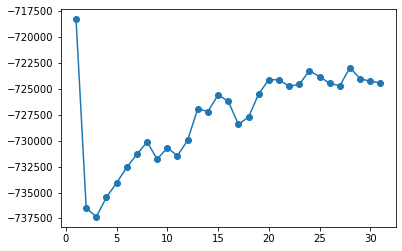

In [24]:
x = list(range(1, iter + 2))
plt.plot(x, log_l[1:(iter+2)], marker='o', linestyle='-')
#plt.savefig('likelihood.png', bbox_inches='tight')